In [1]:
import numpy as np
import agama
import h5py
import matplotlib.pyplot as plt
import sys
sys.path.append('/suphys/aani0116/Work/minicluster_tidal/Tidal_stream')
sys.path.append('/suphys/aani0116/Work/minicluster_tidal/stellar')
sys.path.append('/suphys/aani0116/Work/minicluster_tidal/my_modules')
from mc_declare import *
print('Test:pi=',np.pi)
from reverse_orbit import reverse_orbit
agama.setUnits(length=1, velocity=1, mass=1)  # kpc, km/s, Solar mass


pot_mw = agama.Potential('/suphys/aani0116/minicluster/minicluster_tidal/Agama/data/McMillan17.ini')




Test:pi= 3.141592653589793


In [14]:
mc = Minicluster(mass=1e-7, delta=10, concentration=10)
mcp_xv = np.load('/suphys/aani0116/Work/minicluster_tidal/hpc/tidal_timestep/mcp_xv100.npy')
mcp_mass=np.load('/suphys/aani0116/Work/minicluster_tidal/hpc/tidal_timestep/mcp_mass100.npy')
Nbody=len(mcp_xv)

pot_mc = agama.Potential(type='Multipole', particles=(mcp_xv[:, :3], mcp_mass), symmetry='n', rmin=0, rmax=0, gridSizeR=100, lmax=0)
mcp_xv_init = mcp_xv.copy()

solar_pos = np.array([8.0, 0.0, 0.0, 1, 1, 220.0]) 
N_orbit=1e-3

orbit_time = N_orbit*pot_mw.Tcirc(solar_pos)

mc_center=reverse_orbit(solar_pos, pot_mw,orbit_time,4, 10)
mc_center_start=mc_center.copy()

mcp_xv += mc_center 


Starting position: [ 7.9996533e+00 -2.0446684e-04 -4.4980958e-02  2.3884826e+00
  9.9998224e-01  2.1997072e+02]


In [19]:
F_mw=np.linalg.norm(pot_mw.eval(mcp_xv[:, :3], acc=1, der=0), axis=1)

In [17]:
F_mc=np.linalg.norm(pot_mc.eval(mcp_xv_init[:, :3], acc=1, der=0), axis=1)

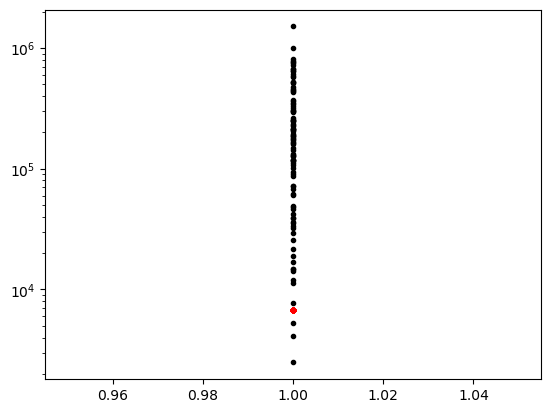

In [24]:
plt.plot(np.ones_like(F_mw),F_mw,'r.',label='MW')
plt.plot(np.ones_like(F_mc),F_mc,'k.',label='MC')
plt.yscale('log')

In [43]:
r=np.logspace(-12,0,100)
R=np.array([r,np.zeros_like(r),np.zeros_like(r)]).T

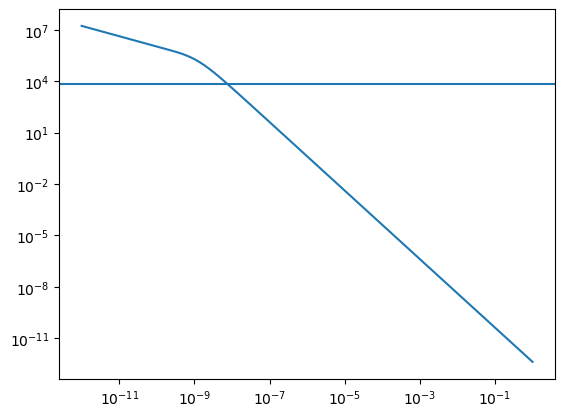

In [51]:
F=pot_mc.force(R)
plt.loglog(r,np.linalg.norm(F,axis=1))
plt.axhline(y=np.linalg.norm(pot_mw.force([8,0,0]),axis=0))

In [70]:
mc = Minicluster(mass=1e-7, delta=10, concentration=10)
mcp_xv = np.load('/suphys/aani0116/Work/minicluster_tidal/hpc/tidal_timestep/mcp_xv100.npy')
mcp_mass=np.load('/suphys/aani0116/Work/minicluster_tidal/hpc/tidal_timestep/mcp_mass100.npy')
Nbody=len(mcp_xv)

pot_mc = agama.Potential(type='Multipole', particles=(mcp_xv[:, :3], mcp_mass), symmetry='n', rmin=0, rmax=0, gridSizeR=100, lmax=0)


solar_pos = np.array([8.0, 0.0, 0.0, 1, 1, 220.0]) 
N_orbit=1e-3

orbit_time = N_orbit*pot_mw.Tcirc(solar_pos)

mc_center=reverse_orbit(solar_pos, pot_mw,orbit_time,4, 10)
mc_center_start=mc_center.copy()

mcp_xv += mc_center 

#simulation parameters
simulation_time = orbit_time
tupd = 1e-8 # Gyr
time_i = 0

#stuff for saving data
n_snapshots = 10
snapshot_interval = max(1, int(simulation_time / tupd / n_snapshots))
step = 0
mcp_xv_snapshots=[]
bound_snapshots, E_p_snapshots, mc_xv_snapshots, snap_times = [], [], [], []
n_bound_arr = []


print(tupd,orbit_time)

while time_i < simulation_time:

    mc_time_center, mc_orbit_center = agama.orbit(ic=mc_center, potential=pot_mw, time=tupd,timestart=time_i, trajsize=10, accuracy=1e-10,dtype=float)

    pot_total = agama.Potential(pot_mw,agama.Potential(potential=pot_mc,center=np.column_stack((mc_time_center, mc_orbit_center))))

    mcp_xv = np.vstack(agama.orbit(ic=mcp_xv, potential=pot_total,time=tupd, timestart=time_i, trajsize=1, accuracy=1e-10,dtype=float)[:, 1])

    rel_pos = mcp_xv[:, :3] - mc_orbit_center[-1][:3]
    rel_vel = mcp_xv[:, 3:6] - mc_orbit_center[-1][3:6]
    rel_xv=mcp_xv-mc_orbit_center[-1]

    E_var=0.5*np.linalg.norm(rel_vel, axis=1)**2+pot_mc.potential(rel_pos)
    bound=E_var<0
    n_bound=np.sum(bound)
    n_bound_arr.append(n_bound)
    #print(f"Bound particles: {n_bound}/{Nbody}")
    if n_bound>32:
        #pot_mc=agama.Potential(type='Plummer',mass=sum(mcp_mass[bound]),scaleRadius=mc.radius_char)
        pot_mc = agama.Potential(type='NFW',mass=mc.mass_within_radius(5.4*mc.radius_char),scaleRadius=mc.radius_char,)
    if n_bound<=32:
        pot_mc=agama.Potential(type='Plummer', mass=0.0, scaleRadius=1.0)
        

    

    if step % snapshot_interval == 0:
        mcp_xv_snapshots.append(rel_xv.copy())
        bound_snapshots.append(bound.copy())
        E_p_snapshots.append(E_var.copy())
        mc_xv_snapshots.append(mc_orbit_center[-1].copy())
        snap_times.append(time_i)
        

    
    mc_center = mc_orbit_center[-1]
    time_i += tupd
    step += 1
    print(time_i/orbit_time)
    mcp_xv_snapshots.append(rel_xv.copy())
    bound_snapshots.append(bound.copy())
    E_p_snapshots.append(E_var.copy())
    mc_xv_snapshots.append(mc_orbit_center[-1].copy())
    snap_times.append(time_i)

Starting position: [ 7.9996533e+00 -2.0446684e-04 -4.4980958e-02  2.3884826e+00
  9.9998224e-01  2.1997072e+02]
1e-08 0.0002044680523612082
4.890739596978333e-05
9.781479193956665e-05
0.00014672218790935
0.0001956295838791333
0.00024453697984891664
0.00029344437581869996
0.00034235177178848324
0.00039125916775826656
0.0004401665637280499
0.0004890739596978332
0.0005379813556676165
0.0005868887516373999
0.0006357961476071833
0.0006847035435769667
0.0007336109395467501
0.0007825183355165333
0.0008314257314863167
0.0008803331274561001
0.0009292405234258835
0.000978147919395667
0.0010270553153654504
0.0010759627113352337
0.0011248701073050171
0.0011737775032748003
0.0012226848992445837
0.001271592295214367
0.0013204996911841504
0.0013694070871539338
0.0014183144831237172
0.0014672218790935006
0.001516129275063284
0.0015650366710330673
0.0016139440670028507
0.001662851462972634
0.0017117588589424175
0.0017606662549122009
0.0018095736508819842
0.0018584810468517676
0.001907388442821551
0.001

100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orb

0.0034235177178848354
0.0034724251138546188
0.003521332509824402
0.0035702399057941855
0.003619147301763969
0.0036680546977337523
0.0037169620937035357
0.003765869489673319
0.0038147768856431024
0.003863684281612886
0.003912591677582669
0.003961499073552453
0.0040104064695222355
0.004059313865492019
0.004108221261461802
0.004157128657431586
0.004206036053401369
0.004254943449371153
0.004303850845340936
0.00435275824131072
0.004401665637280503
0.004450573033250286
0.004499480429220069
0.004548387825189853
0.004597295221159636
0.00464620261712942
0.004695110013099203
0.004744017409068986
0.004792924805038769
0.004841832201008552
0.004890739596978335
0.004939646992948118
0.004988554388917901
0.0050374617848876835
0.0050863691808574665
0.0051352765768272485
0.0051841839727970315
0.0052330913687668144
0.005281998764736597
0.00533090616070638
0.005379813556676163
0.005428720952645946
0.005477628348615729
0.005526535744585512
0.005575443140555295
0.005624350536525077
0.00567325793249486
0.005

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits

0.006798128039799866
0.006847035435769649
0.006895942831739432
0.006944850227709215
0.006993757623678998
0.007042665019648781
0.007091572415618563
0.007140479811588346
0.007189387207558129
0.007238294603527912
0.007287201999497695
0.007336109395467478
0.007385016791437261
0.007433924187407044
0.0074828315833768266
0.0075317389793466095
0.007580646375316392
0.0076295537712861745
0.0076784611672559575
0.0077273685632257404
0.007776275959195523
0.007825183355165306
0.007874090751135088
0.007922998147104872
0.007971905543074654
0.008020812939044438
0.00806972033501422
0.008118627730984004
0.008167535126953786
0.00821644252292357
0.008265349918893352
0.008314257314863134
0.008363164710832918
0.0084120721068027
0.008460979502772484
0.008509886898742266
0.00855879429471205
0.008607701690681832
0.008656609086651616
0.008705516482621398
0.00875442387859118
0.008803331274560964
0.008852238670530746
0.00890114606650053
0.008950053462470312
0.008998960858440095
0.009047868254409877
0.0090967756503

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orb

0.010172738361714884
0.010221645757684668
0.01027055315365445
0.010319460549624232
0.010368367945594016
0.010417275341563798
0.010466182737533582
0.010515090133503364
0.010563997529473148
0.01061290492544293
0.010661812321412714
0.010710719717382496
0.01075962711335228
0.010808534509322062
0.010857441905291844
0.010906349301261628
0.01095525669723141
0.011004164093201194
0.011053071489170976
0.01110197888514076
0.011150886281110542
0.011199793677080325
0.011248701073050107
0.01129760846901989
0.011346515864989673
0.011395423260959455
0.01144433065692924
0.011493238052899021
0.011542145448868805
0.011591052844838587
0.011639960240808371
0.011688867636778153
0.011737775032747935
0.011786682428717719
0.011835589824687501
0.011884497220657285
0.011933404616627067
0.01198231201259685
0.012031219408566633
0.012080126804536417
0.012129034200506199
0.012177941596475983
0.012226848992445765
0.012275756388415547
0.01232466378438533
0.012373571180355113
0.012422478576324896
0.012471385972294679
0

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/

0.013596256079599685
0.013645163475569468
0.01369407087153925
0.013742978267509033
0.013791885663478816
0.0138407930594486
0.013889700455418381
0.013938607851388165
0.013987515247357947
0.014036422643327731
0.014085330039297513
0.014134237435267297
0.014183144831237079
0.014232052227206861
0.014280959623176645
0.014329867019146427
0.014378774415116211
0.014427681811085993
0.014476589207055777
0.014525496603025559
0.014574403998995343
0.014623311394965125
0.014672218790934907
0.01472112618690469
0.014770033582874473
0.014818940978844257
0.014867848374814039
0.014916755770783822
0.014965663166753605
0.015014570562723388
0.01506347795869317
0.015112385354662953
0.015161292750632736
0.015210200146602518
0.015259107542572302
0.015308014938542084
0.015356922334511868
0.01540582973048165
0.015454737126451434
0.015503644522421216
0.015552551918391
0.015601459314360782
0.015650366710330564
0.015699274106300346
0.01574818150227013
0.015797088898239914
0.015845996294209696
0.015894903690179478
0.

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits

0.017019773797484487
0.01706868119345427
0.01711758858942405
0.017166495985393833
0.017215403381363615
0.0172643107773334
0.017313218173303183
0.017362125569272965
0.017411032965242747
0.017459940361212532
0.017508847757182314
0.017557755153152096
0.01760666254912188
0.01765556994509166
0.017704477341061446
0.017753384737031228
0.01780229213300101
0.017851199528970792
0.017900106924940578
0.01794901432091036
0.017997921716880142
0.018046829112849924
0.018095736508819706
0.018144643904789492
0.018193551300759274
0.018242458696729056
0.018291366092698838
0.018340273488668624
0.018389180884638406
0.018438088280608188
0.01848699567657797
0.018535903072547752
0.018584810468517537
0.01863371786448732
0.0186826252604571
0.018731532656426884
0.01878044005239667
0.01882934744836645
0.018878254844336233
0.018927162240306016
0.018976069636275798
0.019024977032245583
0.019073884428215365
0.019122791824185147
0.01917169922015493
0.019220606616124715
0.019269514012094497
0.01931842140806428
0.019367

100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orb

0.020541106307308852
0.020590013703278634
0.020638921099248416
0.020687828495218198
0.020736735891187984
0.020785643287157766
0.020834550683127548
0.02088345807909733
0.020932365475067112
0.020981272871036898
0.02103018026700668
0.021079087662976462
0.021127995058946244
0.02117690245491603
0.02122580985088581
0.021274717246855594
0.021323624642825376
0.02137253203879516
0.021421439434764943
0.021470346830734725
0.021519254226704507
0.02156816162267429
0.021617069018644075
0.021665976414613857
0.02171488381058364
0.02176379120655342
0.021812698602523207
0.02186160599849299
0.02191051339446277
0.021959420790432553
0.022008328186402335
0.02205723558237212
0.022106142978341903
0.022155050374311685
0.022203957770281467
0.022252865166251252
0.022301772562221035
0.022350679958190817
0.0223995873541606
0.02244849475013038
0.022497402146100166
0.02254630954206995
0.02259521693803973
0.022644124334009513
0.022693031729979298
0.02274193912594908
0.022790846521918862
0.022839753917888644
0.0228886

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/

0.02396462402519365
0.024013531421163435
0.024062438817133217
0.024111346213103
0.02416025360907278
0.024209161005042567
0.02425806840101235
0.02430697579698213
0.024355883192951913
0.024404790588921695
0.02445369798489148
0.024502605380861263
0.024551512776831045
0.024600420172800827
0.024649327568770613
0.024698234964740395
0.024747142360710177
0.02479604975667996
0.02484495715264974
0.024893864548619526
0.02494277194458931
0.02499167934055909
0.025040586736528873
0.025089494132498658
0.02513840152846844
0.025187308924438222
0.025236216320408004
0.025285123716377787
0.025334031112347572
0.025382938508317354
0.025431845904287136
0.02548075330025692
0.025529660696226704
0.025578568092196486
0.025627475488166268
0.02567638288413605
0.025725290280105832
0.025774197676075618
0.0258231050720454
0.025872012468015182
0.025920919863984964
0.02596982725995475
0.02601873465592453
0.026067642051894314
0.026116549447864096
0.02616545684383388
0.026214364239803663
0.026263271635773446
0.0263121790

100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 or

0.027437049139048233
0.02748595653501802
0.0275348639309878
0.027583771326957583
0.027632678722927365
0.027681586118897147
0.027730493514866932
0.027779400910836714
0.027828308306806496
0.02787721570277628
0.027926123098746064
0.027975030494715846
0.028023937890685628
0.02807284528665541
0.028121752682625196
0.028170660078594978
0.02821956747456476
0.028268474870534542
0.028317382266504324
0.02836628966247411
0.028415197058443892
0.028464104454413674
0.028513011850383456
0.02856191924635324
0.028610826642323024
0.028659734038292806
0.028708641434262588
0.02875754883023237
0.028806456226202155
0.028855363622171937
0.02890427101814172
0.0289531784141115
0.029002085810081287
0.02905099320605107
0.02909990060202085
0.029148807997990633
0.029197715393960415
0.0292466227899302
0.029295530185899983
0.029344437581869765
0.029393344977839547
0.029442252373809333
0.029491159769779115
0.029540067165748897
0.02958897456171868
0.02963788195768846
0.029686789353658247
0.02973569674962803
0.029784604

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits

0.030713844669023684
0.03076275206499347
0.030811659460963252
0.030860566856933034
0.030909474252902816
0.0309583816488726
0.031007289044842384
0.031056196440812166
0.031105103836781948
0.03115401123275173
0.031202918628721515
0.031251826024691294
0.03130073342066108
0.031349640816630865
0.031398548212600644
0.03144745560857043
0.031496363004540215
0.031545270400509993
0.03159417779647978
0.03164308519244956
0.03169199258841934
0.03174089998438913
0.03178980738035891
0.03183871477632869
0.03188762217229847
0.03193652956826826
0.03198543696423804
0.03203434436020782
0.03208325175617761
0.032132159152147385
0.03218106654811717
0.032229973944086956
0.032278881340056735
0.03232778873602652
0.032376696131996306
0.032425603527966085
0.03247451092393587
0.03252341831990565
0.032572325715875435
0.03262123311184522
0.032670140507815
0.032719047903784784
0.03276795529975456
0.03281686269572435
0.032865770091694134
0.03291467748766391
0.0329635848836337
0.03301249227960348
0.03306139967557326
0.0

100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbi

0.03403954759496892
0.0340884549909387
0.03413736238690849
0.03418626978287827
0.03423517717884805
0.03428408457481783
0.03433299197078762
0.0343818993667574
0.03443080676272718
0.03447971415869697
0.034528621554666745
0.03457752895063653
0.03462643634660632
0.034675343742576095
0.03472425113854588
0.034773158534515666
0.034822065930485445
0.03487097332645523
0.03491988072242501
0.034968788118394795
0.03501769551436458
0.03506660291033436
0.035115510306304144
0.03516441770227392
0.03521332509824371
0.035262232494213494
0.03531113989018327
0.03536004728615306
0.03540895468212284
0.03545786207809262
0.03550676947406241
0.035555676870032187
0.03560458426600197
0.03565349166197176
0.035702399057941536
0.03575130645391132
0.0358002138498811
0.035849121245850886
0.03589802864182067
0.03594693603779045
0.035995843433760236
0.036044750829730014
0.0360936582256998
0.036142565621669585
0.036191473017639364
0.03624038041360915
0.036289287809578935
0.036338195205548714
0.0363871026015185
0.0364360

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbi

0.03746306531285372
0.037511972708823504
0.03756088010479328
0.03760978750076307
0.037658694896732854
0.03770760229270263
0.03775650968867242
0.0378054170846422
0.03785432448061198
0.03790323187658177
0.03795213927255155
0.03800104666852133
0.03804995406449112
0.038098861460460896
0.03814776885643068
0.03819667625240046
0.038245583648370246
0.03829449104434003
0.03834339844030981
0.038392305836279596
0.038441213232249374
0.03849012062821916
0.038539028024188945
0.038587935420158724
0.03863684281612851
0.038685750212098295
0.038734657608068074
0.03878356500403786
0.03883247240000764
0.038881379795977423
0.03893028719194721
0.03897919458791699
0.03902810198388677
0.03907700937985655
0.03912591677582634
0.03917482417179612
0.0392237315677659
0.03927263896373569
0.039321546359705466
0.03937045375567525
0.03941936115164504
0.039468268547614815
0.0395171759435846
0.039566083339554386
0.039614990735524165
0.03966389813149395
0.03971280552746373
0.039761712923433515
0.0398106203194033
0.039859

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbi

0.04088658303073852
0.040935490426708306
0.040984397822678084
0.04103330521864787
0.041082212614617655
0.041131120010587434
0.04118002740655722
0.041228934802527
0.041277842198496784
0.04132674959446657
0.04137565699043635
0.04142456438640613
0.04147347178237591
0.0415223791783457
0.04157128657431548
0.04162019397028526
0.04166910136625505
0.041718008762224826
0.04176691615819461
0.0418158235541644
0.041864730950134176
0.04191363834610396
0.04196254574207375
0.042011453138043525
0.04206036053401331
0.04210926792998309
0.042158175325952875
0.04220708272192266
0.04225599011789244
0.042304897513862225
0.042353804909832
0.04240271230580179
0.042451619701771574
0.04250052709774135
0.04254943449371114
0.04259834188968092
0.0426472492856507
0.04269615668162049
0.04274506407759027
0.04279397147356005
0.04284287886952984
0.04289178626549962
0.0429406936614694
0.04298960105743918
0.043038508453408966
0.04308741584937875
0.04313632324534853
0.043185230641318316
0.043234138037288095
0.043283045433

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s

0.04431010074862332
0.04435900814459311
0.044407915540562885
0.04445682293653267
0.04450573033250245
0.044554637728472235
0.04460354512444202
0.0446524525204118
0.044701359916381585
0.04475026731235136
0.04479917470832115
0.044848082104290934
0.04489698950026071
0.0449458968962305
0.044994804292200284
0.04504371168817006
0.04509261908413985
0.04514152648010963
0.04519043387607941
0.0452393412720492
0.04528824866801898
0.04533715606398876
0.04538606345995854
0.045434970855928326
0.04548387825189811
0.04553278564786789
0.045581693043837676
0.045630600439807455
0.04567950783577724
0.045728415231747026
0.045777322627716804
0.04582623002368659
0.045875137419656375
0.045924044815626154
0.04597295221159594
0.04602185960756572
0.046070767003535504
0.04611967439950529
0.04616858179547507
0.046217489191444854
0.04626639658741463
0.04631530398338442
0.0463642113793542
0.04641311877532398
0.04646202617129377
0.046510933567263546
0.04655984096323333
0.04660874835920312
0.046657655755172896
0.046706

100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/

0.0477825258624779
0.047831433258447686
0.04788034065441747
0.04792924805038725
0.047978155446357036
0.048027062842326815
0.0480759702382966
0.048124877634266386
0.048173785030236164
0.04822269242620595
0.048271599822175736
0.048320507218145514
0.0483694146141153
0.04841832201008508
0.048467229406054864
0.04851613680202465
0.04856504419799443
0.048613951593964214
0.04866285898993399
0.04871176638590378
0.04876067378187356
0.04880958117784334
0.04885848857381313
0.048907395969782906
0.04895630336575269
0.04900521076172248
0.049054118157692256
0.04910302555366204
0.04915193294963183
0.049200840345601606
0.04924974774157139
0.04929865513754117
0.049347562533510955
0.04939646992948074
0.04944537732545052
0.049494284721420305
0.049543192117390084
0.04959209951335987
0.049641006909329655
0.04968991430529943
0.04973882170126922
0.049787729097239004
0.04983663649320878
0.04988554388917857
0.04993445128514835
0.04998335868111813
0.05003226607708792
0.0500811734730577
0.05013008086902748
0.05017

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbi

0.05115713618439292
0.0512060435803627
0.05125495097633249
0.051303858372302266
0.05135276576827205
0.05140167316424184
0.051450580560211616
0.0514994879561814
0.05154839535215119
0.051597302748120966
0.05164621014409075
0.05169511754006053
0.051744024936030315
0.0517929323320001
0.05184183972796988
0.051890747123939665
0.051939654519909444
0.05198856191587923
0.052037469311849015
0.05208637670781879
0.05213528410378858
0.052184191499758364
0.05223309889572814
0.05228200629169793
0.05233091368766771
0.05237982108363749
0.05242872847960728
0.05247763587557706
0.05252654327154684
0.05257545066751662
0.05262435806348641
0.05267326545945619
0.05272217285542597
0.052771080251395756
0.052819987647365535
0.05286889504333532
0.052917802439305106
0.052966709835274885
0.05301561723124467
0.053064524627214456
0.053113432023184234
0.05316233941915402
0.0532112468151238
0.053260154211093584
0.05330906160706337
0.05335796900303315
0.053406876399002934
0.05345578379497271
0.0535046911909425
0.0535535

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orb

0.05448283911033815
0.05453174650630794
0.054580653902277725
0.0546295612982475
0.05467846869421729
0.05472737609018707
0.05477628348615685
0.05482519088212664
0.05487409827809642
0.0549230056740662
0.05497191307003598
0.05502082046600577
0.05506972786197555
0.05511863525794533
0.055167542653915116
0.055216450049884895
0.05526535744585468
0.055314264841824466
0.055363172237794245
0.05541207963376403
0.055460987029733816
0.055509894425703595
0.05555880182167338
0.05560770921764316
0.055656616613612944
0.05570552400958273
0.05575443140555251
0.055803338801522294
0.05585224619749207
0.05590115359346186
0.055950060989431644
0.05599896838540142
0.05604787578137121
0.05609678317734099
0.05614569057331077
0.05619459796928056
0.056243505365250336
0.05629241276122012
0.05634132015718991
0.056390227553159686
0.05643913494912947
0.05648804234509925
0.056536949741069036
0.05658585713703882
0.0566347645330086
0.056683671928978385
0.056732579324948164
0.05678148672091795
0.056830394116887735
0.05687

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s

0.057906356828222955
0.05795526422419274
0.05800417162016252
0.058053079016132304
0.05810198641210209
0.05815089380807187
0.058199801204041654
0.05824870860001143
0.05829761599598122
0.058346523391951004
0.05839543078792078
0.05844433818389057
0.05849324557986035
0.05854215297583013
0.05859106037179992
0.058639967767769696
0.05868887516373948
0.05873778255970927
0.058786689955679046
0.05883559735164883
0.05888450474761861
0.058933412143588396
0.05898231953955818
0.05903122693552796
0.059080134331497745
0.059129041727467524
0.05917794912343731
0.059226856519407095
0.059275763915376874
0.05932467131134666
0.059373578707316445
0.05942248610328622
0.05947139349925601
0.05952030089522579
0.05956920829119557
0.05961811568716536
0.05966702308313514
0.05971593047910492
0.0597648378750747
0.05981374527104449
0.05986265266701427
0.05991156006298405
0.05996046745895384
0.060009374854923615
0.0600582822508934
0.060107189646863186
0.060156097042832965
0.06020500443880275
0.060253911834772536
0.0603

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbit

0.061329874546107756
0.06137878194207754
0.06142768933804732
0.061476596734017105
0.061525504129986884
0.06157441152595667
0.061623318921926455
0.061672226317896234
0.06172113371386602
0.061770041109835805
0.061818948505805583
0.06186785590177537
0.06191676329774515
0.06196567069371493
0.06201457808968472
0.0620634854856545
0.06211239288162428
0.06216130027759406
0.06221020767356385
0.06225911506953363
0.06230802246550341
0.0623569298614732
0.062405837257442975
0.06245474465341276
0.06250365204938255
0.06255255944535233
0.0626014668413221
0.06265037423729189
0.06269928163326167
0.06274818902923146
0.06279709642520125
0.06284600382117103
0.0628949112171408
0.06294381861311059
0.06299272600908037
0.06304163340505016
0.06309054080101995
0.06313944819698972
0.0631883555929595
0.06323726298892929
0.06328617038489907
0.06333507778086886
0.06338398517683863
0.06343289257280842
0.0634817999687782
0.06353070736474799
0.06357961476071777
0.06362852215668754
0.06367742955265733
0.0637263369486271

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits

0.06480229965996234
0.06485120705593213
0.0649001144519019
0.06494902184787169
0.06499792924384147
0.06504683663981126
0.06509574403578104
0.06514465143175081
0.0651935588277206
0.06524246622369038
0.06529137361966017
0.06534028101562996
0.06538918841159973
0.06543809580756951
0.0654870032035393
0.06553591059950908
0.06558481799547887
0.06563372539144864
0.06568263278741843
0.06573154018338821
0.065780447579358
0.06582935497532778
0.06587826237129756
0.06592716976726734
0.06597607716323713
0.06602498455920691
0.0660738919551767
0.06612279935114648
0.06617170674711625
0.06622061414308604
0.06626952153905583
0.06631842893502561
0.0663673363309954
0.06641624372696517
0.06646515112293495
0.06651405851890474
0.06656296591487453
0.06661187331084431
0.06666078070681408
0.06670968810278387
0.06675859549875365
0.06680750289472344
0.06685641029069322
0.066905317686663
0.06695422508263278
0.06700313247860257
0.06705203987457235
0.06710094727054214
0.06714985466651191
0.0671987620624817
0.06724766

100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 o

0.06822581737784714
0.06827472477381692
0.06832363216978671
0.0683725395657565
0.06842144696172626
0.06847035435769605
0.06851926175366584
0.06856816914963562
0.06861707654560541
0.06866598394157518
0.06871489133754496
0.06876379873351475
0.06881270612948454
0.06886161352545432
0.06891052092142409
0.06895942831739388
0.06900833571336366
0.06905724310933345
0.06910615050530323
0.069155057901273
0.06920396529724279
0.06925287269321258
0.06930178008918236
0.06935068748515215
0.06939959488112193
0.0694485022770917
0.06949740967306149
0.06954631706903128
0.06959522446500106
0.06964413186097085
0.06969303925694062
0.0697419466529104
0.06979085404888019
0.06983976144484998
0.06988866884081976
0.06993757623678953
0.06998648363275932
0.0700353910287291
0.07008429842469889
0.07013320582066868
0.07018211321663845
0.07023102061260823
0.07027992800857802
0.0703288354045478
0.07037774280051759
0.07042665019648736
0.07047555759245715
0.07052446498842693
0.07057337238439672
0.0706222797803665
0.070671

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orb

0.07155152030379237
0.07160042769976216
0.07164933509573194
0.07169824249170172
0.0717471498876715
0.07179605728364129
0.07184496467961107
0.07189387207558086
0.07194277947155063
0.07199168686752042
0.0720405942634902
0.07208950165945999
0.07213840905542977
0.07218731645139954
0.07223622384736933
0.07228513124333912
0.0723340386393089
0.07238294603527869
0.07243185343124847
0.07248076082721824
0.07252966822318803
0.07257857561915781
0.0726274830151276
0.07267639041109739
0.07272529780706716
0.07277420520303694
0.07282311259900673
0.07287201999497651
0.0729209273909463
0.07296983478691607
0.07301874218288586
0.07306764957885564
0.07311655697482543
0.07316546437079521
0.07321437176676499
0.07326327916273477
0.07331218655870456
0.07336109395467434
0.07341000135064413
0.0734589087466139
0.07350781614258368
0.07355672353855347
0.07360563093452326
0.07365453833049304
0.07370344572646281
0.0737523531224326
0.07380126051840238
0.07385016791437217
0.07389907531034196
0.07394798270631174
0.07399

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbit

0.07492613062570744
0.07497503802167724
0.07502394541764702
0.07507285281361681
0.07512176020958661
0.0751706676055564
0.07521957500152619
0.07526848239749598
0.07531738979346576
0.07536629718943556
0.07541520458540535
0.07546411198137515
0.07551301937734493
0.07556192677331472
0.07561083416928452
0.0756597415652543
0.0757086489612241
0.07575755635719389
0.07580646375316367
0.07585537114913347
0.07590427854510326
0.07595318594107306
0.07600209333704284
0.07605100073301263
0.07609990812898243
0.07614881552495222
0.07619772292092201
0.0762466303168918
0.07629553771286159
0.07634444510883139
0.07639335250480117
0.07644225990077097
0.07649116729674076
0.07654007469271056
0.07658898208868034
0.07663788948465013
0.07668679688061993
0.07673570427658971
0.07678461167255951
0.0768335190685293
0.07688242646449908
0.07693133386046888
0.07698024125643867
0.07702914865240847
0.07707805604837825
0.07712696344434804
0.07717587084031784
0.07722477823628762
0.07727368563225742
0.07732259302822721
0.077

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (5882 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits

0.07834964834359281
0.07839855573956261
0.0784474631355324
0.0784963705315022
0.07854527792747198
0.07859418532344177
0.07864309271941157
0.07869200011538136
0.07874090751135115
0.07878981490732094
0.07883872230329073
0.07888762969926053
0.07893653709523031
0.07898544449120011
0.0790343518871699
0.07908325928313968
0.07913216667910948
0.07918107407507927
0.07922998147104907
0.07927888886701885
0.07932779626298864
0.07937670365895844
0.07942561105492822
0.07947451845089802
0.0795234258468678
0.0795723332428376
0.07962124063880739
0.07967014803477718
0.07971905543074698
0.07976796282671676
0.07981687022268656
0.07986577761865635
0.07991468501462613
0.07996359241059593
0.08001249980656572
0.08006140720253552
0.0801103145985053
0.08015922199447509
0.08020812939044489
0.08025703678641467
0.08030594418238447
0.08035485157835426
0.08040375897432404
0.08045266637029384
0.08050157376626363
0.08055048116223343
0.08059938855820321
0.080648295954173
0.0806972033501428
0.08074611074611258
0.0807950

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 

0.08157753647759904
0.08162644387356882
0.08167535126953862
0.0817242586655084
0.0817731660614782
0.08182207345744799
0.08187098085341778
0.08191988824938758
0.08196879564535736
0.08201770304132716
0.08206661043729695
0.08211551783326673
0.08216442522923653
0.08221333262520632
0.08226224002117612
0.0823111474171459
0.08236005481311569
0.08240896220908549
0.08245786960505527
0.08250677700102507
0.08255568439699486
0.08260459179296466
0.08265349918893444
0.08270240658490423
0.08275131398087403
0.08280022137684381
0.08284912877281361
0.0828980361687834
0.08294694356475318
0.08299585096072298
0.08304475835669277
0.08309366575266257
0.08314257314863235
0.08319148054460214
0.08324038794057194
0.08328929533654172
0.08333820273251152
0.08338711012848131
0.0834360175244511
0.0834849249204209
0.08353383231639068
0.08358273971236048
0.08363164710833026
0.08368055450430005
0.08372946190026985
0.08377836929623964
0.08382727669220943
0.08387618408817922
0.083925091484149
0.0839739988801188
0.0840229

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbit

0.08504996159145421
0.085098868987424
0.08514777638339378
0.08519668377936358
0.08524559117533337
0.08529449857130317
0.08534340596727295
0.08539231336324274
0.08544122075921254
0.08549012815518232
0.08553903555115212
0.08558794294712191
0.08563685034309171
0.0856857577390615
0.08573466513503128
0.08578357253100108
0.08583247992697086
0.08588138732294066
0.08593029471891045
0.08597920211488023
0.08602810951085003
0.08607701690681982
0.08612592430278962
0.0861748316987594
0.08622373909472919
0.08627264649069899
0.08632155388666878
0.08637046128263857
0.08641936867860836
0.08646827607457815
0.08651718347054795
0.08656609086651773
0.08661499826248753
0.08666390565845732
0.0867128130544271
0.0867617204503969
0.08681062784636669
0.08685953524233649
0.08690844263830627
0.08695735003427606
0.08700625743024586
0.08705516482621564
0.08710407222218544
0.08715297961815523
0.08720188701412501
0.08725079441009481
0.0872997018060646
0.0873486092020344
0.08739751659800418
0.08744642399397397
0.087495

100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbit

0.08847347930933959
0.08852238670530937
0.08857129410127917
0.08862020149724896
0.08866910889321875
0.08871801628918854
0.08876692368515833
0.08881583108112813
0.08886473847709792
0.08891364587306771
0.0889625532690375
0.08901146066500729
0.08906036806097709
0.08910927545694687
0.08915818285291667
0.08920709024888646
0.08925599764485624
0.08930490504082604
0.08935381243679583
0.08940271983276563
0.08945162722873541
0.0895005346247052
0.089549442020675
0.08959834941664478
0.08964725681261458
0.08969616420858437
0.08974507160455415
0.08979397900052395
0.08984288639649374
0.08989179379246354
0.08994070118843332
0.08998960858440311
0.09003851598037291
0.09008742337634269
0.09013633077231249
0.09018523816828228
0.09023414556425206
0.09028305296022186
0.09033196035619165
0.09038086775216145
0.09042977514813123
0.09047868254410102
0.09052758994007082
0.0905764973360406
0.0906254047320104
0.09067431212798019
0.09072321952394997
0.09077212691991977
0.09082103431588956
0.09086994171185936
0.0909

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbi

0.09184808963125518
0.09189699702722497
0.09194590442319477
0.09199481181916455
0.09204371921513434
0.09209262661110414
0.09214153400707392
0.09219044140304372
0.0922393487990135
0.09228825619498329
0.09233716359095309
0.09238607098692288
0.09243497838289268
0.09248388577886246
0.09253279317483225
0.09258170057080205
0.09263060796677183
0.09267951536274163
0.09272842275871142
0.0927773301546812
0.092826237550651
0.09287514494662079
0.09292405234259059
0.09297295973856037
0.09302186713453016
0.09307077453049996
0.09311968192646974
0.09316858932243954
0.09321749671840933
0.09326640411437911
0.09331531151034891
0.0933642189063187
0.0934131263022885
0.09346203369825828
0.09351094109422807
0.09355984849019787
0.09360875588616765
0.09365766328213745
0.09370657067810724
0.09375547807407703
0.09380438547004682
0.09385329286601661
0.09390220026198641
0.0939511076579562
0.09400001505392598
0.09404892244989578
0.09409782984586557
0.09414673724183537
0.09419564463780515
0.09424455203377494
0.09429

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/

0.09532051474511034
0.09536942214108014
0.09541832953704993
0.09546723693301973
0.09551614432898951
0.0955650517249593
0.0956139591209291
0.09566286651689888
0.09571177391286868
0.09576068130883847
0.09580958870480825
0.09585849610077805
0.09590740349674784
0.09595631089271764
0.09600521828868742
0.09605412568465721
0.09610303308062701
0.0961519404765968
0.0962008478725666
0.09624975526853638
0.09629866266450617
0.09634757006047596
0.09639647745644575
0.09644538485241555
0.09649429224838534
0.09654319964435512
0.09659210704032492
0.0966410144362947
0.0966899218322645
0.09673882922823429
0.09678773662420408
0.09683664402017388
0.09688555141614366
0.09693445881211346
0.09698336620808325
0.09703227360405303
0.09708118100002283
0.09713008839599262
0.09717899579196242
0.0972279031879322
0.09727681058390199
0.09732571797987179
0.09737462537584157
0.09742353277181137
0.09747244016778116
0.09752134756375094
0.09757025495972074
0.09761916235569053
0.09766806975166033
0.09771697714763011
0.09776

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s

0.09830386589926761
0.0983527732952374
0.0984016806912072
0.09845058808717698
0.09849949548314678
0.09854840287911656
0.09859731027508635
0.09864621767105615
0.09869512506702594
0.09874403246299573
0.09879293985896552
0.0988418472549353
0.0988907546509051
0.09893966204687489
0.09898856944284469
0.09903747683881448
0.09908638423478426
0.09913529163075406
0.09918419902672385
0.09923310642269365
0.09928201381866343
0.09933092121463322
0.09937982861060302
0.0994287360065728
0.0994776434025426
0.09952655079851239
0.09957545819448217
0.09962436559045197
0.09967327298642176
0.09972218038239156
0.09977108777836134
0.09981999517433113
0.09986890257030093
0.09991780996627071
0.09996671736224051
0.1000156247582103
0.10006453215418008
0.10011343955014988
0.10016234694611967
0.10021125434208947
0.10026016173805925
0.10030906913402904
0.10035797652999884
0.10040688392596862
0.10045579132193842
0.10050469871790821
0.100553606113878
0.1006025135098478
0.10065142090581758
0.10070032830178738
0.10074923

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits

0.10172738361715299
0.10177629101312279
0.10182519840909257
0.10187410580506236
0.10192301320103216
0.10197192059700194
0.10202082799297174
0.10206973538894153
0.10211864278491131
0.10216755018088111
0.1022164575768509
0.1022653649728207
0.10231427236879048
0.10236317976476027
0.10241208716073007
0.10246099455669985
0.10250990195266965
0.10255880934863944
0.10260771674460922
0.10265662414057902
0.10270553153654881
0.10275443893251861
0.10280334632848839
0.10285225372445818
0.10290116112042798
0.10295006851639776
0.10299897591236756
0.10304788330833735
0.10309679070430713
0.10314569810027693
0.10319460549624672
0.10324351289221652
0.1032924202881863
0.10334132768415609
0.10339023508012589
0.10343914247609567
0.10348804987206547
0.10353695726803526
0.10358586466400505
0.10363477205997484
0.10368367945594463
0.10373258685191443
0.10378149424788422
0.103830401643854
0.1038793090398238
0.10392821643579359
0.10397712383176339
0.10402603122773317
0.10407493862370296
0.10412384601967276
0.1041

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbit

0.10515090133503836
0.10519980873100816
0.10524871612697795
0.10529762352294775
0.10534653091891753
0.10539543831488732
0.10544434571085712
0.1054932531068269
0.1055421605027967
0.10559106789876649
0.10563997529473627
0.10568888269070607
0.10573779008667586
0.10578669748264566
0.10583560487861544
0.10588451227458523
0.10593341967055503
0.10598232706652481
0.10603123446249461
0.1060801418584644
0.10612904925443419
0.10617795665040398
0.10622686404637377
0.10627577144234357
0.10632467883831336
0.10637358623428314
0.10642249363025294
0.10647140102622273
0.10652030842219253
0.10656921581816231
0.1066181232141321
0.1066670306101019
0.10671593800607168
0.10676484540204148
0.10681375279801127
0.10686266019398105
0.10691156758995085
0.10696047498592064
0.10700938238189044
0.10705828977786022
0.10710719717383001
0.1071561045697998
0.10720501196576959
0.10725391936173939
0.10730282675770918
0.10735173415367898
0.10740064154964876
0.10744954894561855
0.10749845634158835
0.10754736373755813
0.1075

100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits

0.10857441905292375
0.10862332644889354
0.10867223384486333
0.10872114124083312
0.10877004863680291
0.10881895603277271
0.1088678634287425
0.10891677082471228
0.10896567822068208
0.10901458561665187
0.10906349301262167
0.10911240040859145
0.10916130780456124
0.10921021520053104
0.10925912259650082
0.10930802999247062
0.1093569373884404
0.10940584478441019
0.10945475218037999
0.10950365957634978
0.10955256697231958
0.10960147436828936
0.10965038176425915
0.10969928916022895
0.10974819655619873
0.10979710395216853
0.10984601134813832
0.1098949187441081
0.1099438261400779
0.10999273353604769
0.11004164093201749
0.11009054832798727
0.11013945572395706
0.11018836311992686
0.11023727051589664
0.11028617791186644
0.11033508530783623
0.11038399270380603
0.11043290009977581
0.1104818074957456
0.1105307148917154
0.11057962228768518
0.11062852968365498
0.11067743707962477
0.11072634447559455
0.11077525187156435
0.11082415926753414
0.11087306666350394
0.11092197405947372
0.11097088145544351
0.1110

100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbit

0.11194902937483933
0.11199793677080913
0.11204684416677892
0.11209575156274872
0.1121446589587185
0.11219356635468829
0.11224247375065809
0.11229138114662787
0.11234028854259767
0.11238919593856746
0.11243810333453724
0.11248701073050704
0.11253591812647683
0.11258482552244663
0.11263373291841641
0.1126826403143862
0.112731547710356
0.11278045510632578
0.11282936250229558
0.11287826989826537
0.11292717729423515
0.11297608469020495
0.11302499208617474
0.11307389948214454
0.11312280687811432
0.11317171427408411
0.11322062167005391
0.1132695290660237
0.1133184364619935
0.11336734385796328
0.11341625125393308
0.11346515864990286
0.11351406604587265
0.11356297344184245
0.11361188083781223
0.11366078823378203
0.11370969562975182
0.1137586030257216
0.1138075104216914
0.11385641781766119
0.11390532521363099
0.11395423260960078
0.11400314000557056
0.11405204740154036
0.11410095479751015
0.11414986219347995
0.11419876958944973
0.11424767698541952
0.11429658438138932
0.1143454917773591
0.1143943

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 or

0.11542145448869451
0.1154703618846643
0.1155192692806341
0.11556817667660388
0.11561708407257368
0.11566599146854346
0.11571489886451325
0.11576380626048305
0.11581271365645283
0.11586162105242263
0.11591052844839242
0.1159594358443622
0.116008343240332
0.11605725063630179
0.11610615803227159
0.11615506542824137
0.11620397282421116
0.11625288022018096
0.11630178761615075
0.11635069501212054
0.11639960240809033
0.11644850980406013
0.11649741720002992
0.1165463245959997
0.1165952319919695
0.11664413938793929
0.11669304678390909
0.11674195417987887
0.11679086157584866
0.11683976897181846
0.11688867636778824
0.11693758376375804
0.11698649115972783
0.11703539855569761
0.11708430595166741
0.1171332133476372
0.117182120743607
0.11723102813957678
0.11727993553554657
0.11732884293151637
0.11737775032748615
0.11742665772345595
0.11747556511942574
0.11752447251539552
0.11757337991136532
0.11762228730733511
0.11767119470330491
0.11772010209927469
0.11776900949524448
0.11781791689121428
0.11786682

100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s

0.11889387960254968
0.11894278699851947
0.11899169439448926
0.11904060179045906
0.11908950918642884
0.11913841658239864
0.11918732397836843
0.11923623137433821
0.11928513877030801
0.1193340461662778
0.1193829535622476
0.11943186095821738
0.11948076835418717
0.11952967575015697
0.11957858314612675
0.11962749054209655
0.11967639793806634
0.11972530533403614
0.11977421273000592
0.11982312012597571
0.1198720275219455
0.11992093491791529
0.11996984231388509
0.12001874970985488
0.12006765710582466
0.12011656450179446
0.12016547189776425
0.12021437929373405
0.12026328668970383
0.12031219408567362
0.12036110148164342
0.1204100088776132
0.120458916273583
0.12050782366955279
0.12055673106552257
0.12060563846149237
0.12065454585746216
0.12070345325343196
0.12075236064940174
0.12080126804537153
0.12085017544134133
0.12089908283731111
0.12094799023328091
0.1209968976292507
0.12104580502522048
0.12109471242119028
0.12114361981716007
0.12119252721312987
0.12124143460909965
0.12129034200506944
0.12133

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbit

0.12236630471640485
0.12241521211237465
0.12246411950834443
0.12251302690431422
0.12256193430028402
0.1226108416962538
0.1226597490922236
0.12270865648819339
0.12275756388416319
0.12280647128013297
0.12285537867610276
0.12290428607207256
0.12295319346804234
0.12300210086401214
0.12305100825998193
0.12309991565595171
0.12314882305192151
0.1231977304478913
0.1232466378438611
0.12329554523983088
0.12334445263580067
0.12339336003177047
0.12344226742774025
0.12349117482371005
0.12354008221967984
0.12358898961564962
0.12363789701161942
0.12368680440758921
0.12373571180355901
0.1237846191995288
0.12383352659549858
0.12388243399146838
0.12393134138743817
0.12398024878340796
0.12402915617937775
0.12407806357534754
0.12412697097131734
0.12417587836728712
0.12422478576325692
0.1242736931592267
0.12432260055519649
0.12437150795116629
0.12442041534713608
0.12446932274310588
0.12451823013907566
0.12456713753504545
0.12461604493101525
0.12466495232698503
0.12471385972295483
0.12476276711892462
0.1248

100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbit

0.12578982243429024
0.12583872983026
0.1258876372262298
0.1259365446221996
0.1259854520181694
0.12603435941413918
0.12608326681010898
0.12613217420607878
0.12618108160204855
0.12622998899801835
0.12627889639398815
0.12632780378995792
0.12637671118592772
0.12642561858189752
0.12647452597786732
0.1265234333738371
0.1265723407698069
0.1266212481657767
0.12667015556174646
0.12671906295771626
0.12676797035368606
0.12681687774965583
0.12686578514562563
0.12691469254159543
0.12696359993756523
0.127012507333535
0.1270614147295048
0.1271103221254746
0.12715922952144437
0.12720813691741417
0.12725704431338397
0.12730595170935377
0.12735485910532354
0.12740376650129334
0.12745267389726314
0.1275015812932329
0.1275504886892027
0.1275993960851725
0.12764830348114228
0.12769721087711208
0.12774611827308188
0.12779502566905168
0.12784393306502145
0.12789284046099125
0.12794174785696105
0.12799065525293082
0.12803956264890062
0.12808847004487042
0.1281373774408402
0.12818628483681
0.1282351922327798
0

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits

0.12926224754814541
0.1293111549441152
0.12936006234008499
0.12940896973605479
0.12945787713202456
0.12950678452799436
0.12955569192396416
0.12960459931993393
0.12965350671590373
0.12970241411187353
0.12975132150784333
0.1298002289038131
0.1298491362997829
0.1298980436957527
0.12994695109172247
0.12999585848769227
0.13004476588366207
0.13009367327963184
0.13014258067560164
0.13019148807157144
0.13024039546754124
0.130289302863511
0.1303382102594808
0.1303871176554506
0.13043602505142038
0.13048493244739018
0.13053383984335998
0.13058274723932978
0.13063165463529955
0.13068056203126935
0.13072946942723915
0.13077837682320892
0.13082728421917872
0.13087619161514852
0.1309250990111183
0.1309740064070881
0.1310229138030579
0.1310718211990277
0.13112072859499746
0.13116963599096726
0.13121854338693706
0.13126745078290683
0.13131635817887663
0.13136526557484643
0.1314141729708162
0.131463080366786
0.1315119877627558
0.1315608951587256
0.13160980255469537
0.13165870995066517
0.131707617346634

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbit

0.13273467266200056
0.13278358005797036
0.13283248745394016
0.13288139484990993
0.13293030224587973
0.13297920964184953
0.13302811703781933
0.1330770244337891
0.1331259318297589
0.1331748392257287
0.13322374662169847
0.13327265401766827
0.13332156141363807
0.13337046880960787
0.13341937620557764
0.13346828360154744
0.13351719099751724
0.13356609839348701
0.13361500578945681
0.1336639131854266
0.13371282058139639
0.13376172797736618
0.13381063537333598
0.13385954276930578
0.13390845016527556
0.13395735756124535
0.13400626495721515
0.13405517235318493
0.13410407974915473
0.13415298714512452
0.1342018945410943
0.1342508019370641
0.1342997093330339
0.1343486167290037
0.13439752412497347
0.13444643152094327
0.13449533891691307
0.13454424631288284
0.13459315370885264
0.13464206110482244
0.1346909685007922
0.134739875896762
0.1347887832927318
0.1348376906887016
0.13488659808467138
0.13493550548064118
0.13498441287661098
0.13503332027258075
0.13508222766855055
0.13513113506452035
0.13518004246

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/

0.13601146819197657
0.13606037558794637
0.13610928298391617
0.13615819037988594
0.13620709777585574
0.13625600517182554
0.13630491256779534
0.1363538199637651
0.1364027273597349
0.1364516347557047
0.13650054215167448
0.13654944954764428
0.13659835694361408
0.13664726433958388
0.13669617173555365
0.13674507913152345
0.13679398652749325
0.13684289392346302
0.13689180131943282
0.13694070871540262
0.1369896161113724
0.1370385235073422
0.137087430903312
0.1371363382992818
0.13718524569525156
0.13723415309122136
0.13728306048719116
0.13733196788316093
0.13738087527913073
0.13742978267510053
0.1374786900710703
0.1375275974670401
0.1375765048630099
0.1376254122589797
0.13767431965494947
0.13772322705091927
0.13777213444688907
0.13782104184285884
0.13786994923882864
0.13791885663479844
0.13796776403076821
0.138016671426738
0.1380655788227078
0.1381144862186776
0.13816339361464738
0.13821230101061718
0.13826120840658698
0.13831011580255675
0.13835902319852655
0.13840793059449635
0.13845683799046

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orb

0.13933717111792238
0.13938607851389218
0.13943498590986195
0.13948389330583175
0.13953280070180155
0.13958170809777135
0.13963061549374112
0.13967952288971092
0.13972843028568072
0.1397773376816505
0.1398262450776203
0.1398751524735901
0.13992405986955989
0.13997296726552966
0.14002187466149946
0.14007078205746926
0.14011968945343903
0.14016859684940883
0.14021750424537863
0.1402664116413484
0.1403153190373182
0.140364226433288
0.1404131338292578
0.14046204122522757
0.14051094862119737
0.14055985601716717
0.14060876341313694
0.14065767080910674
0.14070657820507654
0.1407554856010463
0.1408043929970161
0.1408533003929859
0.1409022077889557
0.14095111518492548
0.14100002258089528
0.14104892997686508
0.14109783737283485
0.14114674476880465
0.14119565216477445
0.14124455956074422
0.14129346695671402
0.14134237435268382
0.14139128174865362
0.1414401891446234
0.1414890965405932
0.141538003936563
0.14158691133253276
0.14163581872850256
0.14168472612447236
0.14173363352044213
0.14178254091641

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits

0.14280959623177755
0.14285850362774735
0.14290741102371712
0.14295631841968692
0.14300522581565672
0.1430541332116265
0.1431030406075963
0.1431519480035661
0.1432008553995359
0.14324976279550566
0.14329867019147546
0.14334757758744526
0.14339648498341503
0.14344539237938483
0.14349429977535463
0.1435432071713244
0.1435921145672942
0.143641021963264
0.1436899293592338
0.14373883675520358
0.14378774415117337
0.14383665154714317
0.14388555894311295
0.14393446633908275
0.14398337373505254
0.14403228113102232
0.14408118852699212
0.14413009592296191
0.14417900331893171
0.14422791071490149
0.14427681811087129
0.14432572550684108
0.14437463290281086
0.14442354029878066
0.14447244769475046
0.14452135509072023
0.14457026248669003
0.14461916988265983
0.14466807727862963
0.1447169846745994
0.1447658920705692
0.144814799466539
0.14486370686250877
0.14491261425847857
0.14496152165444837
0.14501042905041814
0.14505933644638794
0.14510824384235774
0.14515715123832754
0.1452060586342973
0.145254966030

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbit

0.14618420655369313
0.14623311394966293
0.14628202134563273
0.1463309287416025
0.1463798361375723
0.1464287435335421
0.1464776509295119
0.14652655832548167
0.14657546572145147
0.14662437311742127
0.14667328051339104
0.14672218790936084
0.14677109530533064
0.1468200027013004
0.1468689100972702
0.14691781749324
0.1469667248892098
0.14701563228517958
0.14706453968114938
0.14711344707711918
0.14716235447308895
0.14721126186905875
0.14726016926502855
0.14730907666099832
0.14735798405696812
0.14740689145293792
0.14745579884890772
0.1475047062448775
0.1475536136408473
0.1476025210368171
0.14765142843278686
0.14770033582875666
0.14774924322472646
0.14779815062069623
0.14784705801666603
0.14789596541263583
0.14794487280860563
0.1479937802045754
0.1480426876005452
0.148091594996515
0.14814050239248477
0.14818940978845457
0.14823831718442437
0.14828722458039414
0.14833613197636394
0.14838503937233374
0.14843394676830354
0.14848285416427331
0.14853176156024311
0.1485806689562129
0.1486295763521826

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbi

0.14955881687560874
0.1496077242715785
0.1496566316675483
0.1497055390635181
0.1497544464594879
0.14980335385545768
0.14985226125142748
0.14990116864739728
0.14995007604336705
0.14999898343933685
0.15004789083530665
0.15009679823127642
0.15014570562724622
0.15019461302321602
0.15024352041918582
0.1502924278151556
0.1503413352111254
0.1503902426070952
0.15043915000306496
0.15048805739903476
0.15053696479500456
0.15058587219097433
0.15063477958694413
0.15068368698291393
0.15073259437888373
0.1507815017748535
0.1508304091708233
0.1508793165667931
0.15092822396276287
0.15097713135873267
0.15102603875470247
0.15107494615067224
0.15112385354664204
0.15117276094261184
0.15122166833858164
0.1512705757345514
0.1513194831305212
0.151368390526491
0.15141729792246078
0.15146620531843058
0.15151511271440038
0.15156402011037015
0.15161292750633995
0.15166183490230975
0.15171074229827955
0.15175964969424932
0.15180855709021912
0.15185746448618892
0.1519063718821587
0.1519552792781285
0.15200418667409

100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 or

0.1529334271975243
0.1529823345934941
0.1530312419894639
0.15308014938543368
0.15312905678140348
0.15317796417737328
0.15322687157334305
0.15327577896931285
0.15332468636528265
0.15337359376125242
0.15342250115722222
0.15347140855319202
0.15352031594916182
0.1535692233451316
0.1536181307411014
0.1536670381370712
0.15371594553304097
0.15376485292901076
0.15381376032498056
0.15386266772095034
0.15391157511692014
0.15396048251288993
0.15400938990885973
0.1540582973048295
0.1541072047007993
0.1541561120967691
0.15420501949273888
0.15425392688870868
0.15430283428467848
0.15435174168064825
0.15440064907661805
0.15444955647258785
0.15449846386855765
0.15454737126452742
0.15459627866049722
0.15464518605646702
0.1546940934524368
0.1547430008484066
0.15479190824437639
0.15484081564034616
0.15488972303631596
0.15493863043228576
0.15498753782825556
0.15503644522422533
0.15508535262019513
0.15513426001616493
0.1551831674121347
0.1552320748081045
0.1552809822040743
0.1553298896000441
0.1553787969960

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbi

0.1563569449154097
0.1564058523113795
0.1564547597073493
0.15650366710331906
0.15655257449928886
0.15660148189525866
0.15665038929122843
0.15669929668719823
0.15674820408316803
0.15679711147913783
0.1568460188751076
0.1568949262710774
0.1569438336670472
0.15699274106301697
0.15704164845898677
0.15709055585495657
0.15713946325092634
0.15718837064689614
0.15723727804286594
0.15728618543883574
0.1573350928348055
0.1573840002307753
0.1574329076267451
0.15748181502271488
0.15753072241868468
0.15757962981465448
0.15762853721062425
0.15767744460659405
0.15772635200256385
0.15777525939853365
0.15782416679450342
0.15787307419047322
0.15792198158644302
0.1579708889824128
0.1580197963783826
0.1580687037743524
0.1581176111703222
0.15816651856629196
0.15821542596226176
0.15826433335823156
0.15831324075420133
0.15836214815017113
0.15841105554614093
0.1584599629421107
0.1585088703380805
0.1585577777340503
0.1586066851300201
0.15865559252598987
0.15870449992195967
0.15875340731792947
0.158802314713899

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbi

0.1596826478413555
0.1597315552373253
0.15978046263329507
0.15982937002926487
0.15987827742523467
0.15992718482120444
0.15997609221717424
0.16002499961314404
0.16007390700911384
0.1601228144050836
0.1601717218010534
0.1602206291970232
0.16026953659299298
0.16031844398896278
0.16036735138493258
0.16041625878090235
0.16046516617687215
0.16051407357284195
0.16056298096881175
0.16061188836478152
0.16066079576075132
0.16070970315672112
0.1607586105526909
0.1608075179486607
0.1608564253446305
0.16090533274060026
0.16095424013657006
0.16100314753253986
0.16105205492850966
0.16110096232447943
0.16114986972044923
0.16119877711641903
0.1612476845123888
0.1612965919083586
0.1613454993043284
0.1613944067002982
0.16144331409626797
0.16149222149223777
0.16154112888820757
0.16159003628417734
0.16163894368014714
0.16168785107611694
0.1617367584720867
0.1617856658680565
0.1618345732640263
0.1618834806599961
0.16193238805596588
0.16198129545193568
0.16203020284790548
0.16207911024387525
0.16212801763984

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits

0.16281272118342213
0.16286162857939193
0.1629105359753617
0.1629594433713315
0.1630083507673013
0.16305725816327107
0.16310616555924087
0.16315507295521067
0.16320398035118044
0.16325288774715024
0.16330179514312004
0.16335070253908984
0.16339960993505961
0.1634485173310294
0.1634974247269992
0.16354633212296898
0.16359523951893878
0.16364414691490858
0.16369305431087836
0.16374196170684815
0.16379086910281795
0.16383977649878775
0.16388868389475753
0.16393759129072732
0.16398649868669712
0.1640354060826669
0.1640843134786367
0.1641332208746065
0.1641821282705763
0.16423103566654607
0.16427994306251587
0.16432885045848566
0.16437775785445544
0.16442666525042524
0.16447557264639504
0.1645244800423648
0.1645733874383346
0.1646222948343044
0.1646712022302742
0.16472010962624398
0.16476901702221378
0.16481792441818358
0.16486683181415335
0.16491573921012315
0.16496464660609295
0.16501355400206272
0.16506246139803252
0.16511136879400232
0.16516027618997212
0.1652091835859419
0.165258090981

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orb

0.1662362389013075
0.1662851462972773
0.16633405369324708
0.16638296108921688
0.16643186848518668
0.16648077588115645
0.16652968327712625
0.16657859067309605
0.16662749806906585
0.16667640546503562
0.16672531286100542
0.16677422025697522
0.166823127652945
0.1668720350489148
0.1669209424448846
0.16696984984085436
0.16701875723682416
0.16706766463279396
0.16711657202876376
0.16716547942473353
0.16721438682070333
0.16726329421667313
0.1673122016126429
0.1673611090086127
0.1674100164045825
0.1674589238005523
0.16750783119652207
0.16755673859249187
0.16760564598846167
0.16765455338443144
0.16770346078040124
0.16775236817637104
0.1678012755723408
0.1678501829683106
0.1678990903642804
0.1679479977602502
0.16799690515621998
0.16804581255218978
0.16809471994815958
0.16814362734412935
0.16819253474009915
0.16824144213606895
0.16829034953203872
0.16833925692800852
0.16838816432397832
0.16843707171994812
0.1684859791159179
0.1685348865118877
0.1685837939078575
0.16863270130382726
0.168681608699797

100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits

0.16956194182725332
0.1696108492232231
0.1696597566191929
0.16970866401516269
0.16975757141113246
0.16980647880710226
0.16985538620307206
0.16990429359904186
0.16995320099501163
0.17000210839098143
0.17005101578695123
0.170099923182921
0.1701488305788908
0.1701977379748606
0.17024664537083037
0.17029555276680017
0.17034446016276997
0.17039336755873977
0.17044227495470954
0.17049118235067934
0.17054008974664914
0.1705889971426189
0.1706379045385887
0.1706868119345585
0.1707357193305283
0.17078462672649808
0.17083353412246788
0.17088244151843768
0.17093134891440745
0.17098025631037725
0.17102916370634705
0.17107807110231682
0.17112697849828662
0.17117588589425642
0.17122479329022622
0.171273700686196
0.1713226080821658
0.1713715154781356
0.17142042287410536
0.17146933027007516
0.17151823766604496
0.17156714506201473
0.17161605245798453
0.17166495985395433
0.17171386724992413
0.1717627746458939
0.1718116820418637
0.1718605894378335
0.17190949683380327
0.17195840422977307
0.172007311625742

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbi

0.1729365521491689
0.1729854595451387
0.17303436694110846
0.17308327433707826
0.17313218173304806
0.17318108912901786
0.17322999652498763
0.17327890392095743
0.17332781131692723
0.173376718712897
0.1734256261088668
0.1734745335048366
0.1735234409008064
0.17357234829677617
0.17362125569274597
0.17367016308871577
0.17371907048468554
0.17376797788065534
0.17381688527662514
0.17386579267259492
0.17391470006856471
0.17396360746453451
0.1740125148605043
0.17406142225647409
0.17411032965244388
0.17415923704841368
0.17420814444438346
0.17425705184035326
0.17430595923632305
0.17435486663229283
0.17440377402826263
0.17445268142423243
0.17450158882020222
0.174550496216172
0.1745994036121418
0.1746483110081116
0.17469721840408137
0.17474612580005117
0.17479503319602097
0.17484394059199074
0.17489284798796054
0.17494175538393034
0.17499066277990014
0.1750395701758699
0.1750884775718397
0.1751373849678095
0.17518629236377928
0.17523519975974908
0.17528410715571888
0.17533301455168865
0.1753819219476

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbi

0.1762133476791449
0.1762622550751147
0.17631116247108447
0.17636006986705427
0.17640897726302407
0.17645788465899387
0.17650679205496364
0.17655569945093344
0.17660460684690324
0.176653514242873
0.1767024216388428
0.1767513290348126
0.1768002364307824
0.17684914382675218
0.17689805122272198
0.17694695861869178
0.17699586601466155
0.17704477341063135
0.17709368080660115
0.17714258820257092
0.17719149559854072
0.17724040299451052
0.17728931039048032
0.1773382177864501
0.1773871251824199
0.1774360325783897
0.17748493997435946
0.17753384737032926
0.17758275476629906
0.17763166216226883
0.17768056955823863
0.17772947695420843
0.17777838435017823
0.177827291746148
0.1778761991421178
0.1779251065380876
0.17797401393405737
0.17802292133002717
0.17807182872599697
0.17812073612196674
0.17816964351793654
0.17821855091390634
0.17826745830987614
0.17831636570584591
0.1783652731018157
0.1784141804977855
0.17846308789375528
0.17851199528972508
0.17856090268569488
0.17860981008166466
0.17865871747763

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbit

0.1795390506050907
0.1795879580010605
0.17963686539703028
0.17968577279300008
0.17973468018896988
0.17978358758493965
0.17983249498090945
0.17988140237687925
0.17993030977284902
0.17997921716881882
0.18002812456478862
0.18007703196075842
0.1801259393567282
0.180174846752698
0.1802237541486678
0.18027266154463756
0.18032156894060736
0.18037047633657716
0.18041938373254693
0.18046829112851673
0.18051719852448653
0.18056610592045633
0.1806150133164261
0.1806639207123959
0.1807128281083657
0.18076173550433547
0.18081064290030527
0.18085955029627507
0.18090845769224484
0.18095736508821464
0.18100627248418444
0.18105517988015424
0.181104087276124
0.1811529946720938
0.1812019020680636
0.18125080946403338
0.18129971686000318
0.18134862425597298
0.18139753165194275
0.18144643904791255
0.18149534644388235
0.18154425383985215
0.18159316123582192
0.18164206863179172
0.18169097602776152
0.1817398834237313
0.1817887908197011
0.1818376982156709
0.18188660561164066
0.18193551300761046
0.18198442040358

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s

0.1828647535310365
0.18291366092700628
0.18296256832297608
0.18301147571894588
0.18306038311491565
0.18310929051088545
0.18315819790685525
0.18320710530282502
0.18325601269879482
0.18330492009476462
0.18335382749073442
0.1834027348867042
0.183451642282674
0.1835005496786438
0.18354945707461356
0.18359836447058336
0.18364727186655316
0.18369617926252294
0.18374508665849273
0.18379399405446253
0.18384290145043233
0.1838918088464021
0.1839407162423719
0.1839896236383417
0.18403853103431148
0.18408743843028127
0.18413634582625107
0.18418525322222085
0.18423416061819065
0.18428306801416044
0.18433197541013024
0.18438088280610002
0.18442979020206982
0.18447869759803961
0.1845276049940094
0.18457651238997919
0.18462541978594899
0.18467432718191876
0.18472323457788856
0.18477214197385836
0.18482104936982816
0.18486995676579793
0.18491886416176773
0.18496777155773753
0.1850166789537073
0.1850655863496771
0.1851144937456469
0.18516340114161667
0.18521230853758647
0.18526121593355627
0.1853101233

100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orb

0.18638608604086146
0.18643499343683126
0.18648390083280103
0.18653280822877083
0.18658171562474063
0.18663062302071043
0.1866795304166802
0.18672843781265
0.1867773452086198
0.18682625260458957
0.18687516000055937
0.18692406739652917
0.18697297479249894
0.18702188218846874
0.18707078958443854
0.18711969698040834
0.1871686043763781
0.1872175117723479
0.1872664191683177
0.18731532656428748
0.18736423396025728
0.18741314135622708
0.18746204875219685
0.18751095614816665
0.18755986354413645
0.18760877094010625
0.18765767833607602
0.18770658573204582
0.18775549312801562
0.1878044005239854
0.1878533079199552
0.187902215315925
0.18795112271189476
0.18800003010786456
0.18804893750383436
0.18809784489980416
0.18814675229577393
0.18819565969174373
0.18824456708771353
0.1882934744836833
0.1883423818796531
0.1883912892756229
0.18844019667159267
0.18848910406756247
0.18853801146353227
0.18858691885950207
0.18863582625547184
0.18868473365144164
0.18873364104741144
0.18878254844338122
0.1888314558393

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits

0.1895650667788979
0.18961397417486767
0.18966288157083747
0.18971178896680727
0.18976069636277704
0.18980960375874684
0.18985851115471664
0.18990741855068644
0.1899563259466562
0.190005233342626
0.1900541407385958
0.19010304813456558
0.19015195553053538
0.19020086292650518
0.19024977032247495
0.19029867771844475
0.19034758511441455
0.19039649251038435
0.19044539990635412
0.19049430730232392
0.19054321469829372
0.1905921220942635
0.1906410294902333
0.1906899368862031
0.19073884428217286
0.19078775167814266
0.19083665907411246
0.19088556647008226
0.19093447386605203
0.19098338126202183
0.19103228865799163
0.1910811960539614
0.1911301034499312
0.191179010845901
0.19122791824187077
0.19127682563784057
0.19132573303381037
0.19137464042978017
0.19142354782574994
0.19147245522171974
0.19152136261768954
0.1915702700136593
0.1916191774096291
0.1916680848055989
0.19171699220156868
0.19176589959753848
0.19181480699350828
0.19186371438947808
0.19191262178544785
0.19196152918141765
0.1920104365773

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s

0.19293967710081347
0.19298858449678327
0.19303749189275304
0.19308639928872284
0.19313530668469264
0.19318421408066244
0.1932331214766322
0.193282028872602
0.1933309362685718
0.19337984366454158
0.19342875106051138
0.19347765845648118
0.19352656585245095
0.19357547324842075
0.19362438064439055
0.19367328804036035
0.19372219543633012
0.19377110283229992
0.19382001022826972
0.1938689176242395
0.1939178250202093
0.1939667324161791
0.19401563981214887
0.19406454720811867
0.19411345460408846
0.19416236200005826
0.19421126939602804
0.19426017679199784
0.19430908418796763
0.1943579915839374
0.1944068989799072
0.194455806375877
0.19450471377184678
0.19455362116781658
0.19460252856378638
0.19465143595975617
0.19470034335572595
0.19474925075169575
0.19479815814766555
0.19484706554363532
0.19489597293960512
0.19494488033557492
0.19499378773154472
0.1950426951275145
0.1950916025234843
0.19514050991945409
0.19518941731542386
0.19523832471139366
0.19528723210736346
0.19533613950333323
0.19538504689

100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits

0.19631428742272905
0.19636319481869885
0.19641210221466865
0.19646100961063845
0.19650991700660822
0.19655882440257802
0.19660773179854782
0.1966566391945176
0.1967055465904874
0.1967544539864572
0.19680336138242696
0.19685226877839676
0.19690117617436656
0.19695008357033636
0.19699899096630613
0.19704789836227593
0.19709680575824573
0.1971457131542155
0.1971946205501853
0.1972435279461551
0.19729243534212487
0.19734134273809467
0.19739025013406447
0.19743915753003427
0.19748806492600404
0.19753697232197384
0.19758587971794364
0.1976347871139134
0.1976836945098832
0.197732601905853
0.19778150930182278
0.19783041669779258
0.19787932409376238
0.19792823148973218
0.19797713888570195
0.19802604628167175
0.19807495367764155
0.19812386107361132
0.19817276846958112
0.19822167586555092
0.19827058326152072
0.1983194906574905
0.1983683980534603
0.1984173054494301
0.19846621284539986
0.19851512024136966
0.19856402763733946
0.19861293503330923
0.19866184242927903
0.19871074982524883
0.19875965722

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbi

0.19954217555673529
0.19959108295270506
0.19963999034867486
0.19968889774464466
0.19973780514061446
0.19978671253658423
0.19983561993255403
0.19988452732852383
0.1999334347244936
0.1999823421204634
0.2000312495164332
0.20008015691240297
0.20012906430837277
0.20017797170434257
0.20022687910031237
0.20027578649628214
0.20032469389225194
0.20037360128822174
0.2004225086841915
0.2004714160801613
0.2005203234761311
0.20056923087210088
0.20061813826807068
0.20066704566404048
0.20071595306001028
0.20076486045598005
0.20081376785194985
0.20086267524791965
0.20091158264388942
0.20096049003985922
0.20100939743582902
0.2010583048317988
0.2011072122277686
0.2011561196237384
0.2012050270197082
0.20125393441567796
0.20130284181164776
0.20135174920761756
0.20140065660358733
0.20144956399955713
0.20149847139552693
0.20154737879149673
0.2015962861874665
0.2016451935834363
0.2016941009794061
0.20174300837537587
0.20179191577134567
0.20184082316731547
0.20188973056328524
0.20193863795925504
0.20198754535

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)

0.20291678587865086
0.20296569327462066
0.20301460067059046
0.20306350806656023
0.20311241546253003
0.20316132285849983
0.2032102302544696
0.2032591376504394
0.2033080450464092
0.20335695244237897
0.20340585983834877
0.20345476723431857
0.20350367463028837
0.20355258202625814
0.20360148942222794
0.20365039681819774
0.20369930421416751
0.20374821161013731
0.2037971190061071
0.20384602640207689
0.20389493379804668
0.20394384119401648
0.20399274858998628
0.20404165598595606
0.20409056338192585
0.20413947077789565
0.20418837817386543
0.20423728556983523
0.20428619296580502
0.20433510036177482
0.2043840077577446
0.2044329151537144
0.2044818225496842
0.20453072994565397
0.20457963734162377
0.20462854473759357
0.20467745213356334
0.20472635952953314
0.20477526692550294
0.20482417432147274
0.2048730817174425
0.2049219891134123
0.2049708965093821
0.20501980390535188
0.20506871130132168
0.20511761869729148
0.20516652609326125
0.20521543348923105
0.20526434088520085
0.20531324828117065
0.20536215

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/

0.20629139620056647
0.20634030359653624
0.20638921099250604
0.20643811838847584
0.2064870257844456
0.2065359331804154
0.2065848405763852
0.20663374797235498
0.20668265536832478
0.20673156276429458
0.20678047016026438
0.20682937755623415
0.20687828495220395
0.20692719234817375
0.20697609974414352
0.20702500714011332
0.20707391453608312
0.2071228219320529
0.2071717293280227
0.2072206367239925
0.2072695441199623
0.20731845151593206
0.20736735891190186
0.20741626630787166
0.20746517370384143
0.20751408109981123
0.20756298849578103
0.20761189589175083
0.2076608032877206
0.2077097106836904
0.2077586180796602
0.20780752547562997
0.20785643287159977
0.20790534026756957
0.20795424766353934
0.20800315505950914
0.20805206245547894
0.20810096985144874
0.2081498772474185
0.2081987846433883
0.2082476920393581
0.20829659943532788
0.20834550683129768
0.20839441422726748
0.20844332162323725
0.20849222901920705
0.20854113641517685
0.20859004381114665
0.20863895120711642
0.20868785860308622
0.20873676599

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/

0.20956819173054247
0.20961709912651225
0.20966600652248205
0.20971491391845185
0.20976382131442162
0.20981272871039142
0.20986163610636122
0.209910543502331
0.2099594508983008
0.2100083582942706
0.21005726569024039
0.21010617308621016
0.21015508048217996
0.21020398787814976
0.21025289527411953
0.21030180267008933
0.21035071006605913
0.21039961746202893
0.2104485248579987
0.2104974322539685
0.2105463396499383
0.21059524704590807
0.21064415444187787
0.21069306183784767
0.21074196923381744
0.21079087662978724
0.21083978402575704
0.21088869142172684
0.2109375988176966
0.2109865062136664
0.2110354136096362
0.21108432100560598
0.21113322840157578
0.21118213579754558
0.21123104319351535
0.21127995058948515
0.21132885798545495
0.21137776538142475
0.21142667277739452
0.21147558017336432
0.21152448756933412
0.2115733949653039
0.2116223023612737
0.2116712097572435
0.21172011715321326
0.21176902454918306
0.21181793194515286
0.21186683934112266
0.21191574673709243
0.21196465413306223
0.21201356152

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits

0.21289389465648825
0.21294280205245805
0.21299170944842785
0.21304061684439762
0.21308952424036742
0.21313843163633722
0.213187339032307
0.2132362464282768
0.2132851538242466
0.2133340612202164
0.21338296861618616
0.21343187601215596
0.21348078340812576
0.21352969080409553
0.21357859820006533
0.21362750559603513
0.21367641299200493
0.2137253203879747
0.2137742277839445
0.2138231351799143
0.21387204257588407
0.21392094997185387
0.21396985736782367
0.21401876476379345
0.21406767215976324
0.21411657955573304
0.21416548695170284
0.21421439434767262
0.21426330174364241
0.21431220913961221
0.21436111653558199
0.21441002393155179
0.21445893132752158
0.21450783872349136
0.21455674611946116
0.21460565351543096
0.21465456091140075
0.21470346830737053
0.21475237570334033
0.21480128309931013
0.2148501904952799
0.2148990978912497
0.2149480052872195
0.21499691268318927
0.21504582007915907
0.21509472747512887
0.21514363487109867
0.21519254226706844
0.21524144966303824
0.21529035705900804
0.215339264

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbit

0.21636631977034343
0.21641522716631323
0.216464134562283
0.2165130419582528
0.2165619493542226
0.2166108567501924
0.21665976414616217
0.21670867154213197
0.21675757893810177
0.21680648633407154
0.21685539373004134
0.21690430112601114
0.21695320852198094
0.2170021159179507
0.2170510233139205
0.2170999307098903
0.21714883810586008
0.21719774550182988
0.21724665289779968
0.21729556029376945
0.21734446768973925
0.21739337508570905
0.21744228248167885
0.21749118987764862
0.21754009727361842
0.21758900466958822
0.217637912065558
0.2176868194615278
0.2177357268574976
0.21778463425346736
0.21783354164943716
0.21788244904540696
0.21793135644137676
0.21798026383734653
0.21802917123331633
0.21807807862928613
0.2181269860252559
0.2181758934212257
0.2182248008171955
0.21827370821316527
0.21832261560913507
0.21837152300510487
0.21842043040107467
0.21846933779704444
0.21851824519301424
0.21856715258898404
0.21861605998495381
0.2186649673809236
0.2187138747768934
0.21876278217286318
0.218811689568832

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (16667 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s

0.21969202269628924
0.21974093009225903
0.2197898374882288
0.2198387448841986
0.2198876522801684
0.21993655967613818
0.21998546707210798
0.22003437446807778
0.22008328186404755
0.22013218926001735
0.22018109665598715
0.22023000405195695
0.22027891144792672
0.22032781884389652
0.22037672623986632
0.2204256336358361
0.2204745410318059
0.2205234484277757
0.22057235582374546
0.22062126321971526
0.22067017061568506
0.22071907801165486
0.22076798540762463
0.22081689280359443
0.22086580019956423
0.220914707595534
0.2209636149915038
0.2210125223874736
0.22106142978344337
0.22111033717941317
0.22115924457538297
0.22120815197135277
0.22125705936732254
0.22130596676329234
0.22135487415926214
0.2214037815552319
0.2214526889512017
0.2215015963471715
0.22155050374314128
0.22159941113911108
0.22164831853508088
0.22169722593105068
0.22174613332702045
0.22179504072299025
0.22184394811896005
0.22189285551492982
0.22194176291089962
0.22199067030686942
0.2220395777028392
0.222088485098809
0.22213739249477

100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 or

0.22291991083029544
0.22296881822626524
0.22301772562223504
0.2230666330182048
0.2231155404141746
0.2231644478101444
0.22321335520611418
0.22326226260208398
0.22331116999805378
0.22336007739402355
0.22340898478999335
0.22345789218596315
0.22350679958193295
0.22355570697790272
0.22360461437387252
0.22365352176984232
0.2237024291658121
0.2237513365617819
0.2238002439577517
0.22384915135372146
0.22389805874969126
0.22394696614566106
0.22399587354163086
0.22404478093760063
0.22409368833357043
0.22414259572954023
0.22419150312551
0.2242404105214798
0.2242893179174496
0.22433822531341938
0.22438713270938918
0.22443604010535897
0.22448494750132877
0.22453385489729855
0.22458276229326835
0.22463166968923814
0.22468057708520792
0.22472948448117772
0.22477839187714752
0.2248272992731173
0.2248762066690871
0.22492511406505689
0.22497402146102669
0.22502292885699646
0.22507183625296626
0.22512074364893606
0.22516965104490583
0.22521855844087563
0.22526746583684543
0.2253163732328152
0.225365280628

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)

0.22634342854818082
0.22639233594415062
0.22644124334012042
0.2264901507360902
0.22653905813206
0.2265879655280298
0.22663687292399956
0.22668578031996936
0.22673468771593916
0.22678359511190896
0.22683250250787873
0.22688140990384853
0.22693031729981833
0.2269792246957881
0.2270281320917579
0.2270770394877277
0.22712594688369747
0.22717485427966727
0.22722376167563707
0.22727266907160687
0.22732157646757664
0.22737048386354644
0.22741939125951624
0.227468298655486
0.2275172060514558
0.2275661134474256
0.22761502084339538
0.22766392823936518
0.22771283563533498
0.22776174303130478
0.22781065042727455
0.22785955782324435
0.22790846521921415
0.22795737261518392
0.22800628001115372
0.22805518740712352
0.2281040948030933
0.2281530021990631
0.2282019095950329
0.2282508169910027
0.22829972438697246
0.22834863178294226
0.22839753917891206
0.22844644657488183
0.22849535397085163
0.22854426136682143
0.2285931687627912
0.228642076158761
0.2286909835547308
0.2287398909507006
0.22878879834667037
0

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbit

0.22957131668218705
0.22962022407815683
0.22966913147412663
0.22971803887009642
0.2297669462660662
0.229815853662036
0.2298647610580058
0.22991366845397557
0.22996257584994537
0.23001148324591517
0.23006039064188497
0.23010929803785474
0.23015820543382454
0.23020711282979434
0.2302560202257641
0.2303049276217339
0.2303538350177037
0.23040274241367348
0.23045164980964328
0.23050055720561308
0.23054946460158288
0.23059837199755265
0.23064727939352245
0.23069618678949225
0.23074509418546202
0.23079400158143182
0.23084290897740162
0.2308918163733714
0.2309407237693412
0.230989631165311
0.2310385385612808
0.23108744595725056
0.23113635335322036
0.23118526074919016
0.23123416814515993
0.23128307554112973
0.23133198293709953
0.2313808903330693
0.2314297977290391
0.2314787051250089
0.2315276125209787
0.23157651991694847
0.23162542731291827
0.23167433470888807
0.23172324210485784
0.23177214950082764
0.23182105689679744
0.23186996429276724
0.231918871688737
0.2319677790847068
0.2320166864806766


100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbit

0.23299483440007243
0.2330437417960422
0.233092649192012
0.2331415565879818
0.23319046398395157
0.23323937137992137
0.23328827877589117
0.23333718617186097
0.23338609356783074
0.23343500096380054
0.23348390835977034
0.23353281575574011
0.2335817231517099
0.2336306305476797
0.23367953794364948
0.23372844533961928
0.23377735273558908
0.23382626013155888
0.23387516752752865
0.23392407492349845
0.23397298231946825
0.23402188971543803
0.23407079711140782
0.23411970450737762
0.2341686119033474
0.2342175192993172
0.234266426695287
0.2343153340912568
0.23436424148722657
0.23441314888319637
0.23446205627916616
0.23451096367513594
0.23455987107110574
0.23460877846707553
0.2346576858630453
0.2347065932590151
0.2347555006549849
0.2348044080509547
0.23485331544692448
0.23490222284289428
0.23495113023886408
0.23500003763483385
0.23504894503080365
0.23509785242677345
0.23514675982274325
0.23519566721871302
0.23524457461468282
0.23529348201065262
0.2353423894066224
0.2353912968025922
0.235440204198562

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits

0.23627162993004844
0.2363205373260182
0.236369444721988
0.2364183521179578
0.23646725951392758
0.23651616690989738
0.23656507430586718
0.23661398170183698
0.23666288909780675
0.23671179649377655
0.23676070388974635
0.23680961128571612
0.23685851868168592
0.23690742607765572
0.2369563334736255
0.2370052408695953
0.2370541482655651
0.2371030556615349
0.23715196305750466
0.23720087045347446
0.23724977784944426
0.23729868524541403
0.23734759264138383
0.23739650003735363
0.2374454074333234
0.2374943148292932
0.237543222225263
0.2375921296212328
0.23764103701720257
0.23768994441317237
0.23773885180914217
0.23778775920511194
0.23783666660108174
0.23788557399705154
0.2379344813930213
0.2379833887889911
0.2380322961849609
0.2380812035809307
0.23813011097690048
0.23817901837287028
0.23822792576884008
0.23827683316480985
0.23832574056077965
0.23837464795674945
0.23842355535271925
0.23847246274868902
0.23852137014465882
0.23857027754062862
0.2386191849365984
0.2386680923325682
0.238716999728538
0

100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orb

0.23959733285599422
0.23964624025196402
0.23969514764793382
0.2397440550439036
0.23979296243987339
0.23984186983584319
0.23989077723181298
0.23993968462778276
0.23998859202375256
0.24003749941972236
0.24008640681569213
0.24013531421166193
0.24018422160763173
0.2402331290036015
0.2402820363995713
0.2403309437955411
0.2403798511915109
0.24042875858748067
0.24047766598345047
0.24052657337942027
0.24057548077539004
0.24062438817135984
0.24067329556732964
0.2407222029632994
0.2407711103592692
0.240820017755239
0.2408689251512088
0.24091783254717858
0.24096673994314838
0.24101564733911818
0.24106455473508795
0.24111346213105775
0.24116236952702755
0.24121127692299735
0.24126018431896712
0.24130909171493692
0.24135799911090672
0.2414069065068765
0.2414558139028463
0.2415047212988161
0.24155362869478586
0.24160253609075566
0.24165144348672546
0.24170035088269526
0.24174925827866503
0.24179816567463483
0.24184707307060463
0.2418959804665744
0.2419448878625442
0.241993795258514
0.242042702654483

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbi

0.24282522099000045
0.24287412838597022
0.24292303578194002
0.24297194317790982
0.2430208505738796
0.2430697579698494
0.2431186653658192
0.243167572761789
0.24321648015775876
0.24326538755372856
0.24331429494969836
0.24336320234566813
0.24341210974163793
0.24346101713760773
0.2435099245335775
0.2435588319295473
0.2436077393255171
0.2436566467214869
0.24370555411745667
0.24375446151342647
0.24380336890939627
0.24385227630536604
0.24390118370133584
0.24395009109730564
0.24399899849327542
0.24404790588924521
0.24409681328521501
0.2441457206811848
0.24419462807715459
0.24424353547312438
0.24429244286909418
0.24434135026506396
0.24439025766103376
0.24443916505700355
0.24448807245297335
0.24453697984894313
0.24458588724491293
0.24463479464088272
0.2446837020368525
0.2447326094328223
0.2447815168287921
0.24483042422476187
0.24487933162073167
0.24492823901670147
0.24497714641267127
0.24502605380864104
0.24507496120461084
0.24512386860058064
0.2451727759965504
0.2452216833925202
0.2452705907884

100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/

0.2459552943320671
0.24600420172803686
0.24605310912400666
0.24610201651997646
0.24615092391594623
0.24619983131191603
0.24624873870788583
0.2462976461038556
0.2463465534998254
0.2463954608957952
0.246444368291765
0.24649327568773477
0.24654218308370457
0.24659109047967437
0.24663999787564414
0.24668890527161394
0.24673781266758374
0.2467867200635535
0.2468356274595233
0.2468845348554931
0.2469334422514629
0.24698234964743268
0.24703125704340248
0.24708016443937228
0.24712907183534205
0.24717797923131185
0.24722688662728165
0.24727579402325145
0.24732470141922122
0.24737360881519102
0.24742251621116082
0.2474714236071306
0.2475203310031004
0.2475692383990702
0.24761814579503996
0.24766705319100976
0.24771596058697956
0.24776486798294936
0.24781377537891913
0.24786268277488893
0.24791159017085873
0.2479604975668285
0.2480094049627983
0.2480583123587681
0.24810721975473787
0.24815612715070767
0.24820503454667747
0.24825394194264727
0.24830284933861704
0.24835175673458684
0.24840066413055

100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/

0.2492320898620431
0.24928099725801287
0.24932990465398266
0.24937881204995246
0.24942771944592224
0.24947662684189204
0.24952553423786183
0.2495744416338316
0.2496233490298014
0.2496722564257712
0.249721163821741
0.24977007121771078
0.24981897861368058
0.24986788600965038
0.24991679340562015
0.24996570080158995
0.2500146081975597
0.2500635155935295
0.2501124229894993
0.2501613303854691
0.2502102377814389
0.2502591451774087
0.25030805257337846
0.25035695996934826
0.25040586736531806
0.25045477476128786
0.25050368215725766
0.25055258955322746
0.25060149694919726
0.250650404345167
0.2506993117411368
0.2507482191371066
0.2507971265330764
0.2508460339290462
0.250894941325016
0.2509438487209858
0.25099275611695554
0.25104166351292534
0.25109057090889514
0.25113947830486494
0.25118838570083474
0.25123729309680454
0.25128620049277434
0.2513351078887441
0.2513840152847139
0.2514329226806837
0.2514818300766535
0.2515307374726233
0.2515796448685931
0.2516285522645628
0.2516774596605326
0.2517263

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbit

0.2525577927879889
0.25260670018395864
0.25265560757992844
0.25270451497589824
0.25275342237186804
0.25280232976783784
0.25285123716380764
0.25290014455977744
0.2529490519557472
0.252997959351717
0.2530468667476868
0.2530957741436566
0.2531446815396264
0.2531935889355962
0.253242496331566
0.2532914037275357
0.2533403111235055
0.2533892185194753
0.2534381259154451
0.2534870333114149
0.2535359407073847
0.2535848481033545
0.25363375549932426
0.25368266289529406
0.25373157029126386
0.25378047768723366
0.25382938508320346
0.25387829247917326
0.253927199875143
0.2539761072711128
0.2540250146670826
0.2540739220630524
0.2541228294590222
0.254171736854992
0.2542206442509618
0.25426955164693155
0.25431845904290135
0.25436736643887115
0.25441627383484094
0.25446518123081074
0.25451408862678054
0.25456299602275034
0.2546119034187201
0.2546608108146899
0.2547097182106597
0.2547586256066295
0.2548075330025993
0.2548564403985691
0.25490534779453883
0.2549542551905086
0.2550031625864784
0.255052069982

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 or

0.25593240310990445
0.25598131050587425
0.25603021790184405
0.25607912529781385
0.25612803269378365
0.25617694008975345
0.2562258474857232
0.256274754881693
0.2563236622776628
0.2563725696736326
0.2564214770696024
0.2564703844655722
0.256519291861542
0.25656819925751173
0.25661710665348153
0.25666601404945133
0.25671492144542113
0.25676382884139093
0.25681273623736073
0.2568616436333305
0.25691055102930027
0.25695945842527007
0.25700836582123987
0.25705727321720967
0.25710618061317947
0.25715508800914927
0.257203995405119
0.2572529028010888
0.2573018101970586
0.2573507175930284
0.2573996249889982
0.257448532384968
0.2574974397809378
0.25754634717690755
0.25759525457287735
0.25764416196884715
0.25769306936481695
0.25774197676078675
0.25779088415675655
0.25783979155272635
0.2578886989486961
0.2579376063446659
0.2579865137406357
0.2580354211366055
0.2580843285325753
0.2581332359285451
0.25818214332451483
0.25823105072048463
0.25827995811645443
0.25832886551242423
0.25837777290839403
0.258

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbit

0.25935592082778985
0.25940482822375965
0.25945373561972945
0.2595026430156992
0.259551550411669
0.2596004578076388
0.2596493652036086
0.2596982725995784
0.2597471799955482
0.259796087391518
0.25984499478748774
0.25989390218345754
0.25994280957942734
0.25999171697539714
0.26004062437136694
0.26008953176733673
0.26013843916330653
0.2601873465592763
0.2602362539552461
0.2602851613512159
0.2603340687471857
0.2603829761431555
0.2604318835391253
0.260480790935095
0.2605296983310648
0.2605786057270346
0.2606275131230044
0.2606764205189742
0.260725327914944
0.2607742353109138
0.26082314270688356
0.26087205010285336
0.26092095749882316
0.26096986489479296
0.26101877229076276
0.26106767968673256
0.26111658708270236
0.2611654944786721
0.2612144018746419
0.2612633092706117
0.2613122166665815
0.2613611240625513
0.2614100314585211
0.26145893885449084
0.26150784625046064
0.26155675364643044
0.26160566104240024
0.26165456843837004
0.26170347583433984
0.26175238323030964
0.2618012906262794
0.261850198

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbit

0.26268162375373566
0.26273053114970546
0.2627794385456752
0.262828345941645
0.2628772533376148
0.2629261607335846
0.2629750681295544
0.2630239755255242
0.263072882921494
0.26312179031746374
0.26317069771343354
0.26321960510940334
0.26326851250537314
0.26331741990134294
0.26336632729731274
0.26341523469328254
0.2634641420892523
0.2635130494852221
0.2635619568811919
0.2636108642771617
0.2636597716731315
0.2637086790691013
0.263757586465071
0.2638064938610408
0.2638554012570106
0.2639043086529804
0.2639532160489502
0.26400212344492
0.2640510308408898
0.26409993823685957
0.26414884563282937
0.26419775302879916
0.26424666042476896
0.26429556782073876
0.26434447521670856
0.26439338261267836
0.2644422900086481
0.2644911974046179
0.2645401048005877
0.2645890121965575
0.2646379195925273
0.2646868269884971
0.26473573438446685
0.26478464178043665
0.26483354917640645
0.26488245657237625
0.26493136396834605
0.26498027136431584
0.26502917876028564
0.2650780861562554
0.2651269935522252
0.26517590094

100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbit

0.266105141471621
0.2661540488675908
0.2662029562635606
0.2662518636595304
0.2663007710555002
0.26634967845147
0.26639858584743975
0.26644749324340955
0.26649640063937935
0.26654530803534915
0.26659421543131895
0.26664312282728875
0.26669203022325855
0.2667409376192283
0.2667898450151981
0.2668387524111679
0.2668876598071377
0.2669365672031075
0.2669854745990773
0.26703438199504703
0.26708328939101683
0.26713219678698663
0.26718110418295643
0.26723001157892623
0.26727891897489603
0.26732782637086583
0.2673767337668356
0.26742564116280537
0.26747454855877517
0.26752345595474497
0.26757236335071477
0.26762127074668457
0.26767017814265437
0.2677190855386241
0.2677679929345939
0.2678169003305637
0.2678658077265335
0.2679147151225033
0.2679636225184731
0.26801252991444285
0.26806143731041265
0.26811034470638245
0.26815925210235225
0.26820815949832205
0.26825706689429185
0.26830597429026165
0.2683548816862314
0.2684037890822012
0.268452696478171
0.2685016038741408
0.2685505112701106
0.268599

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/

0.269381937001597
0.2694308443975668
0.2694797517935366
0.2695286591895064
0.2695775665854762
0.269626473981446
0.26967538137741576
0.26972428877338556
0.26977319616935536
0.26982210356532516
0.26987101096129495
0.26991991835726475
0.26996882575323455
0.2700177331492043
0.2700666405451741
0.2701155479411439
0.2701644553371137
0.2702133627330835
0.2702622701290533
0.27031117752502304
0.27036008492099284
0.27040899231696264
0.27045789971293244
0.27050680710890224
0.27055571450487204
0.27060462190084184
0.2706535292968116
0.2707024366927814
0.2707513440887512
0.270800251484721
0.2708491588806908
0.2708980662766606
0.2709469736726304
0.2709958810686001
0.2710447884645699
0.2710936958605397
0.2711426032565095
0.2711915106524793
0.2712404180484491
0.27128932544441886
0.27133823284038866
0.27138714023635846
0.27143604763232826
0.27148495502829806
0.27153386242426786
0.27158276982023766
0.2716316772162074
0.2716805846121772
0.271729492008147
0.2717783994041168
0.2718273068000866
0.271876214196

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/

0.272658732531573
0.2727076399275428
0.2727565473235126
0.2728054547194824
0.2728543621154522
0.272903269511422
0.27295217690739176
0.27300108430336156
0.27304999169933136
0.27309889909530116
0.27314780649127096
0.27319671388724076
0.27324562128321056
0.2732945286791803
0.2733434360751501
0.2733923434711199
0.2734412508670897
0.2734901582630595
0.2735390656590293
0.27358797305499905
0.27363688045096884
0.27368578784693864
0.27373469524290844
0.27378360263887824
0.27383251003484804
0.27388141743081784
0.2739303248267876
0.2739792322227574
0.2740281396187272
0.274077047014697
0.2741259544106668
0.2741748618066366
0.2742237692026064
0.2742726765985761
0.2743215839945459
0.2743704913905157
0.2744193987864855
0.2744683061824553
0.2745172135784251
0.27456612097439487
0.27461502837036467
0.27466393576633447
0.27471284316230427
0.27476175055827406
0.27481065795424386
0.27485956535021366
0.2749084727461834
0.2749573801421532
0.275006287538123
0.2750551949340928
0.2751041023300626
0.275153009726

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/

0.27598443545751883
0.27603334285348863
0.2760822502494584
0.2761311576454282
0.276180065041398
0.27622897243736777
0.27627787983333757
0.27632678722930737
0.27637569462527717
0.27642460202124697
0.27647350941721677
0.27652241681318657
0.2765713242091563
0.2766202316051261
0.2766691390010959
0.2767180463970657
0.2767669537930355
0.2768158611890053
0.27686476858497505
0.27691367598094485
0.27696258337691465
0.27701149077288445
0.27706039816885425
0.27710930556482405
0.27715821296079385
0.2772071203567636
0.2772560277527334
0.2773049351487032
0.277353842544673
0.2774027499406428
0.2774516573366126
0.2775005647325824
0.27754947212855213
0.27759837952452193
0.27764728692049173
0.27769619431646153
0.27774510171243133
0.27779400910840113
0.2778429165043709
0.2778918239003407
0.2779407312963105
0.27798963869228027
0.27803854608825007
0.27808745348421987
0.27813636088018967
0.2781852682761594
0.2782341756721292
0.278283083068099
0.2783319904640688
0.2783808978600386
0.2784298052560084
0.278478

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbi

0.27935904577943443
0.27940795317540423
0.27945686057137403
0.2795057679673438
0.2795546753633136
0.2796035827592834
0.2796524901552532
0.279701397551223
0.2797503049471928
0.2797992123431626
0.2798481197391323
0.2798970271351021
0.2799459345310719
0.2799948419270417
0.2800437493230115
0.2800926567189813
0.28014156411495106
0.28019047151092086
0.28023937890689066
0.28028828630286046
0.28033719369883026
0.28038610109480006
0.28043500849076985
0.2804839158867396
0.2805328232827094
0.2805817306786792
0.280630638074649
0.2806795454706188
0.2807284528665886
0.2807773602625584
0.28082626765852814
0.28087517505449794
0.28092408245046774
0.28097298984643754
0.28102189724240734
0.28107080463837714
0.2811197120343469
0.2811686194303167
0.2812175268262865
0.2812664342222563
0.2813153416182261
0.2813642490141959
0.2814131564101657
0.2814620638061354
0.2815109712021052
0.281559878598075
0.2816087859940448
0.2816576933900146
0.2817066007859844
0.2817555081819542
0.28180441557792396
0.281853322973893

100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbi

0.28268474870538024
0.28273365610135004
0.2827825634973198
0.2828314708932896
0.2828803782892594
0.2829292856852292
0.282978193081199
0.2830271004771688
0.2830760078731386
0.2831249152691083
0.2831738226650781
0.2832227300610479
0.2832716374570177
0.2833205448529875
0.2833694522489573
0.28341835964492706
0.28346726704089686
0.28351617443686666
0.28356508183283646
0.28361398922880626
0.28366289662477606
0.28371180402074586
0.2837607114167156
0.2838096188126854
0.2838585262086552
0.283907433604625
0.2839563410005948
0.2840052483965646
0.2840541557925344
0.28410306318850415
0.28415197058447395
0.28420087798044374
0.28424978537641354
0.28429869277238334
0.28434760016835314
0.28439650756432294
0.2844454149602927
0.2844943223562625
0.2845432297522323
0.2845921371482021
0.2846410445441719
0.2846899519401417
0.2847388593361114
0.2847877667320812
0.284836674128051
0.2848855815240208
0.2849344889199906
0.2849833963159604
0.2850323037119302
0.28508121110789997
0.28513011850386977
0.28517902589983

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbit

0.28601045163132605
0.2860593590272958
0.2861082664232656
0.2861571738192354
0.2862060812152052
0.286254988611175
0.2863038960071448
0.2863528034031146
0.28640171079908433
0.28645061819505413
0.28649952559102393
0.28654843298699373
0.28659734038296353
0.2866462477789333
0.28669515517490307
0.28674406257087287
0.28679296996684267
0.28684187736281247
0.28689078475878227
0.28693969215475207
0.28698859955072187
0.2870375069466916
0.2870864143426614
0.2871353217386312
0.287184229134601
0.2872331365305708
0.2872820439265406
0.2873309513225104
0.28737985871848015
0.28742876611444995
0.28747767351041975
0.28752658090638955
0.28757548830235935
0.28762439569832915
0.28767330309429895
0.2877222104902687
0.2877711178862385
0.2878200252822083
0.2878689326781781
0.2879178400741479
0.2879667474701177
0.28801565486608743
0.28806456226205723
0.28811346965802703
0.28816237705399683
0.28821128444996663
0.28826019184593643
0.28830909924190623
0.288358006637876
0.2884069140338458
0.2884558214298156
0.28850

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.2893850619532416
0.2894339693492114
0.2894828767451812
0.289531784141151
0.2895806915371208
0.2896295989330906
0.28967850632906034
0.28972741372503014
0.28977632112099994
0.28982522851696974
0.28987413591293953
0.28992304330890933
0.2899719507048791
0.2900208581008489
0.2900697654968187
0.2901186728927885
0.2901675802887583
0.2902164876847281
0.2902653950806979
0.2903143024766676
0.2903632098726374
0.2904121172686072
0.290461024664577
0.2905099320605468
0.2905588394565166
0.2906077468524864
0.29065665424845616
0.29070556164442596
0.29075446904039576
0.29080337643636556
0.29085228383233536
0.29090119122830516
0.29095009862427496
0.2909990060202447
0.2910479134162145
0.2910968208121843
0.2911457282081541
0.2911946356041239
0.2912435430000937
0.29129245039606344
0.29134135779203324
0.29139026518800304
0.29143917258397284
0.29148807997994264
0.29153698737591244
0.29158589477188224
0.291634802167852
0.2916837095638218
0.2917326169597916
0.2917815243557614
0.2918304317517312
0.291879339147

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits

0.29256404269127806
0.2926129500872478
0.2926618574832176
0.2927107648791874
0.2927596722751572
0.292808579671127
0.2928574870670968
0.2929063944630666
0.29295530185903634
0.29300420925500614
0.29305311665097594
0.29310202404694574
0.29315093144291554
0.29319983883888534
0.2932487462348551
0.2932976536308249
0.2933465610267947
0.2933954684227645
0.2934443758187343
0.2934932832147041
0.2935421906106739
0.2935910980066436
0.2936400054026134
0.2936889127985832
0.293737820194553
0.2937867275905228
0.2938356349864926
0.2938845423824624
0.29393344977843217
0.29398235717440196
0.29403126457037176
0.29408017196634156
0.29412907936231136
0.29417798675828116
0.29422689415425096
0.2942758015502207
0.2943247089461905
0.2943736163421603
0.2944225237381301
0.2944714311340999
0.2945203385300697
0.29456924592603945
0.29461815332200925
0.29466706071797905
0.29471596811394885
0.29476487550991864
0.29481378290588844
0.29486269030185824
0.294911597697828
0.2949605050937978
0.2950094124897676
0.29505831988

100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orb

0.29584083822125407
0.2958897456172238
0.2959386530131936
0.2959875604091634
0.2960364678051332
0.296085375201103
0.2961342825970728
0.2961831899930426
0.29623209738901235
0.29628100478498215
0.29632991218095195
0.29637881957692175
0.29642772697289155
0.29647663436886135
0.29652554176483115
0.2965744491608009
0.2966233565567707
0.2966722639527405
0.2967211713487103
0.2967700787446801
0.2968189861406499
0.29686789353661963
0.29691680093258943
0.29696570832855923
0.29701461572452903
0.29706352312049883
0.29711243051646863
0.29716133791243843
0.29721024530840817
0.29725915270437797
0.29730806010034777
0.29735696749631757
0.29740587489228737
0.29745478228825717
0.29750368968422697
0.2975525970801967
0.2976015044761665
0.2976504118721363
0.2976993192681061
0.2977482266640759
0.2977971340600457
0.29784604145601545
0.29789494885198525
0.29794385624795505
0.29799276364392485
0.29804167103989465
0.29809057843586445
0.29813948583183425
0.298188393227804
0.2982373006237738
0.2982862080197436
0.29

100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/

0.2991665411471994
0.29921544854316917
0.2992643559391389
0.29931326333510866
0.29936217073107846
0.2994110781270482
0.29945998552301795
0.2995088929189877
0.2995578003149575
0.29960670771092723
0.299655615106897
0.2997045225028667
0.2997534298988365
0.29980233729480626
0.299851244690776
0.29990015208674575
0.29994905948271555
0.2999979668786853
0.30004687427465504
0.30009578167062484
0.3001446890665946
0.3001935964625643
0.30024250385853407
0.30029141125450387
0.3003403186504736
0.30038922604644336
0.3004381334424131
0.3004870408383829
0.30053594823435265
0.3005848556303224
0.30063376302629213
0.30068267042226193
0.3007315778182317
0.3007804852142014
0.30082939261017116
0.30087830000614096
0.3009272074021107
0.30097611479808045
0.3010250221940502
0.30107392959002
0.30112283698598974
0.3011717443819595
0.3012206517779292
0.301269559173899
0.30131846656986877
0.3013673739658385
0.30141628136180826
0.30146518875777806
0.3015140961537478
0.30156300354971755
0.3016119109456873
0.3016608183

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s

0.3023944292812034
0.3024433366771732
0.30249224407314296
0.3025411514691127
0.30259005886508245
0.30263896626105224
0.302687873657022
0.30273678105299173
0.3027856884489615
0.3028345958449313
0.302883503240901
0.30293241063687076
0.3029813180328405
0.3030302254288103
0.30307913282478005
0.3031280402207498
0.30317694761671954
0.30322585501268934
0.3032747624086591
0.3033236698046288
0.3033725772005986
0.30342148459656837
0.3034703919925381
0.30351929938850786
0.30356820678447766
0.3036171141804474
0.30366602157641714
0.3037149289723869
0.3037638363683567
0.30381274376432643
0.3038616511602962
0.3039105585562659
0.3039594659522357
0.30400837334820546
0.3040572807441752
0.30410618814014495
0.30415509553611475
0.3042040029320845
0.30425291032805424
0.304301817724024
0.3043507251199938
0.3043996325159635
0.30444853991193327
0.304497447307903
0.3045463547038728
0.30459526209984256
0.3046441694958123
0.30469307689178204
0.30474198428775184
0.3047908916837216
0.30483979907969133
0.30488870647

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits

0.30576903960311674
0.3058179469990865
0.30586685439505623
0.30591576179102603
0.3059646691869958
0.3060135765829655
0.30606248397893526
0.30611139137490506
0.3061602987708748
0.30620920616684455
0.3062581135628143
0.3063070209587841
0.30635592835475384
0.3064048357507236
0.3064537431466933
0.3065026505426631
0.30655155793863287
0.3066004653346026
0.3066493727305724
0.30669828012654216
0.3067471875225119
0.30679609491848164
0.30684500231445144
0.3068939097104212
0.30694281710639093
0.3069917245023607
0.3070406318983305
0.3070895392943002
0.30713844669026996
0.3071873540862397
0.3072362614822095
0.30728516887817925
0.307334076274149
0.30738298367011874
0.30743189106608854
0.3074807984620583
0.307529705858028
0.30757861325399777
0.30762752064996757
0.3076764280459373
0.30772533544190706
0.3077742428378768
0.3078231502338466
0.30787205762981634
0.3079209650257861
0.30796987242175583
0.30801877981772563
0.3080676872136954
0.3081165946096651
0.30816550200563486
0.30821440940160466
0.3082633

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s

0.30904583513309053
0.3090947425290603
0.30914364992503
0.3091925573209998
0.30924146471696956
0.3092903721129393
0.30933927950890905
0.30938818690487885
0.3094370943008486
0.30948600169681834
0.3095349090927881
0.3095838164887579
0.3096327238847276
0.30968163128069737
0.3097305386766671
0.3097794460726369
0.30982835346860665
0.3098772608645764
0.3099261682605462
0.30997507565651594
0.3100239830524857
0.31007289044845543
0.31012179784442523
0.310170705240395
0.3102196126363647
0.31026852003233446
0.31031742742830426
0.310366334824274
0.31041524222024375
0.3104641496162135
0.3105130570121833
0.31056196440815304
0.3106108718041228
0.3106597792000925
0.3107086865960623
0.31075759399203207
0.3108065013880018
0.31085540878397155
0.31090431617994135
0.3109532235759111
0.31100213097188084
0.3110510383678506
0.3110999457638204
0.31114885315979013
0.3111977605557599
0.3112466679517296
0.3112955753476994
0.31134448274366916
0.3113933901396389
0.31144229753560865
0.31149120493157845
0.31154011232

100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits

0.3123226306630643
0.31237153805903406
0.3124204454550038
0.3124693528509736
0.31251826024694335
0.3125671676429131
0.31261607503888283
0.31266498243485263
0.3127138898308224
0.3127627972267921
0.31281170462276187
0.31286061201873167
0.3129095194147014
0.31295842681067115
0.31300733420664095
0.3130562416026107
0.31310514899858044
0.3131540563945502
0.31320296379052
0.3132518711864897
0.31330077858245947
0.3133496859784292
0.313398593374399
0.31344750077036876
0.3134964081663385
0.31354531556230825
0.31359422295827805
0.3136431303542478
0.31369203775021753
0.3137409451461873
0.3137898525421571
0.3138387599381268
0.31388766733409657
0.3139365747300663
0.3139854821260361
0.31403438952200585
0.3140832969179756
0.31413220431394534
0.31418111170991514
0.3142300191058849
0.3142789265018546
0.31432783389782437
0.31437674129379417
0.3144256486897639
0.31447455608573366
0.3145234634817034
0.3145723708776732
0.31462127827364295
0.3146701856696127
0.31471909306558243
0.31476800046155223
0.31481690

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 

0.3154527040051288
0.31550161140109856
0.31555051879706836
0.3155994261930381
0.31564833358900785
0.3156972409849776
0.3157461483809474
0.31579505577691713
0.3158439631728869
0.3158928705688566
0.3159417779648264
0.31599068536079616
0.3160395927567659
0.31608850015273565
0.31613740754870545
0.3161863149446752
0.31623522234064494
0.31628412973661474
0.3163330371325845
0.3163819445285542
0.31643085192452397
0.31647975932049377
0.3165286667164635
0.31657757411243326
0.316626481508403
0.3166753889043728
0.31672429630034254
0.3167732036963123
0.31682211109228203
0.31687101848825183
0.3169199258842216
0.3169688332801913
0.31701774067616106
0.31706664807213086
0.3171155554681006
0.31716446286407035
0.3172133702600401
0.3172622776560099
0.31731118505197964
0.3173600924479494
0.3174089998439191
0.3174579072398889
0.31750681463585867
0.3175557220318284
0.31760462942779816
0.31765353682376796
0.3177024442197377
0.31775135161570744
0.3178002590116772
0.317849166407647
0.31789807380361673
0.3179469

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (14286 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/

0.31877840693107234
0.31882731432704214
0.3188762217230119
0.31892512911898163
0.3189740365149514
0.3190229439109212
0.3190718513068909
0.31912075870286066
0.3191696660988304
0.3192185734948002
0.31926748089076995
0.3193163882867397
0.31936529568270944
0.31941420307867924
0.319463110474649
0.3195120178706187
0.3195609252665885
0.31960983266255827
0.319658740058528
0.31970764745449776
0.31975655485046756
0.3198054622464373
0.31985436964240704
0.3199032770383768
0.3199521844343466
0.32000109183031633
0.3200499992262861
0.3200989066222558
0.3201478140182256
0.32019672141419536
0.3202456288101651
0.32029453620613485
0.32034344360210465
0.3203923509980744
0.32044125839404414
0.3204901657900139
0.3205390731859837
0.3205879805819534
0.32063688797792317
0.3206857953738929
0.3207347027698627
0.32078361016583246
0.3208325175618022
0.32088142495777194
0.32093033235374174
0.3209792397497115
0.32102814714568123
0.321077054541651
0.3211259619376208
0.3211748693335905
0.32122377672956026
0.3212726841

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s

0.3215661285013486
0.3216150358973183
0.32166394329328807
0.32171285068925787
0.3217617580852276
0.32181066548119736
0.3218595728771671
0.3219084802731369
0.32195738766910664
0.3220062950650764
0.32205520246104613
0.32210410985701593
0.3221530172529857
0.3222019246489554
0.32225083204492516
0.32229973944089496
0.3223486468368647
0.32239755423283445
0.3224464616288042
0.322495369024774
0.32254427642074374
0.3225931838167135
0.3226420912126832
0.322690998608653
0.32273990600462277
0.3227888134005925
0.3228377207965623
0.32288662819253205
0.3229355355885018
0.32298444298447154
0.32303335038044134
0.3230822577764111
0.32313116517238083
0.3231800725683506
0.3232289799643204
0.3232778873602901
0.32332679475625986
0.3233757021522296
0.3234246095481994
0.32347351694416915
0.3235224243401389
0.32357133173610864
0.32362023913207844
0.3236691465280482
0.3237180539240179
0.32376696131998767
0.32381586871595747
0.3238647761119272
0.32391368350789695
0.3239625909038667
0.3240114982998365
0.324060405

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbi

0.32484292403132237
0.3248918314272921
0.32494073882326185
0.32498964621923165
0.3250385536152014
0.32508746101117114
0.3251363684071409
0.3251852758031107
0.32523418319908043
0.3252830905950502
0.3253319979910199
0.3253809053869897
0.32542981278295946
0.3254787201789292
0.32552762757489895
0.32557653497086875
0.3256254423668385
0.32567434976280824
0.325723257158778
0.3257721645547478
0.3258210719507175
0.32586997934668727
0.325918886742657
0.3259677941386268
0.32601670153459655
0.3260656089305663
0.3261145163265361
0.32616342372250584
0.3262123311184756
0.32626123851444533
0.32631014591041513
0.32635905330638487
0.3264079607023546
0.32645686809832436
0.32650577549429416
0.3265546828902639
0.32660359028623365
0.3266524976822034
0.3267014050781732
0.32675031247414293
0.3267992198701127
0.3268481272660824
0.3268970346620522
0.32694594205802197
0.3269948494539917
0.32704375684996145
0.32709266424593125
0.327141571641901
0.32719047903787074
0.3272393864338405
0.3272882938298103
0.327337201

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orb

0.32797299737338687
0.3280219047693566
0.3280708121653264
0.32811971956129615
0.3281686269572659
0.32821753435323564
0.32826644174920544
0.3283153491451752
0.3283642565411449
0.32841316393711467
0.32846207133308447
0.3285109787290542
0.32855988612502396
0.3286087935209937
0.3286577009169635
0.32870660831293325
0.328755515708903
0.32880442310487273
0.32885333050084253
0.3289022378968123
0.328951145292782
0.32900005268875177
0.32904896008472156
0.3290978674806913
0.32914677487666105
0.32919568227263085
0.3292445896686006
0.32929349706457034
0.3293424044605401
0.3293913118565099
0.3294402192524796
0.32948912664844937
0.3295380340444191
0.3295869414403889
0.32963584883635866
0.3296847562323284
0.32973366362829815
0.32978257102426795
0.3298314784202377
0.32988038581620743
0.3299292932121772
0.329978200608147
0.3300271080041167
0.33007601540008646
0.3301249227960562
0.330173830192026
0.33022273758799575
0.3302716449839655
0.33032055237993524
0.33036945977590504
0.3304183671718748
0.330467274

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbi

0.3312987002993304
0.3313476076953002
0.33139651509126994
0.3314454224872397
0.3314943298832094
0.3315432372791792
0.33159214467514897
0.3316410520711187
0.33168995946708846
0.33173886686305826
0.331787774259028
0.33183668165499774
0.3318855890509675
0.3319344964469373
0.33198340384290703
0.3320323112388768
0.3320812186348465
0.3321301260308163
0.33217903342678606
0.3322279408227558
0.33227684821872555
0.33232575561469535
0.3323746630106651
0.33242357040663484
0.33247247780260464
0.3325213851985744
0.3325702925945441
0.33261919999051387
0.33266810738648367
0.3327170147824534
0.33276592217842316
0.3328148295743929
0.3328637369703627
0.33291264436633244
0.3329615517623022
0.33301045915827193
0.33305936655424173
0.3331082739502115
0.3331571813461812
0.33320608874215096
0.33325499613812076
0.3333039035340905
0.33335281093006025
0.33340171832603
0.3334506257219998
0.33349953311796954
0.3335484405139393
0.333597347909909
0.3336462553058788
0.33369516270184857
0.3337440700978183
0.33379297749

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/

0.33452658843333444
0.3345754958293042
0.334624403225274
0.3346733106212437
0.33472221801721347
0.3347711254131832
0.334820032809153
0.33486894020512276
0.3349178476010925
0.33496675499706224
0.33501566239303204
0.3350645697890018
0.33511347718497153
0.3351623845809413
0.3352112919769111
0.3352601993728808
0.33530910676885056
0.3353580141648203
0.3354069215607901
0.33545582895675985
0.3355047363527296
0.33555364374869934
0.33560255114466914
0.3356514585406389
0.3357003659366086
0.3357492733325784
0.33579818072854817
0.3358470881245179
0.33589599552048766
0.33594490291645746
0.3359938103124272
0.33604271770839694
0.3360916251043667
0.3361405325003365
0.33618943989630623
0.336238347292276
0.3362872546882457
0.3363361620842155
0.33638506948018526
0.336433976876155
0.33648288427212475
0.33653179166809455
0.3365806990640643
0.33662960646003404
0.3366785138560038
0.3367274212519736
0.3367763286479433
0.33682523604391307
0.3368741434398828
0.3369230508358526
0.33697195823182235
0.337020865627

100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/

0.3377544765673385
0.3378033839633082
0.33785229135927797
0.33790119875524777
0.3379501061512175
0.33799901354718725
0.338047920943157
0.3380968283391268
0.33814573573509654
0.3381946431310663
0.33824355052703603
0.33829245792300583
0.3383413653189756
0.3383902727149453
0.33843918011091506
0.33848808750688486
0.3385369949028546
0.33858590229882435
0.3386348096947941
0.3386837170907639
0.33873262448673364
0.3387815318827034
0.3388304392786731
0.3388793466746429
0.33892825407061267
0.3389771614665824
0.3390260688625522
0.33907497625852195
0.3391238836544917
0.33917279105046144
0.33922169844643124
0.339270605842401
0.33931951323837073
0.3393684206343405
0.3394173280303103
0.33946623542628
0.33951514282224976
0.3395640502182195
0.3396129576141893
0.33966186501015905
0.3397107724061288
0.33975967980209854
0.33980858719806833
0.3398574945940381
0.3399064019900078
0.33995530938597757
0.34000421678194737
0.3400531241779171
0.34010203157388685
0.3401509389698566
0.3401998463658264
0.34024875376

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbit

0.3407378277214937
0.3407867351174635
0.34083564251343323
0.340884549909403
0.3409334573053727
0.3409823647013425
0.34103127209731227
0.341080179493282
0.34112908688925175
0.34117799428522155
0.3412269016811913
0.34127580907716104
0.3413247164731308
0.3413736238691006
0.34142253126507033
0.34147143866104007
0.3415203460570098
0.3415692534529796
0.34161816084894936
0.3416670682449191
0.34171597564088885
0.34176488303685865
0.3418137904328284
0.34186269782879813
0.3419116052247679
0.3419605126207377
0.3420094200167074
0.34205832741267717
0.34210723480864696
0.3421561422046167
0.34220504960058645
0.3422539569965562
0.342302864392526
0.34235177178849574
0.3424006791844655
0.34244958658043523
0.342498493976405
0.34254740137237477
0.3425963087683445
0.34264521616431426
0.34269412356028406
0.3427430309562538
0.34279193835222355
0.3428408457481933
0.3428897531441631
0.34293866054013283
0.3429875679361026
0.3430364753320723
0.3430853827280421
0.34313429012401186
0.3431831975199816
0.34323210491

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbit

0.34386790106355825
0.343916808459528
0.34396571585549773
0.3440146232514675
0.3440635306474373
0.344112438043407
0.34416134543937676
0.3442102528353465
0.3442591602313163
0.34430806762728605
0.3443569750232558
0.34440588241922554
0.34445478981519534
0.3445036972111651
0.3445526046071348
0.34460151200310457
0.34465041939907437
0.3446993267950441
0.34474823419101386
0.3447971415869836
0.3448460489829534
0.34489495637892315
0.3449438637748929
0.34499277117086263
0.34504167856683243
0.3450905859628022
0.3451394933587719
0.34518840075474166
0.34523730815071146
0.3452862155466812
0.34533512294265095
0.34538403033862075
0.3454329377345905
0.34548184513056024
0.34553075252653
0.3455796599224998
0.3456285673184695
0.34567747471443927
0.345726382110409
0.3457752895063788
0.34582419690234856
0.3458731042983183
0.34592201169428805
0.34597091909025784
0.3460198264862276
0.34606873388219733
0.3461176412781671
0.3461665486741369
0.3462154560701066
0.34626436346607636
0.3463132708620461
0.34636217825

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits

0.34714469659353203
0.3471936039895018
0.3472425113854715
0.34729141878144126
0.34734032617741106
0.3473892335733808
0.34743814096935055
0.3474870483653203
0.3475359557612901
0.34758486315725984
0.3476337705532296
0.3476826779491993
0.3477315853451691
0.34778049274113887
0.3478294001371086
0.34787830753307836
0.34792721492904816
0.3479761223250179
0.34802502972098764
0.3480739371169574
0.3481228445129272
0.34817175190889693
0.3482206593048667
0.3482695667008364
0.3483184740968062
0.34836738149277596
0.3484162888887457
0.34846519628471545
0.34851410368068525
0.348563011076655
0.34861191847262474
0.34866082586859454
0.3487097332645643
0.348758640660534
0.34880754805650377
0.34885645545247357
0.3489053628484433
0.34895427024441306
0.3490031776403828
0.3490520850363526
0.34910099243232234
0.3491498998282921
0.34919880722426183
0.34924771462023163
0.3492966220162014
0.3493455294121711
0.34939443680814086
0.34944334420411066
0.3494922516000804
0.34954115899605015
0.3495900663920199
0.3496389

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/

0.3504214921235058
0.35047039951947556
0.3505193069154453
0.35056821431141505
0.35061712170738485
0.3506660291033546
0.35071493649932434
0.3507638438952941
0.3508127512912639
0.3508616586872336
0.35091056608320337
0.3509594734791731
0.3510083808751429
0.35105728827111266
0.3511061956670824
0.35115510306305214
0.35120401045902194
0.3512529178549917
0.35130182525096143
0.3513507326469312
0.351399640042901
0.3514485474388707
0.35149745483484046
0.3515463622308102
0.35159526962678
0.35164417702274975
0.3516930844187195
0.35174199181468924
0.35179089921065904
0.3518398066066288
0.3518887140025985
0.3519376213985683
0.35198652879453807
0.3520354361905078
0.35208434358647756
0.35213325098244735
0.3521821583784171
0.35223106577438684
0.3522799731703566
0.3523288805663264
0.35237778796229613
0.3524266953582659
0.3524756027542356
0.3525245101502054
0.35257341754617516
0.3526223249421449
0.35267123233811465
0.35272013973408445
0.3527690471300542
0.35281795452602394
0.3528668619219937
0.3529157693

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/

0.3536982876534796
0.35374719504944935
0.3537961024454191
0.35384500984138884
0.35389391723735864
0.3539428246333284
0.3539917320292981
0.35404063942526787
0.35408954682123767
0.3541384542172074
0.35418736161317715
0.3542362690091469
0.3542851764051167
0.35433408380108644
0.3543829911970562
0.35443189859302593
0.35448080598899573
0.3545297133849655
0.3545786207809352
0.35462752817690496
0.35467643557287476
0.3547253429688445
0.35477425036481425
0.354823157760784
0.3548720651567538
0.35492097255272353
0.3549698799486933
0.355018787344663
0.3550676947406328
0.35511660213660257
0.3551655095325723
0.3552144169285421
0.35526332432451185
0.3553122317204816
0.35536113911645134
0.35541004651242114
0.3554589539083909
0.35550786130436063
0.3555567687003304
0.35560567609630017
0.3556545834922699
0.35570349088823966
0.3557523982842094
0.3558013056801792
0.35585021307614895
0.3558991204721187
0.35594802786808843
0.35599693526405823
0.356045842660028
0.3560947500559977
0.35614365745196747
0.35619256

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits

0.35687726839151385
0.3569261757874836
0.3569750831834534
0.35702399057942313
0.3570728979753929
0.3571218053713626
0.3571707127673324
0.35721962016330217
0.3572685275592719
0.35731743495524165
0.35736634235121145
0.3574152497471812
0.35746415714315094
0.3575130645391207
0.3575619719350905
0.3576108793310602
0.35765978672702997
0.3577086941229997
0.3577576015189695
0.35780650891493926
0.357855416310909
0.35790432370687875
0.35795323110284855
0.3580021384988183
0.35805104589478803
0.3580999532907578
0.3581488606867276
0.3581977680826973
0.35824667547866706
0.35829558287463686
0.3583444902706066
0.35839339766657635
0.3584423050625461
0.3584912124585159
0.35854011985448564
0.3585890272504554
0.3586379346464251
0.3586868420423949
0.35873574943836467
0.3587846568343344
0.35883356423030416
0.35888247162627396
0.3589313790222437
0.35898028641821345
0.3590291938141832
0.359078101210153
0.35912700860612273
0.3591759160020925
0.3592248233980622
0.359273730794032
0.35932263819000176
0.35937154558

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbit

0.3598117121496993
0.3598606195456691
0.35990952694163886
0.3599584343376086
0.36000734173357835
0.36005624912954814
0.3601051565255179
0.36015406392148763
0.3602029713174574
0.3602518787134272
0.3603007861093969
0.36034969350536666
0.3603986009013364
0.3604475082973062
0.36049641569327595
0.3605453230892457
0.36059423048521544
0.36064313788118524
0.360692045277155
0.3607409526731247
0.36078986006909447
0.36083876746506427
0.360887674861034
0.36093658225700376
0.3609854896529735
0.3610343970489433
0.36108330444491304
0.3611322118408828
0.36118111923685253
0.36123002663282233
0.3612789340287921
0.3613278414247618
0.36137674882073156
0.36142565621670136
0.3614745636126711
0.36152347100864085
0.36157237840461065
0.3616212858005804
0.36167019319655014
0.3617191005925199
0.3617680079884897
0.3618169153844594
0.36186582278042917
0.3619147301763989
0.3619636375723687
0.36201254496833846
0.3620614523643082
0.36211035976027794
0.36215926715624774
0.3622081745522175
0.36225708194818723
0.3623059

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits

0.3629906928877336
0.36303960028370336
0.3630885076796731
0.3631374150756429
0.36318632247161264
0.3632352298675824
0.36328413726355213
0.36333304465952193
0.3633819520554917
0.3634308594514614
0.36347976684743116
0.36352867424340096
0.3635775816393707
0.36362648903534045
0.3636753964313102
0.36372430382728
0.36377321122324974
0.3638221186192195
0.3638710260151892
0.363919933411159
0.36396884080712877
0.3640177482030985
0.36406665559906826
0.36411556299503806
0.3641644703910078
0.36421337778697754
0.3642622851829473
0.3643111925789171
0.36436009997488683
0.3644090073708566
0.3644579147668263
0.3645068221627961
0.36455572955876586
0.3646046369547356
0.36465354435070535
0.36470245174667515
0.3647513591426449
0.36480026653861464
0.36484917393458444
0.3648980813305542
0.3649469887265239
0.36499589612249367
0.36504480351846347
0.3650937109144332
0.36514261831040296
0.3651915257063727
0.3652404331023425
0.36528934049831224
0.365338247894282
0.36538715529025173
0.36543606268622153
0.365484970

100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orb

0.3661207662297981
0.36616967362576786
0.36621858102173765
0.3662674884177074
0.36631639581367714
0.3663653032096469
0.3664142106056167
0.36646311800158643
0.3665120253975562
0.3665609327935259
0.3666098401894957
0.36665874758546546
0.3667076549814352
0.36675656237740495
0.36680546977337475
0.3668543771693445
0.36690328456531424
0.366952191961284
0.3670010993572538
0.3670500067532235
0.36709891414919327
0.367147821545163
0.3671967289411328
0.36724563633710255
0.3672945437330723
0.36734345112904204
0.36739235852501184
0.3674412659209816
0.36749017331695133
0.3675390807129211
0.3675879881088909
0.3676368955048606
0.36768580290083036
0.3677347102968001
0.3677836176927699
0.36783252508873965
0.3678814324847094
0.36793033988067914
0.36797924727664894
0.3680281546726187
0.3680770620685884
0.3681259694645582
0.36817487686052797
0.3682237842564977
0.36827269165246745
0.36832159904843725
0.368370506444407
0.36841941384037674
0.3684683212363465
0.3685172286323163
0.36856613602828603
0.3686150434

100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/

0.3693975617597719
0.36944646915574164
0.36949537655171144
0.3695442839476812
0.36959319134365093
0.3696420987396207
0.36969100613559047
0.3697399135315602
0.36978882092752996
0.3698377283234997
0.3698866357194695
0.36993554311543925
0.369984450511409
0.37003335790737873
0.37008226530334853
0.3701311726993183
0.370180080095288
0.37022898749125777
0.37027789488722757
0.3703268022831973
0.37037570967916705
0.3704246170751368
0.3704735244711066
0.37052243186707634
0.3705713392630461
0.37062024665901583
0.37066915405498563
0.37071806145095537
0.3707669688469251
0.37081587624289486
0.37086478363886466
0.3709136910348344
0.37096259843080415
0.3710115058267739
0.3710604132227437
0.37110932061871343
0.3711582280146832
0.371207135410653
0.3712560428066227
0.37130495020259247
0.3713538575985622
0.371402764994532
0.37145167239050175
0.3715005797864715
0.37154948718244124
0.37159839457841104
0.3716473019743808
0.3716962093703505
0.37174511676632027
0.37179402416229007
0.3718429315582598
0.37189183

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)

0.37262544989377594
0.3726743572897457
0.3727232646857154
0.3727721720816852
0.37282107947765497
0.3728699868736247
0.37291889426959446
0.37296780166556426
0.373016709061534
0.37306561645750375
0.3731145238534735
0.3731634312494433
0.37321233864541303
0.3732612460413828
0.3733101534373525
0.3733590608333223
0.37340796822929206
0.3734568756252618
0.37350578302123155
0.37355469041720135
0.3736035978131711
0.37365250520914084
0.3737014126051106
0.3737503200010804
0.3737992273970501
0.37384813479301987
0.3738970421889896
0.3739459495849594
0.37399485698092916
0.3740437643768989
0.37409267177286865
0.37414157916883845
0.3741904865648082
0.37423939396077793
0.3742883013567477
0.3743372087527175
0.3743861161486872
0.37443502354465696
0.37448393094062676
0.3745328383365965
0.37458174573256625
0.374630653128536
0.3746795605245058
0.37472846792047554
0.3747773753164453
0.374826282712415
0.3748751901083848
0.37492409750435457
0.3749730049003243
0.37502191229629406
0.37507081969226386
0.3751197270

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/

0.3759022454237497
0.37595115281971947
0.3760000602156892
0.376048967611659
0.37609787500762876
0.3761467824035985
0.37619568979956824
0.37624459719553804
0.3762935045915078
0.37634241198747753
0.3763913193834473
0.3764402267794171
0.3764891341753868
0.37653804157135656
0.3765869489673263
0.3766358563632961
0.37668476375926585
0.3767336711552356
0.37678257855120534
0.37683148594717514
0.3768803933431449
0.3769293007391146
0.37697820813508437
0.37702711553105417
0.3770760229270239
0.37712493032299366
0.3771738377189634
0.3772227451149332
0.37727165251090294
0.3773205599068727
0.37736946730284243
0.37741837469881223
0.377467282094782
0.3775161894907517
0.37756509688672146
0.37761400428269126
0.377662911678661
0.37771181907463075
0.37776072647060055
0.3778096338665703
0.37785854126254004
0.3779074486585098
0.3779563560544796
0.3780052634504493
0.37805417084641907
0.3781030782423888
0.3781519856383586
0.37820089303432836
0.3782498004302981
0.37829870782626784
0.37834761522223764
0.37839652

100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbi

0.3791790409537235
0.37922794834969326
0.379276855745663
0.3793257631416328
0.37937467053760254
0.3794235779335723
0.37947248532954203
0.37952139272551183
0.3795703001214816
0.3796192075174513
0.37966811491342106
0.37971702230939086
0.3797659297053606
0.37981483710133035
0.3798637444973001
0.3799126518932699
0.37996155928923964
0.3800104666852094
0.3800593740811791
0.3801082814771489
0.38015718887311867
0.3802060962690884
0.38025500366505816
0.38030391106102795
0.3803528184569977
0.38040172585296744
0.3804506332489372
0.380499540644907
0.38054844804087673
0.3805973554368465
0.3806462628328162
0.380695170228786
0.38074407762475576
0.3807929850207255
0.38084189241669525
0.38089079981266505
0.3809397072086348
0.38098861460460454
0.38103752200057434
0.3810864293965441
0.3811353367925138
0.38118424418848357
0.38123315158445337
0.3812820589804231
0.38133096637639285
0.3813798737723626
0.3814287811683324
0.38147768856430214
0.3815265959602719
0.38157550335624163
0.38162441075221143
0.38167331

100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits

0.38240692908772755
0.3824558364836973
0.38250474387966704
0.3825536512756368
0.3826025586716066
0.38265146606757633
0.3827003734635461
0.3827492808595158
0.3827981882554856
0.38284709565145536
0.3828960030474251
0.38294491044339485
0.38299381783936465
0.3830427252353344
0.38309163263130414
0.3831405400272739
0.3831894474232437
0.3832383548192134
0.38328726221518317
0.3833361696111529
0.3833850770071227
0.38343398440309245
0.3834828917990622
0.38353179919503194
0.38358070659100174
0.3836296139869715
0.38367852138294123
0.383727428778911
0.38377633617488077
0.3838252435708505
0.38387415096682026
0.38392305836279
0.3839719657587598
0.38402087315472955
0.3840697805506993
0.38411868794666904
0.38416759534263883
0.3842165027386086
0.3842654101345783
0.3843143175305481
0.38436322492651787
0.3844121323224876
0.38446103971845735
0.38450994711442715
0.3845588545103969
0.38460776190636664
0.3846566693023364
0.3847055766983062
0.38475448409427593
0.38480339149024567
0.3848522988862154
0.384901206

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbit

0.38553700242979205
0.3855859098257618
0.38563481722173154
0.38568372461770134
0.3857326320136711
0.38578153940964083
0.38583044680561057
0.38587935420158037
0.3859282615975501
0.38597716899351986
0.3860260763894896
0.3860749837854594
0.38612389118142915
0.3861727985773989
0.38622170597336863
0.38627061336933843
0.3863195207653082
0.3863684281612779
0.38641733555724767
0.38646624295321746
0.3865151503491872
0.38656405774515695
0.3866129651411267
0.3866618725370965
0.38671077993306624
0.386759687329036
0.3868085947250057
0.3868575021209755
0.38690640951694527
0.386955316912915
0.38700422430888476
0.38705313170485456
0.3871020391008243
0.38715094649679405
0.3871998538927638
0.3872487612887336
0.38729766868470333
0.3873465760806731
0.3873954834766429
0.3874443908726126
0.38749329826858236
0.3875422056645521
0.3875911130605219
0.38764002045649165
0.3876889278524614
0.38773783524843114
0.38778674264440094
0.3878356500403707
0.3878845574363404
0.38793346483231017
0.38798237222827997
0.388031

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits

0.3887159831678263
0.3887648905637961
0.38881379795976584
0.3888627053557356
0.3889116127517053
0.3889605201476751
0.38900942754364487
0.3890583349396146
0.38910724233558436
0.38915614973155416
0.3892050571275239
0.38925396452349365
0.3893028719194634
0.3893517793154332
0.38940068671140293
0.3894495941073727
0.3894985015033424
0.3895474088993122
0.38959631629528196
0.3896452236912517
0.38969413108722145
0.38974303848319125
0.389791945879161
0.38984085327513074
0.3898897606711005
0.3899386680670703
0.38998757546304
0.39003648285900977
0.3900853902549795
0.3901342976509493
0.39018320504691906
0.3902321124428888
0.39028101983885854
0.39032992723482834
0.3903788346307981
0.39042774202676783
0.3904766494227376
0.3905255568187074
0.3905744642146771
0.39062337161064686
0.39067227900661666
0.3907211864025864
0.39077009379855615
0.3908190011945259
0.3908679085904957
0.39091681598646544
0.3909657233824352
0.3910146307784049
0.3910635381743747
0.39111244557034447
0.3911613529663142
0.391210260362

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/

0.3919927786978001
0.3920416860937699
0.3920905934897396
0.39213950088570937
0.3921884082816791
0.3922373156776489
0.39228622307361866
0.3923351304695884
0.39238403786555814
0.39243294526152794
0.3924818526574977
0.39253076005346743
0.3925796674494372
0.392628574845407
0.3926774822413767
0.39272638963734646
0.3927752970333162
0.392824204429286
0.39287311182525575
0.3929220192212255
0.39297092661719524
0.39301983401316504
0.3930687414091348
0.3931176488051045
0.39316655620107427
0.39321546359704407
0.3932643709930138
0.39331327838898356
0.3933621857849533
0.3934110931809231
0.39346000057689284
0.3935089079728626
0.39355781536883233
0.39360672276480213
0.3936556301607719
0.3937045375567416
0.39375344495271136
0.39380235234868116
0.3938512597446509
0.39390016714062065
0.39394907453659045
0.3939979819325602
0.39404688932852994
0.3940957967244997
0.3941447041204695
0.3941936115164392
0.39424251891240897
0.3942914263083787
0.3943403337043485
0.39438924110031826
0.394438148496288
0.3944870558

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/

0.3951717594358344
0.3952206668318041
0.39526957422777387
0.39531848162374367
0.3953673890197134
0.39541629641568316
0.3954652038116529
0.3955141112076227
0.39556301860359244
0.3956119259995622
0.39566083339553193
0.39570974079150173
0.3957586481874715
0.3958075555834412
0.39585646297941096
0.39590537037538076
0.3959542777713505
0.39600318516732025
0.39605209256329
0.3961009999592598
0.39614990735522954
0.3961988147511993
0.396247722147169
0.3962966295431388
0.39634553693910857
0.3963944443350783
0.39644335173104805
0.39649225912701785
0.3965411665229876
0.39659007391895734
0.3966389813149271
0.3966878887108969
0.39673679610686663
0.3967857035028364
0.3968346108988061
0.3968835182947759
0.39693242569074566
0.3969813330867154
0.39703024048268515
0.39707914787865495
0.3971280552746247
0.39717696267059444
0.39722587006656424
0.397274777462534
0.3973236848585037
0.39737259225447347
0.39742149965044327
0.397470407046413
0.39751931444238275
0.3975682218383525
0.3976171292343223
0.39766603663

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbit

0.3983507401738686
0.3983996475698384
0.39844855496580817
0.3984974623617779
0.39854636975774765
0.39859527715371745
0.3986441845496872
0.39869309194565694
0.3987419993416267
0.3987909067375965
0.39883981413356623
0.398888721529536
0.3989376289255057
0.3989865363214755
0.39903544371744526
0.399084351113415
0.39913325850938475
0.39918216590535455
0.3992310733013243
0.39927998069729403
0.3993288880932638
0.3993777954892336
0.3994267028852033
0.39947561028117307
0.3995245176771428
0.3995734250731126
0.39962233246908235
0.3996712398650521
0.39972014726102184
0.39976905465699164
0.3998179620529614
0.39986686944893113
0.39991577684490087
0.39996468424087067
0.4000135916368404
0.40006249903281016
0.4001114064287799
0.4001603138247497
0.40020922122071945
0.4002581286166892
0.40030703601265893
0.40035594340862873
0.4004048508045985
0.4004537582005682
0.400502665596538
0.40055157299250777
0.4006004803884775
0.40064938778444725
0.40069829518041705
0.4007472025763868
0.40079610997235654
0.40084501

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s

0.4014808135159332
0.4015297209119029
0.40157862830787266
0.4016275357038424
0.4016764430998122
0.40172535049578195
0.4017742578917517
0.40182316528772144
0.40187207268369124
0.401920980079661
0.4019698874756307
0.40201879487160047
0.40206770226757027
0.40211660966354
0.40216551705950976
0.4022144244554795
0.4022633318514493
0.40231223924741905
0.4023611466433888
0.40241005403935853
0.40245896143532833
0.4025078688312981
0.4025567762272678
0.40260568362323756
0.40265459101920736
0.4027034984151771
0.40275240581114685
0.4028013132071166
0.4028502206030864
0.40289912799905614
0.4029480353950259
0.4029969427909956
0.4030458501869654
0.40309475758293517
0.4031436649789049
0.40319257237487466
0.40324147977084446
0.4032903871668142
0.40333929456278395
0.4033882019587537
0.4034371093547235
0.40348601675069323
0.403534924146663
0.4035838315426328
0.4036327389386025
0.40368164633457226
0.403730553730542
0.4037794611265118
0.40382836852248155
0.4038772759184513
0.40392618331442104
0.403975090710

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)

0.40470870164993716
0.40475760904590696
0.4048065164418767
0.40485542383784645
0.4049043312338162
0.404953238629786
0.40500214602575574
0.4050510534217255
0.4050999608176952
0.405148868213665
0.40519777560963477
0.4052466830056045
0.40529559040157426
0.40534449779754406
0.4053934051935138
0.40544231258948354
0.4054912199854533
0.4055401273814231
0.40558903477739283
0.4056379421733626
0.4056868495693323
0.4057357569653021
0.40578466436127186
0.4058335717572416
0.40588247915321135
0.40593138654918115
0.4059802939451509
0.40602920134112064
0.4060781087370904
0.4061270161330602
0.4061759235290299
0.40622483092499967
0.4062737383209694
0.4063226457169392
0.40637155311290896
0.4064204605088787
0.40646936790484844
0.40651827530081824
0.406567182696788
0.40661609009275773
0.4066649974887275
0.4067139048846973
0.406762812280667
0.40681171967663676
0.40686062707260656
0.4069095344685763
0.40695844186454605
0.4070073492605158
0.4070562566564856
0.40710516405245534
0.4071540714484251
0.40720297884

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits

0.4076431454081227
0.40769205280409243
0.4077409602000622
0.4077898675960319
0.4078387749920017
0.40788768238797146
0.4079365897839412
0.40798549717991095
0.40803440457588075
0.4080833119718505
0.40813221936782024
0.40818112676379
0.4082300341597598
0.4082789415557295
0.40832784895169927
0.408376756347669
0.4084256637436388
0.40847457113960856
0.4085234785355783
0.40857238593154804
0.40862129332751784
0.4086702007234876
0.40871910811945733
0.4087680155154271
0.4088169229113969
0.4088658303073666
0.40891473770333636
0.4089636450993061
0.4090125524952759
0.40906145989124565
0.4091103672872154
0.40915927468318514
0.40920818207915494
0.4092570894751247
0.4093059968710944
0.40935490426706417
0.40940381166303397
0.4094527190590037
0.40950162645497346
0.4095505338509432
0.409599441246913
0.40964834864288274
0.4096972560388525
0.40974616343482223
0.40979507083079203
0.4098439782267618
0.4098928856227315
0.40994179301870126
0.40999070041467106
0.4100396078106408
0.41008851520661055
0.4101374226

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orb

0.4107732187501872
0.41082212614615693
0.4108710335421267
0.4109199409380965
0.4109688483340662
0.41101775573003596
0.4110666631260057
0.4111155705219755
0.41116447791794525
0.411213385313915
0.41126229270988474
0.41131120010585454
0.4113601075018243
0.411409014897794
0.41145792229376377
0.41150682968973357
0.4115557370857033
0.41160464448167305
0.4116535518776428
0.4117024592736126
0.41175136666958234
0.4118002740655521
0.41184918146152183
0.41189808885749163
0.4119469962534614
0.4119959036494311
0.41204481104540086
0.41209371844137066
0.4121426258373404
0.41219153323331015
0.4122404406292799
0.4122893480252497
0.41233825542121944
0.4123871628171892
0.4124360702131589
0.4124849776091287
0.41253388500509847
0.4125827924010682
0.41263169979703795
0.41268060719300775
0.4127295145889775
0.41277842198494724
0.412827329380917
0.4128762367768868
0.41292514417285653
0.4129740515688263
0.413022958964796
0.4130718663607658
0.41312077375673556
0.4131696811527053
0.41321858854867505
0.41326749594

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s

0.41405001428016097
0.4140989216761307
0.41414782907210046
0.41419673646807026
0.41424564386404
0.41429455126000975
0.4143434586559795
0.4143923660519493
0.41444127344791903
0.4144901808438888
0.4145390882398585
0.4145879956358283
0.41463690303179807
0.4146858104277678
0.41473471782373755
0.41478362521970735
0.4148325326156771
0.41488144001164684
0.4149303474076166
0.4149792548035864
0.4150281621995561
0.41507706959552587
0.4151259769914956
0.4151748843874654
0.41522379178343516
0.4152726991794049
0.41532160657537465
0.41537051397134445
0.4154194213673142
0.41546832876328393
0.4155172361592537
0.4155661435552235
0.4156150509511932
0.41566395834716297
0.4157128657431327
0.4157617731391025
0.41581068053507225
0.415859587931042
0.41590849532701174
0.41595740272298154
0.4160063101189513
0.416055217514921
0.41610412491089077
0.41615303230686057
0.4162019397028303
0.41625084709880006
0.4162997544947698
0.4163486618907396
0.41639756928670935
0.4164464766826791
0.4164953840786489
0.41654429147

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/

0.41718008762222547
0.4172289950181952
0.417277902414165
0.41732680981013476
0.4173757172061045
0.41742462460207425
0.41747353199804405
0.4175224393940138
0.41757134678998353
0.4176202541859533
0.4176691615819231
0.4177180689778928
0.41776697637386256
0.4178158837698323
0.4178647911658021
0.41791369856177185
0.4179626059577416
0.41801151335371134
0.41806042074968114
0.4181093281456509
0.4181582355416206
0.41820714293759037
0.41825605033356017
0.4183049577295299
0.41835386512549966
0.4184027725214694
0.4184516799174392
0.41850058731340894
0.4185494947093787
0.41859840210534843
0.41864730950131823
0.418696216897288
0.4187451242932577
0.41879403168922746
0.41884293908519726
0.418891846481167
0.41894075387713675
0.4189896612731065
0.4190385686690763
0.41908747606504604
0.4191363834610158
0.4191852908569855
0.4192341982529553
0.41928310564892507
0.4193320130448948
0.41938092044086456
0.41942982783683436
0.4194787352328041
0.41952764262877384
0.4195765500247436
0.4196254574207134
0.419674364

100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits

0.42035906836025977
0.4204079757562295
0.42045688315219926
0.420505790548169
0.4205546979441388
0.42060360534010854
0.4206525127360783
0.42070142013204803
0.42075032752801783
0.4207992349239876
0.4208481423199573
0.42089704971592706
0.42094595711189686
0.4209948645078666
0.42104377190383635
0.4210926792998061
0.4211415866957759
0.42119049409174564
0.4212394014877154
0.4212883088836851
0.4213372162796549
0.42138612367562467
0.4214350310715944
0.42148393846756416
0.42153284586353396
0.4215817532595037
0.42163066065547344
0.4216795680514432
0.421728475447413
0.42177738284338273
0.4218262902393525
0.4218751976353222
0.421924105031292
0.42197301242726176
0.4220219198232315
0.42207082721920125
0.42211973461517105
0.4221686420111408
0.42221754940711054
0.4222664568030803
0.4223153641990501
0.4223642715950198
0.42241317899098957
0.4224620863869593
0.4225109937829291
0.42255990117889886
0.4226088085748686
0.42265771597083834
0.42270662336680814
0.4227555307627779
0.42280443815874763
0.422853345

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbit

0.423538049098294
0.42358695649426376
0.42363586389023355
0.4236847712862033
0.42373367868217304
0.4237825860781428
0.4238314934741126
0.42388040087008233
0.4239293082660521
0.4239782156620218
0.4240271230579916
0.42407603045396136
0.4241249378499311
0.42417384524590085
0.42422275264187065
0.4242716600378404
0.42432056743381014
0.4243694748297799
0.4244183822257497
0.4244672896217194
0.42451619701768917
0.4245651044136589
0.4246140118096287
0.42466291920559845
0.4247118266015682
0.42476073399753794
0.42480964139350774
0.4248585487894775
0.42490745618544723
0.424956363581417
0.4250052709773868
0.4250541783733565
0.42510308576932626
0.425151993165296
0.4252009005612658
0.42524980795723555
0.4252987153532053
0.42534762274917504
0.42539653014514484
0.4254454375411146
0.4254943449370843
0.42554325233305407
0.42559215972902387
0.4256410671249936
0.42568997452096335
0.4257388819169331
0.4257877893129029
0.42583669670887264
0.4258856041048424
0.42593451150081213
0.42598341889678193
0.426032326

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits

0.4267170298363283
0.42676593723229805
0.4268148446282678
0.42686375202423754
0.42691265942020734
0.4269615668161771
0.42701047421214683
0.4270593816081166
0.42710828900408637
0.4271571964000561
0.42720610379602586
0.4272550111919956
0.4273039185879654
0.42735282598393515
0.4274017333799049
0.42745064077587464
0.42749954817184443
0.4275484555678142
0.4275973629637839
0.42764627035975367
0.42769517775572347
0.4277440851516932
0.42779299254766295
0.4278418999436327
0.4278908073396025
0.42793971473557224
0.427988622131542
0.42803752952751173
0.42808643692348153
0.42813534431945127
0.428184251715421
0.42823315911139076
0.42828206650736056
0.4283309739033303
0.42837988129930005
0.4284287886952698
0.4284776960912396
0.42852660348720933
0.4285755108831791
0.4286244182791488
0.4286733256751186
0.42872223307108837
0.4287711404670581
0.42882004786302785
0.42886895525899765
0.4289178626549674
0.42896677005093714
0.4290156774469069
0.4290645848428767
0.42911349223884643
0.42916239963481617
0.42921

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s

0.42989601057436255
0.4299449179703323
0.4299938253663021
0.43004273276227184
0.4300916401582416
0.4301405475542113
0.4301894549501811
0.43023836234615087
0.4302872697421206
0.43033617713809036
0.43038508453406016
0.4304339919300299
0.43048289932599965
0.4305318067219694
0.4305807141179392
0.43062962151390893
0.4306785289098787
0.4307274363058484
0.4307763437018182
0.43082525109778796
0.4308741584937577
0.43092306588972745
0.43097197328569725
0.431020880681667
0.43106978807763674
0.4311186954736065
0.4311676028695763
0.431216510265546
0.43126541766151577
0.4313143250574855
0.4313632324534553
0.43141213984942506
0.4314610472453948
0.43150995464136455
0.43155886203733435
0.4316077694333041
0.43165667682927383
0.4317055842252436
0.4317544916212134
0.4318033990171831
0.43185230641315286
0.4319012138091226
0.4319501212050924
0.43199902860106215
0.4320479359970319
0.43209684339300164
0.43214575078897144
0.4321946581849412
0.4322435655809109
0.43229247297688067
0.43234138037285047
0.432390287

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/

0.43302608391642705
0.43307499131239685
0.4331238987083666
0.43317280610433634
0.4332217135003061
0.4332706208962759
0.4333195282922456
0.43336843568821537
0.4334173430841851
0.4334662504801549
0.43351515787612466
0.4335640652720944
0.43361297266806414
0.43366188006403394
0.4337107874600037
0.43375969485597343
0.4338086022519432
0.433857509647913
0.4339064170438827
0.43395532443985246
0.4340042318358222
0.434053139231792
0.43410204662776175
0.4341509540237315
0.43419986141970124
0.43424876881567104
0.4342976762116408
0.4343465836076105
0.43439549100358027
0.43444439839955007
0.4344933057955198
0.43454221319148956
0.4345911205874593
0.4346400279834291
0.43468893537939884
0.4347378427753686
0.43478675017133833
0.43483565756730813
0.4348845649632779
0.4349334723592476
0.43498237975521736
0.43503128715118716
0.4350801945471569
0.43512910194312665
0.4351780093390964
0.4352269167350662
0.43527582413103594
0.4353247315270057
0.4353736389229754
0.4354225463189452
0.43547145371491497
0.43552036

100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s

0.4362539720504311
0.43630287944640084
0.43635178684237064
0.4364006942383404
0.4364496016343101
0.43649850903027987
0.43654741642624967
0.4365963238222194
0.43664523121818916
0.4366941386141589
0.4367430460101287
0.43679195340609844
0.4368408608020682
0.43688976819803793
0.43693867559400773
0.4369875829899775
0.4370364903859472
0.43708539778191696
0.43713430517788676
0.4371832125738565
0.43723211996982625
0.437281027365796
0.4373299347617658
0.43737884215773554
0.4374277495537053
0.437476656949675
0.4375255643456448
0.43757447174161457
0.4376233791375843
0.43767228653355406
0.43772119392952386
0.4377701013254936
0.43781900872146334
0.4378679161174331
0.4379168235134029
0.43796573090937263
0.4380146383053424
0.4380635457013121
0.4381124530972819
0.43816136049325166
0.4382102678892214
0.43825917528519115
0.43830808268116095
0.4383569900771307
0.43840589747310044
0.4384548048690702
0.43850371226504
0.4385526196610097
0.43860152705697947
0.4386504344529492
0.438699341848919
0.438748249244

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s

0.4394329527884654
0.43948186018443514
0.4395307675804049
0.4395796749763746
0.4396285823723444
0.43967748976831417
0.4397263971642839
0.43977530456025365
0.43982421195622345
0.4398731193521932
0.43992202674816294
0.4399709341441327
0.4400198415401025
0.44006874893607223
0.440117656332042
0.4401665637280117
0.4402154711239815
0.44026437851995126
0.440313285915921
0.44036219331189075
0.44041110070786055
0.4404600081038303
0.44050891549980004
0.4405578228957698
0.4406067302917396
0.4406556376877093
0.44070454508367907
0.4407534524796488
0.4408023598756186
0.44085126727158835
0.4409001746675581
0.44094908206352784
0.44099798945949764
0.4410468968554674
0.44109580425143713
0.4411447116474069
0.4411936190433767
0.4412425264393464
0.44129143383531616
0.4413403412312859
0.4413892486272557
0.44143815602322545
0.4414870634191952
0.44153597081516494
0.44158487821113473
0.4416337856071045
0.4416826930030742
0.44173160039904397
0.44178050779501377
0.4418294151909835
0.44187832258695325
0.441927229

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)


0.4424163039426206
0.44246521133859035
0.44251411873456015
0.4425630261305299
0.44261193352649963
0.4426608409224694
0.4427097483184392
0.4427586557144089
0.44280756311037867
0.4428564705063484
0.4429053779023182
0.44295428529828795
0.4430031926942577
0.44305210009022744
0.44310100748619724
0.443149914882167
0.44319882227813673
0.44324772967410647
0.44329663707007627
0.443345544466046
0.44339445186201576
0.4434433592579855
0.4434922666539553
0.44354117404992505
0.4435900814458948
0.44363898884186453
0.44368789623783433
0.4437368036338041
0.4437857110297738
0.44383461842574357
0.44388352582171337
0.4439324332176831
0.44398134061365285
0.4440302480096226
0.4440791554055924
0.44412806280156214
0.4441769701975319
0.44422587759350163
0.4442747849894714
0.44432369238544117
0.4443725997814109
0.44442150717738066
0.44447041457335046
0.4445193219693202
0.44456822936528995
0.4446171367612597
0.4446660441572295
0.44471495155319923
0.444763858949169
0.4448127663451387
0.4448616737411085
0.44491058

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits

0.4455463772846851
0.44559528468065485
0.44564419207662465
0.4456930994725944
0.44574200686856413
0.44579091426453393
0.4458398216605037
0.4458887290564734
0.44593763645244316
0.44598654384841296
0.4460354512443827
0.44608435864035245
0.4461332660363222
0.446182173432292
0.44623108082826174
0.4462799882242315
0.4463288956202012
0.446377803016171
0.44642671041214077
0.4464756178081105
0.44652452520408026
0.44657343260005006
0.4466223399960198
0.44667124739198955
0.4467201547879593
0.4467690621839291
0.44681796957989883
0.4468668769758686
0.4469157843718383
0.4469646917678081
0.44701359916377786
0.4470625065597476
0.44711141395571735
0.44716032135168715
0.4472092287476569
0.44725813614362664
0.4473070435395964
0.4473559509355662
0.4474048583315359
0.44745376572750567
0.4475026731234754
0.4475515805194452
0.44760048791541496
0.4476493953113847
0.44769830270735445
0.44774721010332424
0.447796117499294
0.44784502489526373
0.4478939322912335
0.4479428396872033
0.447991747083173
0.44804065447

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)

0.4487253580227194
0.44877426541868914
0.4488231728146589
0.4488720802106287
0.44892098760659843
0.4489698950025682
0.4490188023985379
0.4490677097945077
0.44911661719047746
0.4491655245864472
0.44921443198241695
0.44926333937838675
0.4493122467743565
0.44936115417032624
0.449410061566296
0.4494589689622658
0.4495078763582355
0.44955678375420527
0.449605691150175
0.4496545985461448
0.44970350594211456
0.4497524133380843
0.44980132073405404
0.44985022813002384
0.4498991355259936
0.44994804292196333
0.4499969503179331
0.4500458577139029
0.4500947651098726
0.45014367250584236
0.4501925799018121
0.4502414872977819
0.45029039469375165
0.4503393020897214
0.45038820948569114
0.45043711688166094
0.4504860242776307
0.4505349316736004
0.45058383906957017
0.45063274646553997
0.4506816538615097
0.45073056125747946
0.4507794686534492
0.450828376049419
0.45087728344538874
0.4509261908413585
0.45097509823732823
0.45102400563329803
0.4510729130292678
0.4511218204252375
0.45117072782120726
0.4512196352

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/

0.45175761657284436
0.45180652396881416
0.4518554313647839
0.45190433876075364
0.4519532461567234
0.4520021535526932
0.45205106094866293
0.4520999683446327
0.4521488757406025
0.4521977831365722
0.45224669053254196
0.4522955979285117
0.4523445053244815
0.45239341272045125
0.452442320116421
0.45249122751239074
0.45254013490836054
0.4525890423043303
0.4526379497003
0.45268685709626977
0.45273576449223957
0.4527846718882093
0.45283357928417906
0.4528824866801488
0.4529313940761186
0.45298030147208834
0.4530292088680581
0.45307811626402783
0.45312702365999763
0.4531759310559674
0.4532248384519371
0.45327374584790686
0.45332265324387666
0.4533715606398464
0.45342046803581615
0.4534693754317859
0.4535182828277557
0.45356719022372544
0.4536160976196952
0.4536650050156649
0.4537139124116347
0.45376281980760447
0.4538117272035742
0.45386063459954396
0.45390954199551375
0.4539584493914835
0.45400735678745324
0.454056264183423
0.4541051715793928
0.45415407897536253
0.4542029863713323
0.45425189376

100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits

0.4548876899149089
0.45493659731087865
0.4549855047068484
0.45503441210281814
0.45508331949878794
0.4551322268947577
0.45518113429072743
0.4552300416866972
0.455278949082667
0.4553278564786367
0.45537676387460646
0.45542567127057626
0.455474578666546
0.45552348606251575
0.4555723934584855
0.4556213008544553
0.45567020825042504
0.4557191156463948
0.4557680230423645
0.4558169304383343
0.45586583783430407
0.4559147452302738
0.45596365262624355
0.45601256002221335
0.4560614674181831
0.45611037481415284
0.4561592822101226
0.4562081896060924
0.45625709700206213
0.4563060043980319
0.4563549117940016
0.4564038191899714
0.45645272658594116
0.4565016339819109
0.45655054137788065
0.45659944877385045
0.4566483561698202
0.45669726356578993
0.4567461709617597
0.4567950783577295
0.4568439857536992
0.45689289314966897
0.4569418005456387
0.4569907079416085
0.45703961533757825
0.457088522733548
0.45713743012951774
0.45718633752548754
0.4572352449214573
0.45728415231742703
0.4573330597133968
0.4573819671

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.4580177632569734
0.45806667065294315
0.4581155780489129
0.4581644854448827
0.45821339284085244
0.4582623002368222
0.45831120763279193
0.4583601150287617
0.45840902242473147
0.4584579298207012
0.45850683721667096
0.45855574461264076
0.4586046520086105
0.45865355940458025
0.45870246680055005
0.4587513741965198
0.45880028159248953
0.4588491889884593
0.4588980963844291
0.4589470037803988
0.45899591117636857
0.4590448185723383
0.4590937259683081
0.45914263336427785
0.4591915407602476
0.45924044815621734
0.45928935555218714
0.4593382629481569
0.4593871703441266
0.45943607774009637
0.45948498513606617
0.4595338925320359
0.45958279992800566
0.4596317073239754
0.4596806147199452
0.45972952211591495
0.4597784295118847
0.45982733690785443
0.45987624430382423
0.459925151699794
0.4599740590957637
0.46002296649173346
0.46007187388770326
0.460120781283673
0.46016968867964275
0.4602185960756125
0.4602675034715823
0.46031641086755204
0.4603653182635218
0.4604142256594915
0.4604631330554613
0.46051204

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/

0.4610011144111286
0.4610500218070984
0.46109892920306816
0.4611478365990379
0.46119674399500765
0.46124565139097745
0.4612945587869472
0.46134346618291694
0.4613923735788867
0.4614412809748565
0.4614901883708262
0.46153909576679597
0.4615880031627657
0.4616369105587355
0.46168581795470526
0.461734725350675
0.4617836327466448
0.46183254014261454
0.4618814475385843
0.46193035493455403
0.46197926233052383
0.4620281697264936
0.4620770771224633
0.46212598451843306
0.46217489191440286
0.4622237993103726
0.46227270670634235
0.4623216141023121
0.4623705214982819
0.46241942889425164
0.4624683362902214
0.4625172436861911
0.4625661510821609
0.46261505847813067
0.4626639658741004
0.46271287327007016
0.46276178066603996
0.4628106880620097
0.46285959545797944
0.4629085028539492
0.462957410249919
0.46300631764588873
0.4630552250418585
0.4631041324378282
0.463153039833798
0.46320194722976776
0.4632508546257375
0.46329976202170725
0.46334866941767705
0.4633975768136468
0.46344648420961654
0.4634953916

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s

0.4639844655652839
0.46403337296125363
0.4640822803572234
0.4641311877531932
0.4641800951491629
0.46422900254513266
0.4642779099411024
0.4643268173370722
0.46437572473304195
0.4644246321290117
0.46447353952498144
0.46452244692095124
0.464571354316921
0.4646202617128907
0.46466916910886047
0.46471807650483027
0.4647669839008
0.46481589129676976
0.4648647986927395
0.4649137060887093
0.46496261348467904
0.4650115208806488
0.4650604282766186
0.46510933567258833
0.4651582430685581
0.4652071504645278
0.4652560578604976
0.46530496525646736
0.4653538726524371
0.46540278004840685
0.46545168744437665
0.4655005948403464
0.46554950223631614
0.4655984096322859
0.4656473170282557
0.4656962244242254
0.46574513182019517
0.4657940392161649
0.4658429466121347
0.46589185400810446
0.4659407614040742
0.46598966880004394
0.46603857619601374
0.4660874835919835
0.46613639098795323
0.466185298383923
0.4662342057798928
0.4662831131758625
0.46633202057183226
0.466380927967802
0.4664298353637718
0.466478742759741

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)

0.46706563151137864
0.4671145389073484
0.46716344630331813
0.46721235369928793
0.4672612610952577
0.4673101684912274
0.46735907588719716
0.46740798328316696
0.4674568906791367
0.46750579807510645
0.4675547054710762
0.467603612867046
0.46765252026301574
0.4677014276589855
0.4677503350549552
0.467799242450925
0.46784814984689477
0.4678970572428645
0.46794596463883426
0.46799487203480405
0.4680437794307738
0.46809268682674354
0.4681415942227133
0.4681905016186831
0.46823940901465283
0.4682883164106226
0.4683372238065924
0.4683861312025621
0.46843503859853186
0.4684839459945016
0.4685328533904714
0.46858176078644115
0.4686306681824109
0.46867957557838064
0.46872848297435044
0.4687773903703202
0.4688262977662899
0.46887520516225967
0.46892411255822947
0.4689730199541992
0.46902192735016895
0.4690708347461387
0.4691197421421085
0.46916864953807824
0.469217556934048
0.46926646433001773
0.46931537172598753
0.4693642791219573
0.469413186517927
0.46946209391389676
0.46951100130986656
0.469559908

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)

0.4701467974574734
0.47019570485344314
0.4702446122494129
0.4702935196453827
0.47034242704135243
0.4703913344373222
0.4704402418332919
0.4704891492292617
0.47053805662523146
0.4705869640212012
0.47063587141717095
0.47068477881314075
0.4707336862091105
0.47078259360508024
0.47083150100105
0.4708804083970198
0.4709293157929895
0.47097822318895927
0.471027130584929
0.4710760379808988
0.47112494537686855
0.4711738527728383
0.47122276016880804
0.47127166756477784
0.4713205749607476
0.47136948235671733
0.4714183897526871
0.47146729714865687
0.4715162045446266
0.47156511194059636
0.47161401933656616
0.4716629267325359
0.47171183412850565
0.4717607415244754
0.4718096489204452
0.47185855631641493
0.4719074637123847
0.4719563711083544
0.4720052785043242
0.47205418590029397
0.4721030932962637
0.47215200069223345
0.47220090808820325
0.472249815484173
0.47229872288014274
0.4723476302761125
0.4723965376720823
0.47244544506805203
0.47249435246402177
0.4725432598599915
0.4725921672559613
0.47264107465

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits

0.47322796340356815
0.4732768707995379
0.47332577819550764
0.47337468559147744
0.4734235929874472
0.4734725003834169
0.47352140777938667
0.47357031517535647
0.4736192225713262
0.47366812996729596
0.4737170373632657
0.4737659447592355
0.47381485215520525
0.473863759551175
0.47391266694714473
0.47396157434311453
0.4740104817390843
0.474059389135054
0.47410829653102377
0.47415720392699356
0.4742061113229633
0.47425501871893305
0.4743039261149028
0.4743528335108726
0.47440174090684234
0.4744506483028121
0.4744995556987818
0.4745484630947516
0.47459737049072137
0.4746462778866911
0.47469518528266086
0.47474409267863066
0.4747930000746004
0.47484190747057015
0.47489081486653995
0.4749397222625097
0.47498862965847943
0.4750375370544492
0.475086444450419
0.4751353518463887
0.47518425924235846
0.4752331666383282
0.475282074034298
0.47533098143026775
0.4753798888262375
0.47542879622220724
0.47547770361817704
0.4755266110141468
0.4755755184101165
0.47562442580608627
0.47567333320205607
0.47572224

100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/

0.47635803674563265
0.4764069441416024
0.4764558515375722
0.47650475893354194
0.4765536663295117
0.4766025737254814
0.4766514811214512
0.47670038851742097
0.4767492959133907
0.47679820330936046
0.47684711070533026
0.4768960181013
0.47694492549726974
0.4769938328932395
0.4770427402892093
0.47709164768517903
0.4771405550811488
0.4771894624771185
0.4772383698730883
0.47728727726905806
0.4773361846650278
0.47738509206099755
0.47743399945696735
0.4774829068529371
0.47753181424890684
0.4775807216448766
0.4776296290408464
0.4776785364368161
0.47772744383278587
0.4777763512287556
0.4778252586247254
0.47787416602069516
0.4779230734166649
0.4779719808126347
0.47802088820860444
0.4780697956045742
0.47811870300054393
0.47816761039651373
0.4782165177924835
0.4782654251884532
0.47831433258442296
0.47836323998039276
0.4784121473763625
0.47846105477233225
0.478509962168302
0.4785588695642718
0.47860777696024154
0.4786566843562113
0.478705591752181
0.4787544991481508
0.47880340654412057
0.4788523139400

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)

0.4794392026917274
0.47948811008769715
0.47953701748366695
0.4795859248796367
0.47963483227560644
0.4796837396715762
0.479732647067546
0.4797815544635157
0.47983046185948547
0.4798793692554552
0.479928276651425
0.47997718404739476
0.4800260914433645
0.48007499883933424
0.48012390623530404
0.4801728136312738
0.48022172102724353
0.4802706284232133
0.4803195358191831
0.4803684432151528
0.48041735061112256
0.4804662580070923
0.4805151654030621
0.48056407279903185
0.4806129801950016
0.48066188759097134
0.48071079498694114
0.4807597023829109
0.4808086097788806
0.48085751717485037
0.48090642457082017
0.4809553319667899
0.48100423936275966
0.4810531467587294
0.4811020541546992
0.48115096155066894
0.4811998689466387
0.4812487763426085
0.48129768373857823
0.481346591134548
0.4813954985305177
0.4814444059264875
0.48149331332245726
0.481542220718427
0.48159112811439675
0.48164003551036655
0.4816889429063363
0.48173785030230604
0.4817867576982758
0.4818356650942456
0.4818845724902153
0.481933479886

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (16667 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/

0.48222692426200364
0.4822758316579734
0.48232473905394313
0.4823736464499129
0.4824225538458827
0.4824714612418524
0.48252036863782216
0.4825692760337919
0.4826181834297617
0.48266709082573145
0.4827159982217012
0.48276490561767094
0.48281381301364074
0.4828627204096105
0.4829116278055802
0.48296053520154997
0.48300944259751977
0.4830583499934895
0.48310725738945925
0.483156164785429
0.4832050721813988
0.48325397957736854
0.4833028869733383
0.48335179436930803
0.48340070176527783
0.4834496091612476
0.4834985165572173
0.48354742395318706
0.48359633134915686
0.4836452387451266
0.48369414614109635
0.4837430535370661
0.4837919609330359
0.48384086832900564
0.4838897757249754
0.4839386831209451
0.4839875905169149
0.48403649791288467
0.4840854053088544
0.48413431270482415
0.48418322010079395
0.4842321274967637
0.48428103489273344
0.4843299422887032
0.484378849684673
0.48442775708064273
0.4844766644766125
0.4845255718725823
0.484574479268552
0.48462338666452176
0.4846722940604915
0.4847212014

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s

0.48521027541615885
0.4852591828121286
0.4853080902080984
0.48535699760406814
0.4854059050000379
0.48545481239600763
0.48550371979197743
0.4855526271879472
0.4856015345839169
0.48565044197988666
0.48569934937585646
0.4857482567718262
0.48579716416779595
0.4858460715637657
0.4858949789597355
0.48594388635570523
0.485992793751675
0.4860417011476447
0.4860906085436145
0.48613951593958427
0.486188423335554
0.48623733073152375
0.48628623812749355
0.4863351455234633
0.48638405291943304
0.4864329603154028
0.4864818677113726
0.48653077510734233
0.48657968250331207
0.4866285898992818
0.4866774972952516
0.48672640469122136
0.4867753120871911
0.48682421948316085
0.48687312687913065
0.4869220342751004
0.48697094167107013
0.4870198490670399
0.4870687564630097
0.4871176638589794
0.48716657125494917
0.4872154786509189
0.4872643860468887
0.48731329344285845
0.4873622008388282
0.48741110823479794
0.48746001563076774
0.4875089230267375
0.48755783042270723
0.48760673781867697
0.48765564521464677
0.487704

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)

0.48824253396628386
0.4882914413622536
0.48834034875822335
0.48838925615419315
0.4884381635501629
0.48848707094613264
0.4885359783421024
0.4885848857380722
0.4886337931340419
0.48868270053001167
0.4887316079259814
0.4887805153219512
0.48882942271792096
0.4888783301138907
0.48892723750986045
0.48897614490583025
0.4890250523018
0.48907395969776973
0.4891228670937395
0.4891717744897093
0.489220681885679
0.48926958928164876
0.4893184966776185
0.4893674040735883
0.48941631146955805
0.4894652188655278
0.48951412626149754
0.48956303365746734
0.4896119410534371
0.4896608484494068
0.48970975584537657
0.48975866324134637
0.4898075706373161
0.48985647803328586
0.4899053854292556
0.4899542928252254
0.49000320022119515
0.4900521076171649
0.49010101501313463
0.49014992240910443
0.4901988298050742
0.4902477372010439
0.49029664459701366
0.49034555199298346
0.4903944593889532
0.49044336678492295
0.4904922741808927
0.4905411815768625
0.49059008897283224
0.490638996368802
0.4906879037647717
0.49073681116

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s

0.4912747925164089
0.4913236999123786
0.49137260730834836
0.4914215147043181
0.4914704221002879
0.49151932949625765
0.4915682368922274
0.49161714428819714
0.49166605168416694
0.4917149590801367
0.4917638664761064
0.49181277387207617
0.49186168126804597
0.4919105886640157
0.49195949605998546
0.4920084034559552
0.492057310851925
0.49210621824789474
0.4921551256438645
0.49220403303983423
0.49225294043580403
0.4923018478317738
0.4923507552277435
0.49239966262371326
0.49244857001968306
0.4924974774156528
0.49254638481162255
0.4925952922075923
0.4926441996035621
0.49269310699953184
0.4927420143955016
0.4927909217914713
0.4928398291874411
0.49288873658341087
0.4929376439793806
0.49298655137535036
0.49303545877132016
0.4930843661672899
0.49313327356325964
0.4931821809592294
0.4932310883551992
0.49327999575116893
0.4933289031471387
0.4933778105431084
0.4934267179390782
0.49347562533504796
0.4935245327310177
0.49357344012698745
0.49362234752295725
0.493671254918927
0.49372016231489674
0.49376906

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/

0.4941114214826548
0.4941603288786246
0.49420923627459434
0.4942581436705641
0.49430705106653383
0.49435595846250363
0.4944048658584734
0.4944537732544431
0.49450268065041286
0.49455158804638266
0.4946004954423524
0.49464940283832215
0.4946983102342919
0.4947472176302617
0.49479612502623144
0.4948450324222012
0.4948939398181709
0.4949428472141407
0.49499175461011047
0.4950406620060802
0.49508956940204996
0.49513847679801976
0.4951873841939895
0.49523629158995924
0.495285198985929
0.4953341063818988
0.49538301377786853
0.4954319211738383
0.495480828569808
0.4955297359657778
0.49557864336174756
0.4956275507577173
0.49567645815368705
0.49572536554965685
0.4957742729456266
0.49582318034159634
0.4958720877375661
0.4959209951335359
0.4959699025295056
0.49601880992547537
0.4960677173214451
0.4961166247174149
0.49616553211338466
0.4962144395093544
0.49626334690532414
0.49631225430129394
0.4963611616972637
0.49641006909323343
0.4964589764892032
0.496507883885173
0.4965567912811427
0.49660569867

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbit

0.49719258742874956
0.4972414948247193
0.4972904022206891
0.49733930961665884
0.4973882170126286
0.4974371244085984
0.49748603180456813
0.4975349392005379
0.4975838465965076
0.4976327539924774
0.49768166138844716
0.4977305687844169
0.49777947618038665
0.49782838357635645
0.4978772909723262
0.49792619836829594
0.4979751057642657
0.4980240131602355
0.4980729205562052
0.49812182795217497
0.4981707353481447
0.4982196427441145
0.49826855014008425
0.498317457536054
0.49836636493202374
0.49841527232799354
0.4984641797239633
0.49851308711993303
0.4985619945159028
0.4986109019118726
0.4986598093078423
0.49870871670381206
0.4987576240997818
0.4988065314957516
0.49885543889172135
0.4989043462876911
0.49895325368366084
0.49900216107963064
0.4990510684756004
0.4990999758715701
0.49914888326753987
0.49919779066350967
0.4992466980594794
0.49929560545544915
0.4993445128514189
0.4993934202473887
0.49944232764335844
0.4994912350393282
0.49954014243529793
0.49958904983126773
0.4996379572272375
0.49968686

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)

0.500127031186935
0.5001759385829048
0.5002248459788745
0.5002737533748444
0.5003226607708141
0.5003715681667839
0.5004204755627536
0.5004693829587233
0.5005182903546931
0.5005671977506628
0.5006161051466327
0.5006650125426024
0.5007139199385722
0.5007628273345419
0.5008117347305117
0.5008606421264814
0.5009095495224511
0.5009584569184209
0.5010073643143907
0.5010562717103605
0.5011051791063302
0.5011540865023
0.5012029938982697
0.5012519012942395
0.5013008086902092
0.501349716086179
0.5013986234821488
0.5014475308781186
0.5014964382740883
0.501545345670058
0.5015942530660278
0.5016431604619975
0.5016920678579673
0.501740975253937
0.5017898826499069
0.5018387900458766
0.5018876974418464
0.5019366048378161
0.5019855122337858
0.5020344196297556
0.5020833270257253
0.5021322344216951
0.5021811418176649
0.5022300492136347
0.5022789566096044
0.5023278640055742
0.5023767714015439
0.5024256787975137
0.5024745861934834
0.5025234935894531
0.502572400985423
0.5026213083813927
0.5026702157773625
0

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.5031103823410903
0.50315928973706
0.5032081971330298
0.5032571045289995
0.5033060119249693
0.5033549193209391
0.5034038267169089
0.5034527341128786
0.5035016415088484
0.5035505489048181
0.5035994563007878
0.5036483636967576
0.5036972710927273
0.5037461784886972
0.5037950858846669
0.5038439932806367
0.5038929006766064
0.5039418080725762
0.5039907154685459
0.5040396228645156
0.5040885302604855
0.5041374376564552
0.504186345052425
0.5042352524483947
0.5042841598443645
0.5043330672403342
0.504381974636304
0.5044308820322737
0.5044797894282436
0.5045286968242133
0.504577604220183
0.5046265116161528
0.5046754190121225
0.5047243264080923
0.504773233804062
0.5048221412000318
0.5048710485960016
0.5049199559919714
0.5049688633879411
0.5050177707839109
0.5050666781798806
0.5051155855758503
0.5051644929718201
0.5052134003677898
0.5052623077637597
0.5053112151597294
0.5053601225556992
0.5054090299516689
0.5054579373476387
0.5055068447436084
0.5055557521395782
0.5056046595355479
0.5056535669315178

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits

0.5060448260992758
0.5060937334952456
0.5061426408912153
0.506191548287185
0.5062404556831548
0.5062893630791245
0.5063382704750943
0.506387177871064
0.5064360852670339
0.5064849926630036
0.5065339000589734
0.5065828074549431
0.5066317148509129
0.5066806222468826
0.5067295296428523
0.5067784370388221
0.5068273444347919
0.5068762518307617
0.5069251592267314
0.5069740666227012
0.5070229740186709
0.5070718814146407
0.5071207888106104
0.5071696962065803
0.50721860360255
0.5072675109985197
0.5073164183944895
0.5073653257904592
0.507414233186429
0.5074631405823987
0.5075120479783685
0.5075609553743383
0.5076098627703081
0.5076587701662778
0.5077076775622476
0.5077565849582173
0.507805492354187
0.5078543997501568
0.5079033071461265
0.5079522145420964
0.5080011219380661
0.5080500293340359
0.5080989367300056
0.5081478441259754
0.5081967515219451
0.5082456589179148
0.5082945663138846
0.5083434737098544
0.5083923811058242
0.5084412885017939
0.5084901958977637
0.5085391032937334
0.5085880106897032

100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.509028177253431
0.5090770846494007
0.5091259920453706
0.5091748994413403
0.5092238068373101
0.5092727142332798
0.5093216216292495
0.5093705290252193
0.509419436421189
0.5094683438171588
0.5095172512131286
0.5095661586090984
0.5096150660050681
0.5096639734010379
0.5097128807970076
0.5097617881929773
0.5098106955889471
0.5098596029849168
0.5099085103808867
0.5099574177768564
0.5100063251728262
0.5100552325687959
0.5101041399647657
0.5101530473607354
0.5102019547567052
0.5102508621526749
0.5102997695486448
0.5103486769446145
0.5103975843405842
0.510446491736554
0.5104953991325237
0.5105443065284935
0.5105932139244632
0.5106421213204331
0.5106910287164028
0.5107399361123726
0.5107888435083423
0.510837750904312
0.5108866583002818
0.5109355656962515
0.5109844730922213
0.5110333804881911
0.5110822878841609
0.5111311952801306
0.5111801026761004
0.5112290100720701
0.5112779174680399
0.5113268248640096
0.5113757322599793
0.5114246396559492
0.5114735470519189
0.5115224544478887
0.51157136184385

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)


0.5120115284075862
0.512060435803556
0.5121093431995257
0.5121582505954955
0.5122071579914653
0.5122560653874351
0.5123049727834048
0.5123538801793746
0.5124027875753443
0.512451694971314
0.5125006023672838
0.5125495097632535
0.5125984171592234
0.5126473245551931
0.5126962319511629
0.5127451393471326
0.5127940467431024
0.5128429541390721
0.5128918615350418
0.5129407689310116
0.5129896763269814
0.5130385837229512
0.5130874911189209
0.5131363985148907
0.5131853059108604
0.5132342133068302
0.5132831207027999
0.5133320280987697
0.5133809354947395
0.5134298428907093
0.513478750286679
0.5135276576826487
0.5135765650786185
0.5136254724745882
0.513674379870558
0.5137232872665278
0.5137721946624976
0.5138211020584673
0.5138700094544371
0.5139189168504068
0.5139678242463765
0.5140167316423463
0.514065639038316
0.5141145464342859
0.5141634538302556
0.5142123612262254
0.5142612686221951
0.5143101760181649
0.5143590834141346
0.5144079908101044
0.5144568982060741
0.514505805602044
0.5145547129980137

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)

0.515092694353681
0.5151416017496507
0.5151905091456205
0.5152394165415902
0.5152883239375601
0.5153372313335298
0.5153861387294996
0.5154350461254693
0.515483953521439
0.5155328609174088
0.5155817683133785
0.5156306757093483
0.5156795831053181
0.5157284905012879
0.5157773978972576
0.5158263052932274
0.5158752126891971
0.5159241200851669
0.5159730274811366
0.5160219348771063
0.5160708422730762
0.516119749669046
0.5161686570650157
0.5162175644609854
0.5162664718569552
0.5163153792529249
0.5163642866488947
0.5164131940448644
0.5164621014408343
0.516511008836804
0.5165599162327738
0.5166088236287435
0.5166577310247132
0.516706638420683
0.5167555458166527
0.5168044532126226
0.5168533606085923
0.5169022680045621
0.5169511754005318
0.5170000827965016
0.5170489901924713
0.517097897588441
0.5171468049844108
0.5171957123803806
0.5172446197763504
0.5172935271723201
0.5173424345682899
0.5173913419642596
0.5174402493602294
0.5174891567561991
0.5175380641521689
0.5175869715481387
0.5176358789441085

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbi

0.518124952903806
0.5181738602997757
0.5182227676957455
0.5182716750917152
0.518320582487685
0.5183694898836548
0.5184183972796246
0.5184673046755943
0.5185162120715641
0.5185651194675338
0.5186140268635036
0.5186629342594733
0.518711841655443
0.5187607490514129
0.5188096564473826
0.5188585638433524
0.5189074712393221
0.5189563786352919
0.5190052860312616
0.5190541934272314
0.5191031008232011
0.519152008219171
0.5192009156151407
0.5192498230111104
0.5192987304070802
0.5193476378030499
0.5193965451990197
0.5194454525949894
0.5194943599909592
0.519543267386929
0.5195921747828988
0.5196410821788685
0.5196899895748383
0.519738896970808
0.5197878043667777
0.5198367117627475
0.5198856191587172
0.5199345265546871
0.5199834339506568
0.5200323413466266
0.5200812487425963
0.5201301561385661
0.5201790635345358
0.5202279709305055
0.5202768783264754
0.5203257857224451
0.5203746931184149
0.5204236005143846
0.5204725079103544
0.5205214153063241
0.5205703227022939
0.5206192300982636
0.5206681374942335

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)

0.521157211453931
0.5212061188499008
0.5212550262458705
0.5213039336418402
0.52135284103781
0.5214017484337797
0.5214506558297496
0.5214995632257193
0.5215484706216891
0.5215973780176588
0.5216462854136286
0.5216951928095983
0.521744100205568
0.5217930076015378
0.5218419149975076
0.5218908223934774
0.5219397297894471
0.5219886371854169
0.5220375445813866
0.5220864519773564
0.5221353593733261
0.5221842667692959
0.5222331741652657
0.5222820815612355
0.5223309889572052
0.5223798963531749
0.5224288037491447
0.5224777111451144
0.5225266185410842
0.5225755259370539
0.5226244333330238
0.5226733407289935
0.5227222481249633
0.522771155520933
0.5228200629169028
0.5228689703128725
0.5229178777088422
0.522966785104812
0.5230156925007818
0.5230645998967516
0.5231135072927213
0.5231624146886911
0.5232113220846608
0.5232602294806306
0.5233091368766003
0.5233580442725702
0.5234069516685399
0.5234558590645096
0.5235047664604794
0.5235536738564491
0.5236025812524189
0.5236514886483886
0.5237003960443584

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.5240916552121164
0.5241405626080863
0.524189470004056
0.5242383774000258
0.5242872847959955
0.5243361921919653
0.524385099587935
0.5244340069839047
0.5244829143798745
0.5245318217758443
0.5245807291718141
0.5246296365677838
0.5246785439637536
0.5247274513597233
0.5247763587556931
0.5248252661516628
0.5248741735476325
0.5249230809436024
0.5249719883395721
0.5250208957355419
0.5250698031315116
0.5251187105274814
0.5251676179234511
0.5252165253194209
0.5252654327153906
0.5253143401113605
0.5253632475073302
0.5254121549033
0.5254610622992697
0.5255099696952394
0.5255588770912092
0.5256077844871789
0.5256566918831487
0.5257055992791185
0.5257545066750883
0.525803414071058
0.5258523214670278
0.5259012288629975
0.5259501362589672
0.525999043654937
0.5260479510509067
0.5260968584468766
0.5261457658428463
0.5261946732388161
0.5262435806347858
0.5262924880307556
0.5263413954267253
0.526390302822695
0.5264392102186648
0.5264881176146347
0.5265370250106044
0.5265859324065741
0.5266348398025439
0

100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s

0.527026098970302
0.5270750063662717
0.5271239137622414
0.5271728211582112
0.527221728554181
0.5272706359501508
0.5273195433461205
0.5273684507420903
0.52741735813806
0.5274662655340298
0.5275151729299995
0.5275640803259692
0.5276129877219391
0.5276618951179088
0.5277108025138786
0.5277597099098483
0.5278086173058181
0.5278575247017878
0.5279064320977576
0.5279553394937273
0.5280042468896972
0.5280531542856669
0.5281020616816366
0.5281509690776064
0.5281998764735761
0.5282487838695459
0.5282976912655156
0.5283465986614854
0.5283955060574552
0.528444413453425
0.5284933208493947
0.5285422282453645
0.5285911356413342
0.5286400430373039
0.5286889504332737
0.5287378578292434
0.5287867652252133
0.528835672621183
0.5288845800171528
0.5289334874131225
0.5289823948090923
0.529031302205062
0.5290802096010317
0.5291291169970015
0.5291780243929713
0.5292269317889411
0.5292758391849108
0.5293247465808806
0.5293736539768503
0.5294225613728201
0.5294714687687898
0.5295203761647596
0.5295692835607294


100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s

0.5299116353325177
0.5299605427284875
0.5300094501244572
0.530058357520427
0.5301072649163967
0.5301561723123664
0.5302050797083362
0.5302539871043059
0.5303028945002758
0.5303518018962455
0.5304007092922153
0.530449616688185
0.5304985240841548
0.5305474314801245
0.5305963388760943
0.530645246272064
0.5306941536680339
0.5307430610640036
0.5307919684599733
0.5308408758559431
0.5308897832519128
0.5309386906478826
0.5309875980438523
0.5310365054398221
0.5310854128357919
0.5311343202317617
0.5311832276277314
0.5312321350237011
0.5312810424196709
0.5313299498156406
0.5313788572116104
0.5314277646075801
0.53147667200355
0.5315255793995197
0.5315744867954895
0.5316233941914592
0.531672301587429
0.5317212089833987
0.5317701163793684
0.5318190237753382
0.531867931171308
0.5319168385672778
0.5319657459632475
0.5320146533592173
0.532063560755187
0.5321124681511568
0.5321613755471265
0.5322102829430962
0.5322591903390661
0.5323080977350358
0.5323570051310056
0.5324059125269753
0.5324548199229451
0

100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)


0.5329438938826426
0.5329928012786125
0.5330417086745822
0.533090616070552
0.5331395234665217
0.5331884308624915
0.5332373382584612
0.533286245654431
0.5333351530504007
0.5333840604463705
0.5334329678423403
0.53348187523831
0.5335307826342798
0.5335796900302495
0.5336285974262193
0.533677504822189
0.5337264122181588
0.5337753196141286
0.5338242270100984
0.5338731344060681
0.5339220418020378
0.5339709491980076
0.5340198565939773
0.5340687639899471
0.5341176713859168
0.5341665787818867
0.5342154861778564
0.5342643935738262
0.5343133009697959
0.5343622083657656
0.5344111157617354
0.5344600231577051
0.5345089305536749
0.5345578379496447
0.5346067453456145
0.5346556527415842
0.534704560137554
0.5347534675335237
0.5348023749294935
0.5348512823254632
0.5349001897214329
0.5349490971174028
0.5349980045133725
0.5350469119093423
0.535095819305312
0.5351447267012818
0.5351936340972515
0.5352425414932213
0.535291448889191
0.5353403562851609
0.5353892636811306
0.5354381710771003
0.5354870784730701
0

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.5358294302448584
0.5358783376408282
0.5359272450367979
0.5359761524327676
0.5360250598287374
0.5360739672247071
0.536122874620677
0.5361717820166467
0.5362206894126165
0.5362695968085862
0.536318504204556
0.5363674116005257
0.5364163189964954
0.5364652263924653
0.536514133788435
0.5365630411844048
0.5366119485803745
0.5366608559763443
0.536709763372314
0.5367586707682838
0.5368075781642535
0.5368564855602234
0.5369053929561931
0.5369543003521628
0.5370032077481326
0.5370521151441023
0.5371010225400721
0.5371499299360418
0.5371988373320116
0.5372477447279814
0.5372966521239512
0.5373455595199209
0.5373944669158907
0.5374433743118604
0.5374922817078301
0.5375411891037999
0.5375900964997696
0.5376390038957395
0.5376879112917092
0.537736818687679
0.5377857260836487
0.5378346334796185
0.5378835408755882
0.537932448271558
0.5379813556675277
0.5380302630634975
0.5380791704594673
0.538128077855437
0.5381769852514068
0.5382258926473765
0.5382748000433463
0.538323707439316
0.5383726148352858
0

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s

0.5388127813990137
0.5388616887949834
0.5389105961909532
0.5389595035869229
0.5390084109828926
0.5390573183788624
0.5391062257748321
0.5391551331708019
0.5392040405667717
0.5392529479627415
0.5393018553587112
0.539350762754681
0.5393996701506507
0.5394485775466205
0.5394974849425902
0.53954639233856
0.5395952997345298
0.5396442071304995
0.5396931145264693
0.539742021922439
0.5397909293184088
0.5398398367143785
0.5398887441103483
0.5399376515063181
0.5399865589022879
0.5400354662982576
0.5400843736942273
0.5401332810901971
0.5401821884861668
0.5402310958821366
0.5402800032781063
0.5403289106740762
0.5403778180700459
0.5404267254660157
0.5404756328619854
0.5405245402579552
0.5405734476539249
0.5406223550498946
0.5406712624458644
0.5407201698418342
0.540769077237804
0.5408179846337737
0.5408668920297435
0.5409157994257132
0.540964706821683
0.5410136142176527
0.5410625216136224
0.5411114290095923
0.541160336405562
0.5412092438015318
0.5412581511975015
0.5413070585934713
0.541355965989441
0

100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s

0.5417961325531688
0.5418450399491386
0.5418939473451084
0.5419428547410782
0.5419917621370479
0.5420406695330177
0.5420895769289874
0.5421384843249571
0.5421873917209269
0.5422362991168966
0.5422852065128665
0.5423341139088362
0.542383021304806
0.5424319287007757
0.5424808360967455
0.5425297434927152
0.542578650888685
0.5426275582846547
0.5426764656806246
0.5427253730765943
0.542774280472564
0.5428231878685338
0.5428720952645035
0.5429210026604733
0.542969910056443
0.5430188174524129
0.5430677248483826
0.5431166322443524
0.5431655396403221
0.5432144470362918
0.5432633544322616
0.5433122618282313
0.5433611692242011
0.5434100766201709
0.5434589840161407
0.5435078914121104
0.5435567988080802
0.5436057062040499
0.5436546136000197
0.5437035209959894
0.5437524283919591
0.543801335787929
0.5438502431838987
0.5438991505798685
0.5439480579758382
0.543996965371808
0.5440458727677777
0.5440947801637475
0.5441436875597172
0.5441925949556871
0.5442415023516568
0.5442904097476265
0.5443393171435963

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)

0.5447794837073241
0.5448283911032938
0.5448772984992636
0.5449262058952333
0.5449751132912032
0.5450240206871729
0.5450729280831427
0.5451218354791124
0.5451707428750822
0.5452196502710519
0.5452685576670216
0.5453174650629914
0.5453663724589612
0.545415279854931
0.5454641872509007
0.5455130946468705
0.5455620020428402
0.54561090943881
0.5456598168347797
0.5457087242307495
0.5457576316267193
0.545806539022689
0.5458554464186588
0.5459043538146285
0.5459532612105983
0.546002168606568
0.5460510760025378
0.5460999833985076
0.5461488907944774
0.5461977981904471
0.5462467055864169
0.5462956129823866
0.5463445203783563
0.5463934277743261
0.5464423351702958
0.5464912425662657
0.5465401499622354
0.5465890573582052
0.5466379647541749
0.5466868721501447
0.5467357795461144
0.5467846869420842
0.5468335943380539
0.5468825017340238
0.5469314091299935
0.5469803165259632
0.547029223921933
0.5470781313179027
0.5471270387138725
0.5471759461098422
0.547224853505812
0.5472737609017818
0.5473226682977516


100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)

0.5477628348614794
0.5478117422574491
0.5478606496534189
0.5479095570493886
0.5479584644453583
0.5480073718413281
0.5480562792372979
0.5481051866332677
0.5481540940292374
0.5482030014252072
0.5482519088211769
0.5483008162171467
0.5483497236131164
0.5483986310090861
0.548447538405056
0.5484964458010257
0.5485453531969955
0.5485942605929652
0.548643167988935
0.5486920753849047
0.5487409827808745
0.5487898901768442
0.5488387975728141
0.5488877049687838
0.5489366123647536
0.5489855197607233
0.549034427156693
0.5490833345526628
0.5491322419486325
0.5491811493446024
0.5492300567405721
0.5492789641365419
0.5493278715325116
0.5493767789284814
0.5494256863244511
0.5494745937204208
0.5495235011163906
0.5495724085123604
0.5496213159083302
0.5496702233042999
0.5497191307002697
0.5497680380962394
0.5498169454922092
0.5498658528881789
0.5499147602841487
0.5499636676801185
0.5500125750760883
0.550061482472058
0.5501103898680277
0.5501592972639975
0.5502082046599672
0.550257112055937
0.550306019451906

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)


0.5505994638277253
0.550648371223695
0.5506972786196648
0.5507461860156346
0.5507950934116044
0.5508440008075741
0.5508929082035439
0.5509418155995136
0.5509907229954834
0.5510396303914531
0.5510885377874228
0.5511374451833927
0.5511863525793624
0.5512352599753322
0.5512841673713019
0.5513330747672717
0.5513819821632414
0.5514308895592112
0.5514797969551809
0.5515287043511508
0.5515776117471205
0.5516265191430902
0.55167542653906
0.5517243339350297
0.5517732413309995
0.5518221487269692
0.551871056122939
0.5519199635189088
0.5519688709148786
0.5520177783108483
0.552066685706818
0.5521155931027878
0.5521645004987575
0.5522134078947273
0.552262315290697
0.5523112226866669
0.5523601300826366
0.5524090374786064
0.5524579448745761
0.5525068522705459
0.5525557596665156
0.5526046670624853
0.5526535744584552
0.5527024818544249
0.5527513892503947
0.5528002966463644
0.5528492040423342
0.5528981114383039
0.5529470188342737
0.5529959262302434
0.5530448336262133
0.553093741022183
0.5531426484181527


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)

0.5533382780020317
0.5533871853980015
0.5534360927939713
0.5534850001899411
0.5535339075859108
0.5535828149818806
0.5536317223778503
0.55368062977382
0.5537295371697898
0.5537784445657595
0.5538273519617294
0.5538762593576991
0.5539251667536689
0.5539740741496386
0.5540229815456084
0.5540718889415781
0.5541207963375478
0.5541697037335176
0.5542186111294874
0.5542675185254572
0.5543164259214269
0.5543653333173967
0.5544142407133664
0.5544631481093362
0.5545120555053059
0.5545609629012757
0.5546098702972455
0.5546587776932153
0.554707685089185
0.5547565924851547
0.5548054998811245
0.5548544072770942
0.554903314673064
0.5549522220690337
0.5550011294650036
0.5550500368609733
0.5550989442569431
0.5551478516529128
0.5551967590488825
0.5552456664448523
0.555294573840822
0.5553434812367918
0.5553923886327616
0.5554412960287314
0.5554902034247011
0.5555391108206709
0.5555880182166406
0.5556369256126104
0.5556858330085801
0.55573474040455
0.5557836478005197
0.5558325551964894
0.5558814625924592


100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)

0.5560770921763382
0.556125999572308
0.5561749069682778
0.5562238143642475
0.5562727217602172
0.556321629156187
0.5563705365521567
0.5564194439481265
0.5564683513440962
0.5565172587400661
0.5565661661360358
0.5566150735320056
0.5566639809279753
0.556712888323945
0.5567617957199148
0.5568107031158845
0.5568596105118543
0.5569085179078241
0.5569574253037939
0.5570063326997636
0.5570552400957334
0.5571041474917031
0.5571530548876729
0.5572019622836426
0.5572508696796123
0.5572997770755822
0.557348684471552
0.5573975918675217
0.5574464992634914
0.5574954066594612
0.5575443140554309
0.5575932214514007
0.5576421288473704
0.5576910362433403
0.55773994363931
0.5577888510352798
0.5578377584312495
0.5578866658272192
0.557935573223189
0.5579844806191587
0.5580333880151285
0.5580822954110983
0.5581312028070681
0.5581801102030378
0.5582290175990076
0.5582779249949773
0.558326832390947
0.5583757397869168
0.5584246471828865
0.5584735545788564
0.5585224619748261
0.5585713693707959
0.5586202767667656
0

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)


0.5589137211425842
0.5589626285385539
0.5590115359345237
0.5590604433304934
0.5591093507264632
0.5591582581224329
0.5592071655184028
0.5592560729143725
0.5593049803103423
0.559353887706312
0.5594027951022817
0.5594517024982515
0.5595006098942212
0.559549517290191
0.5595984246861608
0.5596473320821306
0.5596962394781003
0.5597451468740701
0.5597940542700398
0.5598429616660096
0.5598918690619793
0.559940776457949
0.5599896838539189
0.5600385912498886
0.5600874986458584
0.5601364060418281
0.5601853134377979
0.5602342208337676
0.5602831282297374
0.5603320356257071
0.560380943021677
0.5604298504176467
0.5604787578136164
0.5605276652095862
0.5605765726055559
0.5606254800015257
0.5606743873974954
0.5607232947934652
0.560772202189435
0.5608211095854048
0.5608700169813745
0.5609189243773443
0.560967831773314
0.5610167391692837
0.5610656465652535
0.5611145539612232
0.5611634613571931
0.5612123687531628
0.5612612761491326
0.5613101835451023
0.5613590909410721
0.5614079983370418
0.5614569057330115

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)

0.5617992575047999
0.5618481649007696
0.5618970722967394
0.5619459796927092
0.561994887088679
0.5620437944846487
0.5620927018806184
0.5621416092765882
0.5621905166725579
0.5622394240685277
0.5622883314644975
0.5623372388604673
0.562386146256437
0.5624350536524068
0.5624839610483765
0.5625328684443462
0.562581775840316
0.5626306832362857
0.5626795906322556
0.5627284980282253
0.5627774054241951
0.5628263128201648
0.5628752202161346
0.5629241276121043
0.562973035008074
0.5630219424040438
0.5630708498000137
0.5631197571959834
0.5631686645919531
0.5632175719879229
0.5632664793838926
0.5633153867798624
0.5633642941758321
0.5634132015718019
0.5634621089677717
0.5635110163637415
0.5635599237597112
0.563608831155681
0.5636577385516507
0.5637066459476204
0.5637555533435902
0.5638044607395599
0.5638533681355298
0.5639022755314995
0.5639511829274693
0.564000090323439
0.5640489977194088
0.5640979051153785
0.5641468125113482
0.564195719907318
0.5642446273032878
0.5642935346992576
0.5643424420952273


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)

0.5648315160549249
0.5648804234508946
0.5649293308468644
0.5649782382428341
0.565027145638804
0.5650760530347737
0.5651249604307435
0.5651738678267132
0.5652227752226829
0.5652716826186527
0.5653205900146224
0.5653694974105923
0.565418404806562
0.5654673122025318
0.5655162195985015
0.5655651269944713
0.565614034390441
0.5656629417864107
0.5657118491823805
0.5657607565783503
0.5658096639743201
0.5658585713702898
0.5659074787662596
0.5659563861622293
0.5660052935581991
0.5660542009541688
0.5661031083501386
0.5661520157461084
0.5662009231420781
0.5662498305380479
0.5662987379340176
0.5663476453299874
0.5663965527259571
0.5664454601219269
0.5664943675178966
0.5665432749138665
0.5665921823098362
0.566641089705806
0.5666899971017757
0.5667389044977454
0.5667878118937152
0.5668367192896849
0.5668856266856547
0.5669345340816245
0.5669834414775943
0.567032348873564
0.5670812562695338
0.5671301636655035
0.5671790710614733
0.567227978457443
0.5672768858534127
0.5673257932493826
0.5673747006453523

100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)

0.5676681450211708
0.5677170524171407
0.5677659598131104
0.5678148672090801
0.5678637746050499
0.5679126820010196
0.5679615893969894
0.5680104967929591
0.5680594041889289
0.5681083115848987
0.5681572189808685
0.5682061263768382
0.568255033772808
0.5683039411687777
0.5683528485647474
0.5684017559607172
0.5684506633566869
0.5684995707526568
0.5685484781486265
0.5685973855445963
0.568646292940566
0.5686952003365358
0.5687441077325055
0.5687930151284752
0.5688419225244451
0.5688908299204148
0.5689397373163846
0.5689886447123543
0.5690375521083241
0.5690864595042938
0.5691353669002636
0.5691842742962333
0.5692331816922032
0.5692820890881729
0.5693309964841426
0.5693799038801124
0.5694288112760821
0.5694777186720519
0.5695266260680216
0.5695755334639914
0.5696244408599612
0.569673348255931
0.5697222556519007
0.5697711630478705
0.5698200704438402
0.5698689778398099
0.5699178852357797
0.5699667926317494
0.5700157000277193
0.570064607423689
0.5701135148196588
0.5701624222156285
0.57021132961159

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)


0.5706514961753261
0.5707004035712958
0.5707493109672656
0.5707982183632354
0.5708471257592052
0.5708960331551749
0.5709449405511446
0.5709938479471144
0.5710427553430841
0.5710916627390539
0.5711405701350236
0.5711894775309935
0.5712383849269632
0.571287292322933
0.5713361997189027
0.5713851071148724
0.5714340145108422
0.5714829219068119
0.5715318293027817
0.5715807366987515
0.5716296440947213
0.571678551490691
0.5717274588866608
0.5717763662826305
0.5718252736786003
0.57187418107457
0.5719230884705399
0.5719719958665096
0.5720209032624793
0.5720698106584491
0.5721187180544188
0.5721676254503886
0.5722165328463583
0.5722654402423281
0.5723143476382979
0.5723632550342677
0.5724121624302374
0.5724610698262071
0.5725099772221769
0.5725588846181466
0.5726077920141164
0.5726566994100861
0.572705606806056
0.5727545142020257
0.5728034215979955
0.5728523289939652
0.572901236389935
0.5729501437859047
0.5729990511818744
0.5730479585778442
0.573096865973814
0.5731457733697838
0.5731946807657535


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)

0.5734881251415721
0.5735370325375418
0.5735859399335116
0.5736348473294813
0.5736837547254511
0.5737326621214208
0.5737815695173906
0.5738304769133603
0.5738793843093302
0.5739282917052999
0.5739771991012697
0.5740261064972394
0.5740750138932091
0.5741239212891789
0.5741728286851486
0.5742217360811184
0.5742706434770882
0.574319550873058
0.5743684582690277
0.5744173656649975
0.5744662730609672
0.574515180456937
0.5745640878529067
0.5746129952488764
0.5746619026448463
0.574710810040816
0.5747597174367858
0.5748086248327555
0.5748575322287253
0.574906439624695
0.5749553470206648
0.5750042544166346
0.5750531618126044
0.5751020692085741
0.5751509766045438
0.5751998840005136
0.5752487913964833
0.5752976987924531
0.5753466061884228
0.5753955135843927
0.5754444209803624
0.5754933283763322
0.5755422357723019
0.5755911431682716
0.5756400505642414
0.5756889579602111
0.5757378653561809
0.5757867727521507
0.5758356801481205
0.5758845875440902
0.57593349494006
0.5759824023360297
0.5760313097319995

100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)

0.5764714762957273
0.576520383691697
0.5765692910876669
0.5766181984836366
0.5766671058796063
0.5767160132755761
0.5767649206715458
0.5768138280675156
0.5768627354634853
0.5769116428594551
0.5769605502554249
0.5770094576513947
0.5770583650473644
0.5771072724433342
0.5771561798393039
0.5772050872352736
0.5772539946312434
0.5773029020272131
0.577351809423183
0.5774007168191527
0.5774496242151225
0.5774985316110922
0.577547439007062
0.5775963464030317
0.5776452537990014
0.5776941611949712
0.577743068590941
0.5777919759869108
0.5778408833828805
0.5778897907788503
0.57793869817482
0.5779876055707898
0.5780365129667595
0.5780854203627293
0.5781343277586991
0.5781832351546689
0.5782321425506386
0.5782810499466083
0.5783299573425781
0.5783788647385478
0.5784277721345176
0.5784766795304874
0.5785255869264572
0.5785744943224269
0.5786234017183967
0.5786723091143664
0.5787212165103361
0.5787701239063059
0.5788190313022756
0.5788679386982455
0.5789168460942152
0.578965753490185
0.5790146608861547


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.5793081052619733
0.579357012657943
0.5794059200539128
0.5794548274498825
0.5795037348458523
0.579552642241822
0.5796015496377918
0.5796504570337616
0.5796993644297314
0.5797482718257011
0.5797971792216708
0.5798460866176406
0.5798949940136103
0.5799439014095801
0.5799928088055498
0.5800417162015197
0.5800906235974894
0.5801395309934592
0.5801884383894289
0.5802373457853987
0.5802862531813684
0.5803351605773381
0.5803840679733079
0.5804329753692777
0.5804818827652475
0.5805307901612172
0.580579697557187
0.5806286049531567
0.5806775123491265
0.5807264197450962
0.580775327141066
0.5808242345370358
0.5808731419330055
0.5809220493289753
0.580970956724945
0.5810198641209148
0.5810687715168845
0.5811176789128543
0.581166586308824
0.5812154937047939
0.5812644011007636
0.5813133084967333
0.5813622158927031
0.5814111232886728
0.5814600306846426
0.5815089380806123
0.5815578454765822
0.5816067528725519
0.5816556602685217
0.5817045676644914
0.5817534750604612
0.5818023824564309
0.5818512898524006

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)

0.5821447342282192
0.582193641624189
0.5822425490201587
0.5822914564161285
0.5823403638120983
0.582389271208068
0.5824381786040378
0.5824870860000075
0.5825359933959773
0.582584900791947
0.5826338081879168
0.5826827155838865
0.5827316229798564
0.5827805303758261
0.5828294377717959
0.5828783451677656
0.5829272525637353
0.5829761599597051
0.5830250673556748
0.5830739747516446
0.5831228821476144
0.5831717895435842
0.5832206969395539
0.5832696043355237
0.5833185117314934
0.5833674191274631
0.5834163265234329
0.5834652339194026
0.5835141413153725
0.5835630487113422
0.583611956107312
0.5836608635032817
0.5837097708992515
0.5837586782952212
0.583807585691191
0.5838564930871607
0.5839054004831306
0.5839543078791003
0.58400321527507
0.5840521226710398
0.5841010300670095
0.5841499374629793
0.584198844858949
0.5842477522549188
0.5842966596508886
0.5843455670468584
0.5843944744428281
0.5844433818387978
0.5844922892347676
0.5845411966307373
0.5845901040267071
0.5846390114226768
0.5846879188186467
0

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s

0.585030270590435
0.5850791779864047
0.5851280853823745
0.5851769927783442
0.585225900174314
0.5852748075702837
0.5853237149662535
0.5853726223622232
0.5854215297581931
0.5854704371541628
0.5855193445501325
0.5855682519461023
0.585617159342072
0.5856660667380418
0.5857149741340115
0.5857638815299813
0.5858127889259511
0.5858616963219209
0.5859106037178906
0.5859595111138604
0.5860084185098301
0.5860573259057998
0.5861062333017696
0.5861551406977393
0.5862040480937092
0.5862529554896789
0.5863018628856487
0.5863507702816184
0.5863996776775882
0.5864485850735579
0.5864974924695276
0.5865463998654974
0.5865953072614672
0.586644214657437
0.5866931220534067
0.5867420294493765
0.5867909368453462
0.586839844241316
0.5868887516372857
0.5869376590332555
0.5869865664292253
0.587035473825195
0.5870843812211648
0.5871332886171345
0.5871821960131043
0.587231103409074
0.5872800108050438
0.5873289182010135
0.5873778255969834
0.5874267329929531
0.5874756403889229
0.5875245477848926
0.5875734551808623


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)

0.5880136217445902
0.5880625291405599
0.5881114365365298
0.5881603439324995
0.5882092513284692
0.588258158724439
0.5883070661204087
0.5883559735163785
0.5884048809123482
0.588453788308318
0.5885026957042878
0.5885516031002576
0.5886005104962273
0.588649417892197
0.5886983252881668
0.5887472326841365
0.5887961400801063
0.588845047476076
0.5888939548720459
0.5889428622680156
0.5889917696639854
0.5890406770599551
0.5890895844559249
0.5891384918518946
0.5891873992478643
0.5892363066438341
0.5892852140398039
0.5893341214357737
0.5893830288317434
0.5894319362277132
0.5894808436236829
0.5895297510196527
0.5895786584156224
0.5896275658115921
0.589676473207562
0.5897253806035317
0.5897742879995015
0.5898231953954712
0.589872102791441
0.5899210101874107
0.5899699175833805
0.5900188249793502
0.5900677323753201
0.5901166397712898
0.5901655471672596
0.5902144545632293
0.590263361959199
0.5903122693551688
0.5903611767511385
0.5904100841471083
0.5904589915430781
0.5905078989390479
0.5905568063350176


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.5909480655027757
0.5909969728987454
0.5910458802947152
0.5910947876906849
0.5911436950866547
0.5911926024826245
0.5912415098785943
0.591290417274564
0.5913393246705337
0.5913882320665035
0.5914371394624732
0.591486046858443
0.5915349542544127
0.5915838616503826
0.5916327690463523
0.5916816764423221
0.5917305838382918
0.5917794912342615
0.5918283986302313
0.591877306026201
0.5919262134221708
0.5919751208181406
0.5920240282141104
0.5920729356100801
0.5921218430060499
0.5921707504020196
0.5922196577979894
0.5922685651939591
0.5923174725899288
0.5923663799858987
0.5924152873818684
0.5924641947778382
0.5925131021738079
0.5925620095697777
0.5926109169657474
0.5926598243617172
0.5927087317576869
0.5927576391536568
0.5928065465496265
0.5928554539455962
0.592904361341566
0.5929532687375357
0.5930021761335055
0.5930510835294752
0.593099990925445
0.5931488983214148
0.5931978057173846
0.5932467131133543
0.593295620509324
0.5933445279052938
0.5933934353012635
0.5934423426972333
0.593491250093203


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.5938336018649913
0.5938825092609611
0.5939314166569309
0.5939803240529007
0.5940292314488704
0.5940781388448402
0.5941270462408099
0.5941759536367797
0.5942248610327494
0.5942737684287192
0.594322675824689
0.5943715832206588
0.5944204906166285
0.5944693980125982
0.594518305408568
0.5945672128045377
0.5946161202005075
0.5946650275964773
0.5947139349924471
0.5947628423884168
0.5948117497843866
0.5948606571803563
0.594909564576326
0.5949584719722958
0.5950073793682655
0.5950562867642354
0.5951051941602051
0.5951541015561749
0.5952030089521446
0.5952519163481144
0.5953008237440841
0.5953497311400539
0.5953986385360236
0.5954475459319934
0.5954964533279632
0.5955453607239329
0.5955942681199027
0.5956431755158724
0.5956920829118422
0.5957409903078119
0.5957898977037817
0.5958388050997515
0.5958877124957213
0.595936619891691
0.5959855272876607
0.5960344346836305
0.5960833420796002
0.59613224947557
0.5961811568715397
0.5962300642675096
0.5962789716634793
0.5963278790594491
0.5963767864554188

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)

0.5966702308312374
0.5967191382272071
0.5967680456231769
0.5968169530191466
0.5968658604151164
0.5969147678110861
0.5969636752070558
0.5970125826030257
0.5970614899989954
0.5971103973949652
0.5971593047909349
0.5972082121869047
0.5972571195828744
0.5973060269788442
0.5973549343748139
0.5974038417707838
0.5974527491667535
0.5975016565627232
0.597550563958693
0.5975994713546627
0.5976483787506325
0.5976972861466022
0.5977461935425721
0.5977951009385418
0.5978440083345116
0.5978929157304813
0.597941823126451
0.5979907305224208
0.5980396379183905
0.5980885453143603
0.5981374527103301
0.5981863601062999
0.5982352675022696
0.5982841748982394
0.5983330822942091
0.5983819896901789
0.5984308970861486
0.5984798044821183
0.5985287118780882
0.598577619274058
0.5986265266700277
0.5986754340659974
0.5987243414619672
0.5987732488579369
0.5988221562539067
0.5988710636498764
0.5989199710458463
0.598968878441816
0.5990177858377858
0.5990666932337555
0.5991156006297252
0.599164508025695
0.599213415421664

100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/

0.5994579524015136
0.5995068597974833
0.599555767193453
0.5996046745894228
0.5996535819853925
0.5997024893813624
0.5997513967773321
0.5998003041733019
0.5998492115692716
0.5998981189652414
0.5999470263612111
0.5999959337571809
0.6000448411531506
0.6000937485491205
0.6001426559450902
0.6001915633410599
0.6002404707370297
0.6002893781329994
0.6003382855289692
0.6003871929249389
0.6004361003209087
0.6004850077168785
0.6005339151128483
0.600582822508818
0.6006317299047877
0.6006806373007575
0.6007295446967272
0.600778452092697
0.6008273594886667
0.6008762668846366
0.6009251742806063
0.6009740816765761
0.6010229890725458
0.6010718964685156
0.6011208038644853
0.601169711260455
0.6012186186564249
0.6012675260523946
0.6013164334483644
0.6013653408443341
0.6014142482403039
0.6014631556362736
0.6015120630322434
0.6015609704282131
0.601609877824183
0.6016587852201527
0.6017076926161224
0.6017566000120922
0.6018055074080619
0.6018544148040317
0.6019033222000014
0.6019522295959712
0.602001136991941

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.6022945813677595
0.6023434887637292
0.6023923961596991
0.6024413035556688
0.6024902109516386
0.6025391183476083
0.6025880257435781
0.6026369331395478
0.6026858405355175
0.6027347479314873
0.6027836553274571
0.6028325627234269
0.6028814701193966
0.6029303775153664
0.6029792849113361
0.6030281923073059
0.6030770997032756
0.6031260070992454
0.6031749144952152
0.603223821891185
0.6032727292871547
0.6033216366831244
0.6033705440790942
0.6034194514750639
0.6034683588710337
0.6035172662670034
0.6035661736629733
0.603615081058943
0.6036639884549128
0.6037128958508825
0.6037618032468522
0.603810710642822
0.6038596180387917
0.6039085254347615
0.6039574328307313
0.6040063402267011
0.6040552476226708
0.6041041550186406
0.6041530624146103
0.60420196981058
0.6042508772065498
0.6042997846025197
0.6043486919984894
0.6043975993944591
0.6044465067904289
0.6044954141863986
0.6045443215823684
0.6045932289783381
0.6046421363743079
0.6046910437702777
0.6047399511662475
0.6047888585622172
0.604837765958187

100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)


0.6050823029380358
0.6051312103340055
0.6051801177299753
0.605229025125945
0.6052779325219148
0.6053268399178845
0.6053757473138542
0.605424654709824
0.6054735621057938
0.6055224695017636
0.6055713768977333
0.6056202842937031
0.6056691916896728
0.6057180990856426
0.6057670064816123
0.605815913877582
0.6058648212735519
0.6059137286695216
0.6059626360654914
0.6060115434614611
0.6060604508574309
0.6061093582534006
0.6061582656493704
0.6062071730453401
0.60625608044131
0.6063049878372797
0.6063538952332495
0.6064028026292192
0.6064517100251889
0.6065006174211587
0.6065495248171284
0.6065984322130982
0.606647339609068
0.6066962470050378
0.6067451544010075
0.6067940617969773
0.606842969192947
0.6068918765889167
0.6069407839848865
0.6069896913808562
0.6070385987768261
0.6070875061727958
0.6071364135687656
0.6071853209647353
0.6072342283607051
0.6072831357566748
0.6073320431526446
0.6073809505486144
0.6074298579445842
0.6074787653405539
0.6075276727365236
0.6075765801324934
0.6076254875284631


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)

0.6079189319042817
0.6079678393002514
0.6080167466962212
0.6080656540921909
0.6081145614881607
0.6081634688841305
0.6082123762801003
0.60826128367607
0.6083101910720398
0.6083590984680095
0.6084080058639793
0.608456913259949
0.6085058206559187
0.6085547280518886
0.6086036354478583
0.6086525428438281
0.6087014502397978
0.6087503576357676
0.6087992650317373
0.6088481724277071
0.6088970798236768
0.6089459872196467
0.6089948946156164
0.6090438020115861
0.6090927094075559
0.6091416168035256
0.6091905241994954
0.6092394315954651
0.6092883389914349
0.6093372463874047
0.6093861537833745
0.6094350611793442
0.609483968575314
0.6095328759712837
0.6095817833672534
0.6096306907632232
0.6096795981591929
0.6097285055551628
0.6097774129511325
0.6098263203471023
0.609875227743072
0.6099241351390418
0.6099730425350115
0.6100219499309812
0.610070857326951
0.6101197647229208
0.6101686721188906
0.6102175795148603
0.6102664869108301
0.6103153943067998
0.6103643017027696
0.6104132090987393
0.610462116494709


100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)

0.6108044682664974
0.6108533756624672
0.610902283058437
0.6109511904544067
0.6110000978503765
0.6110490052463462
0.6110979126423159
0.6111468200382857
0.6111957274342554
0.6112446348302253
0.611293542226195
0.6113424496221648
0.6113913570181345
0.6114402644141043
0.611489171810074
0.6115380792060437
0.6115869866020135
0.6116358939979833
0.6116848013939531
0.6117337087899228
0.6117826161858926
0.6118315235818623
0.6118804309778321
0.6119293383738018
0.6119782457697716
0.6120271531657414
0.6120760605617112
0.6121249679576809
0.6121738753536506
0.6122227827496204
0.6122716901455901
0.6123205975415599
0.6123695049375296
0.6124184123334995
0.6124673197294692
0.612516227125439
0.6125651345214087
0.6126140419173784
0.6126629493133482
0.6127118567093179
0.6127607641052877
0.6128096715012575
0.6128585788972273
0.612907486293197
0.6129563936891668
0.6130053010851365
0.6130542084811063
0.613103115877076
0.6131520232730457
0.6132009306690156
0.6132498380649853
0.6132987454609551
0.6133476528569248

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.6136410972327434
0.6136900046287131
0.6137389120246829
0.6137878194206526
0.6138367268166224
0.6138856342125921
0.613934541608562
0.6139834490045317
0.6140323564005015
0.6140812637964712
0.614130171192441
0.6141790785884107
0.6142279859843804
0.6142768933803502
0.61432580077632
0.6143747081722898
0.6144236155682595
0.6144725229642293
0.614521430360199
0.6145703377561688
0.6146192451521385
0.6146681525481082
0.6147170599440781
0.6147659673400478
0.6148148747360176
0.6148637821319873
0.6149126895279571
0.6149615969239268
0.6150105043198966
0.6150594117158663
0.6151083191118362
0.6151572265078059
0.6152061339037757
0.6152550412997454
0.6153039486957151
0.6153528560916849
0.6154017634876546
0.6154506708836244
0.6154995782795942
0.615548485675564
0.6155973930715337
0.6156463004675035
0.6156952078634732
0.615744115259443
0.6157930226554127
0.6158419300513824
0.6158908374473523
0.615939744843322
0.6159886522392918
0.6160375596352615
0.6160864670312313
0.616135374427201
0.6161842818231708
0.

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)


0.6165755409909288
0.6166244483868986
0.6166733557828684
0.6167222631788382
0.6167711705748079
0.6168200779707776
0.6168689853667474
0.6169178927627171
0.6169668001586869
0.6170157075546566
0.6170646149506265
0.6171135223465962
0.617162429742566
0.6172113371385357
0.6172602445345055
0.6173091519304752
0.6173580593264449
0.6174069667224148
0.6174558741183845
0.6175047815143543
0.617553688910324
0.6176025963062938
0.6176515037022635
0.6177004110982333
0.617749318494203
0.6177982258901729
0.6178471332861426
0.6178960406821123
0.6179449480780821
0.6179938554740518
0.6180427628700216
0.6180916702659913
0.6181405776619611
0.6181894850579309
0.6182383924539007
0.6182872998498704
0.6183362072458402
0.6183851146418099
0.6184340220377796
0.6184829294337494
0.6185318368297191
0.618580744225689
0.6186296516216587
0.6186785590176285
0.6187274664135982
0.618776373809568
0.6188252812055377
0.6188741886015074
0.6189230959974772
0.618972003393447
0.6190209107894168
0.6190698181853865
0.6191187255813563

100 orbits complete (16667 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)

0.6193632625612051
0.6194121699571749
0.6194610773531446
0.6195099847491143
0.6195588921450841
0.6196077995410538
0.6196567069370236
0.6197056143329933
0.6197545217289632
0.6198034291249329
0.6198523365209027
0.6199012439168724
0.6199501513128421
0.6199990587088119
0.6200479661047816
0.6200968735007514
0.6201457808967212
0.620194688292691
0.6202435956886607
0.6202925030846305
0.6203414104806002
0.62039031787657
0.6204392252725397
0.6204881326685096
0.6205370400644793
0.620585947460449
0.6206348548564188
0.6206837622523885
0.6207326696483583
0.620781577044328
0.6208304844402978
0.6208793918362676
0.6209282992322374
0.6209772066282071
0.6210261140241768
0.6210750214201466
0.6211239288161163
0.6211728362120861
0.6212217436080558
0.6212706510040257
0.6213195583999954
0.6213684657959652
0.6214173731919349
0.6214662805879047
0.6215151879838744
0.6215640953798441
0.6216130027758139
0.6216619101717837
0.6217108175677535
0.6217597249637232
0.621808632359693
0.6218575397556627
0.6219064471516325

100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)


0.622199891527451
0.6222487989234208
0.6222977063193905
0.6223466137153603
0.62239552111133
0.6224444285072999
0.6224933359032696
0.6225422432992394
0.6225911506952091
0.6226400580911788
0.6226889654871486
0.6227378728831183
0.6227867802790881
0.6228356876750579
0.6228845950710277
0.6229335024669974
0.6229824098629672
0.6230313172589369
0.6230802246549066
0.6231291320508764
0.6231780394468461
0.623226946842816
0.6232758542387857
0.6233247616347555
0.6233736690307252
0.623422576426695
0.6234714838226647
0.6235203912186345
0.6235692986146043
0.623618206010574
0.6236671134065438
0.6237160208025135
0.6237649281984833
0.623813835594453
0.6238627429904228
0.6239116503863925
0.6239605577823624
0.6240094651783321
0.6240583725743019
0.6241072799702716
0.6241561873662413
0.6242050947622111
0.6242540021581808
0.6243029095541506
0.6243518169501204
0.6244007243460902
0.6244496317420599
0.6244985391380297
0.6245474465339994
0.6245963539299692
0.6246452613259389
0.6246941687219086
0.6247430761178785


100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (7143 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.6249876130977272
0.625036520493697
0.6250854278896667
0.6251343352856366
0.6251832426816063
0.625232150077576
0.6252810574735458
0.6253299648695155
0.6253788722654853
0.625427779661455
0.6254766870574248
0.6255255944533946
0.6255745018493644
0.6256234092453341
0.6256723166413038
0.6257212240372736
0.6257701314332433
0.6258190388292131
0.6258679462251828
0.6259168536211527
0.6259657610171224
0.6260146684130922
0.6260635758090619
0.6261124832050317
0.6261613906010014
0.6262102979969711
0.6262592053929409
0.6263081127889107
0.6263570201848805
0.6264059275808502
0.62645483497682
0.6265037423727897
0.6265526497687595
0.6266015571647292
0.626650464560699
0.6266993719566688
0.6267482793526385
0.6267971867486083
0.626846094144578
0.6268950015405478
0.6269439089365175
0.6269928163324873
0.6270417237284571
0.6270906311244269
0.6271395385203966
0.6271884459163664
0.6272373533123361
0.6272862607083058
0.6273351681042756
0.6273840755002453
0.6274329828962152
0.6274818902921849
0.6275307976881547


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)


0.6275797050841244
0.6276286124800942
0.6276775198760639
0.6277264272720336
0.6277753346680034
0.6278242420639732
0.627873149459943
0.6279220568559127
0.6279709642518825
0.6280198716478522
0.628068779043822
0.6281176864397917
0.6281665938357615
0.6282155012317313
0.628264408627701
0.6283133160236708
0.6283622234196405
0.6284111308156103
0.62846003821158
0.6285089456075498
0.6285578530035195
0.6286067603994894
0.6286556677954591
0.6287045751914289
0.6287534825873986
0.6288023899833683
0.6288512973793381
0.6289002047753078
0.6289491121712776
0.6289980195672474
0.6290469269632172
0.6290958343591869
0.6291447417551567
0.6291936491511264
0.6292425565470962
0.6292914639430659
0.6293403713390356
0.6293892787350055
0.6294381861309752
0.629487093526945
0.6295360009229147
0.6295849083188845
0.6296338157148542
0.629682723110824
0.6297316305067937
0.6297805379027636
0.6298294452987333
0.629878352694703
0.6299272600906728
0.6299761674866425
0.6300250748826123
0.630073982278582
0.6301228896745519
0.

100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)


0.6303674266544006
0.6304163340503703
0.6304652414463401
0.6305141488423099
0.6305630562382797
0.6306119636342494
0.6306608710302192
0.6307097784261889
0.6307586858221587
0.6308075932181284
0.6308565006140981
0.630905408010068
0.6309543154060377
0.6310032228020075
0.6310521301979772
0.631101037593947
0.6311499449899167
0.6311988523858865
0.6312477597818562
0.6312966671778261
0.6313455745737958
0.6313944819697656
0.6314433893657353
0.631492296761705
0.6315412041576748
0.6315901115536445
0.6316390189496143
0.6316879263455841
0.6317368337415539
0.6317857411375236
0.6318346485334934
0.6318835559294631
0.6319324633254328
0.6319813707214026
0.6320302781173723
0.6320791855133422
0.6321280929093119
0.6321770003052817
0.6322259077012514
0.6322748150972212
0.6323237224931909
0.6323726298891607
0.6324215372851304
0.6324704446811003
0.63251935207707
0.6325682594730397
0.6326171668690095
0.6326660742649792
0.632714981660949
0.6327638890569187
0.6328127964528885
0.6328617038488583
0.6329106112448281

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.633106240828707
0.6331551482246768
0.6332040556206466
0.6332529630166164
0.6333018704125861
0.6333507778085559
0.6333996852045256
0.6334485926004954
0.6334974999964651
0.6335464073924348
0.6335953147884047
0.6336442221843744
0.6336931295803442
0.6337420369763139
0.6337909443722837
0.6338398517682534
0.6338887591642232
0.6339376665601929
0.6339865739561628
0.6340354813521325
0.6340843887481022
0.634133296144072
0.6341822035400417
0.6342311109360115
0.6342800183319812
0.634328925727951
0.6343778331239208
0.6344267405198906
0.6344756479158603
0.63452455531183
0.6345734627077998
0.6346223701037695
0.6346712774997393
0.634720184895709
0.6347690922916789
0.6348179996876486
0.6348669070836184
0.6349158144795881
0.6349647218755579
0.6350136292715276
0.6350625366674973
0.6351114440634671
0.635160351459437
0.6352092588554067
0.6352581662513764
0.6353070736473462
0.6353559810433159
0.6354048884392857
0.6354537958352554
0.6355027032312252
0.635551610627195
0.6356005180231648
0.6356494254191345
0

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)

0.635747240211074
0.6357961476070437
0.6358450550030135
0.6358939623989832
0.6359428697949531
0.6359917771909228
0.6360406845868926
0.6360895919828623
0.636138499378832
0.6361874067748018
0.6362363141707715
0.6362852215667413
0.6363341289627111
0.6363830363586809
0.6364319437546506
0.6364808511506204
0.6365297585465901
0.6365786659425599
0.6366275733385296
0.6366764807344995
0.6367253881304692
0.6367742955264389
0.6368232029224087
0.6368721103183784
0.6369210177143482
0.6369699251103179
0.6370188325062877
0.6370677399022575
0.6371166472982273
0.637165554694197
0.6372144620901667
0.6372633694861365
0.6373122768821062
0.637361184278076
0.6374100916740457
0.6374589990700156
0.6375079064659853
0.6375568138619551
0.6376057212579248
0.6376546286538946
0.6377035360498643
0.637752443445834
0.6378013508418038
0.6378502582377736
0.6378991656337434
0.6379480730297131
0.6379969804256829
0.6380458878216526
0.6380947952176224
0.6381437026135921
0.6381926100095618
0.6382415174055317
0.638290424801501

100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/

0.6383882395934409
0.6384371469894107
0.6384860543853804
0.6385349617813502
0.6385838691773199
0.6386327765732898
0.6386816839692595
0.6387305913652292
0.638779498761199
0.6388284061571687
0.6388773135531385
0.6389262209491082
0.638975128345078
0.6390240357410478
0.6390729431370176
0.6391218505329873
0.6391707579289571
0.6392196653249268
0.6392685727208965
0.6393174801168663
0.639366387512836
0.6394152949088059
0.6394642023047756
0.6395131097007454
0.6395620170967151
0.6396109244926849
0.6396598318886546
0.6397087392846244
0.6397576466805942
0.639806554076564
0.6398554614725337
0.6399043688685034
0.6399532762644732
0.6400021836604429
0.6400510910564127
0.6400999984523824
0.6401489058483523
0.640197813244322
0.6402467206402918
0.6402956280362615
0.6403445354322312
0.640393442828201
0.6404423502241707
0.6404912576201405
0.6405401650161103
0.6405890724120801
0.6406379798080498
0.6406868872040196
0.6407357945999893
0.640784701995959
0.6408336093919288
0.6408825167878985
0.6409314241838684


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.6412737759556566
0.6413226833516265
0.6413715907475962
0.6414204981435659
0.6414694055395357
0.6415183129355054
0.6415672203314752
0.6416161277274449
0.6416650351234147
0.6417139425193845
0.6417628499153543
0.641811757311324
0.6418606647072937
0.6419095721032635
0.6419584794992332
0.642007386895203
0.6420562942911727
0.6421052016871426
0.6421541090831123
0.6422030164790821
0.6422519238750518
0.6423008312710216
0.6423497386669913
0.642398646062961
0.6424475534589308
0.6424964608549006
0.6425453682508704
0.6425942756468401
0.6426431830428099
0.6426920904387796
0.6427409978347494
0.6427899052307191
0.6428388126266888
0.6428877200226587
0.6429366274186284
0.6429855348145982
0.6430344422105679
0.6430833496065377
0.6431322570025074
0.6431811643984772
0.643230071794447
0.6432789791904168
0.6433278865863865
0.6433767939823563
0.643425701378326
0.6434746087742957
0.6435235161702655
0.6435724235662352
0.6436213309622051
0.6436702383581748
0.6437191457541446
0.6437680531501143
0.643816960546084

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)

0.6441104049219026
0.6441593123178724
0.6442082197138421
0.6442571271098119
0.6443060345057816
0.6443549419017514
0.6444038492977212
0.644452756693691
0.6445016640896607
0.6445505714856304
0.6445994788816002
0.6446483862775699
0.6446972936735397
0.6447462010695094
0.6447951084654793
0.644844015861449
0.6448929232574188
0.6449418306533885
0.6449907380493582
0.645039645445328
0.6450885528412977
0.6451374602372675
0.6451863676332373
0.6452352750292071
0.6452841824251768
0.6453330898211466
0.6453819972171163
0.645430904613086
0.6454798120090558
0.6455287194050255
0.6455776268009954
0.6456265341969651
0.6456754415929349
0.6457243489889046
0.6457732563848744
0.6458221637808441
0.6458710711768139
0.6459199785727836
0.6459688859687535
0.6460177933647232
0.646066700760693
0.6461156081566627
0.6461645155526324
0.6462134229486022
0.6462623303445719
0.6463112377405418
0.6463601451365115
0.6464090525324813
0.646457959928451
0.6465068673244208
0.6465557747203905
0.6466046821163602
0.64665358951233
0

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)

0.6468981264921788
0.6469470338881486
0.6469959412841183
0.647044848680088
0.6470937560760579
0.6471426634720276
0.6471915708679974
0.6472404782639671
0.6472893856599369
0.6473382930559066
0.6473872004518764
0.6474361078478461
0.647485015243816
0.6475339226397857
0.6475828300357555
0.6476317374317252
0.6476806448276949
0.6477295522236647
0.6477784596196344
0.6478273670156042
0.647876274411574
0.6479251818075438
0.6479740892035135
0.6480229965994833
0.648071903995453
0.6481208113914227
0.6481697187873925
0.6482186261833622
0.6482675335793321
0.6483164409753018
0.6483653483712716
0.6484142557672413
0.6484631631632111
0.6485120705591808
0.6485609779551506
0.6486098853511203
0.6486587927470902
0.6487077001430599
0.6487566075390296
0.6488055149349994
0.6488544223309691
0.6489033297269389
0.6489522371229086
0.6490011445188784
0.6490500519148482
0.649098959310818
0.6491478667067877
0.6491967741027574
0.6492456814987272
0.6492945888946969
0.6493434962906667
0.6493924036866365
0.649441311082606

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.6496369406664853
0.649685848062455
0.6497347554584247
0.6497836628543946
0.6498325702503643
0.6498814776463341
0.6499303850423038
0.6499792924382736
0.6500281998342433
0.6500771072302131
0.6501260146261828
0.6501749220221527
0.6502238294181224
0.6502727368140921
0.6503216442100619
0.6503705516060316
0.6504194590020014
0.6504683663979711
0.6505172737939409
0.6505661811899107
0.6506150885858805
0.6506639959818502
0.65071290337782
0.6507618107737897
0.6508107181697594
0.6508596255657292
0.6509085329616989
0.6509574403576688
0.6510063477536385
0.6510552551496083
0.651104162545578
0.6511530699415478
0.6512019773375175
0.6512508847334872
0.651299792129457
0.6513486995254268
0.6513976069213966
0.6514465143173663
0.6514954217133361
0.6515443291093058
0.6515932365052756
0.6516421439012453
0.651691051297215
0.6517399586931849
0.6517888660891547
0.6518377734851244
0.6518866808810941
0.6519355882770639
0.6519844956730336
0.6520334030690034
0.6520823104649731
0.652131217860943
0.6521801252569127


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.652326847444822
0.6523757548407917
0.6524246622367614
0.6524735696327312
0.652522477028701
0.6525713844246708
0.6526202918206405
0.6526691992166103
0.65271810661258
0.6527670140085498
0.6528159214045195
0.6528648288004893
0.6529137361964591
0.6529626435924288
0.6530115509883986
0.6530604583843683
0.6531093657803381
0.6531582731763078
0.6532071805722776
0.6532560879682474
0.6533049953642172
0.6533539027601869
0.6534028101561566
0.6534517175521264
0.6535006249480961
0.6535495323440659
0.6535984397400356
0.6536473471360055
0.6536962545319752
0.653745161927945
0.6537940693239147
0.6538429767198844
0.6538918841158542
0.6539407915118239
0.6539896989077937
0.6540386063037635
0.6540875136997333
0.654136421095703
0.6541853284916728
0.6542342358876425
0.6542831432836123
0.654332050679582
0.6543809580755517
0.6544298654715216
0.6544787728674913
0.6545276802634611
0.6545765876594308
0.6546254950554006
0.6546744024513703
0.6547233098473401
0.6547722172433098
0.6548211246392797
0.6548700320352494


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)


0.6551145690150981
0.6551634764110679
0.6552123838070377
0.6552612912030075
0.6553101985989772
0.655359105994947
0.6554080133909167
0.6554569207868864
0.6555058281828562
0.6555547355788259
0.6556036429747958
0.6556525503707655
0.6557014577667353
0.655750365162705
0.6557992725586748
0.6558481799546445
0.6558970873506142
0.6559459947465841
0.6559949021425538
0.6560438095385236
0.6560927169344933
0.6561416243304631
0.6561905317264328
0.6562394391224026
0.6562883465183723
0.6563372539143422
0.6563861613103119
0.6564350687062817
0.6564839761022514
0.6565328834982211
0.6565817908941909
0.6566306982901606
0.6566796056861304
0.6567285130821002
0.65677742047807
0.6568263278740397
0.6568752352700095
0.6569241426659792
0.656973050061949
0.6570219574579187
0.6570708648538884
0.6571197722498583
0.657168679645828
0.6572175870417978
0.6572664944377675
0.6573154018337373
0.657364309229707
0.6574132166256768
0.6574621240216465
0.6575110314176164
0.6575599388135861
0.6576088462095558
0.6576577536055256


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s

0.6578533831894046
0.6579022905853744
0.6579511979813442
0.6580001053773139
0.6580490127732836
0.6580979201692534
0.6581468275652231
0.6581957349611929
0.6582446423571626
0.6582935497531325
0.6583424571491022
0.658391364545072
0.6584402719410417
0.6584891793370115
0.6585380867329812
0.6585869941289509
0.6586359015249207
0.6586848089208905
0.6587337163168603
0.65878262371283
0.6588315311087998
0.6588804385047695
0.6589293459007393
0.658978253296709
0.6590271606926787
0.6590760680886486
0.6591249754846183
0.6591738828805881
0.6592227902765578
0.6592716976725276
0.6593206050684973
0.6593695124644671
0.6594184198604369
0.6594673272564067
0.6595162346523764
0.6595651420483462
0.6596140494443159
0.6596629568402856
0.6597118642362554
0.6597607716322251
0.659809679028195
0.6598585864241647
0.6599074938201345
0.6599564012161042
0.660005308612074
0.6600542160080437
0.6601031234040134
0.6601520307999832
0.660200938195953
0.6602498455919228
0.6602987529878925
0.6603476603838623
0.660396567779832
0

100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/

0.6606411047596809
0.6606900121556506
0.6607389195516203
0.6607878269475901
0.6608367343435598
0.6608856417395296
0.6609345491354993
0.6609834565314692
0.6610323639274389
0.6610812713234087
0.6611301787193784
0.6611790861153481
0.6612279935113179
0.6612769009072876
0.6613258083032574
0.6613747156992272
0.661423623095197
0.6614725304911667
0.6615214378871365
0.6615703452831062
0.661619252679076
0.6616681600750457
0.6617170674710154
0.6617659748669853
0.661814882262955
0.6618637896589248
0.6619126970548945
0.6619616044508643
0.662010511846834
0.6620594192428038
0.6621083266387735
0.6621572340347434
0.6622061414307131
0.6622550488266828
0.6623039562226526
0.6623528636186223
0.6624017710145921
0.6624506784105618
0.6624995858065317
0.6625484932025014
0.6625974005984712
0.6626463079944409
0.6626952153904107
0.6627441227863804
0.6627930301823501
0.6628419375783199
0.6628908449742897
0.6629397523702595
0.6629886597662292
0.663037567162199
0.6630864745581687
0.6631353819541385
0.663184289350108

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)


0.663428826329957
0.6634777337259268
0.6635266411218965
0.6635755485178663
0.663624455913836
0.6636733633098059
0.6637222707057756
0.6637711781017454
0.6638200854977151
0.6638689928936848
0.6639179002896546
0.6639668076856243
0.6640157150815941
0.6640646224775639
0.6641135298735337
0.6641624372695034
0.6642113446654732
0.6642602520614429
0.6643091594574126
0.6643580668533824
0.6644069742493521
0.664455881645322
0.6645047890412917
0.6645536964372615
0.6646026038332312
0.664651511229201
0.6647004186251707
0.6647493260211405
0.6647982334171102
0.66484714081308
0.6648960482090498
0.6649449556050195
0.6649938630009893
0.665042770396959
0.6650916777929288
0.6651405851888985
0.6651894925848683
0.6652383999808381
0.6652873073768079
0.6653362147727776
0.6653851221687473
0.6654340295647171
0.6654829369606868
0.6655318443566566
0.6655807517526264
0.6656296591485962
0.6656785665445659
0.6657274739405357
0.6657763813365054
0.6658252887324752
0.6658741961284449
0.6659231035244146
0.6659720109203845


100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s

0.6661676405042635
0.6662165479002332
0.666265455296203
0.6663143626921727
0.6663632700881426
0.6664121774841123
0.666461084880082
0.6665099922760518
0.6665588996720215
0.6666078070679913
0.666656714463961
0.6667056218599308
0.6667545292559006
0.6668034366518704
0.6668523440478401
0.6669012514438099
0.6669501588397796
0.6669990662357493
0.6670479736317191
0.6670968810276888
0.6671457884236587
0.6671946958196284
0.6672436032155982
0.6672925106115679
0.6673414180075377
0.6673903254035074
0.6674392327994771
0.6674881401954469
0.6675370475914167
0.6675859549873865
0.6676348623833562
0.667683769779326
0.6677326771752957
0.6677815845712655
0.6678304919672352
0.667879399363205
0.6679283067591748
0.6679772141551445
0.6680261215511143
0.668075028947084
0.6681239363430538
0.6681728437390235
0.6682217511349933
0.668270658530963
0.6683195659269329
0.6683684733229026
0.6684173807188724
0.6684662881148421
0.6685151955108118
0.6685641029067816
0.6686130103027513
0.6686619176987211
0.6687108250946909


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.6690042694705094
0.6690531768664792
0.669102084262449
0.6691509916584187
0.6691998990543885
0.6692488064503582
0.669297713846328
0.6693466212422977
0.6693955286382675
0.6694444360342373
0.669493343430207
0.6695422508261768
0.6695911582221465
0.6696400656181163
0.669688973014086
0.6697378804100558
0.6697867878060255
0.6698356952019954
0.6698846025979651
0.6699335099939349
0.6699824173899046
0.6700313247858743
0.6700802321818441
0.6701291395778138
0.6701780469737836
0.6702269543697534
0.6702758617657232
0.6703247691616929
0.6703736765576627
0.6704225839536324
0.6704714913496022
0.6705203987455719
0.6705693061415416
0.6706182135375115
0.6706671209334812
0.670716028329451
0.6707649357254207
0.6708138431213905
0.6708627505173602
0.67091165791333
0.6709605653092997
0.6710094727052696
0.6710583801012393
0.671107287497209
0.6711561948931788
0.6712051022891485
0.6712540096851183
0.671302917081088
0.6713518244770578
0.6714007318730276
0.6714496392689974
0.6714985466649671
0.6715474540609369
0.

100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)

0.6717919910407857
0.6718408984367554
0.6718898058327252
0.6719387132286949
0.6719876206246647
0.6720365280206344
0.6720854354166041
0.672134342812574
0.6721832502085437
0.6722321576045135
0.6722810650004832
0.672329972396453
0.6723788797924227
0.6724277871883925
0.6724766945843622
0.6725256019803321
0.6725745093763018
0.6726234167722716
0.6726723241682413
0.672721231564211
0.6727701389601808
0.6728190463561505
0.6728679537521203
0.6729168611480901
0.6729657685440599
0.6730146759400296
0.6730635833359994
0.6731124907319691
0.6731613981279388
0.6732103055239086
0.6732592129198783
0.6733081203158482
0.6733570277118179
0.6734059351077877
0.6734548425037574
0.6735037498997272
0.6735526572956969
0.6736015646916667
0.6736504720876364
0.6736993794836063
0.673748286879576
0.6737971942755457
0.6738461016715155
0.6738950090674852
0.673943916463455
0.6739928238594247
0.6740417312553945
0.6740906386513643
0.6741395460473341
0.6741884534433038
0.6742373608392735
0.6742862682352433
0.674335175631213

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)


0.6746775274030014
0.6747264347989711
0.6747753421949408
0.6748242495909106
0.6748731569868804
0.6749220643828502
0.6749709717788199
0.6750198791747897
0.6750687865707594
0.6751176939667292
0.6751666013626989
0.6752155087586686
0.6752644161546385
0.6753133235506082
0.675362230946578
0.6754111383425477
0.6754600457385175
0.6755089531344872
0.675557860530457
0.6756067679264268
0.6756556753223966
0.6757045827183663
0.675753490114336
0.6758023975103058
0.6758513049062755
0.6759002123022453
0.675949119698215
0.6759980270941849
0.6760469344901546
0.6760958418861244
0.6761447492820941
0.6761936566780639
0.6762425640740336
0.6762914714700033
0.6763403788659731
0.676389286261943
0.6764381936579127
0.6764871010538824
0.6765360084498522
0.6765849158458219
0.6766338232417917
0.6766827306377614
0.6767316380337312
0.676780545429701
0.6768294528256708
0.6768783602216405
0.6769272676176102
0.67697617501358
0.6770250824095497
0.6770739898055195
0.6771228972014892
0.6771718045974591
0.6772207119934288
0

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)

0.6774652489732775
0.6775141563692473
0.6775630637652171
0.6776119711611869
0.6776608785571566
0.6777097859531264
0.6777586933490961
0.6778076007450659
0.6778565081410356
0.6779054155370053
0.6779543229329752
0.6780032303289449
0.6780521377249147
0.6781010451208844
0.6781499525168542
0.6781988599128239
0.6782477673087937
0.6782966747047634
0.6783455821007333
0.678394489496703
0.6784433968926727
0.6784923042886425
0.6785412116846122
0.678590119080582
0.6786390264765517
0.6786879338725216
0.6787368412684913
0.6787857486644611
0.6788346560604308
0.6788835634564006
0.6789324708523703
0.67898137824834
0.6790302856443098
0.6790791930402796
0.6791281004362494
0.6791770078322191
0.6792259152281889
0.6792748226241586
0.6793237300201284
0.6793726374160981
0.6794215448120678
0.6794704522080377
0.6795193596040074
0.6795682669999772
0.6796171743959469
0.6796660817919167
0.6797149891878864
0.6797638965838562
0.6798128039798259
0.6798617113757958
0.6799106187717655
0.6799595261677353
0.68000843356370

100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/

0.6802529705435538
0.6803018779395236
0.6803507853354933
0.6803996927314631
0.6804486001274328
0.6804975075234025
0.6805464149193723
0.680595322315342
0.6806442297113119
0.6806931371072816
0.6807420445032514
0.6807909518992211
0.6808398592951909
0.6808887666911606
0.6809376740871304
0.6809865814831001
0.68103548887907
0.6810843962750397
0.6811333036710094
0.6811822110669792
0.6812311184629489
0.6812800258589187
0.6813289332548884
0.6813778406508582
0.681426748046828
0.6814756554427978
0.6815245628387675
0.6815734702347372
0.681622377630707
0.6816712850266767
0.6817201924226465
0.6817690998186163
0.6818180072145861
0.6818669146105558
0.6819158220065256
0.6819647294024953
0.682013636798465
0.6820625441944348
0.6821114515904045
0.6821603589863744
0.6822092663823441
0.6822581737783139
0.6823070811742836
0.6823559885702534
0.6824048959662231
0.6824538033621929
0.6825027107581626
0.6825516181541325
0.6826005255501022
0.6826494329460719
0.6826983403420417
0.6827472477380114
0.6827961551339812

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)

0.68304069211383
0.6830895995097997
0.6831385069057695
0.6831874143017392
0.683236321697709
0.6832852290936787
0.6833341364896486
0.6833830438856183
0.6834319512815881
0.6834808586775578
0.6835297660735276
0.6835786734694973
0.683627580865467
0.6836764882614368
0.6837253956574066
0.6837743030533764
0.6838232104493461
0.6838721178453159
0.6839210252412856
0.6839699326372554
0.6840188400332251
0.6840677474291949
0.6841166548251647
0.6841655622211344
0.6842144696171042
0.6842633770130739
0.6843122844090437
0.6843611918050134
0.6844100992009832
0.6844590065969529
0.6845079139929228
0.6845568213888925
0.6846057287848623
0.684654636180832
0.6847035435768017
0.6847524509727715
0.6848013583687412
0.684850265764711
0.6848991731606808
0.6849480805566506
0.6849969879526203
0.6850458953485901
0.6850948027445598
0.6851437101405295
0.6851926175364993
0.6852415249324691
0.6852904323284389
0.6853393397244086
0.6853882471203784
0.6854371545163481
0.6854860619123179
0.6855349693082876
0.6855838767042574

100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s

0.6858284136841062
0.6858773210800759
0.6859262284760457
0.6859751358720154
0.6860240432679853
0.686072950663955
0.6861218580599248
0.6861707654558945
0.6862196728518642
0.686268580247834
0.6863174876438037
0.6863663950397735
0.6864153024357433
0.6864642098317131
0.6865131172276828
0.6865620246236526
0.6866109320196223
0.686659839415592
0.6867087468115618
0.6867576542075315
0.6868065616035014
0.6868554689994711
0.6869043763954409
0.6869532837914106
0.6870021911873804
0.6870510985833501
0.6871000059793199
0.6871489133752896
0.6871978207712595
0.6872467281672292
0.687295635563199
0.6873445429591687
0.6873934503551384
0.6874423577511082
0.6874912651470779
0.6875401725430477
0.6875890799390175
0.6876379873349873
0.687686894730957
0.6877358021269268
0.6877847095228965
0.6878336169188662
0.687882524314836
0.6879314317108057
0.6879803391067756
0.6880292465027453
0.6880781538987151
0.6881270612946848
0.6881759686906546
0.6882248760866243
0.688273783482594
0.6883226908785639
0.6883715982745336


100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)

0.6886161352543824
0.6886650426503521
0.688713950046322
0.6887628574422917
0.6888117648382615
0.6888606722342312
0.6889095796302009
0.6889584870261707
0.6890073944221404
0.6890563018181102
0.68910520921408
0.6891541166100498
0.6892030240060195
0.6892519314019893
0.689300838797959
0.6893497461939287
0.6893986535898985
0.6894475609858682
0.6894964683818381
0.6895453757778078
0.6895942831737776
0.6896431905697473
0.6896920979657171
0.6897410053616868
0.6897899127576566
0.6898388201536263
0.6898877275495962
0.6899366349455659
0.6899855423415356
0.6900344497375054
0.6900833571334751
0.6901322645294449
0.6901811719254146
0.6902300793213844
0.6902789867173542
0.690327894113324
0.6903768015092937
0.6904257089052634
0.6904746163012332
0.6905235236972029
0.6905724310931727
0.6906213384891424
0.6906702458851123
0.690719153281082
0.6907680606770518
0.6908169680730215
0.6908658754689913
0.690914782864961
0.6909636902609307
0.6910125976569005
0.6910615050528703
0.6911104124488401
0.6911593198448098


100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)


0.6913549494286888
0.6914038568246585
0.6914527642206284
0.6915016716165981
0.6915505790125679
0.6915994864085376
0.6916483938045074
0.6916973012004771
0.6917462085964469
0.6917951159924167
0.6918440233883865
0.6918929307843562
0.691941838180326
0.6919907455762957
0.6920396529722654
0.6920885603682352
0.6921374677642049
0.6921863751601748
0.6922352825561445
0.6922841899521143
0.692333097348084
0.6923820047440538
0.6924309121400235
0.6924798195359932
0.692528726931963
0.6925776343279328
0.6926265417239026
0.6926754491198723
0.6927243565158421
0.6927732639118118
0.6928221713077816
0.6928710787037513
0.692919986099721
0.6929688934956909
0.6930178008916607
0.6930667082876304
0.6931156156836001
0.6931645230795699
0.6932134304755396
0.6932623378715094
0.6933112452674791
0.693360152663449
0.6934090600594187
0.6934579674553885
0.6935068748513582
0.693555782247328
0.6936046896432977
0.6936535970392674
0.6937025044352372
0.693751411831207
0.6938003192271768
0.6938492266231465


100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)

0.6938981340191163
0.693947041415086
0.6939959488110558
0.6940448562070255
0.6940937636029952
0.6941426709989651
0.6941915783949348
0.6942404857909046
0.6942893931868743
0.6943383005828441
0.6943872079788138
0.6944361153747836
0.6944850227707533
0.6945339301667232
0.6945828375626929
0.6946317449586626
0.6946806523546324
0.6947295597506021
0.6947784671465719
0.6948273745425416
0.6948762819385115
0.6949251893344812
0.694974096730451
0.6950230041264207
0.6950719115223905
0.6951208189183602
0.6951697263143299
0.6952186337102997
0.6952675411062695
0.6953164485022393
0.695365355898209
0.6954142632941788
0.6954631706901485
0.6955120780861183
0.695560985482088
0.6956098928780577
0.6956588002740276
0.6957077076699973
0.6957566150659671
0.6958055224619368
0.6958544298579066
0.6959033372538763
0.6959522446498461
0.6960011520458158
0.6960500594417857
0.6960989668377554
0.6961478742337252
0.6961967816296949
0.6962456890256646
0.6962945964216344
0.6963435038176041
0.6963924112135739
0.69644131860954

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)

0.6965391334014832
0.696588040797453
0.6966369481934227
0.6966858555893924
0.6967347629853622
0.6967836703813319
0.6968325777773018
0.6968814851732715
0.6969303925692413
0.696979299965211
0.6970282073611808
0.6970771147571505
0.6971260221531203
0.69717492954909
0.6972238369450598
0.6972727443410296
0.6973216517369993
0.6973705591329691
0.6974194665289388
0.6974683739249086
0.6975172813208783
0.6975661887168481
0.6976150961128179
0.6976640035087877
0.6977129109047574
0.6977618183007271
0.6978107256966969
0.6978596330926666
0.6979085404886364
0.6979574478846062
0.698006355280576
0.6980552626765457
0.6981041700725155
0.6981530774684852
0.698201984864455
0.6982508922604247
0.6982997996563944
0.6983487070523643
0.698397614448334
0.6984465218443038
0.6984954292402735
0.6985443366362433
0.698593244032213
0.6986421514281828
0.6986910588241525
0.6987399662201224
0.6987888736160921
0.6988377810120618
0.6988866884080316
0.6989355958040013
0.6989845031999711
0.6990334105959408
0.6990823179919106
0

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)

0.6992779475757896
0.6993268549717594
0.6993757623677291
0.6994246697636989
0.6994735771596686
0.6995224845556385
0.6995713919516082
0.699620299347578
0.6996692067435477
0.6997181141395175
0.6997670215354872
0.6998159289314569
0.6998648363274267
0.6999137437233965
0.6999626511193663
0.700011558515336
0.7000604659113058
0.7001093733072755
0.7001582807032453
0.700207188099215
0.7002560954951847
0.7003050028911546
0.7003539102871243
0.7004028176830941
0.7004517250790638
0.7005006324750336
0.7005495398710033
0.7005984472669731
0.7006473546629428
0.7006962620589127
0.7007451694548824
0.7007940768508522
0.7008429842468219
0.7008918916427916
0.7009407990387614
0.7009897064347311
0.7010386138307009
0.7010875212266707
0.7011364286226405
0.7011853360186102
0.70123424341458
0.7012831508105497
0.7013320582065194
0.7013809656024892
0.701429872998459
0.7014787803944288
0.7015276877903985
0.7015765951863683
0.701625502582338
0.7016744099783078
0.7017233173742775
0.7017722247702473
0.7018211321662171


100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.7019678543541263
0.7020167617500961
0.7020656691460658
0.7021145765420356
0.7021634839380053
0.7022123913339752
0.7022612987299449
0.7023102061259147
0.7023591135218844
0.7024080209178541
0.7024569283138239
0.7025058357097936
0.7025547431057634
0.7026036505017332
0.702652557897703
0.7027014652936727
0.7027503726896425
0.7027992800856122
0.702848187481582
0.7028970948775517
0.7029460022735214
0.7029949096694913
0.703043817065461
0.7030927244614308
0.7031416318574005
0.7031905392533703
0.70323944664934
0.7032883540453098
0.7033372614412795
0.7033861688372494
0.7034350762332191
0.7034839836291888
0.7035328910251586
0.7035817984211283
0.7036307058170981
0.7036796132130678
0.7037285206090376
0.7037774280050074
0.7038263354009772
0.7038752427969469
0.7039241501929167
0.7039730575888864
0.7040219649848561
0.7040708723808259
0.7041197797767956
0.7041686871727655
0.7042175945687352
0.704266501964705
0.7043154093606747
0.7043643167566445
0.7044132241526142
0.704462131548584
0.7045110389445538


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)

0.7047066685284328
0.7047555759244025
0.7048044833203723
0.704853390716342
0.7049022981123119
0.7049512055082816
0.7050001129042514
0.7050490203002211
0.7050979276961908
0.7051468350921606
0.7051957424881303
0.7052446498841001
0.7052935572800699
0.7053424646760397
0.7053913720720094
0.7054402794679792
0.7054891868639489
0.7055380942599186
0.7055870016558884
0.7056359090518581
0.705684816447828
0.7057337238437977
0.7057826312397675
0.7058315386357372
0.705880446031707
0.7059293534276767
0.7059782608236465
0.7060271682196162
0.706076075615586
0.7061249830115558
0.7061738904075255
0.7062227978034953
0.706271705199465
0.7063206125954348
0.7063695199914045
0.7064184273873743
0.7064673347833441
0.7065162421793139
0.7065651495752836
0.7066140569712533
0.7066629643672231
0.7067118717631928
0.7067607791591626
0.7068096865551323
0.7068585939511022
0.7069075013470719
0.7069564087430417
0.7070053161390114
0.7070542235349812
0.7071031309309509
0.7071520383269206
0.7072009457228904
0.707249853118860

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s

0.7074454827027392
0.707494390098709
0.7075432974946787
0.7075922048906484
0.7076411122866183
0.707690019682588
0.7077389270785578
0.7077878344745275
0.7078367418704973
0.707885649266467
0.7079345566624368
0.7079834640584066
0.7080323714543764
0.7080812788503461
0.7081301862463159
0.7081790936422856
0.7082280010382553
0.7082769084342251
0.7083258158301948
0.7083747232261647
0.7084236306221344
0.7084725380181042
0.7085214454140739
0.7085703528100437
0.7086192602060134
0.7086681676019831
0.7087170749979529
0.7087659823939227
0.7088148897898925
0.7088637971858622
0.708912704581832
0.7089616119778017
0.7090105193737715
0.7090594267697412
0.709108334165711
0.7091572415616808
0.7092061489576506
0.7092550563536203
0.70930396374959
0.7093528711455598
0.7094017785415295
0.7094506859374993
0.709499593333469
0.7095485007294389
0.7095974081254086
0.7096463155213784
0.7096952229173481
0.7097441303133178
0.7097930377092876
0.7098419451052573
0.7098908525012271
0.7099397598971969
0.7099886672931667
0

100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/

0.7102332042730154
0.7102821116689851
0.710331019064955
0.7103799264609247
0.7104288338568945
0.7104777412528642
0.710526648648834
0.7105755560448037
0.7106244634407735
0.7106733708367432
0.7107222782327131
0.7107711856286828
0.7108200930246525
0.7108690004206223
0.710917907816592
0.7109668152125618
0.7110157226085315
0.7110646300045014
0.7111135374004711
0.7111624447964409
0.7112113521924106
0.7112602595883804
0.7113091669843501
0.7113580743803198
0.7114069817762896
0.7114558891722594
0.7115047965682292
0.7115537039641989
0.7116026113601687
0.7116515187561384
0.7117004261521082
0.7117493335480779
0.7117982409440476
0.7118471483400175
0.7118960557359872
0.711944963131957
0.7119938705279267
0.7120427779238965
0.7120916853198662
0.712140592715836
0.7121895001118057
0.7122384075077756
0.7122873149037453
0.712336222299715
0.7123851296956848
0.7124340370916545
0.7124829444876243
0.712531851883594
0.7125807592795638
0.7126296666755336
0.7126785740715034
0.7127274814674731
0.7127763888634429


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)


0.7129231110513521
0.7129720184473218
0.7130209258432917
0.7130698332392614
0.7131187406352312
0.7131676480312009
0.7132165554271707
0.7132654628231404
0.7133143702191101
0.7133632776150799
0.7134121850110497
0.7134610924070195
0.7135099998029892
0.713558907198959
0.7136078145949287
0.7136567219908985
0.7137056293868682
0.713754536782838
0.7138034441788078
0.7138523515747776
0.7139012589707473
0.713950166366717
0.7139990737626868
0.7140479811586565
0.7140968885546263
0.7141457959505961
0.7141947033465659
0.7142436107425356
0.7142925181385054
0.7143414255344751
0.7143903329304448
0.7144392403264146
0.7144881477223843
0.7145370551183542
0.7145859625143239
0.7146348699102937
0.7146837773062634
0.7147326847022332
0.7147815920982029
0.7148304994941727
0.7148794068901424
0.7149283142861123
0.714977221682082
0.7150261290780517
0.7150750364740215
0.7151239438699912
0.715172851265961
0.7152217586619307
0.7152706660579005
0.7153195734538703
0.7153684808498401
0.7154173882458098
0.715466295641779

100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)

0.7156130178296888
0.7156619252256585
0.7157108326216284
0.7157597400175981
0.7158086474135679
0.7158575548095376
0.7159064622055074
0.7159553696014771
0.7160042769974468
0.7160531843934166
0.7161020917893864
0.7161509991853562
0.7161999065813259
0.7162488139772957
0.7162977213732654
0.7163466287692352
0.7163955361652049
0.7164444435611746
0.7164933509571445
0.7165422583531142
0.716591165749084
0.7166400731450537
0.7166889805410235
0.7167378879369932
0.716786795332963
0.7168357027289327
0.7168846101249026
0.7169335175208723
0.716982424916842
0.7170313323128118
0.7170802397087815
0.7171291471047513
0.717178054500721
0.7172269618966908
0.7172758692926606
0.7173247766886304
0.7173736840846001
0.7174225914805699
0.7174714988765396
0.7175204062725093
0.7175693136684791
0.717618221064449
0.7176671284604187
0.7177160358563884
0.7177649432523582
0.7178138506483279
0.7178627580442977
0.7179116654402674
0.7179605728362372
0.718009480232207
0.7180583876281768
0.7181072950241465
0.7181562024201162

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)


0.7183029246080255
0.7183518320039952
0.7184007393999651
0.7184496467959348
0.7184985541919046
0.7185474615878743
0.718596368983844
0.7186452763798138
0.7186941837757835
0.7187430911717533
0.7187919985677231
0.7188409059636929
0.7188898133596626
0.7189387207556324
0.7189876281516021
0.7190365355475719
0.7190854429435416
0.7191343503395113
0.7191832577354812
0.7192321651314509
0.7192810725274207
0.7193299799233904
0.7193788873193602
0.7194277947153299
0.7194767021112997
0.7195256095072694
0.7195745169032393
0.719623424299209
0.7196723316951787
0.7197212390911485
0.7197701464871182
0.719819053883088
0.7198679612790577
0.7199168686750275
0.7199657760709973
0.7200146834669671
0.7200635908629368
0.7201124982589066
0.7201614056548763
0.720210313050846
0.7202592204468158
0.7203081278427855
0.7203570352387554
0.7204059426347251
0.7204548500306949
0.7205037574266646
0.7205526648226344
0.7206015722186041
0.7206504796145738
0.7206993870105437
0.7207482944065134
0.7207972018024832
0.72084610919845

100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)

0.7209439239903924
0.7209928313863622
0.7210417387823319
0.7210906461783018
0.7211395535742715
0.7211884609702413
0.721237368366211
0.7212862757621807
0.7213351831581505
0.7213840905541202
0.72143299795009
0.7214819053460598
0.7215308127420296
0.7215797201379993
0.7216286275339691
0.7216775349299388
0.7217264423259085
0.7217753497218783
0.721824257117848
0.7218731645138179
0.7219220719097876
0.7219709793057574
0.7220198867017271
0.7220687940976969
0.7221177014936666
0.7221666088896364
0.7222155162856061
0.722264423681576
0.7223133310775457
0.7223622384735154
0.7224111458694852
0.7224600532654549
0.7225089606614247
0.7225578680573944
0.7226067754533642
0.722655682849334
0.7227045902453038
0.7227534976412735
0.7228024050372432
0.722851312433213
0.7229002198291827
0.7229491272251525
0.7229980346211222
0.7230469420170921
0.7230958494130618
0.7231447568090316
0.7231936642050013
0.723242571600971
0.7232914789969408
0.7233403863929105
0.7233892937888803
0.7234382011848501
0.7234871085808199
0

100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)


0.7235849233727594
0.7236338307687291
0.7236827381646989
0.7237316455606686
0.7237805529566385
0.7238294603526082
0.7238783677485779
0.7239272751445477
0.7239761825405174
0.7240250899364872
0.7240739973324569
0.7241229047284267
0.7241718121243965
0.7242207195203663
0.724269626916336
0.7243185343123058
0.7243674417082755
0.7244163491042452
0.724465256500215
0.7245141638961847
0.7245630712921546
0.7246119786881243
0.7246608860840941
0.7247097934800638
0.7247587008760336
0.7248076082720033
0.724856515667973
0.7249054230639428
0.7249543304599126
0.7250032378558824
0.7250521452518521
0.7251010526478219
0.7251499600437916
0.7251988674397614
0.7252477748357311
0.7252966822317009
0.7253455896276707
0.7253944970236404
0.7254434044196102
0.7254923118155799
0.7255412192115497
0.7255901266075194
0.7256390340034892
0.7256879413994589
0.7257368487954288
0.7257857561913985
0.7258346635873683
0.725883570983338
0.7259324783793077
0.7259813857752775
0.7260302931712472
0.726079200567217
0.726128107963186

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)


0.7263237375470658
0.7263726449430356
0.7264215523390053
0.726470459734975
0.7265193671309449
0.7265682745269146
0.7266171819228844
0.7266660893188541
0.7267149967148239
0.7267639041107936
0.7268128115067634
0.7268617189027331
0.726910626298703
0.7269595336946727
0.7270084410906424
0.7270573484866122
0.7271062558825819
0.7271551632785517
0.7272040706745214
0.7272529780704913
0.727301885466461
0.7273507928624308
0.7273997002584005
0.7274486076543702
0.72749751505034
0.7275464224463097
0.7275953298422795
0.7276442372382493
0.7276931446342191
0.7277420520301888
0.7277909594261586
0.7278398668221283
0.7278887742180981
0.7279376816140678
0.7279865890100375
0.7280354964060074
0.7280844038019771
0.7281333111979469
0.7281822185939166
0.7282311259898864
0.7282800333858561
0.7283289407818259
0.7283778481777956
0.7284267555737655
0.7284756629697352
0.728524570365705
0.7285734777616747
0.7286223851576444
0.7286712925536142
0.7287201999495839
0.7287691073455537
0.7288180147415235
0.7288669221374933

100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)


0.728915829533463
0.7289647369294328
0.7290136443254025
0.7290625517213722
0.729111459117342
0.7291603665133117
0.7292092739092816
0.7292581813052513
0.7293070887012211
0.7293559960971908
0.7294049034931606
0.7294538108891303
0.7295027182851
0.7295516256810698
0.7296005330770396
0.7296494404730094
0.7296983478689791
0.7297472552649489
0.7297961626609186
0.7298450700568884
0.7298939774528581
0.7299428848488279
0.7299917922447977
0.7300406996407675
0.7300896070367372
0.7301385144327069
0.7301874218286767
0.7302363292246464
0.7302852366206162
0.730334144016586
0.7303830514125558
0.7304319588085255
0.7304808662044953
0.730529773600465
0.7305786809964347
0.7306275883924045
0.7306764957883742
0.7307254031843441
0.7307743105803138
0.7308232179762836
0.7308721253722533
0.7309210327682231
0.7309699401641928
0.7310188475601626
0.7310677549561323
0.7311166623521022
0.7311655697480719
0.7312144771440416
0.7312633845400114
0.7313122919359811
0.7313611993319509
0.7314101067279206
0.7314590141238904


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.7316546437077694
0.7317035511037392
0.7317524584997089
0.7318013658956787
0.7318502732916484
0.7318991806876183
0.731948088083588
0.7319969954795578
0.7320459028755275
0.7320948102714973
0.732143717667467
0.7321926250634367
0.7322415324594065
0.7322904398553763
0.7323393472513461
0.7323882546473158
0.7324371620432856
0.7324860694392553
0.7325349768352251
0.7325838842311948
0.7326327916271645
0.7326816990231344
0.7327306064191041
0.7327795138150739
0.7328284212110436
0.7328773286070134
0.7329262360029831
0.7329751433989529
0.7330240507949226
0.7330729581908925
0.7331218655868622
0.733170772982832
0.7332196803788017
0.7332685877747714
0.7333174951707412
0.7333664025667109
0.7334153099626807
0.7334642173586505
0.7335131247546203
0.73356203215059
0.7336109395465598
0.7336598469425295
0.7337087543384992
0.733757661734469
0.7338065691304388
0.7338554765264086
0.7339043839223783
0.7339532913183481
0.7340021987143178
0.7340511061102876
0.7341000135062573
0.734148920902227
0.7341978282981969


100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/

0.7342467356941667
0.7342956430901364
0.7343445504861061
0.7343934578820759
0.7344423652780456
0.7344912726740154
0.7345401800699851
0.734589087465955
0.7346379948619247
0.7346869022578945
0.7347358096538642
0.734784717049834
0.7348336244458037
0.7348825318417734
0.7349314392377432
0.734980346633713
0.7350292540296828
0.7350781614256525
0.7351270688216223
0.735175976217592
0.7352248836135618
0.7352737910095315
0.7353226984055012
0.7353716058014711
0.7354205131974408
0.7354694205934106
0.7355183279893803
0.7355672353853501
0.7356161427813198
0.7356650501772896
0.7357139575732593
0.7357628649692292
0.7358117723651989
0.7358606797611686
0.7359095871571384
0.7359584945531081
0.7360074019490779
0.7360563093450476
0.7361052167410174
0.7361541241369872
0.736203031532957
0.7362519389289267
0.7363008463248965
0.7363497537208662
0.7363986611168359
0.7364475685128057
0.7364964759087754
0.7365453833047453
0.736594290700715
0.7366431980966848
0.7366921054926545
0.7367410128886243
0.736789920284594


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.7369855498684731
0.7370344572644428
0.7370833646604126
0.7371322720563823
0.7371811794523521
0.7372300868483218
0.7372789942442917
0.7373279016402614
0.7373768090362312
0.7374257164322009
0.7374746238281706
0.7375235312241404
0.7375724386201101
0.7376213460160799
0.7376702534120497
0.7377191608080195
0.7377680682039892
0.737816975599959
0.7378658829959287
0.7379147903918984
0.7379636977878682
0.7380126051838379
0.7380615125798078
0.7381104199757775
0.7381593273717473
0.738208234767717
0.7382571421636868
0.7383060495596565
0.7383549569556263
0.738403864351596
0.7384527717475659
0.7385016791435356
0.7385505865395053
0.7385994939354751
0.7386484013314448
0.7386973087274146
0.7387462161233843
0.7387951235193541
0.7388440309153239
0.7388929383112937
0.7389418457072634
0.7389907531032331
0.7390396604992029
0.7390885678951726
0.7391374752911424
0.7391863826871121
0.739235290083082
0.7392841974790517
0.7393331048750215
0.7393820122709912
0.739430919666961
0.7394798270629307
0.739528734458900

100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (16667 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)


0.73962654925084
0.7396754566468098
0.7397243640427795
0.7397732714387493
0.739822178834719
0.7398710862306888
0.7399199936266585
0.7399689010226284
0.7400178084185981
0.7400667158145678
0.7401156232105376
0.7401645306065073
0.7402134380024771
0.7402623453984468
0.7403112527944166
0.7403601601903864
0.7404090675863562
0.7404579749823259
0.7405068823782956
0.7405557897742654
0.7406046971702351
0.7406536045662049
0.7407025119621746
0.7407514193581445
0.7408003267541142
0.740849234150084
0.7408981415460537
0.7409470489420235
0.7409959563379932
0.7410448637339629
0.7410937711299327
0.7411426785259025
0.7411915859218723
0.741240493317842
0.7412894007138118
0.7413383081097815
0.7413872155057513
0.741436122901721
0.7414850302976908
0.7415339376936606
0.7415828450896303
0.7416317524856001
0.7416806598815698
0.7417295672775396
0.7417784746735093
0.7418273820694791
0.7418762894654488
0.7419251968614187
0.7419741042573884
0.7420230116533582
0.7420719190493279
0.7421208264452976


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)


0.7421697338412674
0.7422186412372371
0.7422675486332069
0.7423164560291767
0.7423653634251465
0.7424142708211162
0.742463178217086
0.7425120856130557
0.7425609930090254
0.7426099004049952
0.7426588078009649
0.7427077151969348
0.7427566225929045
0.7428055299888743
0.742854437384844
0.7429033447808138
0.7429522521767835
0.7430011595727533
0.743050066968723
0.7430989743646929
0.7431478817606626
0.7431967891566323
0.7432456965526021
0.7432946039485718
0.7433435113445416
0.7433924187405113
0.7434413261364812
0.7434902335324509
0.7435391409284207
0.7435880483243904
0.7436369557203601
0.7436858631163299
0.7437347705122996
0.7437836779082694
0.7438325853042392
0.743881492700209
0.7439304000961787
0.7439793074921485
0.7440282148881182
0.744077122284088
0.7441260296800577
0.7441749370760274
0.7442238444719973
0.744272751867967
0.7443216592639368
0.7443705666599065
0.7444194740558763
0.744468381451846
0.7445172888478158
0.7445661962437855
0.7446151036397554
0.7446640110357251
0.7447129184316948


100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)

0.7448107332236343
0.7448596406196041
0.7449085480155738
0.7449574554115436
0.7450063628075134
0.7450552702034832
0.7451041775994529
0.7451530849954227
0.7452019923913924
0.7452508997873621
0.7452998071833319
0.7453487145793016
0.7453976219752715
0.7454465293712412
0.745495436767211
0.7455443441631807
0.7455932515591505
0.7456421589551202
0.74569106635109
0.7457399737470597
0.7457888811430295
0.7458377885389993
0.745886695934969
0.7459356033309388
0.7459845107269085
0.7460334181228783
0.746082325518848
0.7461312329148178
0.7461801403107876
0.7462290477067574
0.7462779551027271
0.7463268624986968
0.7463757698946666
0.7464246772906363
0.7464735846866061
0.7465224920825759
0.7465713994785457
0.7466203068745154
0.7466692142704852
0.7467181216664549
0.7467670290624246
0.7468159364583944
0.7468648438543641
0.746913751250334
0.7469626586463037
0.7470115660422735
0.7470604734382432
0.747109380834213
0.7471582882301827
0.7472071956261525
0.7472561030221222
0.747305010418092
0.7473539178140618
0

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/

0.747500640001971
0.7475495473979408
0.7475984547939105
0.7476473621898803
0.7476962695858501
0.7477451769818199
0.7477940843777896
0.7478429917737593
0.7478918991697291
0.7479408065656988
0.7479897139616686
0.7480386213576383
0.7480875287536082
0.7481364361495779
0.7481853435455477
0.7482342509415174
0.7482831583374872
0.7483320657334569
0.7483809731294266
0.7484298805253964
0.7484787879213662
0.748527695317336
0.7485766027133057
0.7486255101092755
0.7486744175052452
0.748723324901215
0.7487722322971847
0.7488211396931544
0.7488700470891243
0.748918954485094
0.7489678618810638
0.7490167692770335
0.7490656766730033
0.749114584068973
0.7491634914649428
0.7492123988609125
0.7492613062568824
0.7493102136528521
0.7493591210488219
0.7494080284447916
0.7494569358407613
0.7495058432367311
0.7495547506327008
0.7496036580286706
0.7496525654246404
0.7497014728206102
0.7497503802165799
0.7497992876125497
0.7498481950085194
0.7498971024044891
0.7499460098004589
0.7499949171964287
0.750043824592398

100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.7501905467803077
0.7502394541762775
0.7502883615722472
0.750337268968217
0.7503861763641868
0.7504350837601566
0.7504839911561263
0.750532898552096
0.7505818059480658
0.7506307133440355
0.7506796207400053
0.750728528135975
0.7507774355319449
0.7508263429279146
0.7508752503238844
0.7509241577198541
0.7509730651158238
0.7510219725117936
0.7510708799077633
0.7511197873037331
0.7511686946997029
0.7512176020956727
0.7512665094916424
0.7513154168876122
0.7513643242835819
0.7514132316795517
0.7514621390755214
0.7515110464714911
0.751559953867461
0.7516088612634307
0.7516577686594005
0.7517066760553702
0.75175558345134
0.7518044908473097
0.7518533982432795
0.7519023056392492
0.7519512130352191
0.7520001204311888
0.7520490278271585
0.7520979352231283
0.752146842619098
0.7521957500150678
0.7522446574110375
0.7522935648070073
0.7523424722029771
0.7523913795989469
0.7524402869949166
0.7524891943908864
0.7525381017868561
0.7525870091828258
0.7526359165787956
0.7526848239747653
0.7527337313707352


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.7529293609546142
0.7529782683505839
0.7530271757465536
0.7530760831425235
0.7531249905384932
0.753173897934463
0.7532228053304327
0.7532717127264025
0.7533206201223722
0.753369527518342
0.7534184349143117
0.7534673423102816
0.7535162497062513
0.753565157102221
0.7536140644981908
0.7536629718941605
0.7537118792901303
0.7537607866861
0.7538096940820698
0.7538586014780396
0.7539075088740094
0.7539564162699791
0.7540053236659489
0.7540542310619186
0.7541031384578883
0.7541520458538581
0.7542009532498278
0.7542498606457977
0.7542987680417674
0.7543476754377372
0.7543965828337069
0.7544454902296767
0.7544943976256464
0.7545433050216162
0.7545922124175859
0.7546411198135557
0.7546900272095255
0.7547389346054952
0.754787842001465
0.7548367493974347
0.7548856567934045
0.7549345641893742
0.754983471585344
0.7550323789813138
0.7550812863772836
0.7551301937732533
0.755179101169223
0.7552280085651928
0.7552769159611625
0.7553258233571323
0.755374730753102
0.7554236381490719
0.7554725455450416
0.7

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)

0.7556681751289206
0.7557170825248903
0.7557659899208601
0.7558148973168299
0.7558638047127997
0.7559127121087694
0.7559616195047392
0.7560105269007089
0.7560594342966787
0.7561083416926484
0.7561572490886183
0.756206156484588
0.7562550638805577
0.7563039712765275
0.7563528786724972
0.756401786068467
0.7564506934644367
0.7564996008604065
0.7565485082563763
0.7565974156523461
0.7566463230483158
0.7566952304442855
0.7567441378402553
0.756793045236225
0.7568419526321948
0.7568908600281645
0.7569397674241344
0.7569886748201041
0.7570375822160739
0.7570864896120436
0.7571353970080134
0.7571843044039831
0.7572332117999528
0.7572821191959226
0.7573310265918924
0.7573799339878622
0.7574288413838319
0.7574777487798017
0.7575266561757714
0.7575755635717412
0.7576244709677109
0.7576733783636806
0.7577222857596505
0.7577711931556202
0.75782010055159
0.7578690079475597
0.7579179153435295
0.7579668227394992
0.758015730135469
0.7580646375314387
0.7581135449274086
0.7581624523233783
0.758211359719348


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.7583580819072573
0.758406989303227
0.7584558966991968
0.7585048040951666
0.7585537114911364
0.7586026188871061
0.7586515262830759
0.7587004336790456
0.7587493410750153
0.7587982484709851
0.7588471558669548
0.7588960632629247
0.7589449706588944
0.7589938780548642
0.7590427854508339
0.7590916928468037
0.7591406002427734
0.7591895076387432
0.7592384150347129
0.7592873224306828
0.7593362298266525
0.7593851372226222
0.759434044618592
0.7594829520145617
0.7595318594105315
0.7595807668065012
0.7596296742024711
0.7596785815984408
0.7597274889944106
0.7597763963903803
0.75982530378635
0.7598742111823198
0.7599231185782895
0.7599720259742593
0.7600209333702291
0.7600698407661989
0.7601187481621686
0.7601676555581384
0.7602165629541081
0.7602654703500779
0.7603143777460476
0.7603632851420173
0.7604121925379872
0.7604610999339569
0.7605100073299267
0.7605589147258964
0.7606078221218662
0.7606567295178359
0.7607056369138057
0.7607545443097754


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s

0.7608034517057453
0.760852359101715
0.7609012664976847
0.7609501738936545
0.7609990812896242
0.761047988685594
0.7610968960815637
0.7611458034775335
0.7611947108735033
0.7612436182694731
0.7612925256654428
0.7613414330614126
0.7613903404573823
0.761439247853352
0.7614881552493218
0.7615370626452915
0.7615859700412614
0.7616348774372311
0.7616837848332009
0.7617326922291706
0.7617815996251404
0.7618305070211101
0.7618794144170798
0.7619283218130496
0.7619772292090194
0.7620261366049892
0.7620750440009589
0.7621239513969287
0.7621728587928984
0.7622217661888682
0.7622706735848379
0.7623195809808077
0.7623684883767775
0.7624173957727473
0.762466303168717
0.7625152105646867
0.7625641179606565
0.7626130253566262
0.762661932752596
0.7627108401485658
0.7627597475445356
0.7628086549405053
0.7628575623364751
0.7629064697324448
0.7629553771284145
0.7630042845243843
0.763053191920354
0.7631020993163239
0.7631510067122936
0.7631999141082634
0.7632488215042331
0.7632977289002029
0.7633466362961726

100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)

0.7633955436921424
0.7634444510881121
0.763493358484082
0.7635422658800517
0.7635911732760214
0.7636400806719912
0.7636889880679609
0.7637378954639307
0.7637868028599004
0.7638357102558702
0.76388461765184
0.7639335250478098
0.7639824324437795
0.7640313398397492
0.764080247235719
0.7641291546316887
0.7641780620276585
0.7642269694236282
0.7642758768195981
0.7643247842155678
0.7643736916115376
0.7644225990075073
0.764471506403477
0.7645204137994468
0.7645693211954165
0.7646182285913863
0.7646671359873561
0.7647160433833259
0.7647649507792956
0.7648138581752654
0.7648627655712351
0.7649116729672049
0.7649605803631746
0.7650094877591443
0.7650583951551142
0.765107302551084
0.7651562099470537
0.7652051173430234
0.7652540247389932
0.7653029321349629
0.7653518395309327
0.7654007469269024
0.7654496543228723
0.765498561718842
0.7655474691148118
0.7655963765107815
0.7656452839067512
0.765694191302721
0.7657430986986907
0.7657920060946605
0.7658409134906303
0.7658898208866001
0.7659387282825698
0

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.7660365430745093
0.766085450470479
0.7661343578664488
0.7661832652624186
0.7662321726583884
0.7662810800543581
0.7663299874503279
0.7663788948462976
0.7664278022422674
0.7664767096382371
0.7665256170342069
0.7665745244301767
0.7666234318261465
0.7666723392221162
0.7667212466180859
0.7667701540140557
0.7668190614100254
0.7668679688059952
0.7669168762019649
0.7669657835979348
0.7670146909939045
0.7670635983898743
0.767112505785844
0.7671614131818137
0.7672103205777835
0.7672592279737532
0.767308135369723
0.7673570427656928
0.7674059501616626
0.7674548575576323
0.7675037649536021
0.7675526723495718
0.7676015797455416
0.7676504871415113
0.767699394537481
0.7677483019334509
0.7677972093294206
0.7678461167253904
0.7678950241213601
0.7679439315173299
0.7679928389132996
0.7680417463092694
0.7680906537052391
0.768139561101209
0.7681884684971787
0.7682373758931484
0.7682862832891182
0.7683351906850879
0.7683840980810577
0.7684330054770274
0.7684819128729972
0.768530820268967
0.7685797276649368

100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)

0.768726449852846
0.7687753572488157
0.7688242646447855
0.7688731720407552
0.7689220794367251
0.7689709868326948
0.7690198942286646
0.7690688016246343
0.7691177090206041
0.7691666164165738
0.7692155238125435
0.7692644312085134
0.7693133386044831
0.7693622460004529
0.7694111533964226
0.7694600607923924
0.7695089681883621
0.7695578755843319
0.7696067829803016
0.7696556903762715
0.7697045977722412
0.769753505168211
0.7698024125641807
0.7698513199601504
0.7699002273561202
0.7699491347520899
0.7699980421480597
0.7700469495440295
0.7700958569399993
0.770144764335969
0.7701936717319388
0.7702425791279085
0.7702914865238782
0.770340393919848
0.7703893013158177
0.7704382087117876
0.7704871161077573
0.7705360235037271
0.7705849308996968
0.7706338382956666
0.7706827456916363
0.770731653087606
0.7707805604835758
0.7708294678795456
0.7708783752755154
0.7709272826714851
0.7709761900674549
0.7710250974634246
0.7710740048593944
0.7711229122553641
0.7711718196513339
0.7712207270473037


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)


0.7712696344432735
0.7713185418392432
0.7713674492352129
0.7714163566311827
0.7714652640271524
0.7715141714231222
0.7715630788190919
0.7716119862150618
0.7716608936110315
0.7717098010070013
0.771758708402971
0.7718076157989407
0.7718565231949105
0.7719054305908802
0.77195433798685
0.7720032453828198
0.7720521527787896
0.7721010601747593
0.7721499675707291
0.7721988749666988
0.7722477823626686
0.7722966897586383
0.7723455971546082
0.7723945045505779
0.7724434119465476
0.7724923193425174
0.7725412267384871
0.7725901341344569
0.7726390415304266
0.7726879489263964
0.7727368563223662
0.772785763718336
0.7728346711143057
0.7728835785102754
0.7729324859062452
0.7729813933022149
0.7730303006981847
0.7730792080941544
0.7731281154901243
0.773177022886094
0.7732259302820638
0.7732748376780335
0.7733237450740033
0.773372652469973
0.7734215598659427
0.7734704672619125
0.7735193746578823
0.7735682820538521
0.7736171894498218
0.7736660968457916
0.7737150042417613
0.7737639116377311
0.7738128190337008

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)

0.7739106338256404
0.7739595412216101
0.7740084486175799
0.7740573560135496
0.7741062634095194
0.7741551708054891
0.7742040782014589
0.7742529855974286
0.7743018929933985
0.7743508003893682
0.774399707785338
0.7744486151813077
0.7744975225772774
0.7745464299732472
0.7745953373692169
0.7746442447651867
0.7746931521611565
0.7747420595571263
0.774790966953096
0.7748398743490658
0.7748887817450355
0.7749376891410052
0.774986596536975
0.7750355039329447
0.7750844113289146
0.7751333187248843
0.7751822261208541
0.7752311335168238
0.7752800409127936
0.7753289483087633
0.775377855704733
0.7754267631007028
0.7754756704966727
0.7755245778926424
0.7755734852886121
0.7756223926845819
0.7756713000805516
0.7757202074765214
0.7757691148724911
0.775818022268461
0.7758669296644307
0.7759158370604005
0.7759647444563702
0.77601365185234
0.7760625592483097
0.7761114666442794
0.7761603740402492
0.776209281436219
0.7762581888321888
0.7763070962281585
0.7763560036241283
0.776404911020098
0.7764538184160678
0.

100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s

0.7765516332080072
0.7766005406039771
0.7766494479999468
0.7766983553959166
0.7767472627918863
0.7767961701878561
0.7768450775838258
0.7768939849797956
0.7769428923757653
0.7769917997717352
0.7770407071677049
0.7770896145636746
0.7771385219596444
0.7771874293556141
0.7772363367515839
0.7772852441475536
0.7773341515435234
0.7773830589394932
0.777431966335463
0.7774808737314327
0.7775297811274025
0.7775786885233722
0.7776275959193419
0.7776765033153117
0.7777254107112814
0.7777743181072513
0.777823225503221
0.7778721328991908
0.7779210402951605
0.7779699476911303
0.7780188550871
0.7780677624830697
0.7781166698790395
0.7781655772750093
0.7782144846709791
0.7782633920669488
0.7783122994629186
0.7783612068588883
0.7784101142548581
0.7784590216508278
0.7785079290467976
0.7785568364427674
0.7786057438387372
0.7786546512347069
0.7787035586306766
0.7787524660266464
0.7788013734226161
0.7788502808185859
0.7788991882145557
0.7789480956105255
0.7789970030064952
0.779045910402465
0.7790948177984347

100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s

0.7792415399863439
0.7792904473823138
0.7793393547782835
0.7793882621742533
0.779437169570223
0.7794860769661928
0.7795349843621625
0.7795838917581323
0.779632799154102
0.7796817065500719
0.7797306139460416
0.7797795213420113
0.7798284287379811
0.7798773361339508
0.7799262435299206
0.7799751509258903
0.7800240583218601
0.7800729657178299
0.7801218731137997
0.7801707805097694
0.7802196879057391
0.7802685953017089
0.7803175026976786
0.7803664100936484
0.7804153174896181
0.780464224885588
0.7805131322815577
0.7805620396775275
0.7806109470734972
0.780659854469467
0.7807087618654367
0.7807576692614064
0.7808065766573762
0.780855484053346
0.7809043914493158
0.7809532988452855
0.7810022062412553
0.781051113637225
0.7811000210331948
0.7811489284291645
0.7811978358251342
0.7812467432211041
0.7812956506170738
0.7813445580130436
0.7813934654090133
0.7814423728049831
0.7814912802009528
0.7815401875969226
0.7815890949928923
0.7816380023888622
0.7816869097848319
0.7817358171808017
0.7817847245767714

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/

0.7819314467646806
0.7819803541606504
0.7820292615566202
0.78207816895259
0.7821270763485597
0.7821759837445295
0.7822248911404992
0.782273798536469
0.7823227059324387
0.7823716133284085
0.7824205207243783
0.782469428120348
0.7825183355163178
0.7825672429122875
0.7826161503082573
0.782665057704227
0.7827139651001968
0.7827628724961666
0.7828117798921364
0.7828606872881061
0.7829095946840758
0.7829585020800456
0.7830074094760153
0.7830563168719851
0.7831052242679548
0.7831541316639247
0.7832030390598944
0.7832519464558642
0.7833008538518339
0.7833497612478036
0.7833986686437734
0.7834475760397431
0.7834964834357129
0.7835453908316827
0.7835942982276525
0.7836432056236222
0.783692113019592
0.7837410204155617
0.7837899278115315
0.7838388352075012
0.7838877426034709
0.7839366499994408
0.7839855573954105
0.7840344647913803
0.78408337218735
0.7841322795833198
0.7841811869792895
0.7842300943752593
0.784279001771229
0.7843279091671989
0.7843768165631686
0.7844257239591383
0.7844746313551081
0.

100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)


0.7845724461470476
0.7846213535430173
0.7846702609389871
0.7847191683349569
0.7847680757309267
0.7848169831268964
0.7848658905228661
0.7849147979188359
0.7849637053148056
0.7850126127107754
0.7850615201067451
0.785110427502715
0.7851593348986847
0.7852082422946545
0.7852571496906242
0.785306057086594
0.7853549644825637
0.7854038718785334
0.7854527792745033
0.785501686670473
0.7855505940664428
0.7855995014624125
0.7856484088583823
0.785697316254352
0.7857462236503218
0.7857951310462915
0.7858440384422614
0.7858929458382311
0.7859418532342008
0.7859907606301706
0.7860396680261403
0.7860885754221101
0.7861374828180798
0.7861863902140496
0.7862352976100194
0.7862842050059892
0.7863331124019589
0.7863820197979287
0.7864309271938984
0.7864798345898681
0.7865287419858379
0.7865776493818076
0.7866265567777775
0.7866754641737472
0.786724371569717
0.7867732789656867
0.7868221863616565
0.7868710937576262
0.786920001153596
0.7869689085495657
0.7870178159455355
0.7870667233415053
0.787115630737475


100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)


0.7871645381334448
0.7872134455294145
0.7872623529253843
0.787311260321354
0.7873601677173238
0.7874090751132936
0.7874579825092634
0.7875068899052331
0.7875557973012028
0.7876047046971726
0.7876536120931423
0.7877025194891121
0.7877514268850818
0.7878003342810517
0.7878492416770214
0.7878981490729912
0.7879470564689609
0.7879959638649306
0.7880448712609004
0.7880937786568701
0.7881426860528399
0.7881915934488097
0.7882405008447795
0.7882894082407492
0.788338315636719
0.7883872230326887
0.7884361304286585
0.7884850378246282
0.788533945220598
0.7885828526165678
0.7886317600125375
0.7886806674085073
0.788729574804477
0.7887784822004468
0.7888273895964165
0.7888762969923863
0.7889252043883561
0.7889741117843259
0.7890230191802956
0.7890719265762653
0.7891208339722351
0.7891697413682048
0.7892186487641746
0.7892675561601443
0.7893164635561142
0.7893653709520839
0.7894142783480537
0.7894631857440234
0.7895120931399932
0.7895610005359629
0.7896099079319326
0.7896588153279024


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)

0.7897077227238722
0.789756630119842
0.7898055375158117
0.7898544449117815
0.7899033523077512
0.789952259703721
0.7900011670996907
0.7900500744956604
0.7900989818916303
0.7901478892876
0.7901967966835698
0.7902457040795395
0.7902946114755093
0.790343518871479
0.7903924262674488
0.7904413336634185
0.7904902410593884
0.7905391484553581
0.7905880558513279
0.7906369632472976
0.7906858706432673
0.7907347780392371
0.7907836854352068
0.7908325928311766
0.7908815002271464
0.7909304076231162
0.7909793150190859
0.7910282224150557
0.7910771298110254
0.7911260372069951
0.7911749446029649
0.7912238519989346
0.7912727593949045
0.7913216667908742
0.791370574186844
0.7914194815828137
0.7914683889787835
0.7915172963747532
0.791566203770723
0.7916151111666927
0.7916640185626626
0.7917129259586323
0.791761833354602
0.7918107407505718
0.7918596481465415
0.7919085555425113
0.791957462938481
0.7920063703344509
0.7920552777304206
0.7921041851263904
0.7921530925223601
0.7922019999183298


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.7922509073142996
0.7922998147102693
0.7923487221062391
0.7923976295022089
0.7924465368981787
0.7924954442941484
0.7925443516901182
0.7925932590860879
0.7926421664820577
0.7926910738780274
0.7927399812739971
0.792788888669967
0.7928377960659367
0.7928867034619065
0.7929356108578762
0.792984518253846
0.7930334256498157
0.7930823330457855
0.7931312404417552
0.7931801478377251
0.7932290552336948
0.7932779626296645
0.7933268700256343
0.793375777421604
0.7934246848175738
0.7934735922135435
0.7935224996095133
0.7935714070054831
0.7936203144014529
0.7936692217974226
0.7937181291933924
0.7937670365893621
0.7938159439853318
0.7938648513813016
0.7939137587772713
0.7939626661732412
0.7940115735692109
0.7940604809651807
0.7941093883611504
0.7941582957571202
0.7942072031530899
0.7942561105490596
0.7943050179450294
0.7943539253409992
0.794402832736969
0.7944517401329387
0.7945006475289085
0.7945495549248782
0.794598462320848
0.7946473697168177
0.7946962771127875
0.7947451845087573
0.794794091904727

100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (16667 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s

0.7948429993006968
0.7948919066966665
0.7949408140926363
0.794989721488606
0.7950386288845758
0.7950875362805456
0.7951364436765154
0.7951853510724851
0.7952342584684549
0.7952831658644246
0.7953320732603943
0.7953809806563641
0.7954298880523338
0.7954787954483037
0.7955277028442734
0.7955766102402432
0.7956255176362129
0.7956744250321827
0.7957233324281524
0.7957722398241222
0.7958211472200919
0.7958700546160618
0.7959189620120315
0.7959678694080012
0.796016776803971
0.7960656841999407
0.7961145915959105
0.7961634989918802
0.79621240638785
0.7962613137838198
0.7963102211797896
0.7963591285757593
0.796408035971729
0.7964569433676988
0.7965058507636685
0.7965547581596383
0.796603665555608
0.7966525729515779
0.7967014803475476
0.7967503877435174
0.7967992951394871
0.7968482025354569
0.7968971099314266
0.7969460173273963
0.7969949247233661
0.7970438321193359
0.7970927395153057
0.7971416469112754
0.7971905543072452
0.7972394617032149
0.7972883690991847
0.7973372764951544
0.7973861838911241

100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)


0.7974839986830637
0.7975329060790335
0.7975818134750032
0.797630720870973
0.7976796282669427
0.7977285356629125
0.7977774430588822
0.7978263504548521
0.7978752578508218
0.7979241652467916
0.7979730726427613
0.798021980038731
0.7980708874347008
0.7981197948306705
0.7981687022266404
0.7982176096226101
0.7982665170185799
0.7983154244145496
0.7983643318105194
0.7984132392064891
0.7984621466024588
0.7985110539984286
0.7985599613943984
0.7986088687903682
0.7986577761863379
0.7987066835823077
0.7987555909782774
0.7988044983742472
0.7988534057702169
0.7989023131661867
0.7989512205621565
0.7990001279581262
0.799049035354096
0.7990979427500657
0.7991468501460355
0.7991957575420052
0.799244664937975
0.7992935723339447
0.7993424797299146
0.7993913871258843
0.7994402945218541
0.7994892019178238
0.7995381093137935
0.7995870167097633
0.799635924105733
0.7996848315017028
0.7997337388976726
0.7997826462936424
0.7998315536896121
0.7998804610855819
0.7999293684815516
0.7999782758775213


100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)


0.8000271832734911
0.8000760906694608
0.8001249980654307
0.8001739054614004
0.8002228128573702
0.8002717202533399
0.8003206276493097
0.8003695350452794
0.8004184424412492
0.8004673498372189
0.8005162572331888
0.8005651646291585
0.8006140720251282
0.800662979421098
0.8007118868170677
0.8007607942130375
0.8008097016090072
0.800858609004977
0.8009075164009468
0.8009564237969166
0.8010053311928863
0.801054238588856
0.8011031459848258
0.8011520533807955
0.8012009607767653
0.801249868172735
0.8012987755687049
0.8013476829646746
0.8013965903606444
0.8014454977566141
0.8014944051525839
0.8015433125485536
0.8015922199445233
0.8016411273404932
0.8016900347364629
0.8017389421324327
0.8017878495284024
0.8018367569243722
0.8018856643203419
0.8019345717163117
0.8019834791122814
0.8020323865082513
0.802081293904221
0.8021302013001907
0.8021791086961605
0.8022280160921302
0.8022769234881
0.8023258308840697
0.8023747382800395
0.8024236456760093
0.8024725530719791
0.8025214604679488


100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (16667 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s

0.8025703678639186
0.8026192752598883
0.802668182655858
0.8027170900518278
0.8027659974477975
0.8028149048437674
0.8028638122397371
0.8029127196357069
0.8029616270316766
0.8030105344276464
0.8030594418236161
0.8031083492195858
0.8031572566155556
0.8032061640115254
0.8032550714074952
0.8033039788034649
0.8033528861994347
0.8034017935954044
0.8034507009913742
0.8034996083873439
0.8035485157833137
0.8035974231792835
0.8036463305752533
0.803695237971223
0.8037441453671927
0.8037930527631625
0.8038419601591322
0.803890867555102
0.8039397749510717
0.8039886823470416
0.8040375897430113
0.8040864971389811
0.8041354045349508
0.8041843119309205
0.8042332193268903
0.80428212672286
0.8043310341188298
0.8043799415147996
0.8044288489107694
0.8044777563067391
0.8045266637027089
0.8045755710986786
0.8046244784946484
0.8046733858906181
0.804722293286588
0.8047712006825577
0.8048201080785274
0.8048690154744972
0.8049179228704669
0.8049668302664367
0.8050157376624064
0.8050646450583762
0.805113552454346


100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)


0.8052113672462855
0.8052602746422552
0.805309182038225
0.8053580894341947
0.8054069968301645
0.8054559042261342
0.8055048116221041
0.8055537190180738
0.8056026264140436
0.8056515338100133
0.805700441205983
0.8057493486019528
0.8057982559979225
0.8058471633938923
0.8058960707898621
0.8059449781858319
0.8059938855818016
0.8060427929777714
0.8060917003737411
0.8061406077697109
0.8061895151656806
0.8062384225616503
0.8062873299576202
0.80633623735359
0.8063851447495597
0.8064340521455294
0.8064829595414992
0.8065318669374689
0.8065807743334387
0.8066296817294084
0.8066785891253783
0.806727496521348
0.8067764039173178
0.8068253113132875
0.8068742187092572
0.806923126105227
0.8069720335011967
0.8070209408971665
0.8070698482931363
0.8071187556891061
0.8071676630850758
0.8072165704810456
0.8072654778770153
0.807314385272985
0.8073632926689548
0.8074122000649245
0.8074611074608944
0.8075100148568641
0.8075589222528339
0.8076078296488036
0.8076567370447734
0.8077056444407431
0.8077545518367129


100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)

0.8079012740246222
0.8079501814205919
0.8079990888165617
0.8080479962125314
0.8080969036085012
0.8081458110044709
0.8081947184004408
0.8082436257964105
0.8082925331923803
0.80834144058835
0.8083903479843197
0.8084392553802895
0.8084881627762592
0.808537070172229
0.8085859775681988
0.8086348849641686
0.8086837923601383
0.8087326997561081
0.8087816071520778
0.8088305145480476
0.8088794219440173
0.808928329339987
0.8089772367359569
0.8090261441319266
0.8090750515278964
0.8091239589238661
0.8091728663198359
0.8092217737158056
0.8092706811117754
0.8093195885077451
0.809368495903715
0.8094174032996847
0.8094663106956544
0.8095152180916242
0.8095641254875939
0.8096130328835637
0.8096619402795334
0.8097108476755032
0.809759755071473
0.8098086624674428
0.8098575698634125
0.8099064772593823
0.809955384655352
0.8100042920513217
0.8100531994472915
0.8101021068432612
0.8101510142392311
0.8101999216352008
0.8102488290311706
0.8102977364271403
0.8103466438231101
0.8103955512190798
0.8104444586150495


100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)

0.8104933660110193
0.8105422734069891
0.8105911808029589
0.8106400881989286
0.8106889955948984
0.8107379029908681
0.8107868103868379
0.8108357177828076
0.8108846251787774
0.8109335325747472
0.810982439970717
0.8110313473666867
0.8110802547626564
0.8111291621586262
0.8111780695545959
0.8112269769505657
0.8112758843465355
0.8113247917425053
0.811373699138475
0.8114226065344448
0.8114715139304145
0.8115204213263842
0.811569328722354
0.8116182361183237
0.8116671435142936
0.8117160509102633
0.8117649583062331
0.8118138657022028
0.8118627730981726
0.8119116804941423
0.811960587890112
0.8120094952860818
0.8120584026820516
0.8121073100780214
0.8121562174739911
0.8122051248699609
0.8122540322659306
0.8123029396619004
0.8123518470578701
0.8124007544538399
0.8124496618498097
0.8124985692457795
0.8125474766417492
0.8125963840377189
0.8126452914336887
0.8126941988296584
0.8127431062256282
0.8127920136215979
0.8128409210175678
0.8128898284135375
0.8129387358095073
0.812987643205477


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.8130365506014468
0.8130854579974165
0.8131343653933862
0.813183272789356
0.8132321801853258
0.8132810875812956
0.8133299949772653
0.8133789023732351
0.8134278097692048
0.8134767171651746
0.8135256245611443
0.813574531957114
0.8136234393530839
0.8136723467490536
0.8137212541450234
0.8137701615409931
0.8138190689369629
0.8138679763329326
0.8139168837289024
0.8139657911248721
0.814014698520842
0.8140636059168117
0.8141125133127814
0.8141614207087512
0.8142103281047209
0.8142592355006907
0.8143081428966604
0.8143570502926303
0.8144059576886
0.8144548650845698
0.8145037724805395
0.8145526798765093
0.814601587272479
0.8146504946684487
0.8146994020644185
0.8147483094603883
0.8147972168563581
0.8148461242523278
0.8148950316482976
0.8149439390442673
0.8149928464402371
0.8150417538362068
0.8150906612321765
0.8151395686281464
0.8151884760241161
0.8152373834200859
0.8152862908160556
0.8153351982120254
0.8153841056079951
0.8154330130039649
0.8154819203999346
0.8155308277959045


100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)

0.8155797351918742
0.815628642587844
0.8156775499838137
0.8157264573797834
0.8157753647757532
0.8158242721717229
0.8158731795676927
0.8159220869636625
0.8159709943596323
0.816019901755602
0.8160688091515718
0.8161177165475415
0.8161666239435112
0.816215531339481
0.8162644387354507
0.8163133461314206
0.8163622535273903
0.8164111609233601
0.8164600683193298
0.8165089757152996
0.8165578831112693
0.816606790507239
0.8166556979032088
0.8167046052991787
0.8167535126951484
0.8168024200911181
0.8168513274870879
0.8169002348830576
0.8169491422790274
0.8169980496749971
0.8170469570709669
0.8170958644669367
0.8171447718629065
0.8171936792588762
0.817242586654846
0.8172914940508157
0.8173404014467854
0.8173893088427552
0.8174382162387249
0.8174871236346948
0.8175360310306645
0.8175849384266343
0.817633845822604
0.8176827532185738
0.8177316606145435
0.8177805680105132
0.8178294754064831
0.8178783828024528
0.8179272901984226
0.8179761975943923
0.8180251049903621
0.8180740123863318
0.8181229197823016

100 orbits complete (20000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.8181718271782713
0.8182207345742412
0.8182696419702109
0.8183185493661806
0.8183674567621504
0.8184163641581201
0.8184652715540899
0.8185141789500596
0.8185630863460294
0.8186119937419992
0.818660901137969
0.8187098085339387
0.8187587159299085
0.8188076233258782
0.8188565307218479
0.8189054381178177
0.8189543455137874
0.8190032529097573
0.819052160305727
0.8191010677016968
0.8191499750976665
0.8191988824936363
0.819247789889606
0.8192966972855757
0.8193456046815455
0.8193945120775153
0.8194434194734851
0.8194923268694548
0.8195412342654246
0.8195901416613943
0.8196390490573641
0.8196879564533338
0.8197368638493036
0.8197857712452734
0.8198346786412432
0.8198835860372129
0.8199324934331826
0.8199814008291524
0.8200303082251221
0.8200792156210919
0.8201281230170616
0.8201770304130315
0.8202259378090012
0.820274845204971
0.8203237526009407
0.8203726599969104
0.8204215673928802
0.8204704747888499
0.8205193821848197
0.8205682895807895
0.8206171969767593
0.820666104372729


100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.8207150117686988
0.8207639191646685
0.8208128265606383
0.820861733956608
0.8209106413525779
0.8209595487485476
0.8210084561445173
0.8210573635404871
0.8211062709364568
0.8211551783324266
0.8212040857283963
0.8212529931243661
0.8213019005203359
0.8213508079163057
0.8213997153122754
0.8214486227082451
0.8214975301042149
0.8215464375001846
0.8215953448961544
0.8216442522921241
0.821693159688094
0.8217420670840637
0.8217909744800335
0.8218398818760032
0.821888789271973
0.8219376966679427
0.8219866040639124
0.8220355114598822
0.822084418855852
0.8221333262518218
0.8221822336477915
0.8222311410437613
0.822280048439731
0.8223289558357008
0.8223778632316705
0.8224267706276402
0.8224756780236101
0.8225245854195798
0.8225734928155496
0.8226224002115193
0.8226713076074891
0.8227202150034588
0.8227691223994286
0.8228180297953983
0.8228669371913682
0.8229158445873379
0.8229647519833077
0.8230136593792774
0.8230625667752471
0.8231114741712169
0.8231603815671866
0.8232092889631564


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)


0.8232581963591262
0.823307103755096
0.8233560111510657
0.8234049185470355
0.8234538259430052
0.823502733338975
0.8235516407349447
0.8236005481309144
0.8236494555268843
0.823698362922854
0.8237472703188238
0.8237961777147935
0.8238450851107633
0.823893992506733
0.8239428999027028
0.8239918072986725
0.8240407146946424
0.8240896220906121
0.8241385294865818
0.8241874368825516
0.8242363442785213
0.8242852516744911
0.8243341590704608
0.8243830664664307
0.8244319738624004
0.8244808812583702
0.8245297886543399
0.8245786960503096
0.8246276034462794
0.8246765108422491
0.8247254182382189
0.8247743256341887
0.8248232330301585
0.8248721404261282
0.824921047822098
0.8249699552180677
0.8250188626140375
0.8250677700100072
0.8251166774059769
0.8251655848019468
0.8252144921979165
0.8252633995938863
0.825312306989856
0.8253612143858258
0.8254101217817955
0.8254590291777653
0.825507936573735
0.8255568439697049


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.8256057513656746
0.8256546587616443
0.8257035661576141
0.8257524735535838
0.8258013809495536
0.8258502883455233
0.8258991957414931
0.8259481031374629
0.8259970105334327
0.8260459179294024
0.8260948253253722
0.8261437327213419
0.8261926401173116
0.8262415475132814
0.8262904549092511
0.826339362305221
0.8263882697011907
0.8264371770971605
0.8264860844931302
0.8265349918891
0.8265838992850697
0.8266328066810394
0.8266817140770092
0.826730621472979
0.8267795288689488
0.8268284362649185
0.8268773436608883
0.826926251056858
0.8269751584528278
0.8270240658487975
0.8270729732447673
0.8271218806407371
0.8271707880367068
0.8272196954326766
0.8272686028286463
0.8273175102246161
0.8273664176205858
0.8274153250165556
0.8274642324125254
0.8275131398084952
0.8275620472044649
0.8276109546004347
0.8276598619964044
0.8277087693923741
0.8277576767883439
0.8278065841843136
0.8278554915802835
0.8279043989762532
0.827953306372223
0.8280022137681927
0.8280511211641625
0.8281000285601322


100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s

0.828148935956102
0.8281978433520717
0.8282467507480415
0.8282956581440113
0.828344565539981
0.8283934729359508
0.8284423803319205
0.8284912877278903
0.82854019512386
0.8285891025198298
0.8286380099157996
0.8286869173117694
0.8287358247077391
0.8287847321037088
0.8288336394996786
0.8288825468956483
0.8289314542916181
0.8289803616875878
0.8290292690835577
0.8290781764795274
0.8291270838754972
0.8291759912714669
0.8292248986674366
0.8292738060634064
0.8293227134593761
0.8293716208553459
0.8294205282513157
0.8294694356472855
0.8295183430432552
0.829567250439225
0.8296161578351947
0.8296650652311645
0.8297139726271342
0.8297628800231039
0.8298117874190738
0.8298606948150435
0.8299096022110133
0.829958509606983
0.8300074170029528
0.8300563243989225
0.8301052317948923
0.830154139190862
0.8302030465868319
0.8302519539828016
0.8303008613787713
0.8303497687747411
0.8303986761707108
0.8304475835666806
0.8304964909626503
0.8305453983586202
0.8305943057545899
0.8306432131505597
0.8306921205465294


100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.8307410279424992
0.8307899353384689
0.8308388427344386
0.8308877501304084
0.8309366575263782
0.830985564922348
0.8310344723183177
0.8310833797142875
0.8311322871102572
0.831181194506227
0.8312301019021967
0.8312790092981664
0.8313279166941363
0.831376824090106
0.8314257314860758
0.8314746388820455
0.8315235462780153
0.831572453673985
0.8316213610699548
0.8316702684659245
0.8317191758618944
0.8317680832578641
0.8318169906538339
0.8318658980498036
0.8319148054457733
0.8319637128417431
0.8320126202377128
0.8320615276336826
0.8321104350296524
0.8321593424256222
0.8322082498215919
0.8322571572175617
0.8323060646135314
0.8323549720095011
0.8324038794054709
0.8324527868014406
0.8325016941974105
0.8325506015933802
0.83259950898935
0.8326484163853197
0.8326973237812895
0.8327462311772592
0.832795138573229
0.8328440459691987
0.8328929533651686
0.8329418607611383
0.832990768157108
0.8330396755530778
0.8330885829490475
0.8331374903450173
0.833186397740987


100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)

0.8332353051369568
0.8332842125329266
0.8333331199288964
0.8333820273248661
0.8334309347208358
0.8334798421168056
0.8335287495127753
0.8335776569087451
0.8336265643047148
0.8336754717006847
0.8337243790966544
0.8337732864926242
0.8338221938885939
0.8338711012845637
0.8339200086805334
0.8339689160765031
0.834017823472473
0.8340667308684427
0.8341156382644125
0.8341645456603822
0.834213453056352
0.8342623604523217
0.8343112678482915
0.8343601752442612
0.8344090826402311
0.8344579900362008
0.8345068974321705
0.8345558048281403
0.83460471222411
0.8346536196200798
0.8347025270160495
0.8347514344120193
0.8348003418079891
0.8348492492039589
0.8348981565999286
0.8349470639958984
0.8349959713918681
0.8350448787878378
0.8350937861838076
0.8351426935797773
0.8351916009757472
0.8352405083717169
0.8352894157676867
0.8353383231636564
0.8353872305596262
0.8354361379555959
0.8354850453515656
0.8355339527475354
0.8355828601435052
0.835631767539475
0.8356806749354447
0.8357295823314145
0.835778489727384

100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)


0.835827397123354
0.8358763045193237
0.8359252119152935
0.8359741193112633
0.836023026707233
0.8360719341032028
0.8361208414991725
0.8361697488951423
0.836218656291112
0.8362675636870818
0.8363164710830515
0.8363653784790214
0.8364142858749911
0.8364631932709609
0.8365121006669306
0.8365610080629003
0.8366099154588701
0.8366588228548398
0.8367077302508096
0.8367566376467794
0.8368055450427492
0.8368544524387189
0.8369033598346887
0.8369522672306584
0.8370011746266282
0.8370500820225979
0.8370989894185678
0.8371478968145375
0.8371968042105072
0.837245711606477
0.8372946190024467
0.8373435263984165
0.8373924337943862
0.837441341190356
0.8374902485863258
0.8375391559822956
0.8375880633782653
0.837636970774235
0.8376858781702048
0.8377347855661745
0.8377836929621443
0.837832600358114
0.8378815077540839
0.8379304151500536
0.8379793225460234
0.8380282299419931
0.8380771373379629
0.8381260447339326
0.8381749521299023
0.8382238595258721


100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)

0.8382727669218419
0.8383216743178117
0.8383705817137814
0.8384194891097512
0.8384683965057209
0.8385173039016907
0.8385662112976604
0.8386151186936301
0.8386640260896
0.8387129334855697
0.8387618408815395
0.8388107482775092
0.838859655673479
0.8389085630694487
0.8389574704654185
0.8390063778613882
0.8390552852573581
0.8391041926533278
0.8391531000492976
0.8392020074452673
0.839250914841237
0.8392998222372068
0.8393487296331765
0.8393976370291463
0.8394465444251161
0.8394954518210859
0.8395443592170556
0.8395932666130254
0.8396421740089951
0.8396910814049648
0.8397399888009346
0.8397888961969043
0.8398378035928742
0.8398867109888439
0.8399356183848137
0.8399845257807834
0.8400334331767532
0.8400823405727229
0.8401312479686927
0.8401801553646624
0.8402290627606323
0.840277970156602
0.8403268775525717
0.8403757849485415
0.8404246923445112
0.840473599740481
0.8405225071364507
0.8405714145324206
0.8406203219283903
0.8406692293243601
0.8407181367203298
0.8407670441162995
0.8408159515122693


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/

0.840864858908239
0.8409137663042088
0.8409626737001786
0.8410115810961484
0.8410604884921181
0.8411093958880879
0.8411583032840576
0.8412072106800274
0.8412561180759971
0.8413050254719668
0.8413539328679367
0.8414028402639064
0.8414517476598762
0.8415006550558459
0.8415495624518157
0.8415984698477854
0.8416473772437552
0.8416962846397249
0.8417451920356948
0.8417940994316645
0.8418430068276342
0.841891914223604
0.8419408216195737
0.8419897290155435
0.8420386364115132
0.842087543807483
0.8421364512034528
0.8421853585994226
0.8422342659953923
0.842283173391362
0.8423320807873318
0.8423809881833015
0.8424298955792713
0.842478802975241
0.8425277103712109
0.8425766177671806
0.8426255251631504
0.8426744325591201
0.8427233399550899
0.8427722473510596
0.8428211547470293
0.8428700621429991
0.8429189695389689
0.8429678769349387
0.8430167843309084
0.8430656917268782
0.8431145991228479
0.8431635065188177
0.8432124139147874
0.8432613213107572
0.843310228706727
0.8433591361026967
0.8434080434986665

100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)


0.843505858290606
0.8435547656865757
0.8436036730825455
0.8436525804785153
0.8437014878744851
0.8437503952704548
0.8437993026664246
0.8438482100623943
0.843897117458364
0.8439460248543338
0.8439949322503035
0.8440438396462734
0.8440927470422431
0.8441416544382129
0.8441905618341826
0.8442394692301524
0.8442883766261221
0.8443372840220918
0.8443861914180616
0.8444350988140314
0.8444840062100012
0.8445329136059709
0.8445818210019407
0.8446307283979104
0.8446796357938802
0.8447285431898499
0.8447774505858197
0.8448263579817895
0.8448752653777593
0.844924172773729
0.8449730801696987
0.8450219875656685
0.8450708949616382
0.845119802357608
0.8451687097535777
0.8452176171495476
0.8452665245455173
0.8453154319414871
0.8453643393374568
0.8454132467334265
0.8454621541293963
0.845511061525366
0.8455599689213358
0.8456088763173056
0.8456577837132754
0.8457066911092451
0.8457555985052149
0.8458045059011846
0.8458534132971544
0.8459023206931241
0.8459512280890938


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)

0.8460001354850637
0.8460490428810334
0.8460979502770032
0.8461468576729729
0.8461957650689427
0.8462446724649124
0.8462935798608822
0.8463424872568519
0.8463913946528218
0.8464403020487915
0.8464892094447612
0.846538116840731
0.8465870242367007
0.8466359316326705
0.8466848390286402
0.8467337464246101
0.8467826538205798
0.8468315612165496
0.8468804686125193
0.846929376008489
0.8469782834044588
0.8470271908004285
0.8470760981963983
0.8471250055923681
0.8471739129883379
0.8472228203843076
0.8472717277802774
0.8473206351762471
0.8473695425722169
0.8474184499681866
0.8474673573641563
0.8475162647601262
0.847565172156096
0.8476140795520657
0.8476629869480354
0.8477118943440052
0.8477608017399749
0.8478097091359447
0.8478586165319144
0.8479075239278843
0.847956431323854
0.8480053387198238
0.8480542461157935
0.8481031535117632
0.848152060907733
0.8482009683037027
0.8482498756996725
0.8482987830956423
0.8483476904916121
0.8483965978875818
0.8484455052835516


100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.8484944126795213
0.848543320075491
0.8485922274714608
0.8486411348674305
0.8486900422634004
0.8487389496593701
0.8487878570553399
0.8488367644513096
0.8488856718472794
0.8489345792432491
0.8489834866392189
0.8490323940351886
0.8490813014311585
0.8491302088271282
0.8491791162230979
0.8492280236190677
0.8492769310150374
0.8493258384110072
0.8493747458069769
0.8494236532029467
0.8494725605989165
0.8495214679948863
0.849570375390856
0.8496192827868257
0.8496681901827955
0.8497170975787652
0.849766004974735
0.8498149123707047
0.8498638197666746
0.8499127271626443
0.8499616345586141
0.8500105419545838
0.8500594493505536
0.8501083567465233
0.850157264142493
0.8502061715384629
0.8502550789344326
0.8503039863304024
0.8503528937263721
0.8504018011223419
0.8504507085183116
0.8504996159142814
0.8505485233102511
0.850597430706221
0.8506463381021907
0.8506952454981604
0.8507441528941302
0.8507930602900999
0.8508419676860697
0.8508908750820394


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.8509397824780092
0.850988689873979
0.8510375972699488
0.8510865046659185
0.8511354120618883
0.851184319457858
0.8512332268538277
0.8512821342497975
0.8513310416457672
0.8513799490417371
0.8514288564377068
0.8514777638336766
0.8515266712296463
0.8515755786256161
0.8516244860215858
0.8516733934175555
0.8517223008135253
0.8517712082094951
0.8518201156054649
0.8518690230014346
0.8519179303974044
0.8519668377933741
0.8520157451893439
0.8520646525853136
0.8521135599812834
0.8521624673772532
0.852211374773223
0.8522602821691927
0.8523091895651624
0.8523580969611322
0.8524070043571019
0.8524559117530717
0.8525048191490414
0.8525537265450113
0.852602633940981
0.8526515413369508
0.8527004487329205
0.8527493561288902
0.85279826352486
0.8528471709208297
0.8528960783167995
0.8529449857127693
0.8529938931087391
0.8530428005047088
0.8530917079006786
0.8531406152966483
0.853189522692618
0.8532384300885878
0.8532873374845577
0.8533362448805274
0.8533851522764971


100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.8534340596724669
0.8534829670684366
0.8535318744644064
0.8535807818603761
0.8536296892563459
0.8536785966523157
0.8537275040482855
0.8537764114442552
0.853825318840225
0.8538742262361947
0.8539231336321644
0.8539720410281342
0.8540209484241039
0.8540698558200738
0.8541187632160435
0.8541676706120133
0.854216578007983
0.8542654854039528
0.8543143927999225
0.8543633001958922
0.854412207591862
0.8544611149878318
0.8545100223838016
0.8545589297797713
0.8546078371757411
0.8546567445717108
0.8547056519676806
0.8547545593636503
0.85480346675962
0.8548523741555899
0.8549012815515596
0.8549501889475294
0.8549990963434991
0.8550480037394689
0.8550969111354386
0.8551458185314084
0.8551947259273781
0.855243633323348
0.8552925407193177
0.8553414481152875
0.8553903555112572
0.8554392629072269
0.8554881703031967
0.8555370776991664
0.8555859850951362
0.855634892491106
0.8556837998870758
0.8557327072830455
0.8557816146790153
0.855830522074985
0.8558794294709547


100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)


0.8559283368669245
0.8559772442628942
0.8560261516588641
0.8560750590548338
0.8561239664508036
0.8561728738467733
0.8562217812427431
0.8562706886387128
0.8563195960346826
0.8563685034306523
0.8564174108266221
0.8564663182225919
0.8565152256185616
0.8565641330145314
0.8566130404105011
0.8566619478064709
0.8567108552024406
0.8567597625984105
0.8568086699943802
0.85685757739035
0.8569064847863197
0.8569553921822894
0.8570042995782592
0.8570532069742289
0.8571021143701987
0.8571510217661685
0.8571999291621383
0.857248836558108
0.8572977439540778
0.8573466513500475
0.8573955587460173
0.857444466141987
0.8574933735379567
0.8575422809339266
0.8575911883298963
0.8576400957258661
0.8576890031218358
0.8577379105178056
0.8577868179137753
0.8578357253097451
0.8578846327057148
0.8579335401016847
0.8579824474976544
0.8580313548936241
0.8580802622895939
0.8581291696855636
0.8581780770815334
0.8582269844775031
0.8582758918734729
0.8583247992694427


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.8583737066654125
0.8584226140613822
0.858471521457352
0.8585204288533217
0.8585693362492914
0.8586182436452612
0.8586671510412309
0.8587160584372008
0.8587649658331705
0.8588138732291403
0.85886278062511
0.8589116880210798
0.8589605954170495
0.8590095028130192
0.859058410208989
0.8591073176049588
0.8591562250009286
0.8592051323968983
0.8592540397928681
0.8593029471888378
0.8593518545848076
0.8594007619807773
0.859449669376747
0.8594985767727169
0.8595474841686866
0.8595963915646564
0.8596452989606261
0.8596942063565959
0.8597431137525656
0.8597920211485354
0.8598409285445052
0.859889835940475
0.8599387433364447
0.8599876507324145
0.8600365581283842
0.8600854655243539
0.8601343729203237
0.8601832803162934
0.8602321877122633
0.860281095108233
0.8603300025042028
0.8603789099001725
0.8604278172961423
0.860476724692112
0.8605256320880817
0.8605745394840515
0.8606234468800213
0.8606723542759911
0.8607212616719608
0.8607701690679306


100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)


0.8608190764639003
0.8608679838598701
0.8609168912558398
0.8609657986518096
0.8610147060477794
0.8610636134437492
0.8611125208397189
0.8611614282356886
0.8612103356316584
0.8612592430276281
0.8613081504235979
0.8613570578195676
0.8614059652155375
0.8614548726115072
0.861503780007477
0.8615526874034467
0.8616015947994164
0.8616505021953862
0.8616994095913559
0.8617483169873257
0.8617972243832955
0.8618461317792653
0.861895039175235
0.8619439465712048
0.8619928539671745
0.8620417613631443
0.862090668759114
0.8621395761550837
0.8621884835510536
0.8622373909470233
0.8622862983429931
0.8623352057389628
0.8623841131349326
0.8624330205309023
0.8624819279268721
0.8625308353228418
0.8625797427188117
0.8626286501147814
0.8626775575107511
0.8627264649067209
0.8627753723026906
0.8628242796986604
0.8628731870946301
0.8629220944906
0.8629710018865697
0.8630199092825395
0.8630688166785092
0.863117724074479
0.8631666314704487
0.8632155388664184
0.8632644462623882
0.863313353658358


100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.8633622610543278
0.8634111684502975
0.8634600758462673
0.863508983242237
0.8635578906382068
0.8636067980341765
0.8636557054301462
0.8637046128261161
0.8637535202220858
0.8638024276180556
0.8638513350140253
0.8639002424099951
0.8639491498059648
0.8639980572019346
0.8640469645979043
0.8640958719938742
0.8641447793898439
0.8641936867858137
0.8642425941817834
0.8642915015777531
0.8643404089737229
0.8643893163696926
0.8644382237656624
0.8644871311616322
0.864536038557602
0.8645849459535717
0.8646338533495415
0.8646827607455112
0.864731668141481
0.8647805755374507
0.8648294829334204
0.8648783903293903
0.86492729772536
0.8649762051213298
0.8650251125172995
0.8650740199132693
0.865122927309239
0.8651718347052088
0.8652207421011785
0.8652696494971484
0.8653185568931181
0.8653674642890878
0.8654163716850576
0.8654652790810273
0.8655141864769971
0.8655630938729668
0.8656120012689366
0.8656609086649064
0.8657098160608762
0.8657587234568459
0.8658076308528156


100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s

0.8658565382487854
0.8659054456447551
0.8659543530407249
0.8660032604366946
0.8660521678326645
0.8661010752286342
0.866149982624604
0.8661988900205737
0.8662477974165435
0.8662967048125132
0.8663456122084829
0.8663945196044528
0.8664434270004225
0.8664923343963923
0.866541241792362
0.8665901491883318
0.8666390565843015
0.8666879639802713
0.866736871376241
0.8667857787722109
0.8668346861681806
0.8668835935641503
0.8669325009601201
0.8669814083560898
0.8670303157520596
0.8670792231480293
0.8671281305439991
0.8671770379399689
0.8672259453359387
0.8672748527319084
0.8673237601278782
0.8673726675238479
0.8674215749198176
0.8674704823157874
0.8675193897117571
0.867568297107727
0.8676172045036967
0.8676661118996665
0.8677150192956362
0.867763926691606
0.8678128340875757
0.8678617414835454
0.8679106488795152
0.867959556275485
0.8680084636714548
0.8680573710674245
0.8681062784633943
0.868155185859364
0.8682040932553338
0.8682530006513035
0.8683019080472733
0.8683508154432431
0.8683997228392129


100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.8684486302351826
0.8684975376311523
0.8685464450271221
0.8685953524230918
0.8686442598190616
0.8686931672150313
0.8687420746110012
0.8687909820069709
0.8688398894029407
0.8688887967989104
0.8689377041948801
0.8689866115908499
0.8690355189868196
0.8690844263827894
0.8691333337787592
0.869182241174729
0.8692311485706987
0.8692800559666685
0.8693289633626382
0.869377870758608
0.8694267781545777
0.8694756855505476
0.8695245929465173
0.869573500342487
0.8696224077384568
0.8696713151344265
0.8697202225303963
0.869769129926366
0.8698180373223358
0.8698669447183056
0.8699158521142754
0.8699647595102451
0.8700136669062148
0.8700625743021846
0.8701114816981543
0.8701603890941241
0.8702092964900938
0.8702582038860637
0.8703071112820334
0.8703560186780032
0.8704049260739729
0.8704538334699427
0.8705027408659124
0.8705516482618821
0.8706005556578519
0.8706494630538217
0.8706983704497915
0.8707472778457612
0.870796185241731
0.8708450926377007
0.8708940000336705


100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.8709429074296402
0.87099181482561
0.8710407222215798
0.8710896296175495
0.8711385370135193
0.871187444409489
0.8712363518054588
0.8712852592014285
0.8713341665973983
0.871383073993368
0.8714319813893379
0.8714808887853076
0.8715297961812773
0.8715787035772471
0.8716276109732168
0.8716765183691866
0.8717254257651563
0.8717743331611261
0.8718232405570959
0.8718721479530657
0.8719210553490354
0.8719699627450052
0.8720188701409749
0.8720677775369446
0.8721166849329144
0.8721655923288841
0.872214499724854
0.8722634071208237
0.8723123145167935
0.8723612219127632
0.872410129308733
0.8724590367047027
0.8725079441006725
0.8725568514966423
0.872605758892612
0.8726546662885818
0.8727035736845515
0.8727524810805213
0.872801388476491
0.8728502958724608
0.8728992032684305
0.8729481106644004
0.8729970180603701
0.8730459254563399
0.8730948328523096
0.8731437402482793
0.8731926476442491
0.8732415550402188
0.8732904624361886


100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.8733393698321584
0.8733882772281282
0.8734371846240979
0.8734860920200677
0.8735349994160374
0.8735839068120071
0.8736328142079769
0.8736817216039466
0.8737306289999165
0.8737795363958862
0.873828443791856
0.8738773511878257
0.8739262585837955
0.8739751659797652
0.874024073375735
0.8740729807717047
0.8741218881676746
0.8741707955636443
0.874219702959614
0.8742686103555838
0.8743175177515535
0.8743664251475233
0.874415332543493
0.8744642399394628
0.8745131473354326
0.8745620547314024
0.8746109621273721
0.8746598695233418
0.8747087769193116
0.8747576843152813
0.8748065917112511
0.8748554991072208
0.8749044065031907
0.8749533138991604
0.8750022212951302
0.8750511286910999
0.8751000360870697
0.8751489434830394
0.8751978508790091
0.8752467582749789
0.8752956656709487
0.8753445730669185
0.8753934804628882
0.875442387858858
0.8754912952548277
0.8755402026507975
0.8755891100467672
0.875638017442737
0.8756869248387068


100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)

0.8757358322346765
0.8757847396306463
0.875833647026616
0.8758825544225858
0.8759314618185555
0.8759803692145253
0.8760292766104951
0.8760781840064649
0.8761270914024346
0.8761759987984044
0.8762249061943741
0.8762738135903438
0.8763227209863136
0.8763716283822833
0.8764205357782532
0.8764694431742229
0.8765183505701927
0.8765672579661624
0.8766161653621322
0.8766650727581019
0.8767139801540716
0.8767628875500414
0.8768117949460112
0.876860702341981
0.8769096097379507
0.8769585171339205
0.8770074245298902
0.87705633192586
0.8771052393218297
0.8771541467177995
0.8772030541137693
0.877251961509739
0.8773008689057088
0.8773497763016785
0.8773986836976483
0.877447591093618
0.8774964984895878
0.8775454058855575
0.8775943132815274
0.8776432206774971
0.8776921280734669
0.8777410354694366
0.8777899428654063
0.8778388502613761
0.8778877576573458
0.8779366650533156
0.8779855724492854
0.8780344798452552
0.8780833872412249
0.8781322946371947
0.8781812020331644


100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s

0.8782301094291342
0.8782790168251039
0.8783279242210736
0.8783768316170435
0.8784257390130132
0.878474646408983
0.8785235538049527
0.8785724612009225
0.8786213685968922
0.878670275992862
0.8787191833888317
0.8787680907848016
0.8788169981807713
0.878865905576741
0.8789148129727108
0.8789637203686805
0.8790126277646503
0.87906153516062
0.8791104425565899
0.8791593499525596
0.8792082573485294
0.8792571647444991
0.8793060721404689
0.8793549795364386
0.8794038869324083
0.8794527943283781
0.8795017017243479
0.8795506091203177
0.8795995165162874
0.8796484239122572
0.8796973313082269
0.8797462387041967
0.8797951461001664
0.8798440534961361
0.879892960892106
0.8799418682880757
0.8799907756840455
0.8800396830800152
0.880088590475985
0.8801374978719547
0.8801864052679245
0.8802353126638942
0.8802842200598641
0.8803331274558338
0.8803820348518036
0.8804309422477733
0.880479849643743
0.8805287570397128
0.8805776644356825


100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.8806265718316523
0.8806754792276221
0.8807243866235919
0.8807732940195616
0.8808222014155314
0.8808711088115011
0.8809200162074708
0.8809689236034406
0.8810178309994103
0.8810667383953802
0.8811156457913499
0.8811645531873197
0.8812134605832894
0.8812623679792592
0.8813112753752289
0.8813601827711987
0.8814090901671684
0.8814579975631383
0.881506904959108
0.8815558123550777
0.8816047197510475
0.8816536271470172
0.881702534542987
0.8817514419389567
0.8818003493349265
0.8818492567308963
0.8818981641268661
0.8819470715228358
0.8819959789188055
0.8820448863147753
0.882093793710745
0.8821427011067148
0.8821916085026845
0.8822405158986544
0.8822894232946241
0.8823383306905939
0.8823872380865636
0.8824361454825334
0.8824850528785031
0.8825339602744728
0.8825828676704427
0.8826317750664124
0.8826806824623822
0.8827295898583519
0.8827784972543217
0.8828274046502914
0.8828763120462612
0.8829252194422309
0.8829741268382008


100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.8830230342341705
0.8830719416301402
0.88312084902611
0.8831697564220797
0.8832186638180495
0.8832675712140192
0.883316478609989
0.8833653860059588
0.8834142934019286
0.8834632007978983
0.883512108193868
0.8835610155898378
0.8836099229858075
0.8836588303817773
0.883707737777747
0.8837566451737169
0.8838055525696866
0.8838544599656564
0.8839033673616261
0.8839522747575959
0.8840011821535656
0.8840500895495353
0.8840989969455051
0.8841479043414749
0.8841968117374447
0.8842457191334144
0.8842946265293842
0.8843435339253539
0.8843924413213237
0.8844413487172934
0.8844902561132632
0.884539163509233
0.8845880709052028
0.8846369783011725
0.8846858856971422
0.884734793093112
0.8847837004890817
0.8848326078850515
0.8848815152810212
0.8849304226769911
0.8849793300729608
0.8850282374689306
0.8850771448649003
0.88512605226087
0.8851749596568398
0.8852238670528095
0.8852727744487793
0.8853216818447491


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.8853705892407189
0.8854194966366886
0.8854684040326584
0.8855173114286281
0.8855662188245979
0.8856151262205676
0.8856640336165374
0.8857129410125072
0.8857618484084769
0.8858107558044467
0.8858596632004164
0.8859085705963862
0.8859574779923559
0.8860063853883257
0.8860552927842955
0.8861042001802653
0.886153107576235
0.8862020149722047
0.8862509223681745
0.8862998297641442
0.886348737160114
0.8863976445560837
0.8864465519520536
0.8864954593480233
0.8865443667439931
0.8865932741399628
0.8866421815359325
0.8866910889319023
0.886739996327872
0.8867889037238418
0.8868378111198116
0.8868867185157814
0.8869356259117511
0.8869845333077209
0.8870334407036906
0.8870823480996604
0.8871312554956301
0.8871801628915998
0.8872290702875697
0.8872779776835394
0.8873268850795092
0.8873757924754789
0.8874246998714487
0.8874736072674184
0.8875225146633882
0.8875714220593579
0.8876203294553278
0.8876692368512975
0.8877181442472672
0.887767051643237
0.8878159590392067
0.8878648664351765


100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)


0.8879137738311462
0.887962681227116
0.8880115886230858
0.8880604960190556
0.8881094034150253
0.888158310810995
0.8882072182069648
0.8882561256029345
0.8883050329989043
0.888353940394874
0.8884028477908439
0.8884517551868136
0.8885006625827834
0.8885495699787531
0.8885984773747229
0.8886473847706926
0.8886962921666623
0.8887451995626322
0.888794106958602
0.8888430143545717
0.8888919217505414
0.8889408291465112
0.8889897365424809
0.8890386439384507
0.8890875513344204
0.8891364587303903
0.88918536612636
0.8892342735223298
0.8892831809182995
0.8893320883142692
0.889380995710239
0.8894299031062087
0.8894788105021785
0.8895277178981483
0.8895766252941181
0.8896255326900878
0.8896744400860576
0.8897233474820273
0.889772254877997
0.8898211622739668
0.8898700696699365
0.8899189770659064
0.8899678844618761
0.8900167918578459
0.8900656992538156
0.8901146066497854
0.8901635140457551
0.8902124214417249
0.8902613288376946
0.8903102362336645


100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.8903591436296342
0.8904080510256039
0.8904569584215737
0.8905058658175434
0.8905547732135132
0.8906036806094829
0.8906525880054527
0.8907014954014225
0.8907504027973923
0.890799310193362
0.8908482175893317
0.8908971249853015
0.8909460323812712
0.890994939777241
0.8910438471732107
0.8910927545691806
0.8911416619651503
0.8911905693611201
0.8912394767570898
0.8912883841530596
0.8913372915490293
0.891386198944999
0.8914351063409688
0.8914840137369386
0.8915329211329084
0.8915818285288781
0.8916307359248479
0.8916796433208176
0.8917285507167874
0.8917774581127571
0.8918263655087268
0.8918752729046967
0.8919241803006664
0.8919730876966362
0.8920219950926059
0.8920709024885757
0.8921198098845454
0.8921687172805152
0.892217624676485
0.8922665320724548
0.8923154394684245
0.8923643468643943
0.892413254260364
0.8924621616563337
0.8925110690523035
0.8925599764482732
0.8926088838442431
0.8926577912402128


100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (6250 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
10

0.8927066986361826
0.8927556060321523
0.8928045134281221
0.8928534208240918
0.8929023282200615
0.8929512356160313
0.8930001430120011
0.8930490504079709
0.8930979578039406
0.8931468651999104
0.8931957725958801
0.8932446799918499
0.8932935873878196
0.8933424947837894
0.8933914021797592
0.893440309575729
0.8934892169716987
0.8935381243676684
0.8935870317636382
0.8936359391596079
0.8936848465555777
0.8937337539515474
0.8937826613475173
0.893831568743487
0.8938804761394568
0.8939293835354265
0.8939782909313962
0.894027198327366
0.8940761057233357
0.8941250131193055
0.8941739205152753
0.8942228279112451
0.8942717353072148
0.8943206427031846
0.8943695500991543
0.894418457495124
0.8944673648910938
0.8945162722870635
0.8945651796830334
0.8946140870790031
0.8946629944749729
0.8947119018709426
0.8947608092669124
0.8948097166628821
0.8948586240588519


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.8949075314548216
0.8949564388507915
0.8950053462467612
0.895054253642731
0.8951031610387007
0.8951520684346704
0.8952009758306402
0.8952498832266099
0.8952987906225798
0.8953476980185495
0.8953966054145193
0.895445512810489
0.8954944202064588
0.8955433276024285
0.8955922349983982
0.895641142394368
0.8956900497903378
0.8957389571863076
0.8957878645822773
0.8958367719782471
0.8958856793742168
0.8959345867701866
0.8959834941661563
0.896032401562126
0.8960813089580959
0.8961302163540656
0.8961791237500354
0.8962280311460051
0.8962769385419749
0.8963258459379446
0.8963747533339144
0.8964236607298841
0.896472568125854
0.8965214755218237
0.8965703829177935
0.8966192903137632
0.8966681977097329
0.8967171051057027
0.8967660125016724
0.8968149198976422
0.896863827293612
0.8969127346895818
0.8969616420855515
0.8970105494815213
0.897059456877491
0.8971083642734607
0.8971572716694305
0.8972061790654002
0.8972550864613701


100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.8973039938573398
0.8973529012533096
0.8974018086492793
0.8974507160452491
0.8974996234412188
0.8975485308371886
0.8975974382331583
0.8976463456291282
0.8976952530250979
0.8977441604210676
0.8977930678170374
0.8978419752130071
0.8978908826089769
0.8979397900049466
0.8979886974009164
0.8980376047968862
0.898086512192856
0.8981354195888257
0.8981843269847954
0.8982332343807652
0.8982821417767349
0.8983310491727047
0.8983799565686744
0.8984288639646443
0.898477771360614
0.8985266787565838
0.8985755861525535
0.8986244935485233
0.898673400944493
0.8987223083404627
0.8987712157364326
0.8988201231324023
0.8988690305283721
0.8989179379243418
0.8989668453203116
0.8990157527162813
0.8990646601122511
0.8991135675082208
0.8991624749041907
0.8992113823001604
0.8992602896961301
0.8993091970920999
0.8993581044880696
0.8994070118840394
0.8994559192800091
0.8995048266759789
0.8995537340719487


100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.8996026414679185
0.8996515488638882
0.899700456259858
0.8997493636558277
0.8997982710517974
0.8998471784477672
0.8998960858437369
0.8999449932397068
0.8999939006356765
0.9000428080316463
0.900091715427616
0.9001406228235858
0.9001895302195555
0.9002384376155252
0.900287345011495
0.9003362524074648
0.9003851598034346
0.9004340671994043
0.9004829745953741
0.9005318819913438
0.9005807893873136
0.9006296967832833
0.900678604179253
0.9007275115752229
0.9007764189711926
0.9008253263671624
0.9008742337631321
0.9009231411591019
0.9009720485550716
0.9010209559510414
0.9010698633470111
0.901118770742981
0.9011676781389507
0.9012165855349205
0.9012654929308902
0.9013144003268599
0.9013633077228297
0.9014122151187994
0.9014611225147692
0.901510029910739
0.9015589373067088
0.9016078447026785
0.9016567520986483
0.901705659494618
0.9017545668905877
0.9018034742865575
0.9018523816825273
0.9019012890784971
0.9019501964744668
0.9019991038704366
0.9020480112664063


100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9020969186623761
0.9021458260583458
0.9021947334543156
0.9022436408502854
0.9022925482462552
0.9023414556422249
0.9023903630381946
0.9024392704341644
0.9024881778301341
0.9025370852261039
0.9025859926220736
0.9026349000180435
0.9026838074140132
0.902732714809983
0.9027816222059527
0.9028305296019224
0.9028794369978922
0.9029283443938619
0.9029772517898317
0.9030261591858015
0.9030750665817713
0.903123973977741
0.9031728813737108
0.9032217887696805
0.9032706961656503
0.90331960356162
0.9033685109575897
0.9034174183535596
0.9034663257495293
0.9035152331454991
0.9035641405414688
0.9036130479374386
0.9036619553334083
0.9037108627293781
0.9037597701253478
0.9038086775213177
0.9038575849172874
0.9039064923132571
0.9039553997092269
0.9040043071051966
0.9040532145011664
0.9041021218971361
0.9041510292931059
0.9041999366890757
0.9042488440850455
0.9042977514810152
0.904346658876985
0.9043955662729547


100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.9044444736689244
0.9044933810648942
0.9045422884608639
0.9045911958568338
0.9046401032528035
0.9046890106487733
0.904737918044743
0.9047868254407128
0.9048357328366825
0.9048846402326522
0.9049335476286221
0.9049824550245918
0.9050313624205616
0.9050802698165313
0.9051291772125011
0.9051780846084708
0.9052269920044406
0.9052758994004103
0.9053248067963802
0.9053737141923499
0.9054226215883197
0.9054715289842894
0.9055204363802591
0.9055693437762289
0.9056182511721986
0.9056671585681684
0.9057160659641382
0.905764973360108
0.9058138807560777
0.9058627881520475
0.9059116955480172
0.905960602943987
0.9060095103399567
0.9060584177359264
0.9061073251318963
0.906156232527866
0.9062051399238358
0.9062540473198055
0.9063029547157753
0.906351862111745
0.9064007695077148
0.9064496769036845
0.9064985842996544
0.9065474916956241
0.9065963990915938
0.9066453064875636
0.9066942138835333


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.9067431212795031
0.9067920286754728
0.9068409360714426
0.9068898434674124
0.9069387508633822
0.9069876582593519
0.9070365656553216
0.9070854730512914
0.9071343804472611
0.9071832878432309
0.9072321952392006
0.9072811026351705
0.9073300100311402
0.90737891742711
0.9074278248230797
0.9074767322190495
0.9075256396150192
0.9075745470109889
0.9076234544069587
0.9076723618029285
0.9077212691988983
0.907770176594868
0.9078190839908378
0.9078679913868075
0.9079168987827773
0.907965806178747
0.9080147135747167
0.9080636209706866
0.9081125283666563
0.9081614357626261
0.9082103431585958
0.9082592505545656
0.9083081579505353
0.9083570653465051
0.9084059727424749
0.9084548801384447
0.9085037875344144
0.9085526949303842
0.9086016023263539
0.9086505097223236
0.9086994171182934
0.9087483245142631
0.908797231910233
0.9088461393062027
0.9088950467021725
0.9089439540981422
0.908992861494112
0.9090417688900817
0.9090906762860514


100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)


0.9091395836820212
0.909188491077991
0.9092373984739608
0.9092863058699305
0.9093352132659003
0.90938412066187
0.9094330280578398
0.9094819354538095
0.9095308428497793
0.9095797502457491
0.9096286576417189
0.9096775650376886
0.9097264724336583
0.9097753798296281
0.9098242872255978
0.9098731946215676
0.9099221020175373
0.9099710094135072
0.9100199168094769
0.9100688242054467
0.9101177316014164
0.9101666389973861
0.9102155463933559
0.9102644537893256
0.9103133611852954
0.9103622685812652
0.910411175977235
0.9104600833732047
0.9105089907691745
0.9105578981651442
0.910606805561114
0.9106557129570837
0.9107046203530534
0.9107535277490233
0.910802435144993
0.9108513425409628
0.9109002499369325
0.9109491573329023
0.910998064728872
0.9110469721248418
0.9110958795208115
0.9111447869167814
0.9111936943127511
0.9112426017087208
0.9112915091046906
0.9113404165006603
0.9113893238966301
0.9114382312925998


100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.9114871386885697
0.9115360460845394
0.9115849534805092
0.9116338608764789
0.9116827682724487
0.9117316756684184
0.9117805830643881
0.9118294904603579
0.9118783978563277
0.9119273052522975
0.9119762126482672
0.912025120044237
0.9120740274402067
0.9121229348361765
0.9121718422321462
0.912220749628116
0.9122696570240858
0.9123185644200555
0.9123674718160253
0.912416379211995
0.9124652866079648
0.9125141940039345
0.9125631013999043
0.912612008795874
0.9126609161918439
0.9127098235878136
0.9127587309837834
0.9128076383797531
0.9128565457757228
0.9129054531716926
0.9129543605676623
0.9130032679636321
0.9130521753596019
0.9131010827555717
0.9131499901515414
0.9131988975475112
0.9132478049434809
0.9132967123394506
0.9133456197354204
0.9133945271313901
0.91344343452736
0.9134923419233297
0.9135412493192995
0.9135901567152692
0.913639064111239
0.9136879715072087
0.9137368789031785
0.9137857862991482
0.913834693695118


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.9138836010910878
0.9139325084870575
0.9139814158830273
0.914030323278997
0.9140792306749668
0.9141281380709365
0.9141770454669063
0.9142259528628761
0.9142748602588459
0.9143237676548156
0.9143726750507853
0.9144215824467551
0.9144704898427248
0.9145193972386946
0.9145683046346643
0.9146172120306342
0.9146661194266039
0.9147150268225737
0.9147639342185434
0.9148128416145132
0.9148617490104829
0.9149106564064526
0.9149595638024225
0.9150084711983922
0.915057378594362
0.9151062859903317
0.9151551933863015
0.9152041007822712
0.915253008178241
0.9153019155742107
0.9153508229701806
0.9153997303661503
0.91544863776212
0.9154975451580898
0.9155464525540595
0.9155953599500293
0.915644267345999
0.9156931747419688
0.9157420821379386
0.9157909895339084
0.9158398969298781
0.9158888043258478
0.9159377117218176
0.9159866191177873
0.9160355265137571
0.9160844339097268
0.9161333413056967
0.9161822487016664
0.9162311560976362


100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.9162800634936059
0.9163289708895757
0.9163778782855454
0.9164267856815151
0.9164756930774849
0.9165246004734547
0.9165735078694245
0.9166224152653942
0.916671322661364
0.9167202300573337
0.9167691374533035
0.9168180448492732
0.916866952245243
0.9169158596412128
0.9169647670371825
0.9170136744331523
0.917062581829122
0.9171114892250918
0.9171603966210615
0.9172093040170313
0.917258211413001
0.9173071188089709
0.9173560262049406
0.9174049336009104
0.9174538409968801
0.9175027483928498
0.9175516557888196
0.9176005631847893
0.9176494705807591
0.9176983779767289
0.9177472853726987
0.9177961927686684
0.9178451001646382
0.9178940075606079
0.9179429149565776
0.9179918223525474
0.9180407297485172
0.918089637144487
0.9181385445404567
0.9181874519364265
0.9182363593323962
0.918285266728366
0.9183341741243357
0.9183830815203055
0.9184319889162753
0.918480896312245
0.9185298037082148
0.9185787111041845


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9186276185001543
0.918676525896124
0.9187254332920938
0.9187743406880635
0.9188232480840334
0.9188721554800031
0.9189210628759729
0.9189699702719426
0.9190188776679123
0.9190677850638821
0.9191166924598518
0.9191655998558216
0.9192145072517914
0.9192634146477612
0.9193123220437309
0.9193612294397007
0.9194101368356704
0.9194590442316402
0.9195079516276099
0.9195568590235796
0.9196057664195495
0.9196546738155192
0.919703581211489
0.9197524886074587
0.9198013960034285
0.9198503033993982
0.919899210795368
0.9199481181913377
0.9199970255873076
0.9200459329832773
0.920094840379247
0.9201437477752168
0.9201926551711865
0.9202415625671563
0.920290469963126
0.9203393773590958
0.9203882847550656
0.9204371921510354
0.9204860995470051
0.9205350069429749
0.9205839143389446
0.9206328217349143
0.9206817291308841
0.9207306365268538
0.9207795439228237
0.9208284513187934
0.9208773587147632
0.9209262661107329


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (14286 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.9209751735067027
0.9210240809026724
0.9210729882986421
0.921121895694612
0.9211708030905817
0.9212197104865515
0.9212686178825212
0.921317525278491
0.9213664326744607
0.9214153400704305
0.9214642474664002
0.9215131548623701
0.9215620622583398
0.9216109696543096
0.9216598770502793
0.921708784446249
0.9217576918422188
0.9218065992381885
0.9218555066341583
0.9219044140301281
0.9219533214260979
0.9220022288220676
0.9220511362180374
0.9221000436140071
0.9221489510099768
0.9221978584059466
0.9222467658019163
0.9222956731978862
0.9223445805938559
0.9223934879898257
0.9224423953857954
0.9224913027817652
0.9225402101777349
0.9225891175737047
0.9226380249696744
0.9226869323656443
0.922735839761614
0.9227847471575837
0.9228336545535535
0.9228825619495232
0.922931469345493
0.9229803767414627
0.9230292841374325
0.9230781915334023
0.9231270989293721
0.9231760063253418
0.9232249137213115


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.9232738211172813
0.923322728513251
0.9233716359092208
0.9234205433051905
0.9234694507011604
0.9235183580971301
0.9235672654930999
0.9236161728890696
0.9236650802850394
0.9237139876810091
0.9237628950769788
0.9238118024729486
0.9238607098689184
0.9239096172648882
0.9239585246608579
0.9240074320568277
0.9240563394527974
0.9241052468487672
0.9241541542447369
0.9242030616407066
0.9242519690366765
0.9243008764326462
0.924349783828616
0.9243986912245857
0.9244475986205555
0.9244965060165252
0.924545413412495
0.9245943208084648
0.9246432282044346
0.9246921356004043
0.924741042996374
0.9247899503923438
0.9248388577883135
0.9248877651842833
0.924936672580253
0.9249855799762229
0.9250344873721926
0.9250833947681624
0.9251323021641321
0.9251812095601019
0.9252301169560716
0.9252790243520413
0.9253279317480111
0.925376839143981
0.9254257465399507
0.9254746539359204
0.9255235613318902


100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.9255724687278599
0.9256213761238297
0.9256702835197994
0.9257191909157692
0.925768098311739
0.9258170057077088
0.9258659131036785
0.9259148204996482
0.925963727895618
0.9260126352915877
0.9260615426875575
0.9261104500835272
0.9261593574794971
0.9262082648754668
0.9262571722714366
0.9263060796674063
0.926354987063376
0.9264038944593458
0.9264528018553155
0.9265017092512853
0.9265506166472551
0.9265995240432249
0.9266484314391946
0.9266973388351644
0.9267462462311341
0.9267951536271039
0.9268440610230736
0.9268929684190433
0.9269418758150132
0.9269907832109829
0.9270396906069527
0.9270885980029224
0.9271375053988922
0.9271864127948619
0.9272353201908317
0.9272842275868014
0.9273331349827713
0.927382042378741
0.9274309497747107
0.9274798571706805
0.9275287645666502
0.92757767196262
0.9276265793585897
0.9276754867545596
0.9277243941505293
0.9277733015464991
0.9278222089424688


100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.9278711163384386
0.9279200237344083
0.927968931130378
0.9280178385263478
0.9280667459223176
0.9281156533182874
0.9281645607142571
0.9282134681102269
0.9282623755061966
0.9283112829021664
0.9283601902981361
0.9284090976941058
0.9284580050900757
0.9285069124860454
0.9285558198820152
0.9286047272779849
0.9286536346739547
0.9287025420699244
0.9287514494658942
0.9288003568618639
0.9288492642578338
0.9288981716538035
0.9289470790497732
0.928995986445743
0.9290448938417127
0.9290938012376825
0.9291427086336522
0.929191616029622
0.9292405234255918
0.9292894308215616
0.9293383382175313
0.9293872456135011
0.9294361530094708
0.9294850604054405
0.9295339678014103
0.92958287519738
0.9296317825933499
0.9296806899893196
0.9297295973852894
0.9297785047812591
0.9298274121772289
0.9298763195731986
0.9299252269691684
0.9299741343651381
0.930023041761108
0.9300719491570777
0.9301208565530474


100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9301697639490172
0.9302186713449869
0.9302675787409567
0.9303164861369264
0.9303653935328962
0.930414300928866
0.9304632083248358
0.9305121157208055
0.9305610231167752
0.930609930512745
0.9306588379087147
0.9307077453046845
0.9307566527006542
0.9308055600966241
0.9308544674925938
0.9309033748885636
0.9309522822845333
0.931001189680503
0.9310500970764728
0.9310990044724425
0.9311479118684124
0.9311968192643821
0.9312457266603519
0.9312946340563216
0.9313435414522914
0.9313924488482611
0.9314413562442309
0.9314902636402006
0.9315391710361705
0.9315880784321402
0.9316369858281099
0.9316858932240797
0.9317348006200494
0.9317837080160192
0.9318326154119889
0.9318815228079587
0.9319304302039285
0.9319793375998983
0.932028244995868
0.9320771523918377
0.9321260597878075
0.9321749671837772
0.932223874579747
0.9322727819757167
0.9323216893716866


100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9323705967676563
0.9324195041636261
0.9324684115595958
0.9325173189555656
0.9325662263515353
0.932615133747505
0.9326640411434748
0.9327129485394446
0.9327618559354144
0.9328107633313841
0.9328596707273539
0.9329085781233236
0.9329574855192934
0.9330063929152631
0.9330553003112328
0.9331042077072027
0.9331531151031724
0.9332020224991422
0.9332509298951119
0.9332998372910817
0.9333487446870514
0.9333976520830212
0.9334465594789909
0.9334954668749608
0.9335443742709305
0.9335932816669003
0.93364218906287
0.9336910964588397
0.9337400038548095
0.9337889112507792
0.933837818646749
0.9338867260427188
0.9339356334386886
0.9339845408346583
0.9340334482306281
0.9340823556265978
0.9341312630225675
0.9341801704185373
0.9342290778145071
0.9342779852104769
0.9343268926064466
0.9343758000024164
0.9344247073983861
0.9344736147943559
0.9345225221903256
0.9345714295862954


100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9346203369822652
0.934669244378235
0.9347181517742047
0.9347670591701744
0.9348159665661442
0.9348648739621139
0.9349137813580837
0.9349626887540534
0.9350115961500233
0.935060503545993
0.9351094109419628
0.9351583183379325
0.9352072257339022
0.935256133129872
0.9353050405258417
0.9353539479218115
0.9354028553177813
0.9354517627137511
0.9355006701097208
0.9355495775056906
0.9355984849016603
0.93564739229763
0.9356962996935998
0.9357452070895695
0.9357941144855394
0.9358430218815091
0.9358919292774789
0.9359408366734486
0.9359897440694184
0.9360386514653881
0.9360875588613579
0.9361364662573276
0.9361853736532975
0.9362342810492672
0.936283188445237
0.9363320958412067
0.9363810032371764
0.9364299106331462
0.9364788180291159
0.9365277254250857
0.9365766328210555
0.9366255402170253
0.936674447612995
0.9367233550089648
0.9367722624049345
0.9368211698009042
0.936870077196874
0.9369189845928437


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
1

0.9369678919888136
0.9370167993847833
0.9370657067807531
0.9371146141767228
0.9371635215726926
0.9372124289686623
0.937261336364632
0.9373102437606019
0.9373591511565716
0.9374080585525414
0.9374569659485111
0.9375058733444809
0.9375547807404506
0.9376036881364204
0.9376525955323901
0.93770150292836
0.9377504103243297
0.9377993177202995
0.9378482251162692
0.9378971325122389
0.9379460399082087
0.9379949473041784
0.9380438547001482
0.938092762096118
0.9381416694920878
0.9381905768880575
0.9382394842840273
0.938288391679997
0.9383372990759667
0.9383862064719365
0.9384351138679062
0.9384840212638761
0.9385329286598458
0.9385818360558156
0.9386307434517853
0.9386796508477551
0.9387285582437248
0.9387774656396946
0.9388263730356643
0.9388752804316342
0.9389241878276039
0.9389730952235736
0.9390220026195434
0.9390709100155131
0.9391198174114829
0.9391687248074526
0.9392176322034224
0.9392665395993922


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.939315446995362
0.9393643543913317
0.9394132617873014
0.9394621691832712
0.9395110765792409
0.9395599839752107
0.9396088913711804
0.9396577987671503
0.93970670616312
0.9397556135590898
0.9398045209550595
0.9398534283510293
0.939902335746999
0.9399512431429687
0.9400001505389385
0.9400490579349083
0.9400979653308781
0.9401468727268478
0.9401957801228176
0.9402446875187873
0.9402935949147571
0.9403425023107268
0.9403914097066965
0.9404403171026664
0.9404892244986361
0.9405381318946059
0.9405870392905756
0.9406359466865454
0.9406848540825151
0.9407337614784849
0.9407826688744547
0.9408315762704245
0.9408804836663942
0.940929391062364
0.9409782984583337
0.9410272058543034
0.9410761132502732
0.9411250206462429
0.9411739280422128
0.9412228354381825
0.9412717428341523
0.941320650230122
0.9413695576260918
0.9414184650220615
0.9414673724180312
0.941516279814001


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
1

0.9415651872099708
0.9416140946059406
0.9416630020019103
0.9417119093978801
0.9417608167938498
0.9418097241898196
0.9418586315857893
0.941907538981759
0.9419564463777289
0.9420053537736987
0.9420542611696684
0.9421031685656381
0.9421520759616079
0.9422009833575776
0.9422498907535474
0.9422987981495171
0.942347705545487
0.9423966129414567
0.9424455203374265
0.9424944277333962
0.942543335129366
0.9425922425253357
0.9426411499213054
0.9426900573172752
0.942738964713245
0.9427878721092148
0.9428367795051845
0.9428856869011543
0.942934594297124
0.9429835016930938
0.9430324090890635
0.9430813164850332
0.9431302238810031
0.9431791312769728
0.9432280386729426
0.9432769460689123
0.9433258534648821
0.9433747608608518
0.9434236682568216
0.9434725756527913
0.9435214830487612
0.9435703904447309
0.9436192978407006
0.9436682052366704
0.9437171126326401
0.9437660200286099
0.9438149274245796
0.9438638348205495


100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
1

0.9439127422165192
0.943961649612489
0.9440105570084587
0.9440594644044285
0.9441083718003982
0.9441572791963679
0.9442061865923377
0.9442550939883075
0.9443040013842773
0.944352908780247
0.9444018161762168
0.9444507235721865
0.9444996309681563
0.944548538364126
0.9445974457600957
0.9446463531560656
0.9446952605520353
0.9447441679480051
0.9447930753439748
0.9448419827399446
0.9448908901359143
0.9449397975318841
0.9449887049278538
0.9450376123238237
0.9450865197197934
0.9451354271157631
0.9451843345117329
0.9452332419077026
0.9452821493036724
0.9453310566996421
0.9453799640956119
0.9454288714915817
0.9454777788875515
0.9455266862835212
0.945575593679491
0.9456245010754607
0.9456734084714304
0.9457223158674002
0.9457712232633699
0.9458201306593398
0.9458690380553095
0.9459179454512793
0.945966852847249
0.9460157602432188


100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
1

0.9460646676391885
0.9461135750351582
0.946162482431128
0.9462113898270978
0.9462602972230676
0.9463092046190373
0.9463581120150071
0.9464070194109768
0.9464559268069466
0.9465048342029163
0.9465537415988861
0.9466026489948559
0.9466515563908257
0.9467004637867954
0.9467493711827651
0.9467982785787349
0.9468471859747046
0.9468960933706744
0.9469450007666441
0.946993908162614
0.9470428155585837
0.9470917229545535
0.9471406303505232
0.947189537746493
0.9472384451424627
0.9472873525384324
0.9473362599344023
0.947385167330372
0.9474340747263418
0.9474829821223115
0.9475318895182813
0.947580796914251
0.9476297043102208
0.9476786117061905
0.9477275191021604
0.9477764264981301
0.9478253338940998
0.9478742412900696
0.9479231486860393
0.9479720560820091
0.9480209634779788
0.9480698708739486
0.9481187782699184
0.9481676856658882
0.9482165930618579
0.9482655004578276
0.9483144078537974


100 orbits complete (20000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9483633152497671
0.9484122226457369
0.9484611300417066
0.9485100374376765
0.9485589448336462
0.948607852229616
0.9486567596255857
0.9487056670215555
0.9487545744175252
0.9488034818134949
0.9488523892094647
0.9489012966054345
0.9489502040014043
0.948999111397374
0.9490480187933438
0.9490969261893135
0.9491458335852833
0.949194740981253
0.9492436483772227
0.9492925557731926
0.9493414631691623
0.9493903705651321
0.9494392779611018
0.9494881853570716
0.9495370927530413
0.9495860001490111
0.9496349075449808
0.9496838149409507
0.9497327223369204
0.9497816297328902
0.9498305371288599
0.9498794445248296
0.9499283519207994
0.9499772593167691
0.9500261667127389
0.9500750741087087
0.9501239815046785
0.9501728889006482
0.950221796296618
0.9502707036925877
0.9503196110885574
0.9503685184845272
0.950417425880497
0.9504663332764668
0.9505152406724365
0.9505641480684063


100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.950613055464376
0.9506619628603458
0.9507108702563155
0.9507597776522853
0.9508086850482551
0.9508575924442249
0.9509064998401946
0.9509554072361643
0.9510043146321341
0.9510532220281038
0.9511021294240736
0.9511510368200433
0.9511999442160132
0.9512488516119829
0.9512977590079527
0.9513466664039224
0.9513955737998921
0.9514444811958619
0.9514933885918316
0.9515422959878014
0.9515912033837712
0.951640110779741
0.9516890181757107
0.9517379255716805
0.9517868329676502
0.95183574036362
0.9518846477595897
0.9519335551555594
0.9519824625515293
0.952031369947499
0.9520802773434688
0.9521291847394385
0.9521780921354083
0.952226999531378
0.9522759069273478
0.9523248143233175
0.9523737217192874
0.9524226291152571
0.9524715365112268
0.9525204439071966
0.9525693513031663
0.9526182586991361
0.9526671660951058
0.9527160734910756
0.9527649808870454
0.9528138882830152


100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.9528627956789849
0.9529117030749547
0.9529606104709244
0.9530095178668941
0.9530584252628639
0.9531073326588336
0.9531562400548035
0.9532051474507732
0.953254054846743
0.9533029622427127
0.9533518696386825
0.9534007770346522
0.953449684430622
0.9534985918265918
0.9535474992225615
0.9535964066185313
0.953645314014501
0.9536942214104708
0.9537431288064405
0.9537920362024103
0.95384094359838
0.9538898509943499
0.9539387583903196
0.9539876657862894
0.9540365731822591
0.9540854805782288
0.9541343879741986
0.9541832953701683
0.9542322027661381
0.9542811101621079
0.9543300175580777
0.9543789249540474
0.9544278323500172
0.9544767397459869
0.9545256471419566
0.9545745545379264
0.9546234619338961
0.954672369329866
0.9547212767258357
0.9547701841218055
0.9548190915177752
0.954867998913745
0.9549169063097147
0.9549658137056845
0.9550147211016542
0.955063628497624


100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
1

0.9551125358935938
0.9551614432895635
0.9552103506855333
0.955259258081503
0.9553081654774728
0.9553570728734425
0.9554059802694123
0.9554548876653821
0.9555037950613519
0.9555527024573216
0.9556016098532913
0.9556505172492611
0.9556994246452308
0.9557483320412006
0.9557972394371703
0.9558461468331402
0.9558950542291099
0.9559439616250797
0.9559928690210494
0.9560417764170192
0.9560906838129889
0.9561395912089586
0.9561884986049284
0.9562374060008982
0.956286313396868
0.9563352207928377
0.9563841281888075
0.9564330355847772
0.956481942980747
0.9565308503767167
0.9565797577726864
0.9566286651686563
0.956677572564626
0.9567264799605958
0.9567753873565655
0.9568242947525353
0.956873202148505
0.9569221095444748
0.9569710169404446
0.9570199243364144
0.9570688317323841
0.9571177391283539
0.9571666465243236
0.9572155539202933
0.9572644613162631
0.9573133687122328
0.9573622761082027
0.9574111835041724


100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.9574600909001422
0.9575089982961119
0.9575579056920817
0.9576068130880514
0.9576557204840211
0.9577046278799909
0.9577535352759607
0.9578024426719305
0.9578513500679002
0.95790025746387
0.9579491648598397
0.9579980722558095
0.9580469796517792
0.958095887047749
0.9581447944437188
0.9581937018396885
0.9582426092356583
0.958291516631628
0.9583404240275978
0.9583893314235675
0.9584382388195373
0.958487146215507
0.9585360536114769
0.9585849610074466
0.9586338684034164
0.9586827757993861
0.9587316831953558
0.9587805905913256
0.9588294979872953
0.9588784053832651
0.9589273127792349
0.9589762201752047
0.9590251275711744
0.9590740349671442
0.9591229423631139
0.9591718497590837
0.9592207571550534
0.9592696645510231
0.959318571946993
0.9593674793429627
0.9594163867389325
0.9594652941349022
0.959514201530872
0.9595631089268417
0.9596120163228115


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9596609237187812
0.959709831114751
0.9597587385107208
0.9598076459066905
0.9598565533026603
0.95990546069863
0.9599543680945998
0.9600032754905695
0.9600521828865394
0.9601010902825091
0.9601499976784789
0.9601989050744486
0.9602478124704183
0.9602967198663881
0.9603456272623578
0.9603945346583276
0.9604434420542974
0.9604923494502672
0.9605412568462369
0.9605901642422067
0.9606390716381764
0.9606879790341462
0.9607368864301159
0.9607857938260856
0.9608347012220555
0.9608836086180252
0.960932516013995
0.9609814234099647
0.9610303308059345
0.9610792382019042
0.961128145597874
0.9611770529938437
0.9612259603898136
0.9612748677857833
0.961323775181753
0.9613726825777228
0.9614215899736925
0.9614704973696623
0.961519404765632
0.9615683121616018
0.9616172195575716
0.9616661269535414
0.9617150343495111
0.9617639417454809
0.9618128491414506
0.9618617565374203


100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9619106639333901
0.9619595713293598
0.9620084787253297
0.9620573861212994
0.9621062935172692
0.9621552009132389
0.9622041083092087
0.9622530157051784
0.9623019231011481
0.9623508304971179
0.9623997378930877
0.9624486452890575
0.9624975526850272
0.962546460080997
0.9625953674769667
0.9626442748729365
0.9626931822689062
0.962742089664876
0.9627909970608458
0.9628399044568156
0.9628888118527853
0.962937719248755
0.9629866266447248
0.9630355340406945
0.9630844414366643
0.9631333488326341
0.9631822562286039
0.9632311636245736
0.9632800710205434
0.9633289784165131
0.9633778858124828
0.9634267932084526
0.9634757006044223
0.9635246080003922
0.9635735153963619
0.9636224227923317
0.9636713301883014
0.9637202375842712
0.9637691449802409
0.9638180523762107
0.9638669597721804
0.9639158671681503
0.96396477456412
0.9640136819600897
0.9640625893560595
0.9641114967520292
0.964160404147999


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9642093115439687
0.9642582189399385
0.9643071263359083
0.9643560337318781
0.9644049411278478
0.9644538485238175
0.9645027559197873
0.964551663315757
0.9646005707117268
0.9646494781076965
0.9646983855036664
0.9647472928996361
0.9647962002956059
0.9648451076915756
0.9648940150875454
0.9649429224835151
0.9649918298794848
0.9650407372754546
0.9650896446714244
0.9651385520673942
0.9651874594633639
0.9652363668593337
0.9652852742553034
0.9653341816512732
0.9653830890472429
0.9654319964432126
0.9654809038391825
0.9655298112351522
0.965578718631122
0.9656276260270917
0.9656765334230615
0.9657254408190312
0.965774348215001
0.9658232556109707
0.9658721630069406
0.9659210704029103
0.96596997779888
0.9660188851948498
0.9660677925908195
0.9661166999867893
0.966165607382759
0.9662145147787288
0.9662634221746986


100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.9663123295706684
0.9663612369666381
0.9664101443626079
0.9664590517585776
0.9665079591545473
0.9665568665505171
0.966605773946487
0.9666546813424567
0.9667035887384264
0.9667524961343962
0.9668014035303659
0.9668503109263357
0.9668992183223054
0.9669481257182752
0.966997033114245
0.9670459405102148
0.9670948479061845
0.9671437553021542
0.967192662698124
0.9672415700940937
0.9672904774900635
0.9673393848860332
0.9673882922820031
0.9674371996779728
0.9674861070739426
0.9675350144699123
0.967583921865882
0.9676328292618518
0.9676817366578215
0.9677306440537913
0.9677795514497611
0.9678284588457309
0.9678773662417006
0.9679262736376704
0.9679751810336401
0.9680240884296099
0.9680729958255796
0.9681219032215493
0.9681708106175192
0.9682197180134889
0.9682686254094587
0.9683175328054284
0.9683664402013982
0.9684153475973679
0.9684642549933377
0.9685131623893074


100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
1

0.9685620697852773
0.968610977181247
0.9686598845772167
0.9687087919731865
0.9687576993691562
0.968806606765126
0.9688555141610957
0.9689044215570655
0.9689533289530353
0.9690022363490051
0.9690511437449748
0.9691000511409446
0.9691489585369143
0.969197865932884
0.9692467733288538
0.9692956807248235
0.9693445881207934
0.9693934955167631
0.9694424029127329
0.9694913103087026
0.9695402177046724
0.9695891251006421
0.9696380324966118
0.9696869398925817
0.9697358472885514
0.9697847546845212
0.9698336620804909
0.9698825694764607
0.9699314768724304
0.9699803842684002
0.9700292916643699
0.9700781990603398
0.9701271064563095
0.9701760138522793
0.970224921248249
0.9702738286442187
0.9703227360401885
0.9703716434361582
0.970420550832128
0.9704694582280978
0.9705183656240676
0.9705672730200373
0.9706161804160071
0.9706650878119768


100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (16667 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
1

0.9707139952079465
0.9707629026039163
0.970811809999886
0.9708607173958559
0.9709096247918256
0.9709585321877954
0.9710074395837651
0.9710563469797349
0.9711052543757046
0.9711541617716744
0.9712030691676441
0.971251976563614
0.9713008839595837
0.9713497913555534
0.9713986987515232
0.9714476061474929
0.9714965135434627
0.9715454209394324
0.9715943283354022
0.971643235731372
0.9716921431273418
0.9717410505233115
0.9717899579192812
0.971838865315251
0.9718877727112207
0.9719366801071905
0.9719855875031602
0.9720344948991301
0.9720834022950998
0.9721323096910696
0.9721812170870393
0.972230124483009
0.9722790318789788
0.9723279392749485
0.9723768466709183
0.9724257540668881
0.9724746614628579
0.9725235688588276
0.9725724762547974
0.9726213836507671
0.9726702910467369
0.9727191984427066
0.9727681058386763
0.9728170132346462
0.9728659206306159
0.9729148280265857
0.9729637354225554


100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9730126428185252
0.9730615502144949
0.9731104576104647
0.9731593650064345
0.9732082724024043
0.973257179798374
0.9733060871943437
0.9733549945903135
0.9734039019862832
0.973452809382253
0.9735017167782227
0.9735506241741926
0.9735995315701623
0.9736484389661321
0.9736973463621018
0.9737462537580716
0.9737951611540413
0.973844068550011
0.9738929759459808
0.9739418833419506
0.9739907907379204
0.9740396981338901
0.9740886055298599
0.9741375129258296
0.9741864203217994
0.9742353277177691
0.9742842351137389
0.9743331425097087
0.9743820499056784
0.9744309573016482
0.9744798646976179
0.9745287720935877
0.9745776794895574
0.9746265868855272
0.9746754942814969
0.9747244016774668
0.9747733090734365
0.9748222164694063
0.974871123865376
0.9749200312613457
0.9749689386573155
0.9750178460532852
0.975066753449255
0.9751156608452248
0.9751645682411946
0.9752134756371643
0.9752623830331341


100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9753112904291038
0.9753601978250735
0.9754091052210433
0.975458012617013
0.9755069200129829
0.9755558274089526
0.9756047348049224
0.9756536422008921
0.9757025495968619
0.9757514569928316
0.9758003643888014
0.9758492717847711
0.975898179180741
0.9759470865767107
0.9759959939726804
0.9760449013686502
0.9760938087646199
0.9761427161605897
0.9761916235565594
0.9762405309525293
0.976289438348499
0.9763383457444688
0.9763872531404385
0.9764361605364082
0.976485067932378
0.9765339753283477
0.9765828827243175
0.9766317901202873
0.9766806975162571
0.9767296049122268
0.9767785123081966
0.9768274197041663
0.976876327100136
0.9769252344961058
0.9769741418920755
0.9770230492880454
0.9770719566840151
0.9771208640799849
0.9771697714759546
0.9772186788719244
0.9772675862678941
0.9773164936638639
0.9773654010598336
0.9774143084558035
0.9774632158517732


100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.977512123247743
0.9775610306437127
0.9776099380396824
0.9776588454356522
0.9777077528316219
0.9777566602275917
0.9778055676235615
0.9778544750195313
0.977903382415501
0.9779522898114708
0.9780011972074405
0.9780501046034102
0.97809901199938
0.9781479193953497
0.9781968267913196
0.9782457341872893
0.9782946415832591
0.9783435489792288
0.9783924563751986
0.9784413637711683
0.978490271167138
0.9785391785631078
0.9785880859590776
0.9786369933550474
0.9786859007510171
0.9787348081469869
0.9787837155429566
0.9788326229389264
0.9788815303348961
0.9789304377308659
0.9789793451268357
0.9790282525228055
0.9790771599187752
0.9791260673147449
0.9791749747107147
0.9792238821066844
0.9792727895026542
0.979321696898624
0.9793706042945938
0.9794195116905635
0.9794684190865333
0.979517326482503
0.9795662338784727
0.9796151412744425
0.9796640486704122
0.9797129560663821
0.9797618634623518


100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.9798107708583216
0.9798596782542913
0.9799085856502611
0.9799574930462308
0.9800064004422006
0.9800553078381703
0.9801042152341402
0.9801531226301099
0.9802020300260796
0.9802509374220494
0.9802998448180191
0.9803487522139889
0.9803976596099586
0.9804465670059284
0.9804954744018982
0.980544381797868
0.9805932891938377
0.9806421965898074
0.9806911039857772
0.9807400113817469
0.9807889187777167
0.9808378261736864
0.9808867335696563
0.980935640965626
0.9809845483615958
0.9810334557575655
0.9810823631535353
0.981131270549505
0.9811801779454747
0.9812290853414445
0.9812779927374143
0.9813269001333841
0.9813758075293538
0.9814247149253236
0.9814736223212933
0.9815225297172631
0.9815714371132328
0.9816203445092025
0.9816692519051724
0.9817181593011421
0.9817670666971119
0.9818159740930816
0.9818648814890514
0.9819137888850211
0.9819626962809909


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)


0.9820116036769606
0.9820605110729305
0.9821094184689002
0.98215832586487
0.9822072332608397
0.9822561406568094
0.9823050480527792
0.9823539554487489
0.9824028628447187
0.9824517702406885
0.9825006776366583
0.982549585032628
0.9825984924285978
0.9826473998245675
0.9826963072205372
0.982745214616507
0.9827941220124768
0.9828430294084466
0.9828919368044163
0.9829408442003861
0.9829897515963558
0.9830386589923256
0.9830875663882953
0.983136473784265
0.9831853811802349
0.9832342885762047
0.9832831959721744
0.9833321033681441
0.9833810107641139
0.9834299181600836
0.9834788255560534
0.9835277329520231
0.983576640347993
0.9836255477439627
0.9836744551399325
0.9837233625359022
0.983772269931872
0.9838211773278417
0.9838700847238114
0.9839189921197812
0.983967899515751
0.9840168069117208
0.9840657143076905
0.9841146217036603


100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)

0.98416352909963
0.9842124364955998
0.9842613438915695
0.9843102512875392
0.9843591586835091
0.9844080660794788
0.9844569734754486
0.9845058808714183
0.9845547882673881
0.9846036956633578
0.9846526030593276
0.9847015104552973
0.9847504178512672
0.9847993252472369
0.9848482326432066
0.9848971400391764
0.9849460474351461
0.9849949548311159
0.9850438622270856
0.9850927696230554
0.9851416770190252
0.985190584414995
0.9852394918109647
0.9852883992069345
0.9853373066029042
0.9853862139988739
0.9854351213948437
0.9854840287908134
0.9855329361867833
0.985581843582753
0.9856307509787228
0.9856796583746925
0.9857285657706623
0.985777473166632
0.9858263805626017
0.9858752879585716
0.9859241953545413
0.9859731027505111
0.9860220101464808
0.9860709175424506
0.9861198249384203
0.9861687323343901
0.9862176397303598
0.9862665471263297
0.9863154545222994
0.9863643619182692


100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
1

0.9864132693142389
0.9864621767102086
0.9865110841061784
0.9865599915021481
0.9866088988981179
0.9866578062940877
0.9867067136900575
0.9867556210860272
0.986804528481997
0.9868534358779667
0.9869023432739364
0.9869512506699062
0.9870001580658759
0.9870490654618458
0.9870979728578155
0.9871468802537853
0.987195787649755
0.9872446950457248
0.9872936024416945
0.9873425098376643
0.987391417233634
0.9874403246296038
0.9874892320255736
0.9875381394215433
0.9875870468175131
0.9876359542134828
0.9876848616094526
0.9877337690054223
0.9877826764013921
0.9878315837973619
0.9878804911933317
0.9879293985893014
0.9879783059852711
0.9880272133812409
0.9880761207772106
0.9881250281731804
0.9881739355691501
0.98822284296512
0.9882717503610897
0.9883206577570595
0.9883695651530292
0.988418472548999
0.9884673799449687
0.9885162873409384


100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9885651947369082
0.988614102132878
0.9886630095288478
0.9887119169248175
0.9887608243207873
0.988809731716757
0.9888586391127268
0.9889075465086965
0.9889564539046662
0.9890053613006361
0.9890542686966058
0.9891031760925756
0.9891520834885453
0.9892009908845151
0.9892498982804848
0.9892988056764546
0.9893477130724244
0.9893966204683942
0.9894455278643639
0.9894944352603336
0.9895433426563034
0.9895922500522731
0.9896411574482429
0.9896900648442126
0.9897389722401825
0.9897878796361522
0.989836787032122
0.9898856944280917
0.9899346018240615
0.9899835092200312
0.9900324166160009
0.9900813240119707
0.9901302314079405
0.9901791388039103
0.99022804619988
0.9902769535958498
0.9903258609918195
0.9903747683877893
0.990423675783759
0.9904725831797287
0.9905214905756986
0.9905703979716683
0.9906193053676381
0.9906682127636078
0.9907171201595776


100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
1

0.9907660275555473
0.9908149349515171
0.9908638423474868
0.9909127497434567
0.9909616571394264
0.9910105645353962
0.9910594719313659
0.9911083793273356
0.9911572867233054
0.9912061941192751
0.9912551015152449
0.9913040089112147
0.9913529163071845
0.9914018237031542
0.991450731099124
0.9914996384950937
0.9915485458910634
0.9915974532870332
0.9916463606830029
0.9916952680789728
0.9917441754749425
0.9917930828709123
0.991841990266882
0.9918908976628518
0.9919398050588215
0.9919887124547913
0.992037619850761
0.9920865272467309
0.9921354346427006
0.9921843420386703
0.9922332494346401
0.9922821568306098
0.9923310642265796
0.9923799716225493
0.9924288790185192
0.9924777864144889
0.9925266938104587
0.9925756012064284
0.9926245086023981
0.9926734159983679
0.9927223233943376
0.9927712307903074
0.9928201381862772
0.992869045582247
0.9929179529782167


100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9929668603741865
0.9930157677701562
0.993064675166126
0.9931135825620957
0.9931624899580654
0.9932113973540353
0.993260304750005
0.9933092121459748
0.9933581195419445
0.9934070269379143
0.993455934333884
0.9935048417298538
0.9935537491258235
0.9936026565217934
0.9936515639177631
0.9937004713137328
0.9937493787097026
0.9937982861056723
0.9938471935016421
0.9938961008976118
0.9939450082935816
0.9939939156895514
0.9940428230855212
0.9940917304814909
0.9941406378774607
0.9941895452734304
0.9942384526694001
0.9942873600653699
0.9943362674613396
0.9943851748573095
0.9944340822532792
0.994482989649249
0.9945318970452187
0.9945808044411885
0.9946297118371582
0.994678619233128
0.9947275266290977
0.9947764340250675
0.9948253414210373
0.994874248817007
0.9949231562129768
0.9949720636089465
0.9950209710049163
0.995069878400886
0.9951187857968558


100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (33333 orbits/s)


0.9951676931928256
0.9952166005887954
0.9952655079847651
0.9953144153807348
0.9953633227767046
0.9954122301726743
0.9954611375686441
0.9955100449646139
0.9955589523605837
0.9956078597565534
0.9956567671525232
0.9957056745484929
0.9957545819444626
0.9958034893404324
0.9958523967364021
0.995901304132372
0.9959502115283417
0.9959991189243115
0.9960480263202812
0.996096933716251
0.9961458411122207
0.9961947485081905
0.9962436559041602
0.99629256330013
0.9963414706960998
0.9963903780920695
0.9964392854880393
0.996488192884009
0.9965371002799788
0.9965860076759485
0.9966349150719183
0.9966838224678881
0.9967327298638579
0.9967816372598276
0.9968305446557973
0.9968794520517671
0.9969283594477368
0.9969772668437066
0.9970261742396763
0.9970750816356462
0.9971239890316159
0.9971728964275857
0.9972218038235554


100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
1

0.9972707112195252
0.9973196186154949
0.9973685260114646
0.9974174334074344
0.9974663408034042
0.997515248199374
0.9975641555953437
0.9976130629913135
0.9976619703872832
0.997710877783253
0.9977597851792227
0.9978086925751924
0.9978575999711623
0.997906507367132
0.9979554147631018
0.9980043221590715
0.9980532295550413
0.998102136951011
0.9981510443469808
0.9981999517429505
0.9982488591389204
0.9982977665348901
0.9983466739308599
0.9983955813268296
0.9984444887227993
0.9984933961187691
0.9985423035147388
0.9985912109107086
0.9986401183066784
0.9986890257026482
0.9987379330986179
0.9987868404945877
0.9988357478905574
0.9988846552865271
0.9989335626824969
0.9989824700784667
0.9990313774744365
0.9990802848704062
0.999129192266376
0.9991780996623457
0.9992270070583155
0.9992759144542852
0.999324821850255
0.9993737292462248
0.9994226366421946
0.9994715440381643
0.999520451434134
0.9995693588301038
0.9996182662260735
0.9996671736220433
0.999716081018013
0.9997649884139829
0.9998138958099526
0

100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (25000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (50000 orbits/s)
100 orbits complete (20000 orbits/s)
100 orbits complete (33333 orbits/s)
100 orbits complete (25000 orbits/s)


In [71]:
mcp_xv_snap_bkp8=mcp_xv_snapshots.copy()
mc_xv8=np.array(mc_xv_snapshots.copy())
mcp_xv8=mcp_xv_snapshots[-1].copy()

In [73]:
mc = Minicluster(mass=1e-7, delta=10, concentration=10)
mcp_xv = np.load('/suphys/aani0116/Work/minicluster_tidal/hpc/tidal_timestep/mcp_xv100.npy')
mcp_mass=np.load('/suphys/aani0116/Work/minicluster_tidal/hpc/tidal_timestep/mcp_mass100.npy')
Nbody=len(mcp_xv)

pot_mc = agama.Potential(type='Multipole', particles=(mcp_xv[:, :3], mcp_mass), symmetry='n', rmin=0, rmax=0, gridSizeR=100, lmax=0)


solar_pos = np.array([8.0, 0.0, 0.0, 1, 1, 220.0]) 
N_orbit=1e-3

orbit_time = N_orbit*pot_mw.Tcirc(solar_pos)

mc_center=reverse_orbit(solar_pos, pot_mw,orbit_time,4, 10)
mc_center_start=mc_center.copy()

mcp_xv += mc_center 

#simulation parameters
simulation_time = orbit_time
tupd = 1e-9 # Gyr
time_i = 0

#stuff for saving data
n_snapshots = 10
snapshot_interval = max(1, int(simulation_time / tupd / n_snapshots))
step = 0
mcp_xv_snapshots=[]
bound_snapshots, E_p_snapshots, mc_xv_snapshots, snap_times = [], [], [], []
n_bound_arr = []


print(tupd,orbit_time)

while time_i < simulation_time:

    mc_time_center, mc_orbit_center = agama.orbit(ic=mc_center, potential=pot_mw, time=tupd,timestart=time_i, trajsize=10, accuracy=1e-10,dtype=float)

    pot_total = agama.Potential(pot_mw,agama.Potential(potential=pot_mc,center=np.column_stack((mc_time_center, mc_orbit_center))))

    mcp_xv = np.vstack(agama.orbit(ic=mcp_xv, potential=pot_total,time=tupd, timestart=time_i, trajsize=1, accuracy=1e-10,dtype=float)[:, 1])

    rel_pos = mcp_xv[:, :3] - mc_orbit_center[-1][:3]
    rel_vel = mcp_xv[:, 3:6] - mc_orbit_center[-1][3:6]
    rel_xv=mcp_xv-mc_orbit_center[-1]

    E_var=0.5*np.linalg.norm(rel_vel, axis=1)**2+pot_mc.potential(rel_pos)
    bound=E_var<0
    n_bound=np.sum(bound)
    n_bound_arr.append(n_bound)
    #print(f"Bound particles: {n_bound}/{Nbody}")
    if n_bound>32:
        #pot_mc=agama.Potential(type='Plummer',mass=sum(mcp_mass[bound]),scaleRadius=mc.radius_char)
        pot_mc = agama.Potential(type='NFW',mass=mc.mass_within_radius(5.4*mc.radius_char),scaleRadius=mc.radius_char,)
    if n_bound<=32:
        pot_mc=agama.Potential(type='Plummer', mass=0.0, scaleRadius=1.0)
        

    

    if step % snapshot_interval == 0:
        mcp_xv_snapshots.append(rel_xv.copy())
        bound_snapshots.append(bound.copy())
        E_p_snapshots.append(E_var.copy())
        mc_xv_snapshots.append(mc_orbit_center[-1].copy())
        snap_times.append(time_i)
        print(time_i/orbit_time)
        

    
    mc_center = mc_orbit_center[-1]
    time_i += tupd
    step += 1
    
    mcp_xv_snapshots.append(rel_xv.copy())
    bound_snapshots.append(bound.copy())
    E_p_snapshots.append(E_var.copy())
    mc_xv_snapshots.append(mc_orbit_center[-1].copy())
    snap_times.append(time_i)

Starting position: [ 7.9996533e+00 -2.0446684e-04 -4.4980958e-02  2.3884826e+00
  9.9998224e-01  2.1997072e+02]
1e-09 0.0002044680523612082
0.0


100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete

0.09999606179980178


100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
10

0.19999212359967314


100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits

0.2999881853997114


100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orb

0.3999842471997496


100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 o

0.4999803089997879


100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)

0.5999763707997859


100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
10

0.699972432598469


100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 o

0.7999684943971521


100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)

0.8999645561958352


100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits

0.9999606179945182


100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)
100 orbits complete (100000 orbits/s)
100 orbits complete (inf orbits/s)

In [74]:
mcp_xv_snap_bkp9=mcp_xv_snapshots.copy()
mc_xv9=np.array(mc_xv_snapshots.copy())
mcp_xv9=mcp_xv_snapshots[-1].copy()

In [96]:
mc = Minicluster(mass=1e-7, delta=10, concentration=10)
mcp_xv = np.load('/suphys/aani0116/Work/minicluster_tidal/hpc/tidal_timestep/mcp_xv100.npy')
mcp_mass=np.load('/suphys/aani0116/Work/minicluster_tidal/hpc/tidal_timestep/mcp_mass100.npy')
Nbody=len(mcp_xv)

pot_mc = agama.Potential(type='Multipole', particles=(mcp_xv[:, :3], mcp_mass), symmetry='n', rmin=0, rmax=0, gridSizeR=100, lmax=0)


solar_pos = np.array([8.0, 0.0, 0.0, 1, 1, 220.0]) 
N_orbit=1e-3

orbit_time = N_orbit*pot_mw.Tcirc(solar_pos)

mc_center=reverse_orbit(solar_pos, pot_mw,orbit_time,4, 10)
mc_center_start=mc_center.copy()

mcp_xv += mc_center 

#simulation parameters
simulation_time = orbit_time
tupd = 1e-6 # Gyr
time_i = 0

#stuff for saving data
n_snapshots = 10
snapshot_interval = max(1, int(simulation_time / tupd / n_snapshots))
step = 0
mcp_xv_snapshots=[]
bound_snapshots, E_p_snapshots, mc_xv_snapshots, snap_times = [], [], [], []
n_bound_arr = []


print(tupd,orbit_time)

while time_i < simulation_time:

    mc_time_center, mc_orbit_center = agama.orbit(ic=mc_center, potential=pot_mw, time=tupd,timestart=time_i, trajsize=10, accuracy=1e-10,dtype=float)

    pot_total = agama.Potential(pot_mw,agama.Potential(potential=pot_mc,center=np.column_stack((mc_time_center, mc_orbit_center))))

    mcp_xv = np.vstack(agama.orbit(ic=mcp_xv, potential=pot_total,time=tupd, timestart=time_i, trajsize=1, accuracy=1e-10,dtype=float)[:, 1])

    rel_pos = mcp_xv[:, :3] - mc_orbit_center[-1][:3]
    rel_vel = mcp_xv[:, 3:6] - mc_orbit_center[-1][3:6]
    rel_xv=mcp_xv-mc_orbit_center[-1]

    E_var=0.5*np.linalg.norm(rel_vel, axis=1)**2+pot_mc.potential(rel_pos)
    bound=E_var<0
    n_bound=np.sum(bound)
    n_bound_arr.append(n_bound)
    #print(f"Bound particles: {n_bound}/{Nbody}")
    if n_bound>32:
        #pot_mc=agama.Potential(type='Plummer',mass=sum(mcp_mass[bound]),scaleRadius=mc.radius_char)
        pot_mc = agama.Potential(type='NFW',mass=mc.mass_within_radius(5.4*mc.radius_char),scaleRadius=mc.radius_char,)
    if n_bound<=32:
        pot_mc=agama.Potential(type='Plummer', mass=0.0, scaleRadius=1.0)
        

    

    if step % snapshot_interval == 0:
        mcp_xv_snapshots.append(rel_xv.copy())
        bound_snapshots.append(bound.copy())
        E_p_snapshots.append(E_var.copy())
        mc_xv_snapshots.append(mc_orbit_center[-1].copy())
        snap_times.append(time_i)
        

    
    mc_center = mc_orbit_center[-1]
    time_i += tupd
    step += 1
    print(time_i/orbit_time)
    mcp_xv_snapshots.append(rel_xv.copy())
    bound_snapshots.append(bound.copy())
    E_p_snapshots.append(E_var.copy())
    #mc_xv_snapshots.append(mc_orbit_center[-1].copy())
    snap_times.append(time_i)

Starting position: [ 7.9996533e+00 -2.0446684e-04 -4.4980958e-02  2.3884826e+00
  9.9998224e-01  2.1997072e+02]
1e-06 0.0002044680523612082


100 orbits complete (421.9 orbits/s)
100 orbits complete (565 orbits/s)


0.004890739596978333
0.009781479193956666


100 orbits complete (568.2 orbits/s)
100 orbits complete (549.5 orbits/s)


0.014672218790934999
0.019562958387913332


100 orbits complete (565 orbits/s)
100 orbits complete (565 orbits/s)


0.02445369798489166
0.029344437581869994


100 orbits complete (558.7 orbits/s)
100 orbits complete (565 orbits/s)


0.034235177178848324
0.039125916775826663


100 orbits complete (571.4 orbits/s)
100 orbits complete (552.5 orbits/s)


0.044016656372804996
0.04890739596978333


100 orbits complete (568.2 orbits/s)
100 orbits complete (561.8 orbits/s)


0.05379813556676167
0.05868887516374


100 orbits complete (555.6 orbits/s)
100 orbits complete (552.5 orbits/s)


0.06357961476071834
0.06847035435769667


100 orbits complete (571.4 orbits/s)
100 orbits complete (546.4 orbits/s)


0.07336109395467501
0.07825183355165334


100 orbits complete (565 orbits/s)
100 orbits complete (568.2 orbits/s)


0.08314257314863167
0.08803331274561


100 orbits complete (549.5 orbits/s)
100 orbits complete (568.2 orbits/s)


0.09292405234258834
0.09781479193956669


100 orbits complete (552.5 orbits/s)
100 orbits complete (543.5 orbits/s)


0.10270553153654502
0.10759627113352335


100 orbits complete (549.5 orbits/s)
100 orbits complete (558.7 orbits/s)


0.11248701073050169
0.11737775032748002


100 orbits complete (543.5 orbits/s)
100 orbits complete (552.5 orbits/s)


0.12226848992445837
0.12715922952143668


100 orbits complete (552.5 orbits/s)
100 orbits complete (543.5 orbits/s)


0.13204996911841502
0.13694070871539338


100 orbits complete (561.8 orbits/s)
100 orbits complete (546.4 orbits/s)


0.1418314483123717
0.14672218790935004


100 orbits complete (549.5 orbits/s)
100 orbits complete (546.4 orbits/s)


0.15161292750632835
0.15650366710330668


100 orbits complete (558.7 orbits/s)
100 orbits complete (531.9 orbits/s)


0.161394406700285
0.16628514629726332


100 orbits complete (558.7 orbits/s)
100 orbits complete (549.5 orbits/s)


0.17117588589424163
0.17606662549121996


100 orbits complete (537.6 orbits/s)
100 orbits complete (555.6 orbits/s)


0.18095736508819826
0.1858481046851766


100 orbits complete (552.5 orbits/s)
100 orbits complete (543.5 orbits/s)


0.1907388442821549
0.19562958387913323


100 orbits complete (540.5 orbits/s)
100 orbits complete (558.7 orbits/s)


0.20052032347611154
0.20541106307308987


100 orbits complete (523.6 orbits/s)
100 orbits complete (555.6 orbits/s)


0.21030180267006818
0.2151925422670465


100 orbits complete (543.5 orbits/s)
100 orbits complete (534.8 orbits/s)


0.22008328186402482
0.22497402146100315


100 orbits complete (543.5 orbits/s)
100 orbits complete (543.5 orbits/s)


0.22986476105798145
0.2347555006549598


100 orbits complete (531.9 orbits/s)
100 orbits complete (537.6 orbits/s)


0.2396462402519381
0.24453697984891642


100 orbits complete (549.5 orbits/s)
100 orbits complete (523.6 orbits/s)


0.24942771944589473
0.25431845904287304


100 orbits complete (537.6 orbits/s)
100 orbits complete (526.3 orbits/s)


0.25920919863985137
0.2640999382368297


100 orbits complete (531.9 orbits/s)
100 orbits complete (529.1 orbits/s)


0.26899067783380803
0.2738814174307863


100 orbits complete (540.5 orbits/s)
100 orbits complete (523.6 orbits/s)


0.27877215702776464
0.283662896624743


100 orbits complete (537.6 orbits/s)
100 orbits complete (537.6 orbits/s)


0.2885536362217213
0.2934443758186996


100 orbits complete (507.6 orbits/s)
100 orbits complete (537.6 orbits/s)


0.2983351154156779
0.30322585501265625


100 orbits complete (523.6 orbits/s)
100 orbits complete (523.6 orbits/s)


0.3081165946096346
0.31300733420661286


100 orbits complete (526.3 orbits/s)
100 orbits complete (540.5 orbits/s)


0.3178980738035912
0.32278881340056953


100 orbits complete (512.8 orbits/s)
100 orbits complete (537.6 orbits/s)


0.32767955299754786
0.33257029259452614


100 orbits complete (531.9 orbits/s)
100 orbits complete (507.6 orbits/s)


0.3374610321915045
0.3423517717884828


100 orbits complete (537.6 orbits/s)
100 orbits complete (520.8 orbits/s)


0.34724251138546114
0.3521332509824394


100 orbits complete (523.6 orbits/s)
100 orbits complete (520.8 orbits/s)


0.35702399057941775
0.3619147301763961


100 orbits complete (526.3 orbits/s)
100 orbits complete (507.6 orbits/s)


0.3668054697733744
0.3716962093703527


100 orbits complete (515.5 orbits/s)
100 orbits complete (520.8 orbits/s)


0.376586948967331
0.38147768856430936


100 orbits complete (505.1 orbits/s)
100 orbits complete (518.1 orbits/s)


0.3863684281612877
0.39125916775826597


100 orbits complete (512.8 orbits/s)
100 orbits complete (512.8 orbits/s)


0.3961499073552443
0.40104064695222263


100 orbits complete (507.6 orbits/s)
100 orbits complete (518.1 orbits/s)


0.40593138654920097
0.41082212614617925


100 orbits complete (497.5 orbits/s)
100 orbits complete (518.1 orbits/s)


0.4157128657431576
0.4206036053401359


100 orbits complete (512.8 orbits/s)
100 orbits complete (505.1 orbits/s)


0.42549434493711424
0.4303850845340925


100 orbits complete (512.8 orbits/s)
100 orbits complete (518.1 orbits/s)


0.43527582413107085
0.4401665637280492


100 orbits complete (500 orbits/s)
100 orbits complete (510.2 orbits/s)


0.4450573033250275
0.4499480429220058


100 orbits complete (520.8 orbits/s)


0.45483878251898413


100 orbits complete (490.2 orbits/s)
100 orbits complete (518.1 orbits/s)


0.45972952211596246
0.4646202617129408


100 orbits complete (500 orbits/s)


0.4695110013099191


100 orbits complete (497.5 orbits/s)
100 orbits complete (507.6 orbits/s)


0.4744017409068974
0.47929248050387574


100 orbits complete (505.1 orbits/s)


0.4841832201008541


100 orbits complete (495 orbits/s)
100 orbits complete (505.1 orbits/s)


0.48907395969783235
0.4939646992948107


100 orbits complete (507.6 orbits/s)


0.498855438891789


100 orbits complete (485.4 orbits/s)
100 orbits complete (505.1 orbits/s)


0.5037461784887673
0.5086369180857456


100 orbits complete (485.4 orbits/s)


0.513527657682724


100 orbits complete (483.1 orbits/s)
100 orbits complete (492.6 orbits/s)


0.5184183972797023
0.5233091368766806


100 orbits complete (497.5 orbits/s)


0.528199876473659


100 orbits complete (480.8 orbits/s)


0.5330906160706372


100 orbits complete (497.5 orbits/s)


0.5379813556676155


100 orbits complete (497.5 orbits/s)


0.5428720952645939


100 orbits complete (478.5 orbits/s)
100 orbits complete (497.5 orbits/s)


0.5477628348615722
0.5526535744585506


100 orbits complete (492.6 orbits/s)


0.5575443140555288


100 orbits complete (487.8 orbits/s)


0.5624350536525071


100 orbits complete (480.8 orbits/s)
100 orbits complete (502.5 orbits/s)


0.5673257932494855
0.5722165328464638


100 orbits complete (467.3 orbits/s)


0.5771072724434421


100 orbits complete (490.2 orbits/s)


0.5819980120404205


100 orbits complete (480.8 orbits/s)


0.5868887516373987


100 orbits complete (476.2 orbits/s)


0.5917794912343771


100 orbits complete (492.6 orbits/s)


0.5966702308313554


100 orbits complete (485.4 orbits/s)


0.6015609704283338


100 orbits complete (465.1 orbits/s)


0.6064517100253121


100 orbits complete (471.7 orbits/s)


0.6113424496222905


100 orbits complete (483.1 orbits/s)


0.6162331892192687


100 orbits complete (460.8 orbits/s)


0.621123928816247


100 orbits complete (483.1 orbits/s)


0.6260146684132254


100 orbits complete (476.2 orbits/s)


0.6309054080102037


100 orbits complete (460.8 orbits/s)


0.6357961476071821


100 orbits complete (471.7 orbits/s)


0.6406868872041603


100 orbits complete (483.1 orbits/s)


0.6455776268011386


100 orbits complete (460.8 orbits/s)


0.650468366398117


100 orbits complete (473.9 orbits/s)


0.6553591059950953


100 orbits complete (471.7 orbits/s)


0.6602498455920736


100 orbits complete (458.7 orbits/s)


0.665140585189052


100 orbits complete (476.2 orbits/s)


0.6700313247860302


100 orbits complete (456.6 orbits/s)


0.6749220643830086


100 orbits complete (463 orbits/s)


0.6798128039799869


100 orbits complete (460.8 orbits/s)


0.6847035435769652


100 orbits complete (471.7 orbits/s)


0.6895942831739436


100 orbits complete (444.4 orbits/s)


0.6944850227709218


100 orbits complete (469.5 orbits/s)


0.6993757623679001


100 orbits complete (460.8 orbits/s)


0.7042665019648785


100 orbits complete (448.4 orbits/s)


0.7091572415618568


100 orbits complete (465.1 orbits/s)


0.7140479811588352


100 orbits complete (465.1 orbits/s)


0.7189387207558134


100 orbits complete (450.5 orbits/s)


0.7238294603527917


100 orbits complete (454.5 orbits/s)


0.7287201999497701


100 orbits complete (460.8 orbits/s)


0.7336109395467484


100 orbits complete (436.7 orbits/s)


0.7385016791437267


100 orbits complete (454.5 orbits/s)


0.743392418740705


100 orbits complete (444.4 orbits/s)


0.7482831583376833


100 orbits complete (440.5 orbits/s)


0.7531738979346617


100 orbits complete (450.5 orbits/s)


0.75806463753164


100 orbits complete (452.5 orbits/s)


0.7629553771286183


100 orbits complete (429.2 orbits/s)


0.7678461167255967


100 orbits complete (450.5 orbits/s)


0.7727368563225749


100 orbits complete (452.5 orbits/s)


0.7776275959195532


100 orbits complete (431 orbits/s)


0.7825183355165316


100 orbits complete (446.4 orbits/s)


0.7874090751135099


100 orbits complete (442.5 orbits/s)


0.7922998147104883


100 orbits complete (440.5 orbits/s)


0.7971905543074665


100 orbits complete (436.7 orbits/s)


0.8020812939044448


100 orbits complete (440.5 orbits/s)


0.8069720335014232


100 orbits complete (421.9 orbits/s)


0.8118627730984015


100 orbits complete (444.4 orbits/s)


0.8167535126953798


100 orbits complete (434.8 orbits/s)


0.8216442522923582


100 orbits complete (431 orbits/s)


0.8265349918893364


100 orbits complete (436.7 orbits/s)


0.8314257314863148


100 orbits complete (432.9 orbits/s)


0.8363164710832931


100 orbits complete (421.9 orbits/s)


0.8412072106802714


100 orbits complete (427.4 orbits/s)


0.8460979502772498


100 orbits complete (431 orbits/s)


0.850988689874228


100 orbits complete (408.2 orbits/s)


0.8558794294712063


100 orbits complete (427.4 orbits/s)


0.8607701690681847


100 orbits complete (418.4 orbits/s)


0.865660908665163


100 orbits complete (416.7 orbits/s)


0.8705516482621414


100 orbits complete (420.2 orbits/s)


0.8754423878591197


100 orbits complete (427.4 orbits/s)


0.8803331274560979


100 orbits complete (414.9 orbits/s)


0.8852238670530763


100 orbits complete (418.4 orbits/s)


0.8901146066500546


100 orbits complete (427.4 orbits/s)


0.895005346247033


100 orbits complete (404.9 orbits/s)


0.8998960858440113


100 orbits complete (420.2 orbits/s)


0.9047868254409895


100 orbits complete (403.2 orbits/s)


0.9096775650379679


100 orbits complete (403.2 orbits/s)


0.9145683046349462


100 orbits complete (404.9 orbits/s)


0.9194590442319245


100 orbits complete (416.7 orbits/s)


0.9243497838289029


100 orbits complete (398.4 orbits/s)


0.9292405234258811


100 orbits complete (413.2 orbits/s)


0.9341312630228595


100 orbits complete (413.2 orbits/s)


0.9390220026198378


100 orbits complete (393.7 orbits/s)


0.9439127422168161


100 orbits complete (403.2 orbits/s)


0.9488034818137945


100 orbits complete (396.8 orbits/s)


0.9536942214107728


100 orbits complete (389.1 orbits/s)


0.958584961007751


100 orbits complete (387.6 orbits/s)


0.9634757006047294


100 orbits complete (396.8 orbits/s)


0.9683664402017077


100 orbits complete (383.1 orbits/s)


0.9732571797986861


100 orbits complete (377.4 orbits/s)


0.9781479193956644


100 orbits complete (387.6 orbits/s)


0.9830386589926426


100 orbits complete (377.4 orbits/s)


0.987929398589621


100 orbits complete (381.7 orbits/s)


0.9928201381865993


100 orbits complete (380.2 orbits/s)


0.9977108777835776
1.0026016173805559


100 orbits complete (387.6 orbits/s)


In [99]:
mcp_xv_snap_bkp6=mcp_xv_snapshots.copy()
mc_xv6=np.array(mc_xv_snapshots.copy())
mcp_xv6=mcp_xv_snapshots[-1].copy()

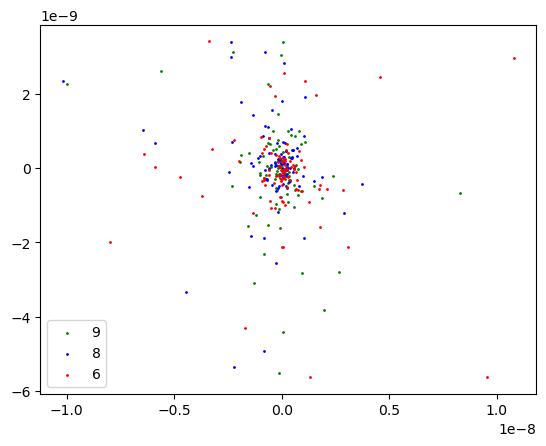

In [106]:

plt.scatter(mcp_xv9[:,0],mcp_xv9[:,2],s=1,color='green',label='9')
plt.scatter(mcp_xv8[:,0],mcp_xv8[:,2],s=1,color='blue',label='8')
plt.scatter(mcp_xv6[:,0],mcp_xv6[:,2],s=1,color='red',label='6')
plt.legend()